In [11]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import pandas as pd
import os

## Aru_implementation, only RMS numerator and no noise term as well can be verified for nicer code version


# Implementing for all

In [12]:
def read_light_curve(file_path):
    with fits.open(file_path) as hdul:
        data = hdul[1].data
        time = data['TIME']
        flux = data['RATE']
        flux_error = data['ERROR']  # Assuming the uncertainties are stored in a column named 'ERROR'
        ##Strictly for NICER format of timing
        hdr = hdul[1].header
        tstart = hdr['TSTART']
        mjdrefi = hdr['MJDREFI']
        mjdreff = hdr['MJDREFF']
        print("TSTART:", tstart)
    return time, flux, flux_error,tstart, mjdrefi+mjdreff

def compute_phases(time, period, epoch_mjd, tstart, mjdref):
    print("raw time value:", time[:10])
    absolute_time_mjd = mjdref + (tstart + time -4) / 86400.0 ##Subtracting to make phases same with efold
    delta_time_sec = (absolute_time_mjd - epoch_mjd) * 86400.0
    phases = (delta_time_sec % period) / period
    print("converted from reference epoch time: ",delta_time_sec[:10])
    return phases
   
def bin_data_by_phase(phases, flux, flux_error, num_bins):
    bin_edges = np.linspace(0, 1, num_bins + 1)
    bin_indices = np.digitize(phases, bin_edges) - 1
    phase_binned_flux = [flux[bin_indices == i] for i in range(num_bins)]
    phase_binned_flux_error = [flux_error[bin_indices == i] for i in range(num_bins)]
    return phase_binned_flux, phase_binned_flux_error

# def compute_phase_resolved_rms(phase_binned_flux, phase_binned_flux_error,total_N=0):
#     rms_values = []
#     rms_errors = []

#     for bin_flux, bin_flux_error in zip(phase_binned_flux, phase_binned_flux_error):
#         if len(bin_flux) > 0:
#             mean_flux = np.mean(bin_flux)
#             mean_flux_error = np.mean(bin_flux_error)
#             squared_flux_deviation = (bin_flux - mean_flux) ** 2
#             rms = np.sqrt(np.mean(squared_flux_deviation))
#             rms_error = np.sqrt(np.mean(bin_flux_error ** 2)) / np.sqrt(len(bin_flux))
#         else:
#             rms = 0
#             rms_error = 0

#         rms_values.append(rms)
#         rms_errors.append(rms_error)

#     return np.array(rms_values), np.array(rms_errors)


def modify_path(input_path):
    """
    Replaces the base directory of the given file path to match the required structure.
    """
    old_base = "/home/iist/aniket_data/hxmt_raw_data/decompressed_data"
    new_base = "/home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline"
    
    if input_path.startswith(old_base):
        relative_path = input_path[len(old_base):]  # Extract relative part
        return new_base.rstrip("/") + relative_path  # Ensure consistent formatting
    else:
        raise ValueError(f"Path does not start with expected base: {old_base}")

In [13]:
###########NEW WAY#################

def compute_phase_resolved_rms(phase_binned_flux, phase_binned_flux_error, total_N):
    rms_values = []
    rms_errors = []

    for bin_flux, bin_flux_error in zip(phase_binned_flux, phase_binned_flux_error):
        # if len(bin_flux) > 0:
        #     mean_flux = np.mean(bin_flux)
        #     squared_flux_deviation = (bin_flux - mean_flux) ** 2
        #     rms = np.sqrt(np.sum(squared_flux_deviation))
        #     squared_error_deviation = (bin_flux_error ** 2)
        #     rms_error = np.sqrt(np.sum(squared_error_deviation)) / np.sqrt(len(bin_flux))
           
        #     # Normalize RMS by sqrt(N), where N is total periods * 32
        #     rms /= np.sqrt(total_N)
        #     rms_error /= np.sqrt(total_N)
        # else:
        #     rms = 0
        #     rms_error = 0

        if len(bin_flux) > 0:
            n=len(bin_flux)
            mean_flux = np.mean(bin_flux)
            avg_error=np.mean(bin_flux_error)

            squared_flux_deviation = (bin_flux - mean_flux) ** 2 
            rms = np.sqrt((np.sum(squared_flux_deviation)- n*avg_error**2)/n)
            #rms = np.sqrt((np.sum(squared_flux_deviation))/n)
            # Normalize RMS by sqrt(n), where n is total data in individual phase bins

            squared_error_deviation = squared_flux_deviation*(bin_flux_error ** 2)
            if rms!=0:
                rms_error = np.sqrt(np.sum(squared_error_deviation)) / (len(bin_flux)*rms)
            else: 
                rms_error=-1.0 ##dummy placeholder value.   
        else:
            rms = 0.0
            rms_error = 0.0

        rms_values.append(rms)
        rms_errors.append(rms_error)

    return np.array(rms_values), np.array(rms_errors)


def main(input_file):
    # Load the text file data using pandas
    df = pd.read_csv(input_file, delimiter='\t',comment="#")
    df = df[df['Period'] != "-none-"]
    df['Period'] = df['Period'].astype(float)
    df['LC_File_Path'] = df['LC_File_Path'].astype(str)
    
    num_bins = 16  # Number of phase bins
    epoch_mjd = 60112.43540056619  # Reference epoch in MJD

    for index, row in df.iterrows():
        file_path = modify_path(row['LC_File_Path']) ##Updating path for wsl version from ubuntu version
        file_name = os.path.splitext(os.path.basename(file_path))[0]  # Remove .lc extension
        period = row['Period']
        try:
            time, flux, flux_error,tstart,mjdref = read_light_curve(file_path)
            if len(time) == 0 or len(flux) == 0:
                print(f"No data found in file: {file_path}. Skipping this file.")
                continue  # Skip to the next iteration if the data is empty

            total_duration = time.max() - time.min()
            num_periods = total_duration / period
            total_N = int(num_periods * num_bins)  # Total bins considering 64 bins per period

            print(f"Processing file: {file_path}")
            print(f"First event time: {time.min()}")
            print(f"Last event time: {time.max()}")
            print(f"Total duration: {time.max() - time.min()} seconds")


            mean_flux_over_observation = np.mean(flux)  # Compute mean flux over the entire observation
   
            phases = compute_phases(time, period, epoch_mjd, tstart, mjdref)
            phase_binned_flux, phase_binned_flux_error = bin_data_by_phase(phases, flux, flux_error, num_bins)
            rms_values, rms_errors = compute_phase_resolved_rms(phase_binned_flux, phase_binned_flux_error, total_N)
            mid_phase = (np.linspace(0, 1, num_bins + 1)[:-1] + np.linspace(0, 1, num_bins + 1)[1:]) / 2
        
            # Compute RMS / Mean Flux
            rms_over_mean_flux = rms_values / mean_flux_over_observation
            rms_error_over_mean_flux = rms_errors / mean_flux_over_observation
        
            # Compute Phase-Resolved Flux Values
            # Prepare data for plotting flux 2 cycles
            avg_flux = [np.mean(bin_flux) if len(bin_flux) > 0 else 0 for bin_flux in phase_binned_flux]
            avg_flux_2x = np.concatenate((avg_flux, avg_flux))
            avg_flux_error = [np.sqrt(np.sum(bin_flux_error**2)) / len(bin_flux_error) if len(bin_flux_error) > 0 else 0 for bin_flux_error in phase_binned_flux_error]
            avg_flux_error_2x = np.concatenate((avg_flux_error, avg_flux_error))


            # Prepare data for plotting rms 2 cycles
            mid_phase_2x = (np.linspace(0, 2, num_bins * 2 + 1)[:-1] + np.linspace(0, 2, num_bins * 2 + 1)[1:]) / 2
            rms_values_2x = np.concatenate((rms_values, rms_values))
            rms_errors_2x = np.concatenate((rms_errors, rms_errors))

            # Step 6: Plot the phase-resolved RMS
            plt.figure(figsize=(12, 5))
            plt.errorbar(mid_phase_2x, rms_values_2x/avg_flux_2x, yerr=rms_errors_2x/avg_flux_2x, fmt='-o',color='red')
            plt.xlabel('Phase')
            plt.ylabel('RMS')
            plt.title(f'Phase-resolved RMS for {file_name}')
            plt.minorticks_on()
            os.makedirs(f'./rms_deviation_code_maam_poisson_subtract/{file_name}/', exist_ok=True)
            plt.show()

            # Step 7: Save the results to a FITS file
            col1 = fits.Column(name='PHASE', format='E', array=mid_phase)
            col2 = fits.Column(name='RMS', format='E', array=rms_values)
            col3 = fits.Column(name='RMS_ERROR', format='E', array=rms_errors)
            col4 = fits.Column(name='RMS_OVER_MEAN_FLUX', format='E', array=rms_over_mean_flux)
            col5 = fits.Column(name='RMS_ERROR_OVER_MEAN_FLUX', format='E', array=rms_error_over_mean_flux)
            col6 = fits.Column(name='AVG_FLUX', format='E', array=avg_flux)
            col7 = fits.Column(name='AVG_FLUX_ERROR', format='E', array=avg_flux_error)
            hdu = fits.BinTableHDU.from_columns([col1, col2, col3, col4, col5, col6, col7])
            hdu.writeto(f'./rms_deviation_code_maam_poisson_subtract/{file_name}/{file_name}_rms_deviation_flux_errors.fits', overwrite=True)

            # Plot the phase-resolved flux
            plt.figure(figsize=(12, 5))
            plt.errorbar(mid_phase_2x, avg_flux_2x, yerr=avg_flux_error_2x, fmt='-o',color='blue')
            plt.xlabel('Phase')
            plt.ylabel('Flux')
            plt.minorticks_on()
            plt.title(f'Phase-resolved Flux for {file_name}')
            plt.savefig(f'./rms_deviation_code_maam_poisson_subtract/{file_name}/{file_name}_pulse_profile.png')
            plt.show()

            
        except Exception as e:
            print(f"An error occurred while processing {file_path}: {e}")

TSTART: 365108035.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900101_LE_lcnet_2-10keV_0.05s.lc
First event time: 365108035.025
Last event time: 365116434.97499996
Total duration: 8399.949999988079 seconds
raw time value: [3.65108035e+08 3.65108035e+08 3.65108035e+08 3.65108035e+08
 3.65108035e+08 3.65108035e+08 3.65108035e+08 3.65108035e+08
 3.65108035e+08 3.65108035e+08]
converted from reference epoch time:  [3.68594514e+08 3.68594514e+08 3.68594514e+08 3.68594514e+08
 3.68594514e+08 3.68594514e+08 3.68594514e+08 3.68594514e+08
 3.68594514e+08 3.68594514e+08]


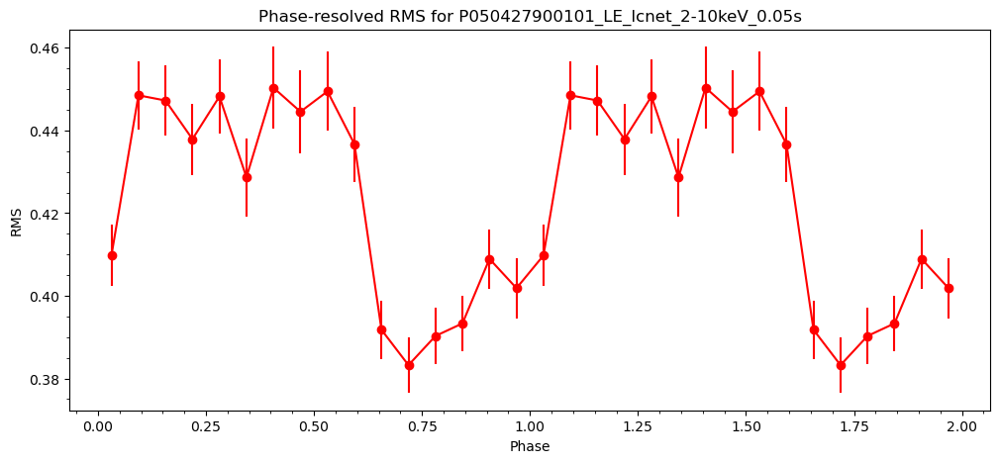

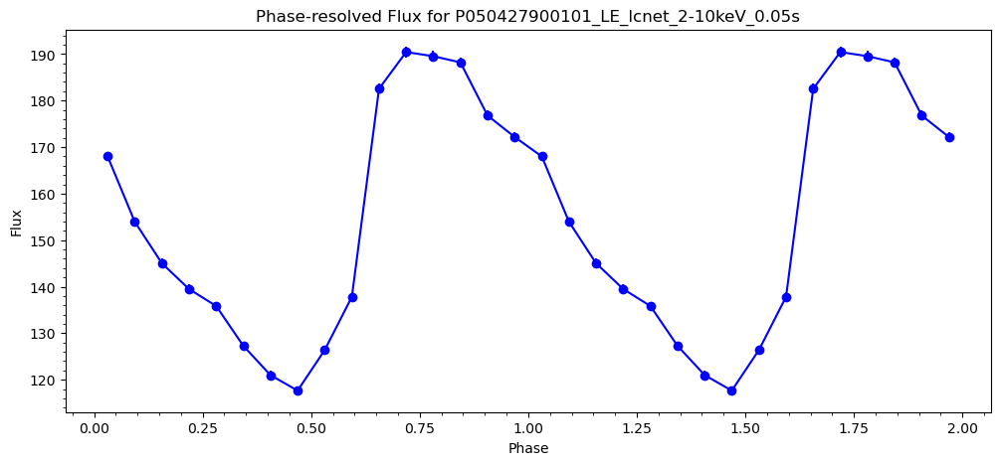

TSTART: 365119381.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900102_LE_lcnet_2-10keV_0.05s.lc
First event time: 365119381.025
Last event time: 365127600.97499996
Total duration: 8219.949999988079 seconds
raw time value: [3.65119381e+08 3.65119381e+08 3.65119381e+08 3.65119381e+08
 3.65119381e+08 3.65119381e+08 3.65119381e+08 3.65119381e+08
 3.65119381e+08 3.65119381e+08]
converted from reference epoch time:  [3.68617206e+08 3.68617206e+08 3.68617206e+08 3.68617206e+08
 3.68617206e+08 3.68617206e+08 3.68617206e+08 3.68617206e+08
 3.68617206e+08 3.68617206e+08]


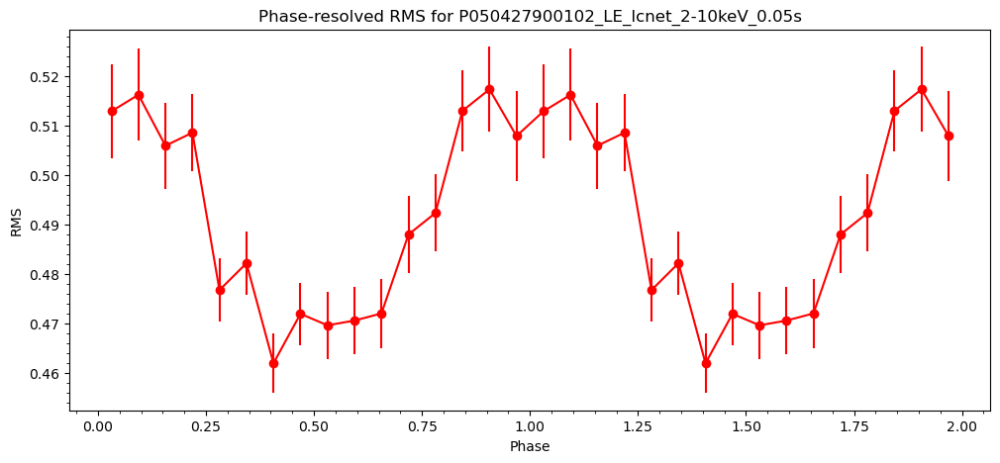

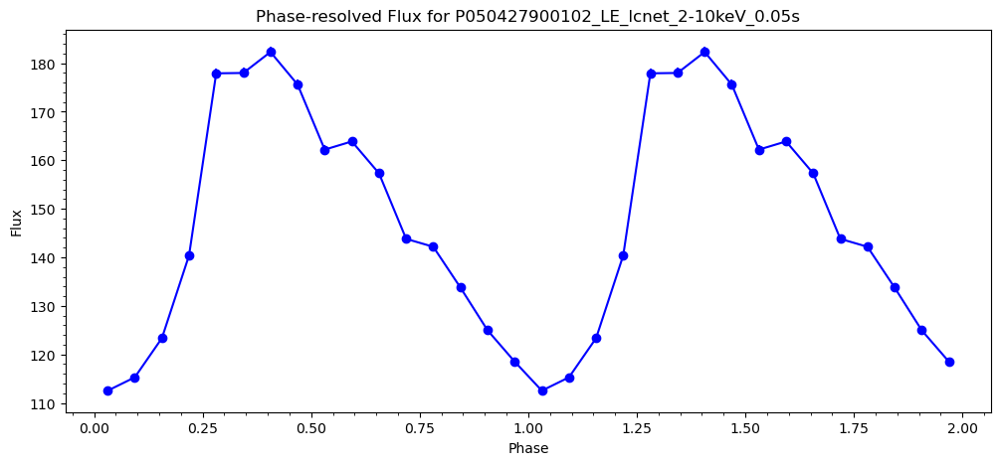

TSTART: 365131077.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900103_LE_lcnet_2-10keV_0.05s.lc
First event time: 365131077.025
Last event time: 365144936.97499996
Total duration: 13859.949999988079 seconds
raw time value: [3.65131077e+08 3.65131077e+08 3.65131077e+08 3.65131077e+08
 3.65131077e+08 3.65131077e+08 3.65131077e+08 3.65131077e+08
 3.65131077e+08 3.65131077e+08]
converted from reference epoch time:  [3.68640598e+08 3.68640598e+08 3.68640598e+08 3.68640598e+08
 3.68640598e+08 3.68640598e+08 3.68640598e+08 3.68640598e+08
 3.68640598e+08 3.68640598e+08]


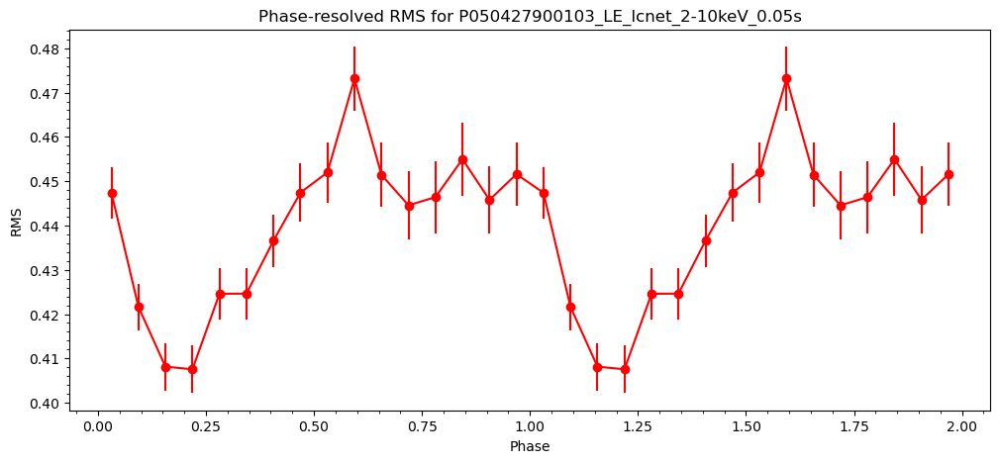

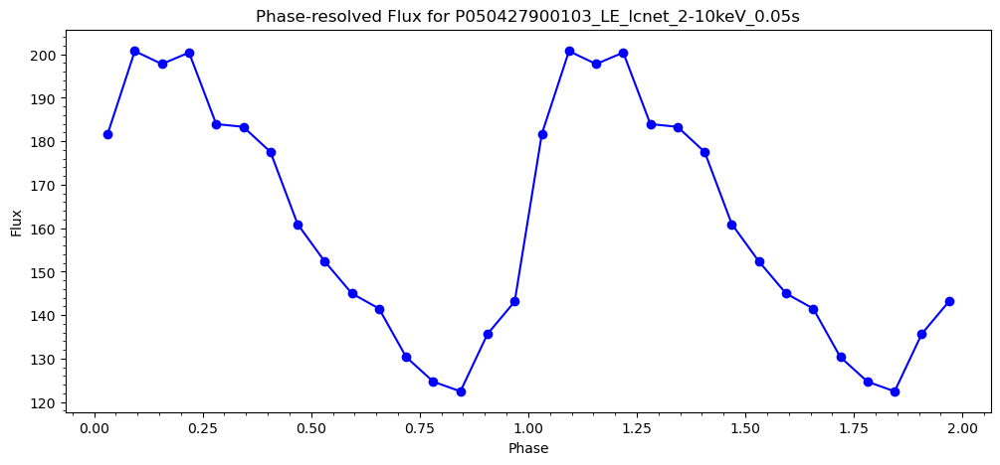

TSTART: 365147925.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900104_LE_lcnet_2-10keV_0.05s.lc
First event time: 365147925.025
Last event time: 365161904.97499996
Total duration: 13979.949999988079 seconds
raw time value: [3.65147925e+08 3.65147925e+08 3.65147925e+08 3.65147925e+08
 3.65147925e+08 3.65147925e+08 3.65147925e+08 3.65147925e+08
 3.65147925e+08 3.65147925e+08]
converted from reference epoch time:  [3.68674294e+08 3.68674294e+08 3.68674294e+08 3.68674294e+08
 3.68674294e+08 3.68674294e+08 3.68674294e+08 3.68674294e+08
 3.68674294e+08 3.68674294e+08]


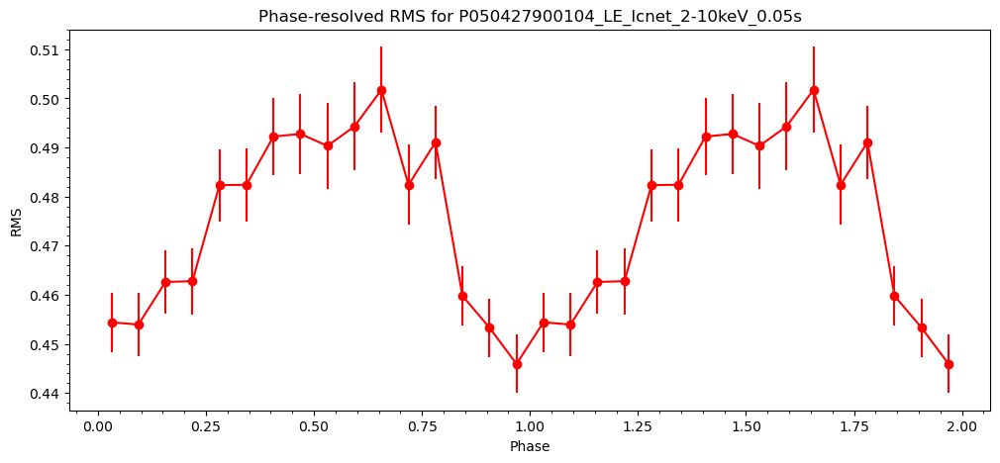

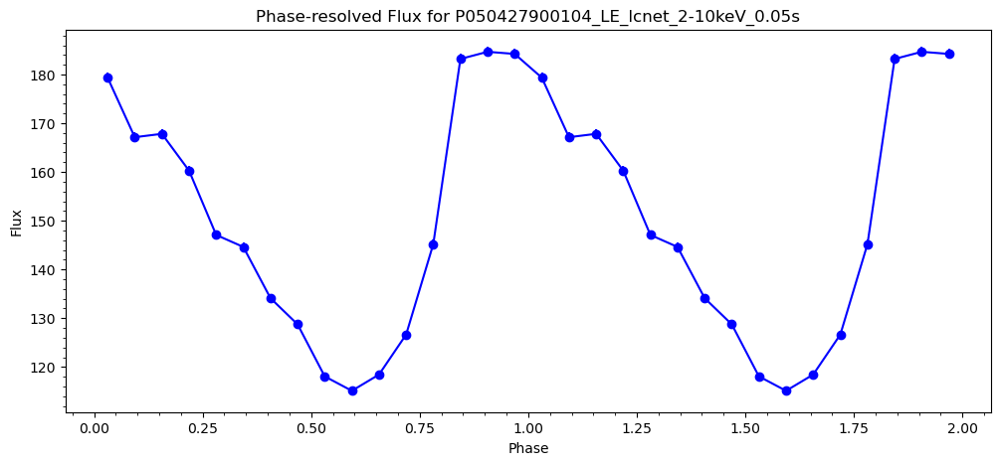

TSTART: 365245083.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600101_LE_lcnet_2-10keV_0.05s.lc
First event time: 365245083.025
Last event time: 365256902.97499996
Total duration: 11819.949999988079 seconds
raw time value: [3.65245083e+08 3.65245083e+08 3.65245083e+08 3.65245083e+08
 3.65245083e+08 3.65245083e+08 3.65245083e+08 3.65245083e+08
 3.65245083e+08 3.65245083e+08]
converted from reference epoch time:  [3.6886861e+08 3.6886861e+08 3.6886861e+08 3.6886861e+08 3.6886861e+08
 3.6886861e+08 3.6886861e+08 3.6886861e+08 3.6886861e+08 3.6886861e+08]


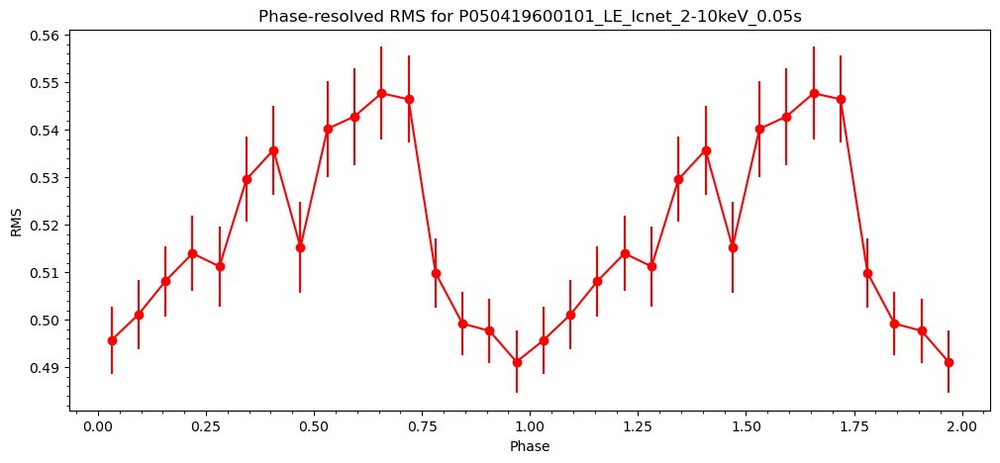

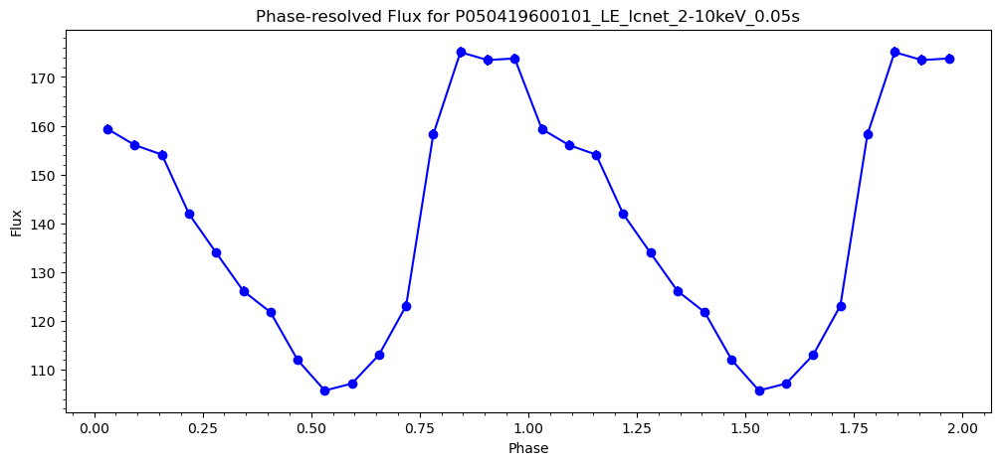

TSTART: 365262097.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600102_LE_lcnet_2-10keV_0.05s.lc
First event time: 365262097.025
Last event time: 365270316.97499996
Total duration: 8219.949999988079 seconds
raw time value: [3.65262097e+08 3.65262097e+08 3.65262097e+08 3.65262097e+08
 3.65262097e+08 3.65262097e+08 3.65262097e+08 3.65262097e+08
 3.65262097e+08 3.65262097e+08]
converted from reference epoch time:  [3.68902638e+08 3.68902638e+08 3.68902638e+08 3.68902638e+08
 3.68902638e+08 3.68902638e+08 3.68902638e+08 3.68902638e+08
 3.68902638e+08 3.68902638e+08]


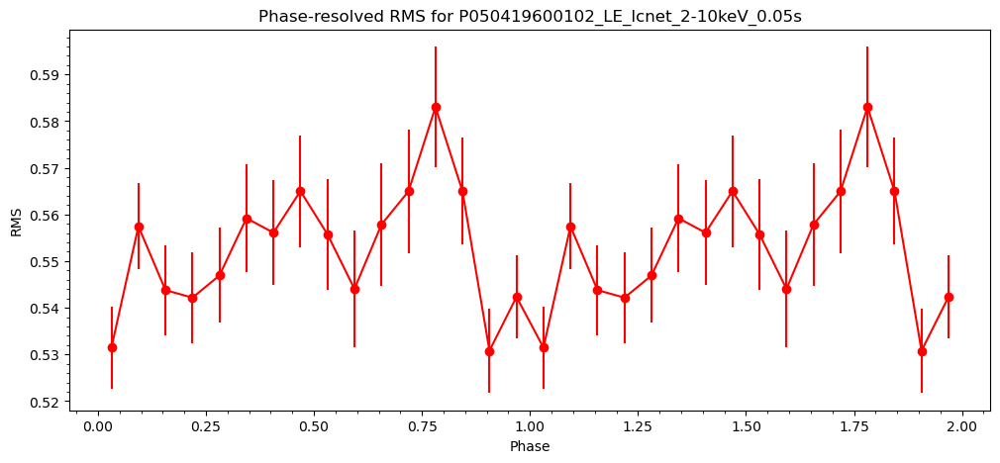

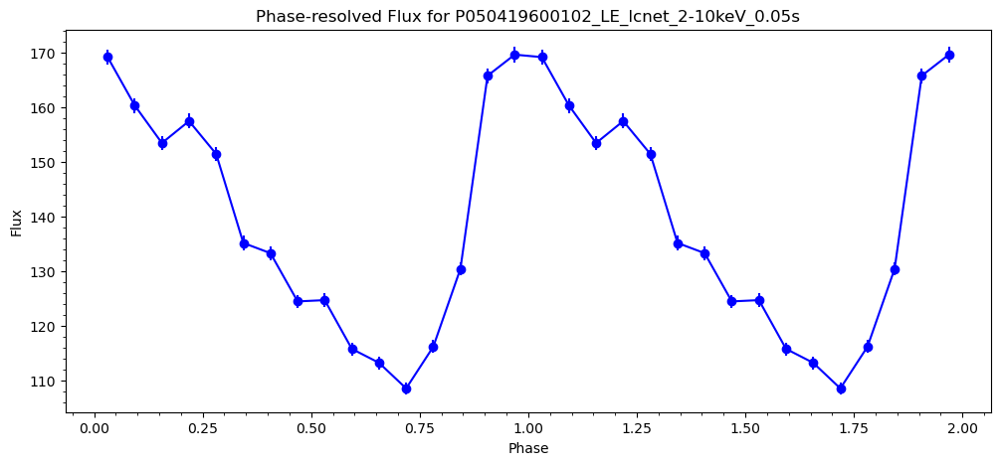

TSTART: 365353402.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600201_LE_lcnet_2-10keV_0.05s.lc
First event time: 365353402.025
Last event time: 365361954.97499996
Total duration: 8552.949999988079 seconds
raw time value: [3.65353402e+08 3.65353402e+08 3.65353402e+08 3.65353402e+08
 3.65353402e+08 3.65353402e+08 3.65353402e+08 3.65353402e+08
 3.65353402e+08 3.65353402e+08]
converted from reference epoch time:  [3.69085248e+08 3.69085248e+08 3.69085248e+08 3.69085248e+08
 3.69085248e+08 3.69085248e+08 3.69085248e+08 3.69085248e+08
 3.69085248e+08 3.69085248e+08]


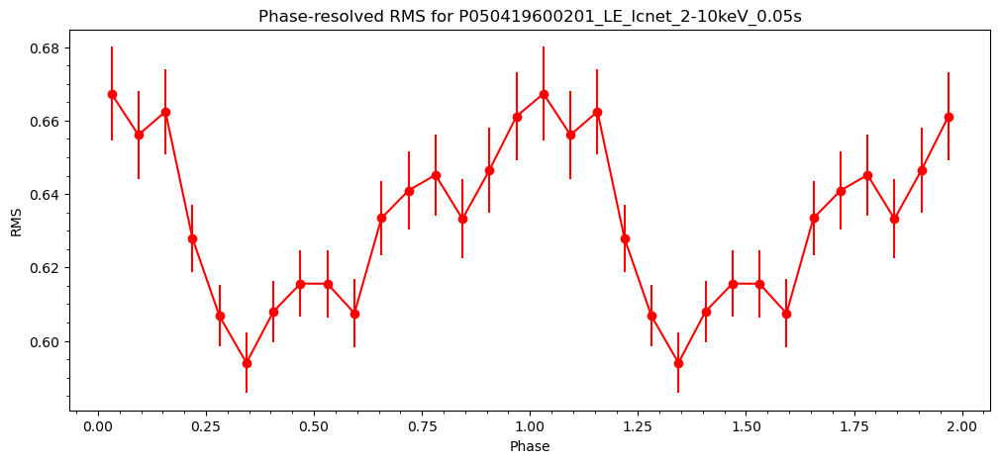

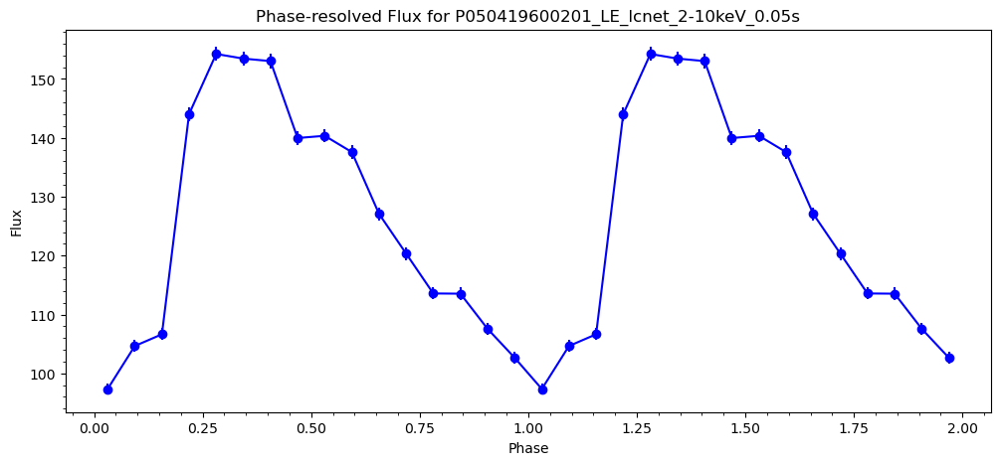

TSTART: 365364849.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600202_LE_lcnet_2-10keV_0.05s.lc
First event time: 365364849.025
Last event time: 365379008.97499996
Total duration: 14159.949999988079 seconds
raw time value: [3.65364849e+08 3.65364849e+08 3.65364849e+08 3.65364849e+08
 3.65364849e+08 3.65364849e+08 3.65364849e+08 3.65364849e+08
 3.65364849e+08 3.65364849e+08]
converted from reference epoch time:  [3.69108142e+08 3.69108142e+08 3.69108142e+08 3.69108142e+08
 3.69108142e+08 3.69108142e+08 3.69108142e+08 3.69108142e+08
 3.69108142e+08 3.69108142e+08]


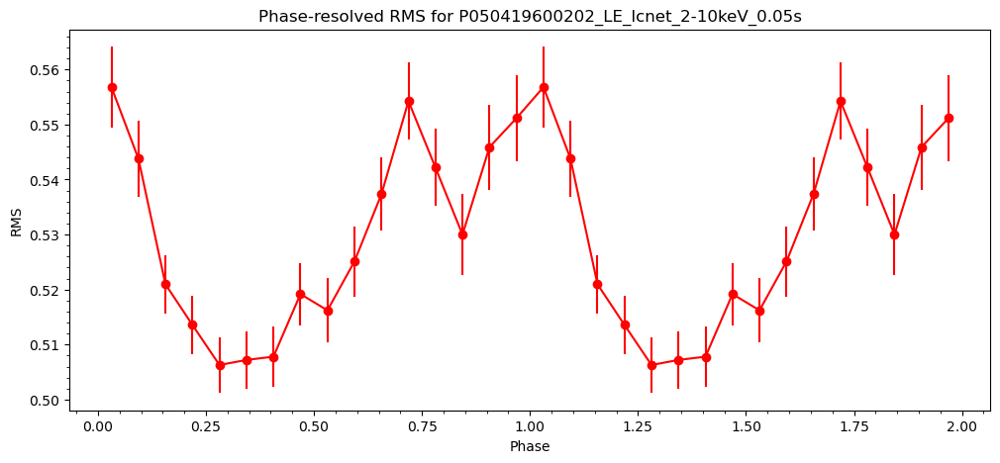

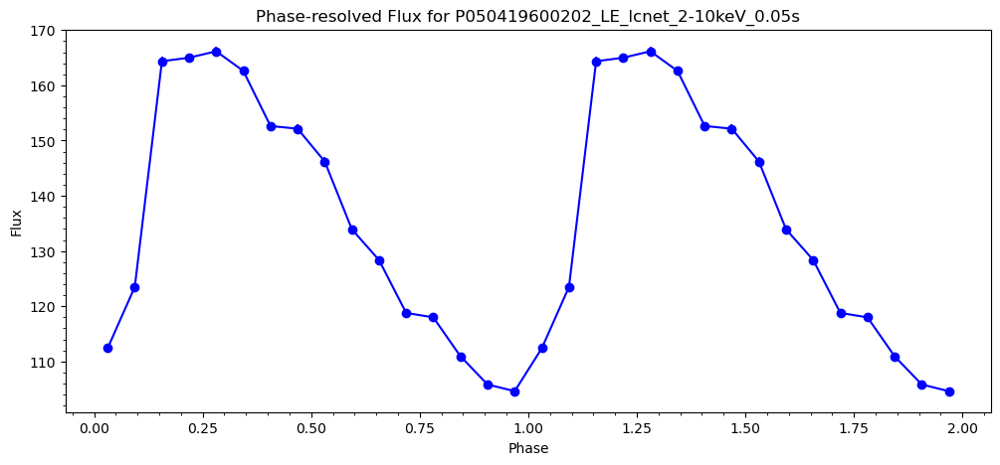

TSTART: 365418203.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600301_LE_lcnet_2-10keV_0.05s.lc
First event time: 365418203.025
Last event time: 365428162.97499996
Total duration: 9959.949999988079 seconds
raw time value: [3.65418203e+08 3.65418203e+08 3.65418203e+08 3.65418203e+08
 3.65418203e+08 3.65418203e+08 3.65418203e+08 3.65418203e+08
 3.65418203e+08 3.65418203e+08]
converted from reference epoch time:  [3.6921485e+08 3.6921485e+08 3.6921485e+08 3.6921485e+08 3.6921485e+08
 3.6921485e+08 3.6921485e+08 3.6921485e+08 3.6921485e+08 3.6921485e+08]


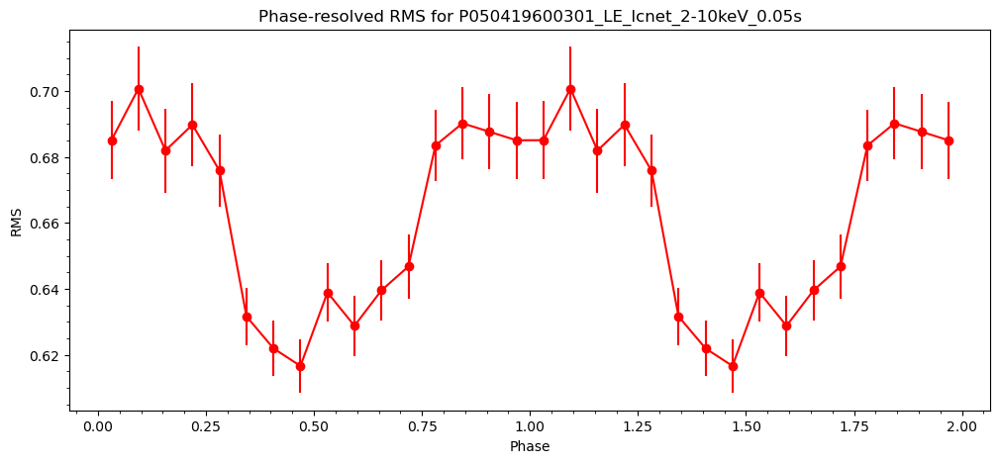

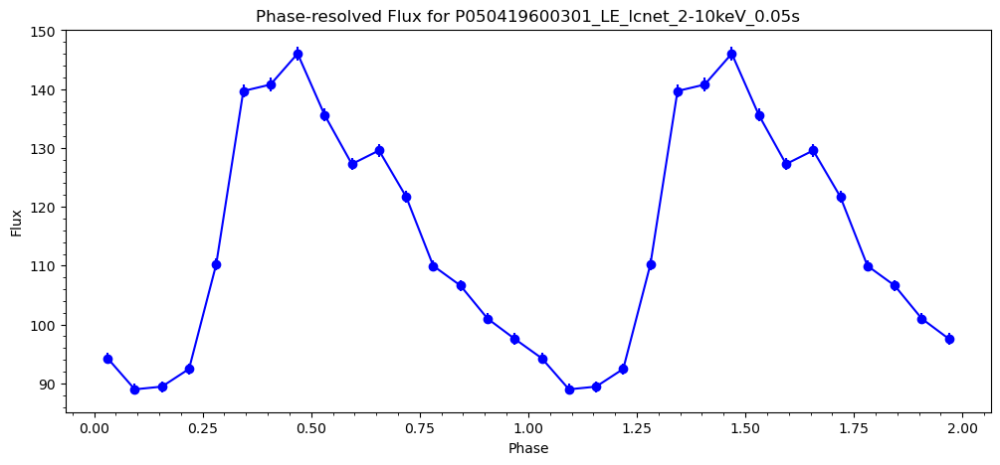

TSTART: 365433349.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600302_LE_lcnet_2-10keV_0.05s.lc
First event time: 365433349.025
Last event time: 365441568.97499996
Total duration: 8219.949999988079 seconds
raw time value: [3.65433349e+08 3.65433349e+08 3.65433349e+08 3.65433349e+08
 3.65433349e+08 3.65433349e+08 3.65433349e+08 3.65433349e+08
 3.65433349e+08 3.65433349e+08]
converted from reference epoch time:  [3.69245142e+08 3.69245142e+08 3.69245142e+08 3.69245142e+08
 3.69245142e+08 3.69245142e+08 3.69245142e+08 3.69245142e+08
 3.69245142e+08 3.69245142e+08]


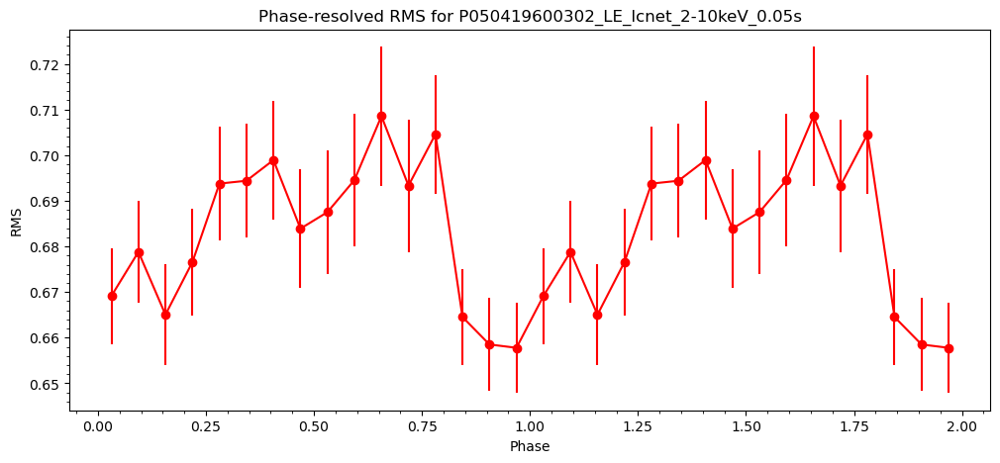

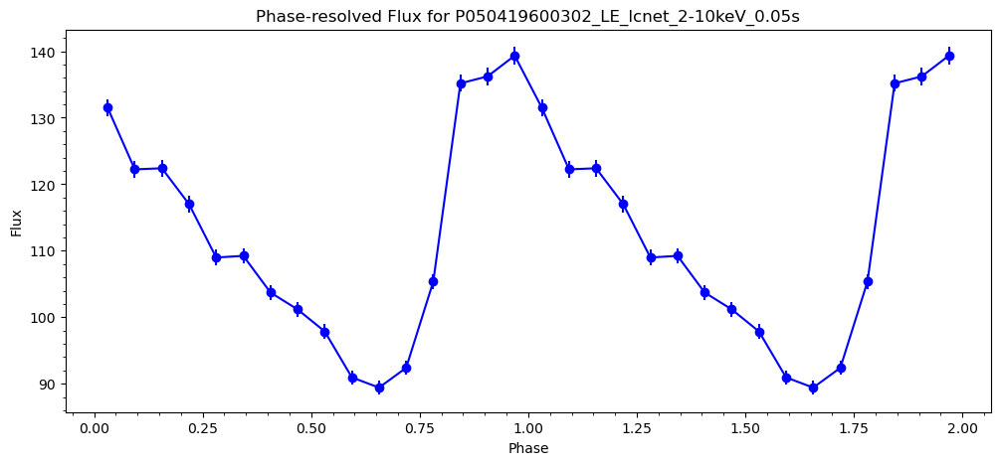

TSTART: 365444787.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600303_LE_lcnet_2-10keV_0.05s.lc
First event time: 365444787.025
Last event time: 365453246.97499996
Total duration: 8459.949999988079 seconds
raw time value: [3.65444787e+08 3.65444787e+08 3.65444787e+08 3.65444787e+08
 3.65444787e+08 3.65444787e+08 3.65444787e+08 3.65444787e+08
 3.65444787e+08 3.65444787e+08]
converted from reference epoch time:  [3.69268018e+08 3.69268018e+08 3.69268018e+08 3.69268018e+08
 3.69268018e+08 3.69268018e+08 3.69268018e+08 3.69268018e+08
 3.69268018e+08 3.69268018e+08]


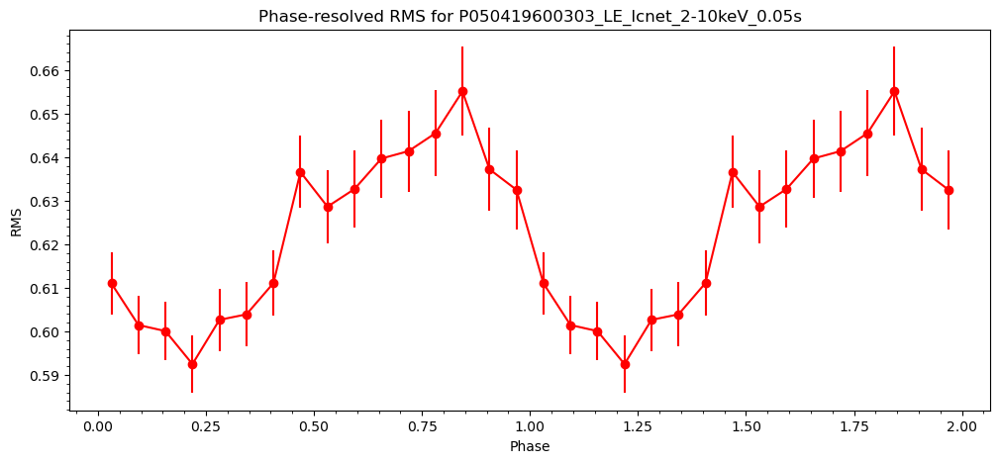

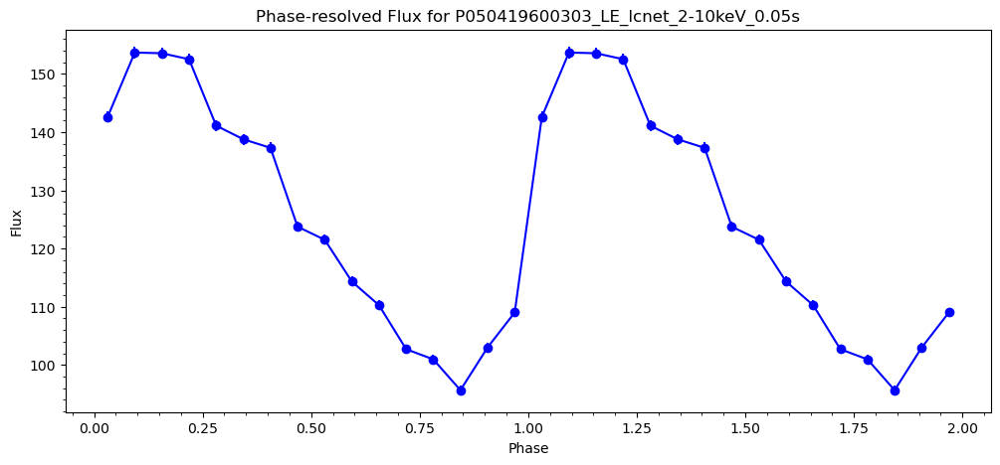

TSTART: 365518976.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600401_LE_lcnet_2-10keV_0.05s.lc
First event time: 365518976.025
Last event time: 365527250.97499996
Total duration: 8274.949999988079 seconds
raw time value: [3.65518976e+08 3.65518976e+08 3.65518976e+08 3.65518976e+08
 3.65518976e+08 3.65518976e+08 3.65518976e+08 3.65518976e+08
 3.65518976e+08 3.65518976e+08]
converted from reference epoch time:  [3.69416396e+08 3.69416396e+08 3.69416396e+08 3.69416396e+08
 3.69416396e+08 3.69416396e+08 3.69416396e+08 3.69416396e+08
 3.69416396e+08 3.69416396e+08]


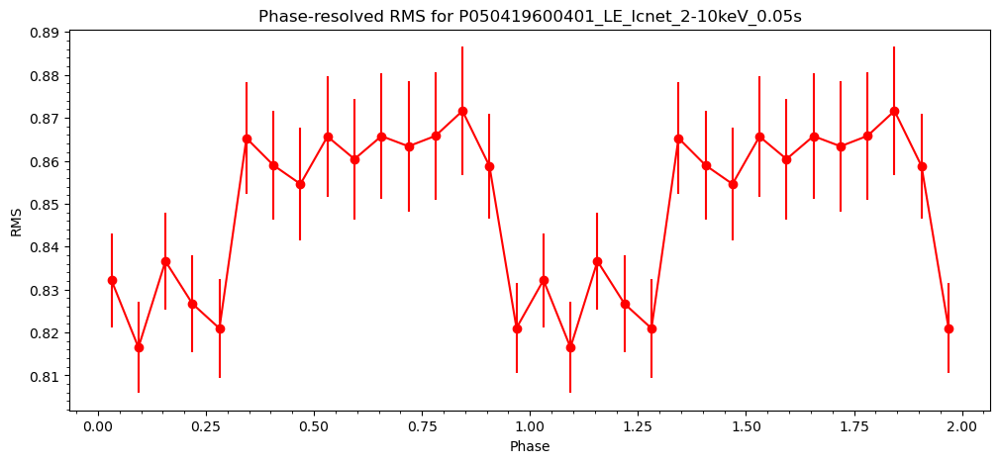

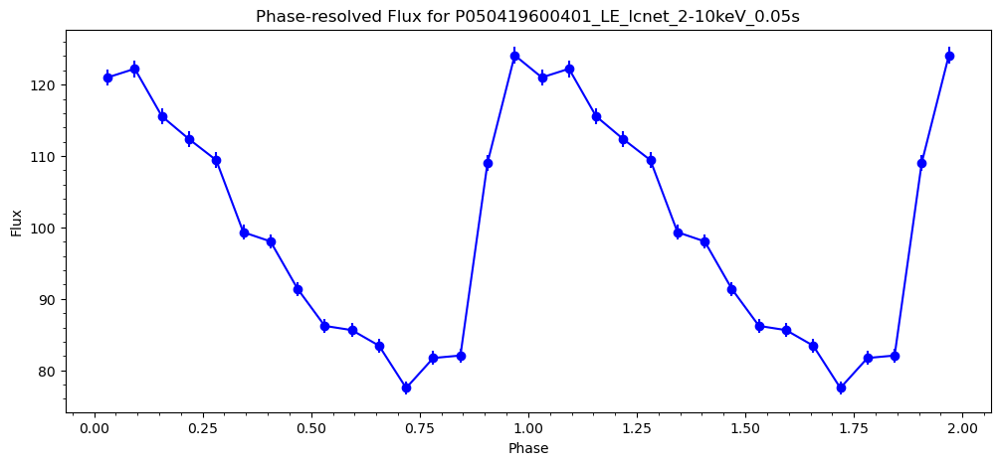

TSTART: 365530437.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600402_LE_lcnet_2-10keV_0.05s.lc
First event time: 365530437.025
Last event time: 365538896.97499996
Total duration: 8459.949999988079 seconds
raw time value: [3.65530437e+08 3.65530437e+08 3.65530437e+08 3.65530437e+08
 3.65530437e+08 3.65530437e+08 3.65530437e+08 3.65530437e+08
 3.65530437e+08 3.65530437e+08]
converted from reference epoch time:  [3.69439318e+08 3.69439318e+08 3.69439318e+08 3.69439318e+08
 3.69439318e+08 3.69439318e+08 3.69439318e+08 3.69439318e+08
 3.69439318e+08 3.69439318e+08]


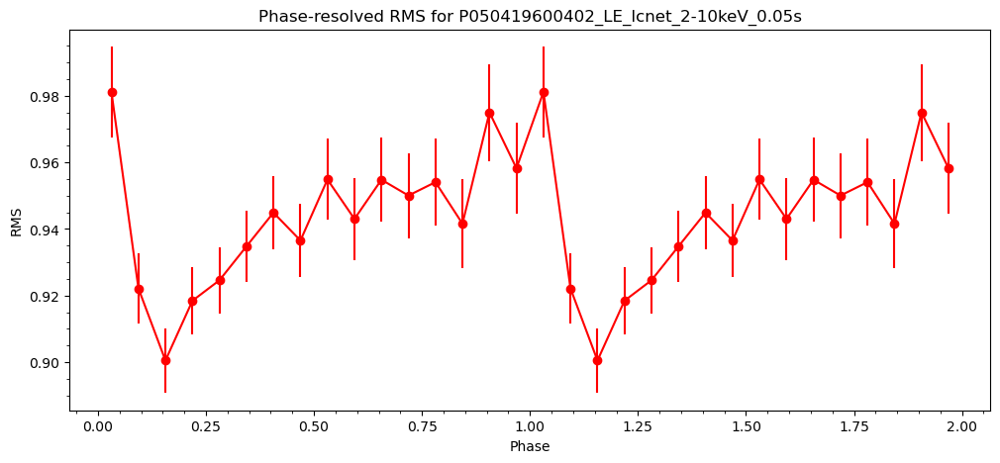

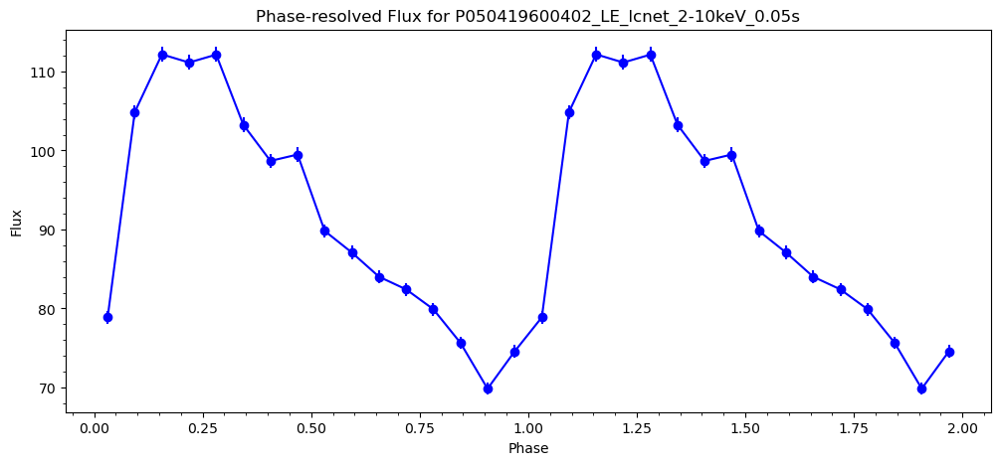

TSTART: 365610498.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600501_LE_lcnet_2-10keV_0.05s.lc
First event time: 365610498.025
Last event time: 365618450.97499996
Total duration: 7952.949999988079 seconds
raw time value: [3.65610498e+08 3.65610498e+08 3.65610498e+08 3.65610498e+08
 3.65610498e+08 3.65610498e+08 3.65610498e+08 3.65610498e+08
 3.65610498e+08 3.65610498e+08]
converted from reference epoch time:  [3.6959944e+08 3.6959944e+08 3.6959944e+08 3.6959944e+08 3.6959944e+08
 3.6959944e+08 3.6959944e+08 3.6959944e+08 3.6959944e+08 3.6959944e+08]


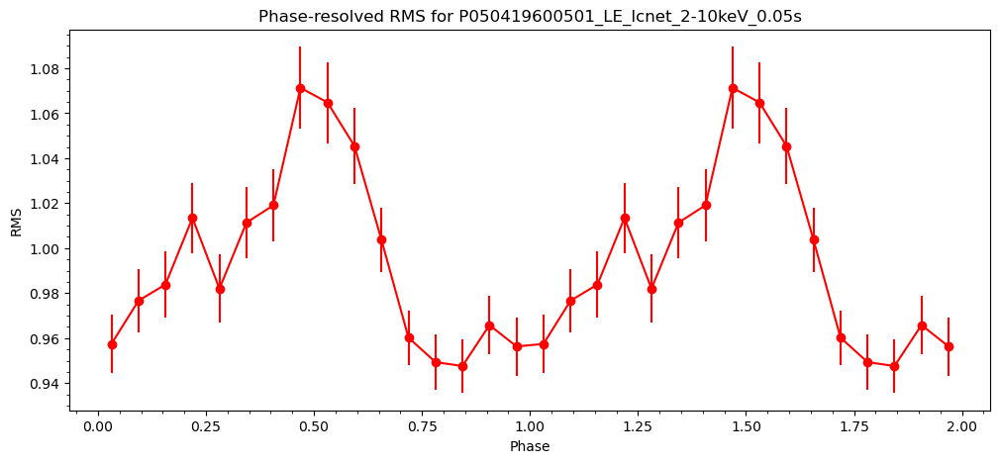

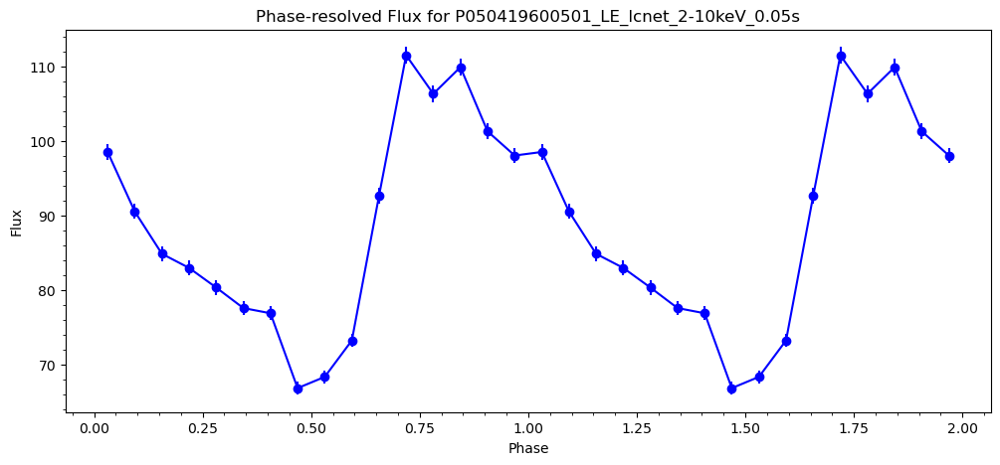

TSTART: 365621929.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600502_LE_lcnet_2-10keV_0.05s.lc
First event time: 365621929.025
Last event time: 365630208.97499996
Total duration: 8279.949999988079 seconds
raw time value: [3.65621929e+08 3.65621929e+08 3.65621929e+08 3.65621929e+08
 3.65621929e+08 3.65621929e+08 3.65621929e+08 3.65621929e+08
 3.65621929e+08 3.65621929e+08]
converted from reference epoch time:  [3.69622302e+08 3.69622302e+08 3.69622302e+08 3.69622302e+08
 3.69622302e+08 3.69622302e+08 3.69622302e+08 3.69622302e+08
 3.69622302e+08 3.69622302e+08]


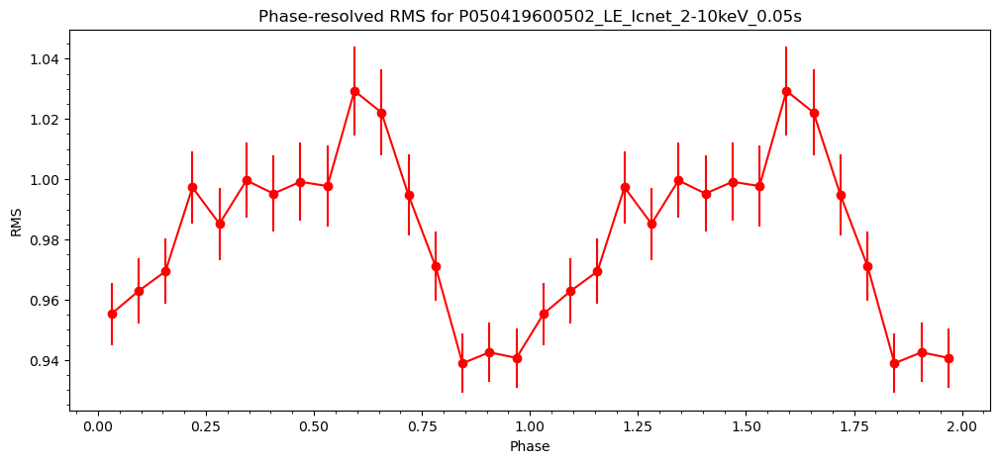

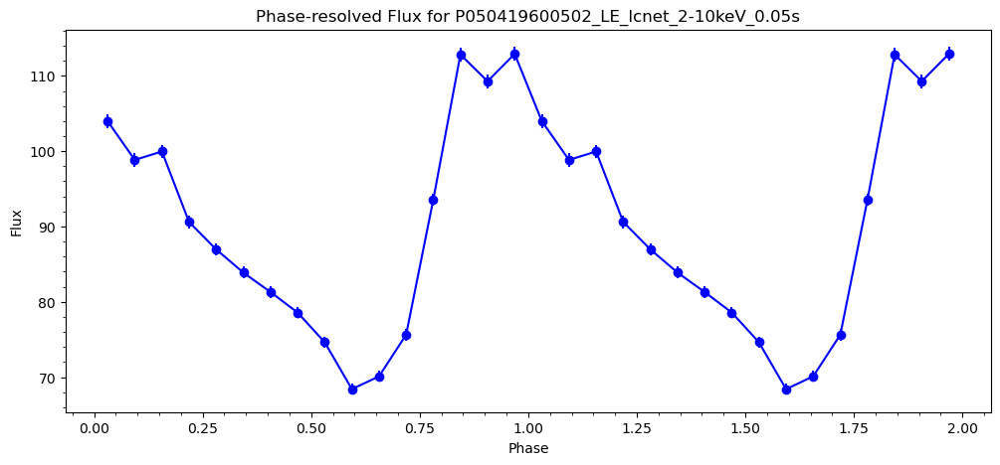

TSTART: 365709147.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600601_LE_lcnet_2-10keV_0.05s.lc
First event time: 365709147.025
Last event time: 365721146.97499996
Total duration: 11999.949999988079 seconds
raw time value: [3.65709147e+08 3.65709147e+08 3.65709147e+08 3.65709147e+08
 3.65709147e+08 3.65709147e+08 3.65709147e+08 3.65709147e+08
 3.65709147e+08 3.65709147e+08]
converted from reference epoch time:  [3.69796738e+08 3.69796738e+08 3.69796738e+08 3.69796738e+08
 3.69796738e+08 3.69796738e+08 3.69796738e+08 3.69796738e+08
 3.69796738e+08 3.69796738e+08]


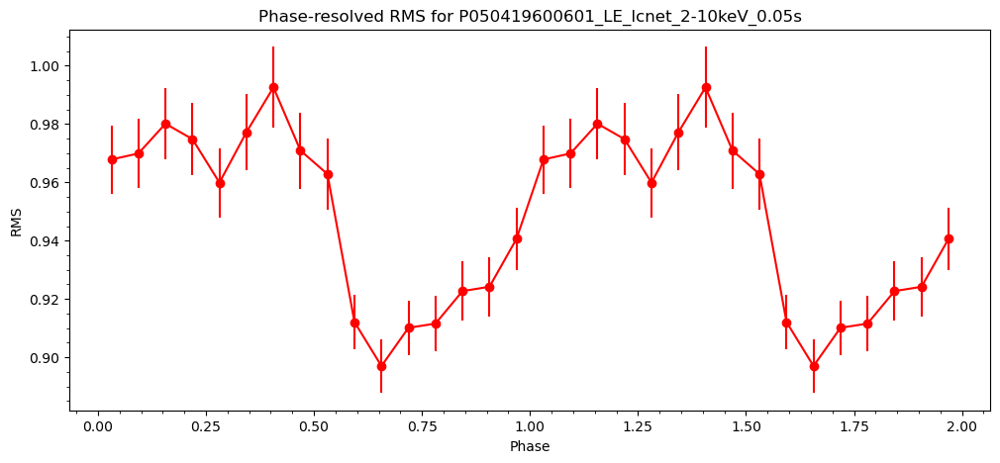

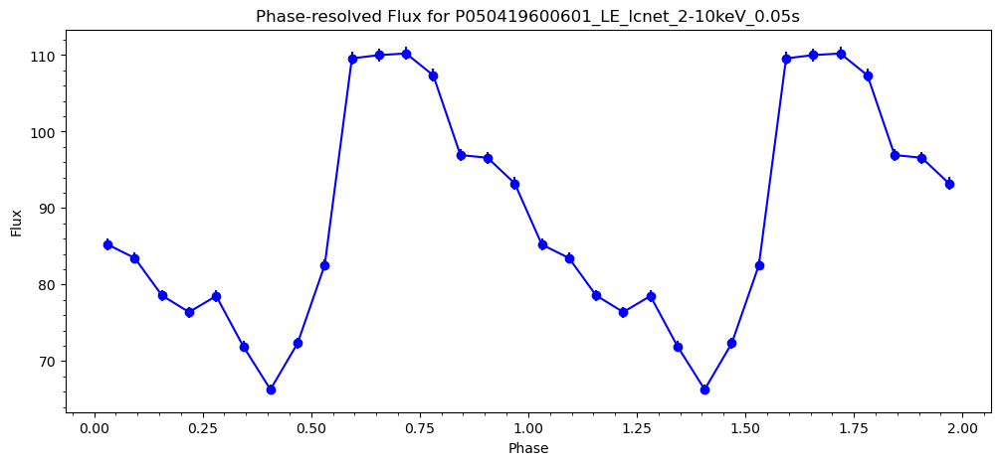

TSTART: 365724783.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600602_LE_lcnet_2-10keV_0.05s.lc
First event time: 365724783.025
Last event time: 365732462.97499996
Total duration: 7679.949999988079 seconds
raw time value: [3.65724783e+08 3.65724783e+08 3.65724783e+08 3.65724783e+08
 3.65724783e+08 3.65724783e+08 3.65724783e+08 3.65724783e+08
 3.65724783e+08 3.65724783e+08]
converted from reference epoch time:  [3.6982801e+08 3.6982801e+08 3.6982801e+08 3.6982801e+08 3.6982801e+08
 3.6982801e+08 3.6982801e+08 3.6982801e+08 3.6982801e+08 3.6982801e+08]


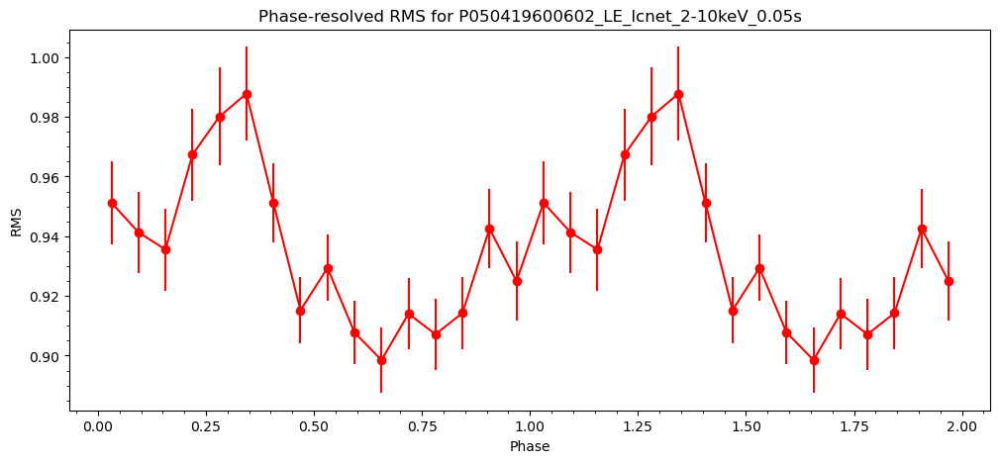

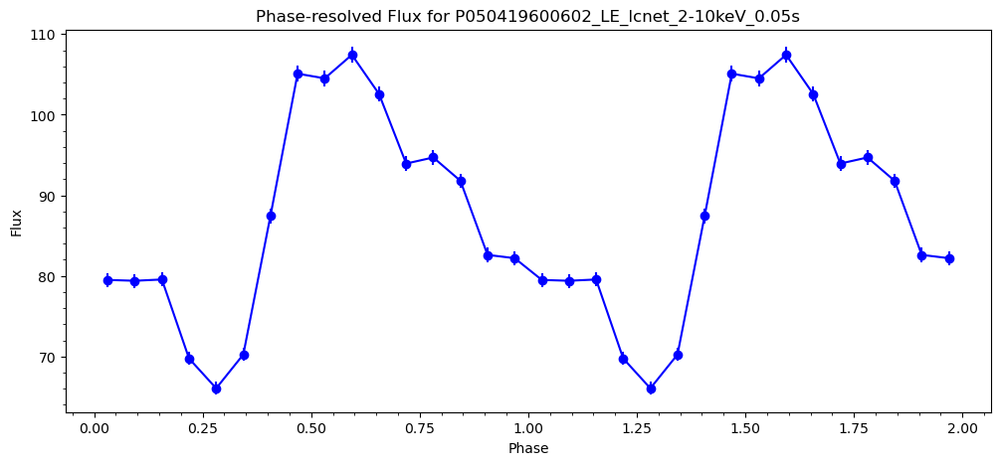

TSTART: 365811599.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600701_LE_lcnet_2-10keV_0.05s.lc
First event time: 365811599.025
Last event time: 365823658.97499996
Total duration: 12059.949999988079 seconds
raw time value: [3.65811599e+08 3.65811599e+08 3.65811599e+08 3.65811599e+08
 3.65811599e+08 3.65811599e+08 3.65811599e+08 3.65811599e+08
 3.65811599e+08 3.65811599e+08]
converted from reference epoch time:  [3.70001642e+08 3.70001642e+08 3.70001642e+08 3.70001642e+08
 3.70001642e+08 3.70001642e+08 3.70001642e+08 3.70001642e+08
 3.70001642e+08 3.70001642e+08]


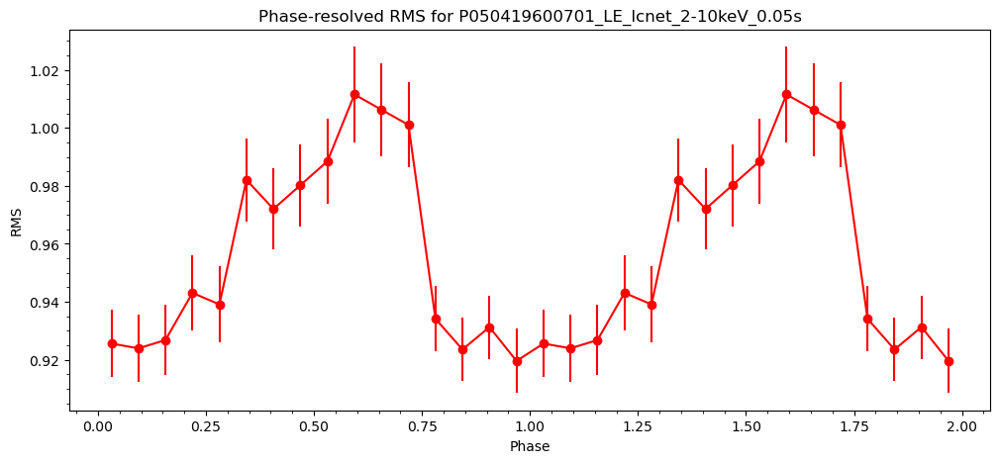

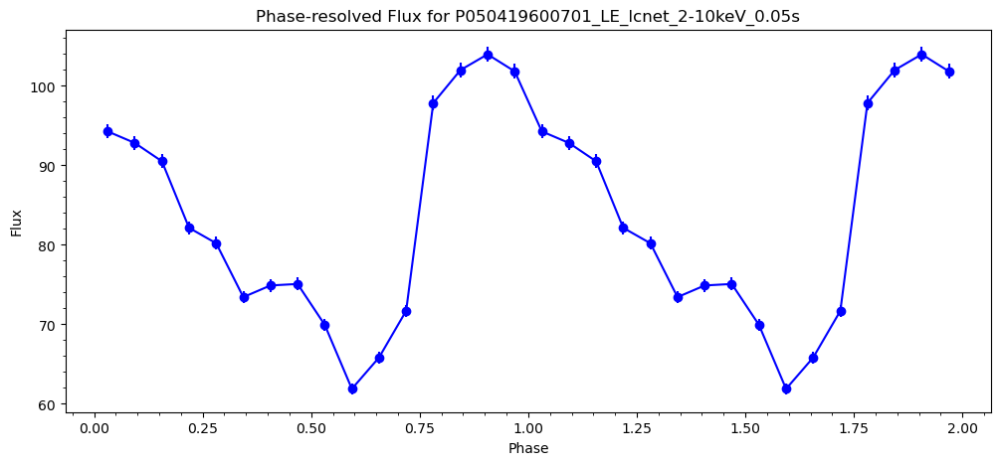

TSTART: 365828795.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600702_LE_lcnet_2-10keV_0.05s.lc
First event time: 365828795.025
Last event time: 365834974.97499996
Total duration: 6179.949999988079 seconds
raw time value: [3.65828795e+08 3.65828795e+08 3.65828795e+08 3.65828795e+08
 3.65828795e+08 3.65828795e+08 3.65828795e+08 3.65828795e+08
 3.65828795e+08 3.65828795e+08]
converted from reference epoch time:  [3.70036034e+08 3.70036034e+08 3.70036034e+08 3.70036034e+08
 3.70036034e+08 3.70036034e+08 3.70036034e+08 3.70036034e+08
 3.70036034e+08 3.70036034e+08]


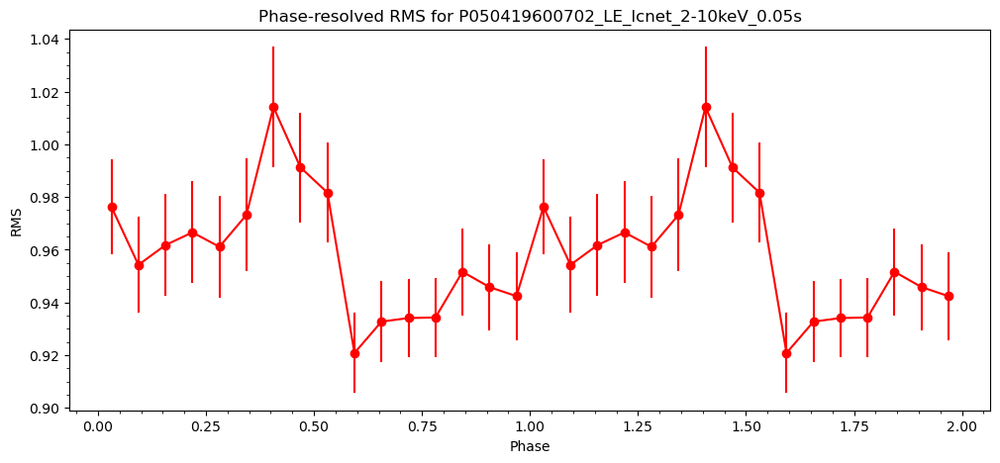

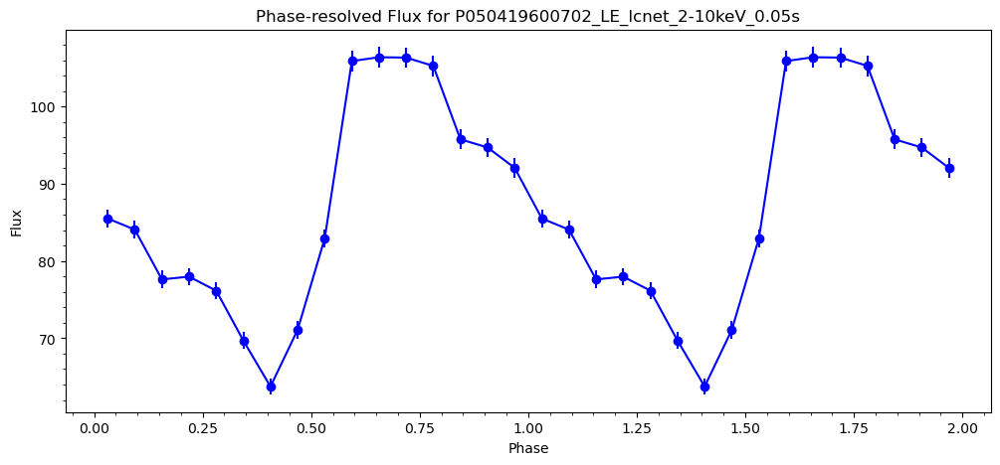

TSTART: 365880669.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196008/pipeline_output/P050419600801_LE_lcnet_2-10keV_0.05s.lc
First event time: 365880669.025
Last event time: 365892248.97499996
Total duration: 11579.949999988079 seconds
raw time value: [3.65880669e+08 3.65880669e+08 3.65880669e+08 3.65880669e+08
 3.65880669e+08 3.65880669e+08 3.65880669e+08 3.65880669e+08
 3.65880669e+08 3.65880669e+08]
converted from reference epoch time:  [3.70139782e+08 3.70139782e+08 3.70139782e+08 3.70139782e+08
 3.70139782e+08 3.70139782e+08 3.70139782e+08 3.70139782e+08
 3.70139782e+08 3.70139782e+08]


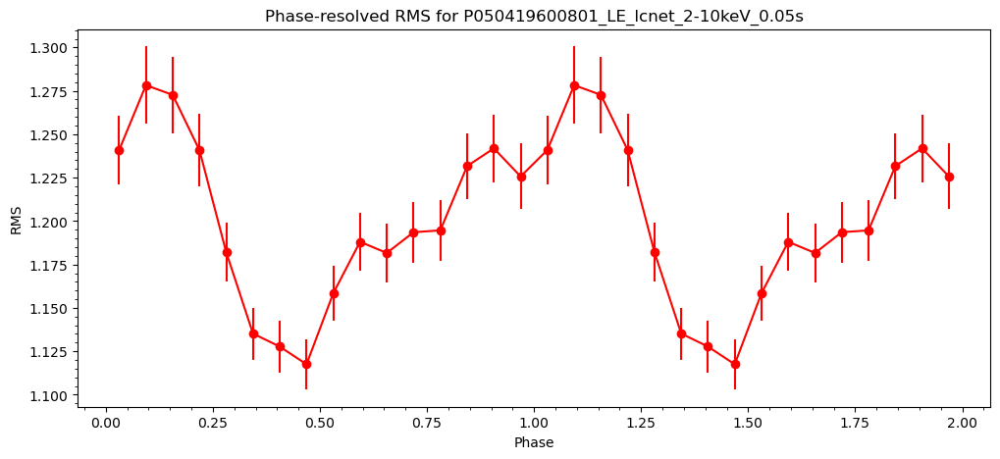

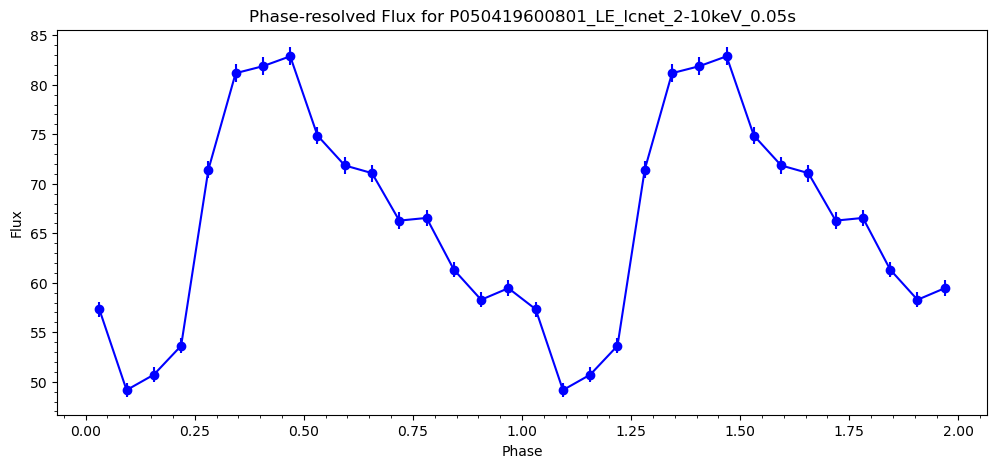

TSTART: 365896013.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196008/pipeline_output/P050419600802_LE_lcnet_2-10keV_0.05s.lc
First event time: 365896013.025
Last event time: 365903632.97499996
Total duration: 7619.949999988079 seconds
raw time value: [3.65896013e+08 3.65896013e+08 3.65896013e+08 3.65896013e+08
 3.65896013e+08 3.65896013e+08 3.65896013e+08 3.65896013e+08
 3.65896013e+08 3.65896013e+08]
converted from reference epoch time:  [3.7017047e+08 3.7017047e+08 3.7017047e+08 3.7017047e+08 3.7017047e+08
 3.7017047e+08 3.7017047e+08 3.7017047e+08 3.7017047e+08 3.7017047e+08]


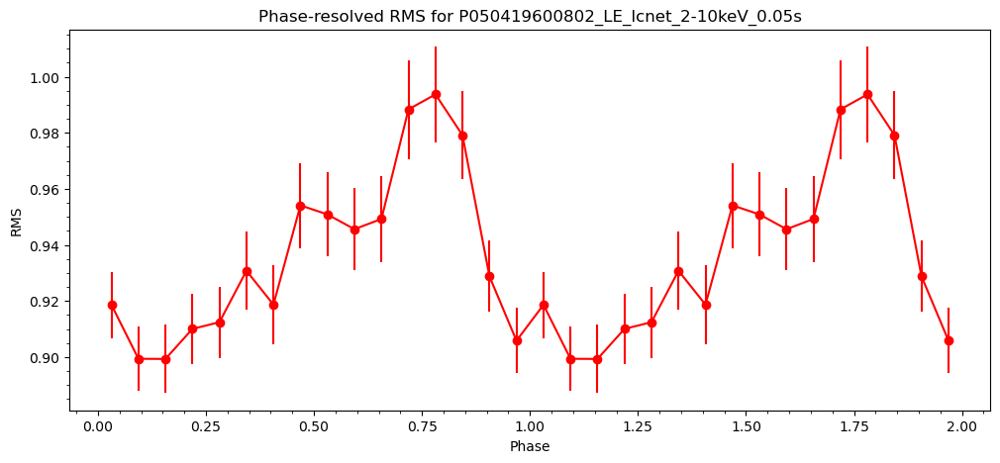

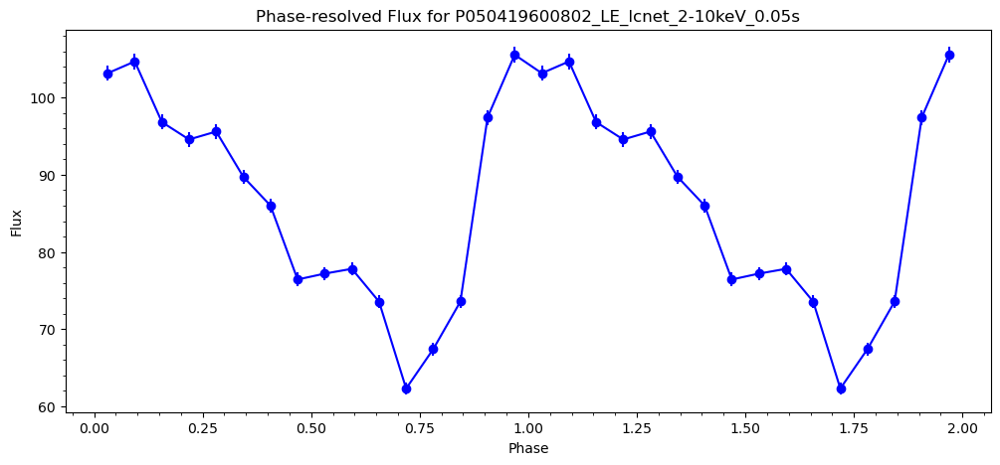

TSTART: 365983237.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600901_LE_lcnet_2-10keV_0.05s.lc
First event time: 365983237.025
Last event time: 365994936.97499996
Total duration: 11699.949999988079 seconds
raw time value: [3.65983237e+08 3.65983237e+08 3.65983237e+08 3.65983237e+08
 3.65983237e+08 3.65983237e+08 3.65983237e+08 3.65983237e+08
 3.65983237e+08 3.65983237e+08]
converted from reference epoch time:  [3.70344918e+08 3.70344918e+08 3.70344918e+08 3.70344918e+08
 3.70344918e+08 3.70344918e+08 3.70344918e+08 3.70344918e+08
 3.70344918e+08 3.70344918e+08]


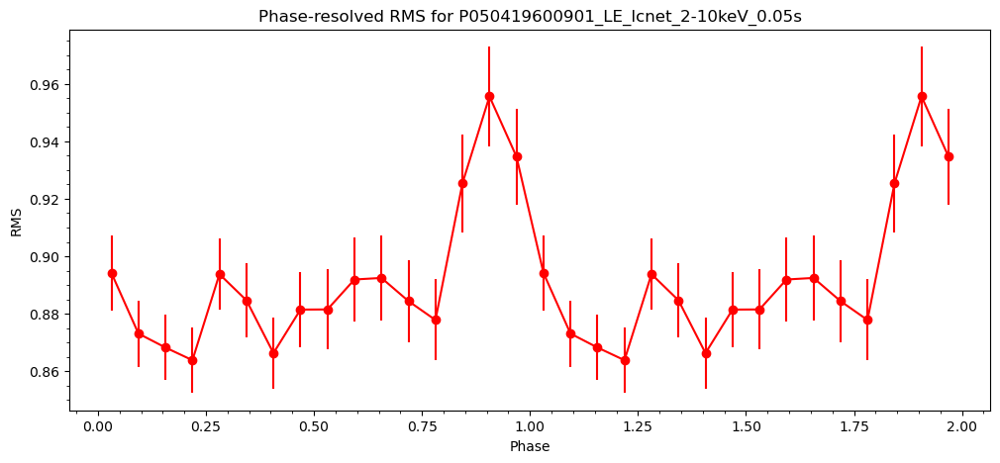

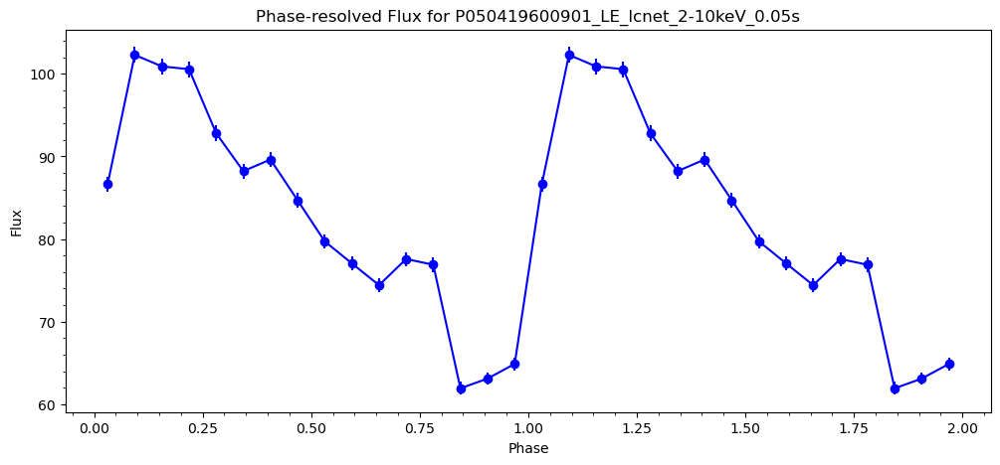

TSTART: 365999987.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600902_LE_lcnet_2-10keV_0.05s.lc
First event time: 365999987.025
Last event time: 366006226.97499996
Total duration: 6239.949999988079 seconds
raw time value: [3.65999987e+08 3.65999987e+08 3.65999987e+08 3.65999987e+08
 3.65999987e+08 3.65999987e+08 3.65999987e+08 3.65999987e+08
 3.65999987e+08 3.65999987e+08]
converted from reference epoch time:  [3.70378418e+08 3.70378418e+08 3.70378418e+08 3.70378418e+08
 3.70378418e+08 3.70378418e+08 3.70378418e+08 3.70378418e+08
 3.70378418e+08 3.70378418e+08]


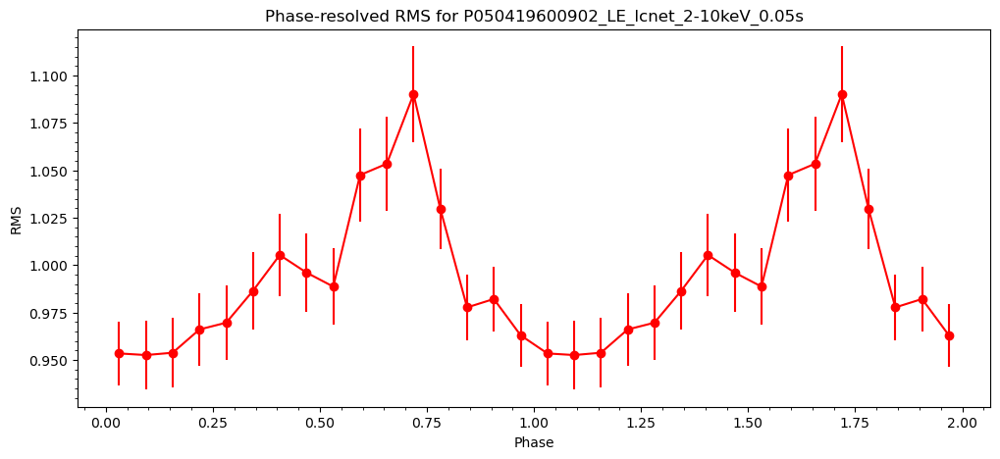

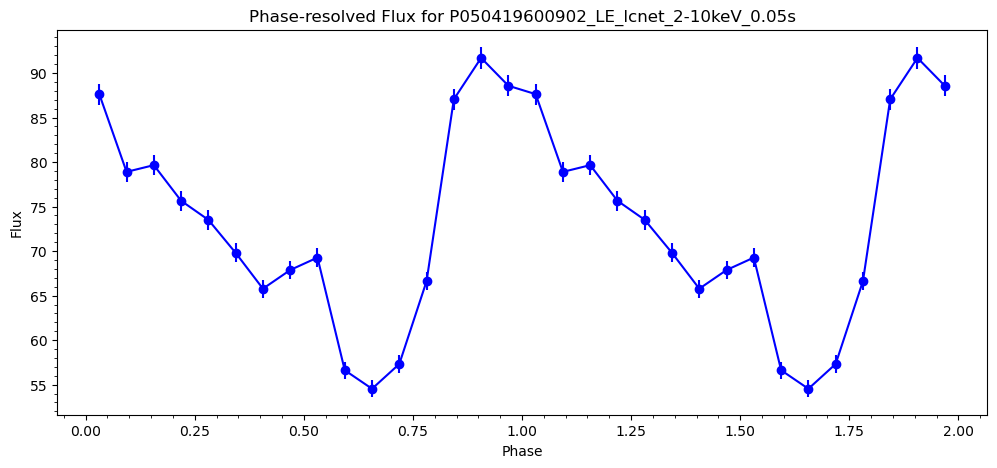

TSTART: 366171357.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196010/pipeline_output/P050419601001_LE_lcnet_2-10keV_0.05s.lc
First event time: 366171357.025
Last event time: 366183176.97499996
Total duration: 11819.949999988079 seconds
raw time value: [3.66171357e+08 3.66171357e+08 3.66171357e+08 3.66171357e+08
 3.66171357e+08 3.66171357e+08 3.66171357e+08 3.66171357e+08
 3.66171357e+08 3.66171357e+08]
converted from reference epoch time:  [3.70721158e+08 3.70721158e+08 3.70721158e+08 3.70721158e+08
 3.70721158e+08 3.70721158e+08 3.70721158e+08 3.70721158e+08
 3.70721158e+08 3.70721158e+08]


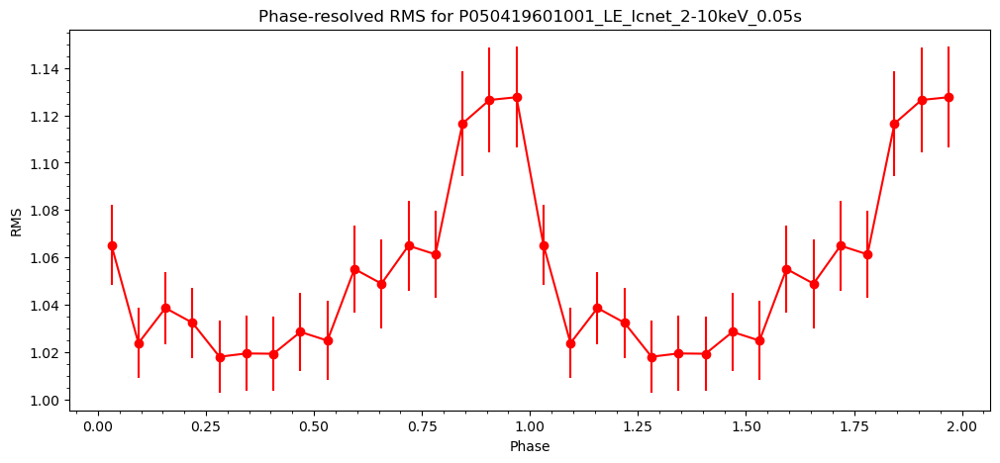

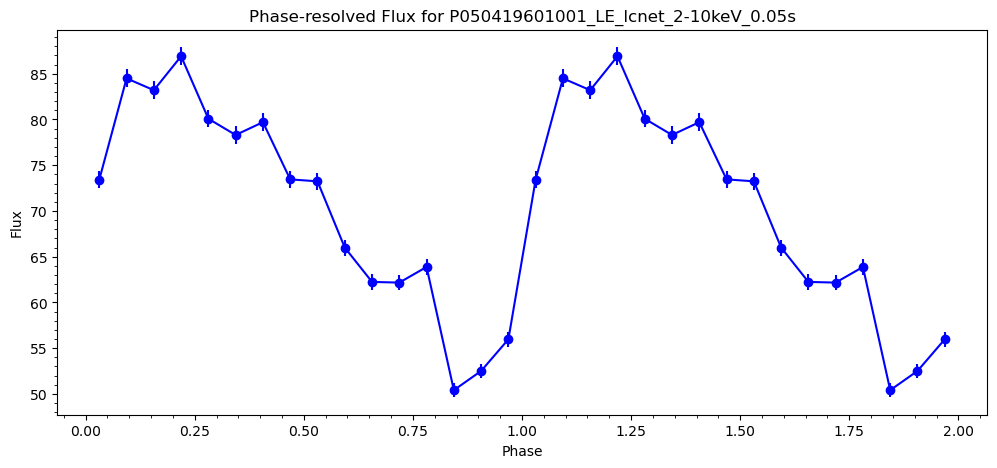

TSTART: 366256775.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196011/pipeline_output/P050419601101_LE_lcnet_2-10keV_0.05s.lc
First event time: 366256775.025
Last event time: 366268774.97499996
Total duration: 11999.949999988079 seconds
raw time value: [3.66256775e+08 3.66256775e+08 3.66256775e+08 3.66256775e+08
 3.66256775e+08 3.66256775e+08 3.66256775e+08 3.66256775e+08
 3.66256775e+08 3.66256775e+08]
converted from reference epoch time:  [3.70891994e+08 3.70891994e+08 3.70891994e+08 3.70891994e+08
 3.70891994e+08 3.70891994e+08 3.70891994e+08 3.70891994e+08
 3.70891994e+08 3.70891994e+08]


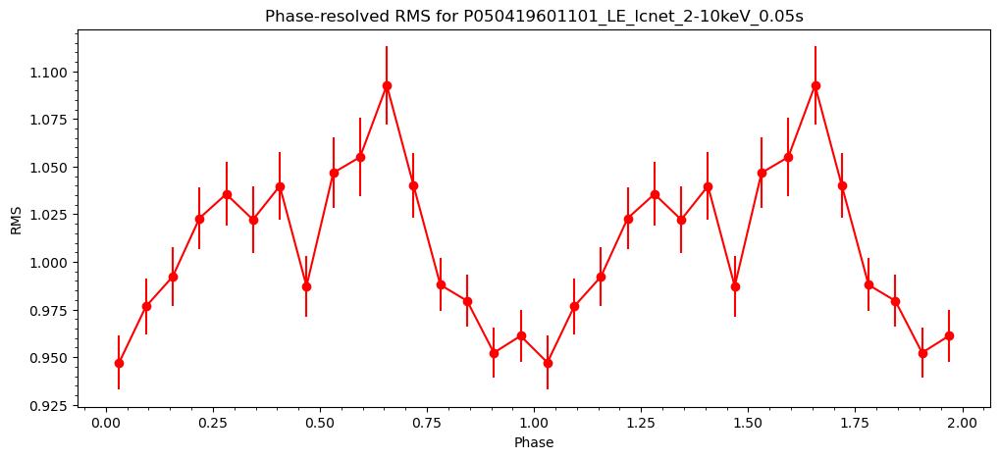

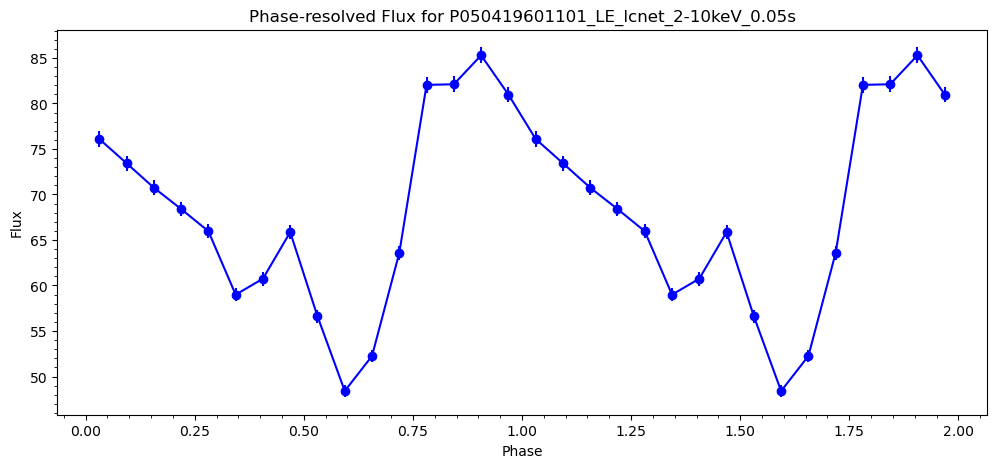

TSTART: 366422587.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196013/pipeline_output/P050419601301_LE_lcnet_2-10keV_0.05s.lc
First event time: 366422587.025
Last event time: 366434466.97499996
Total duration: 11879.949999988079 seconds
raw time value: [3.66422587e+08 3.66422587e+08 3.66422587e+08 3.66422587e+08
 3.66422587e+08 3.66422587e+08 3.66422587e+08 3.66422587e+08
 3.66422587e+08 3.66422587e+08]
converted from reference epoch time:  [3.71223618e+08 3.71223618e+08 3.71223618e+08 3.71223618e+08
 3.71223618e+08 3.71223618e+08 3.71223618e+08 3.71223618e+08
 3.71223618e+08 3.71223618e+08]


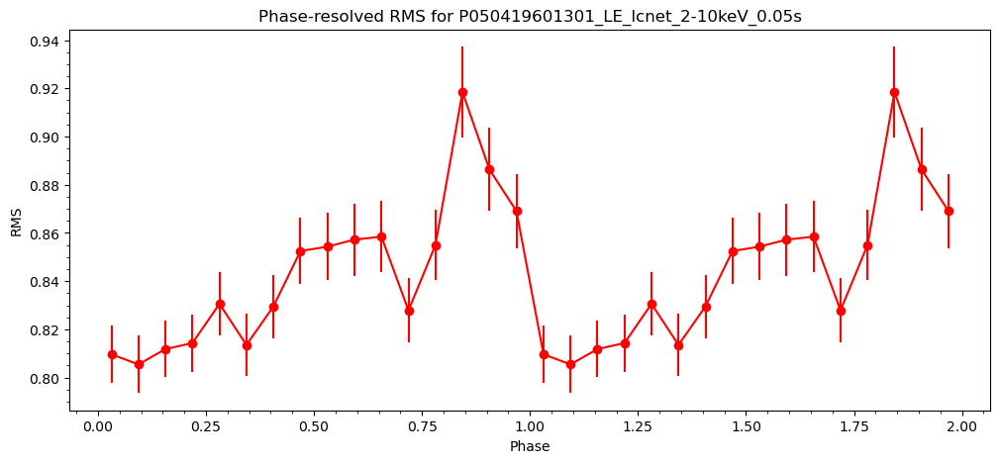

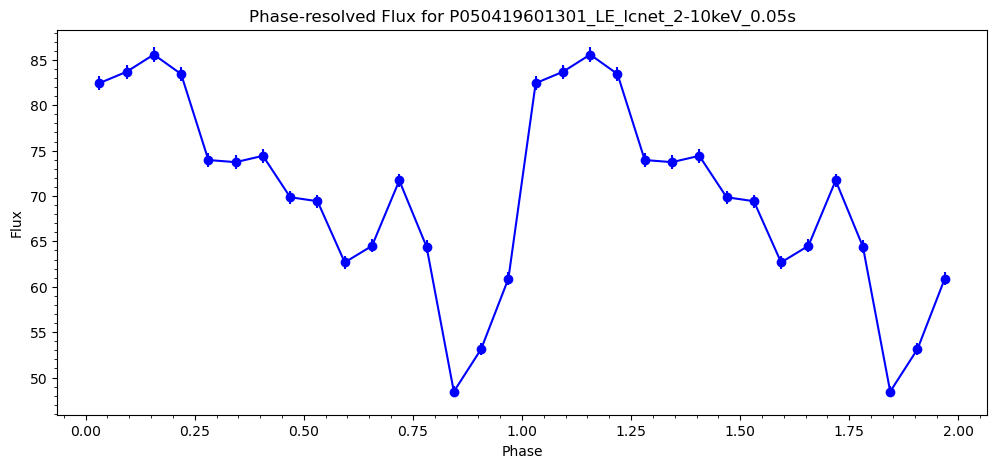

TSTART: 366628089.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601501_LE_lcnet_2-10keV_0.05s.lc
First event time: 366628089.025
Last event time: 366640388.97499996
Total duration: 12299.949999988079 seconds
raw time value: [3.66628089e+08 3.66628089e+08 3.66628089e+08 3.66628089e+08
 3.66628089e+08 3.66628089e+08 3.66628089e+08 3.66628089e+08
 3.66628089e+08 3.66628089e+08]
converted from reference epoch time:  [3.71634622e+08 3.71634622e+08 3.71634622e+08 3.71634622e+08
 3.71634622e+08 3.71634622e+08 3.71634622e+08 3.71634622e+08
 3.71634622e+08 3.71634622e+08]


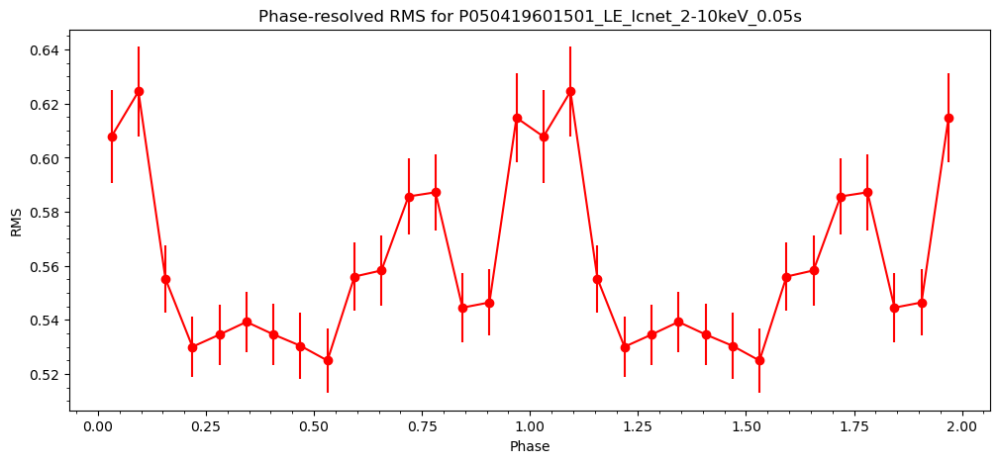

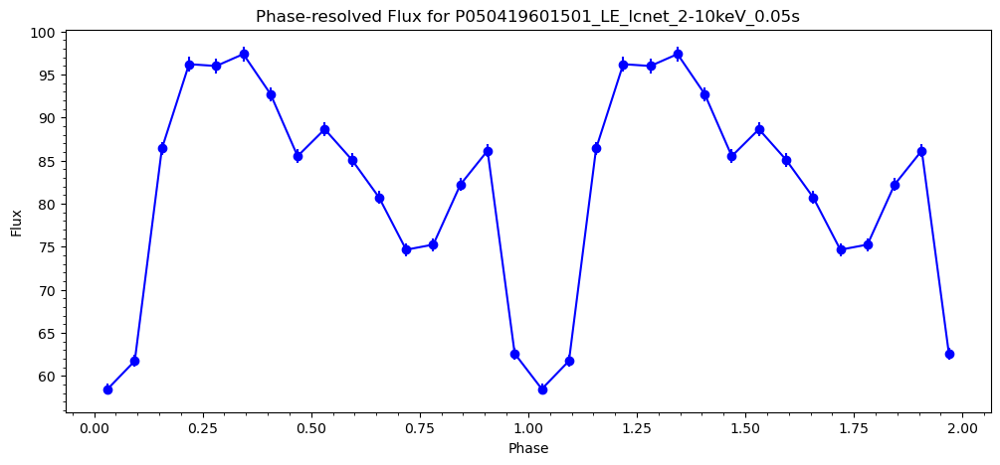

TSTART: 366644839.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601502_LE_lcnet_2-10keV_0.05s.lc
First event time: 366644839.025
Last event time: 366651858.97499996
Total duration: 7019.949999988079 seconds
raw time value: [3.66644839e+08 3.66644839e+08 3.66644839e+08 3.66644839e+08
 3.66644839e+08 3.66644839e+08 3.66644839e+08 3.66644839e+08
 3.66644839e+08 3.66644839e+08]
converted from reference epoch time:  [3.71668122e+08 3.71668122e+08 3.71668122e+08 3.71668122e+08
 3.71668122e+08 3.71668122e+08 3.71668122e+08 3.71668122e+08
 3.71668122e+08 3.71668122e+08]


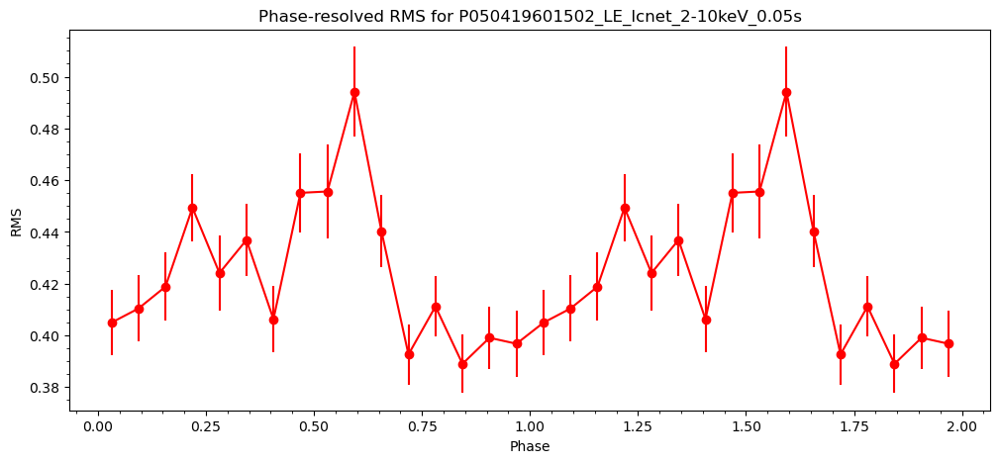

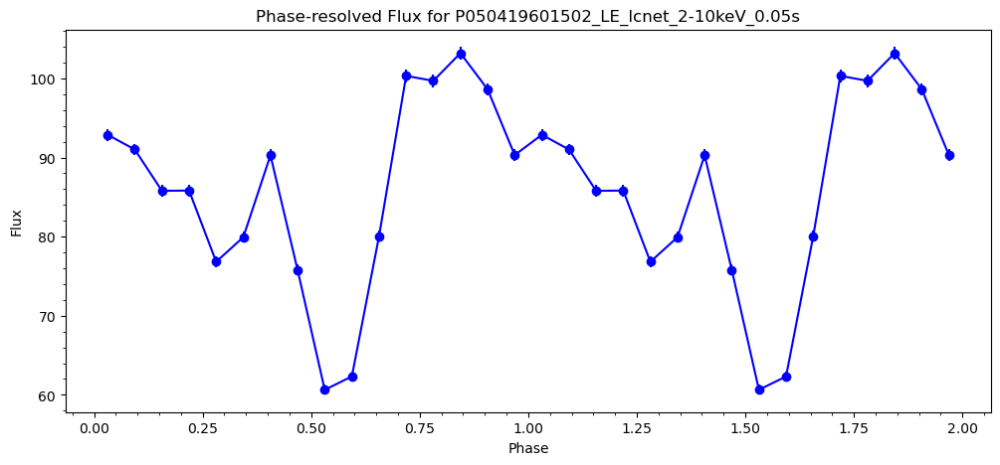

TSTART: 366713647.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601602_LE_lcnet_2-10keV_0.05s.lc
First event time: 366713647.025
Last event time: 366720306.97499996
Total duration: 6659.949999988079 seconds
raw time value: [3.66713647e+08 3.66713647e+08 3.66713647e+08 3.66713647e+08
 3.66713647e+08 3.66713647e+08 3.66713647e+08 3.66713647e+08
 3.66713647e+08 3.66713647e+08]
converted from reference epoch time:  [3.71805738e+08 3.71805738e+08 3.71805738e+08 3.71805738e+08
 3.71805738e+08 3.71805738e+08 3.71805738e+08 3.71805738e+08
 3.71805738e+08 3.71805738e+08]


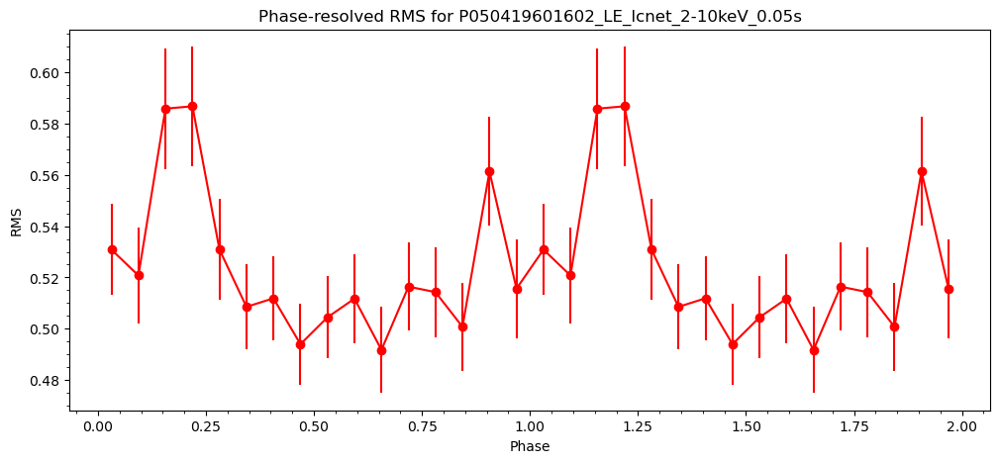

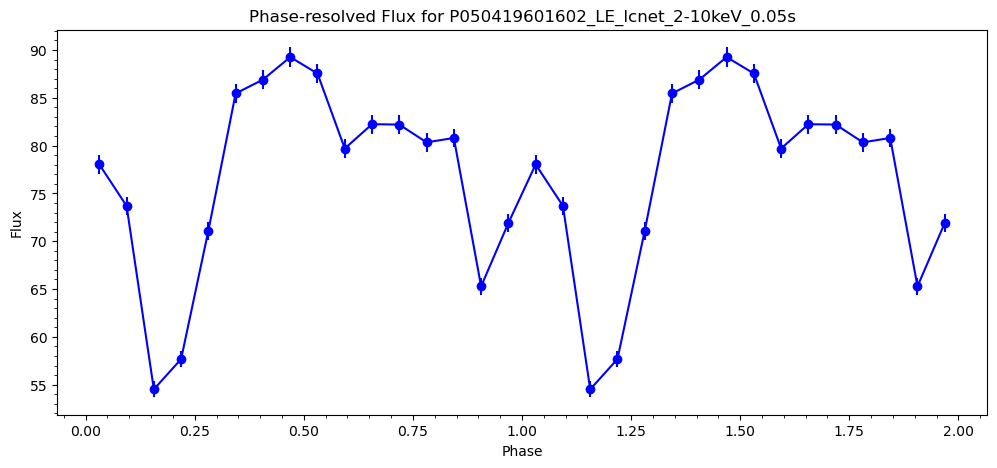

TSTART: 366724761.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601603_LE_lcnet_2-10keV_0.05s.lc
First event time: 366724761.025
Last event time: 366726200.97499996
Total duration: 1439.949999988079 seconds
raw time value: [3.66724761e+08 3.66724761e+08 3.66724761e+08 3.66724761e+08
 3.66724761e+08 3.66724761e+08 3.66724761e+08 3.66724761e+08
 3.66724761e+08 3.66724761e+08]
converted from reference epoch time:  [3.71827966e+08 3.71827966e+08 3.71827966e+08 3.71827966e+08
 3.71827966e+08 3.71827966e+08 3.71827966e+08 3.71827966e+08
 3.71827966e+08 3.71827966e+08]


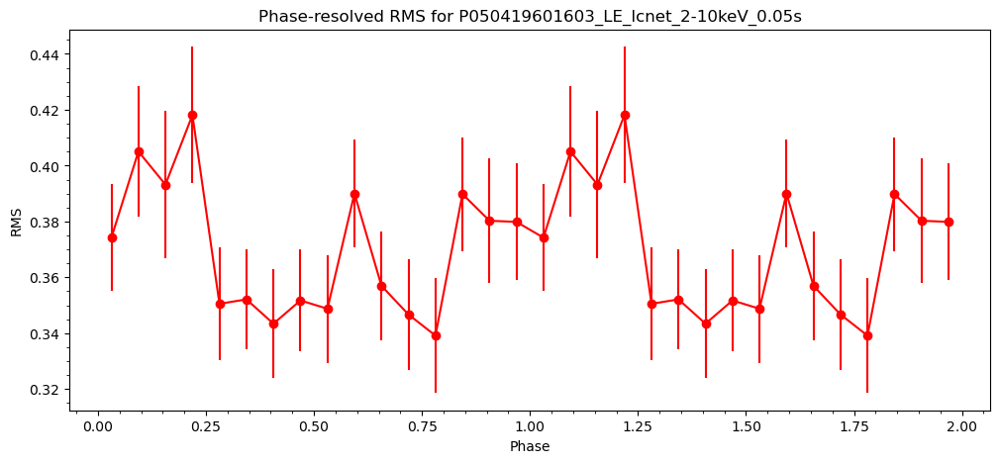

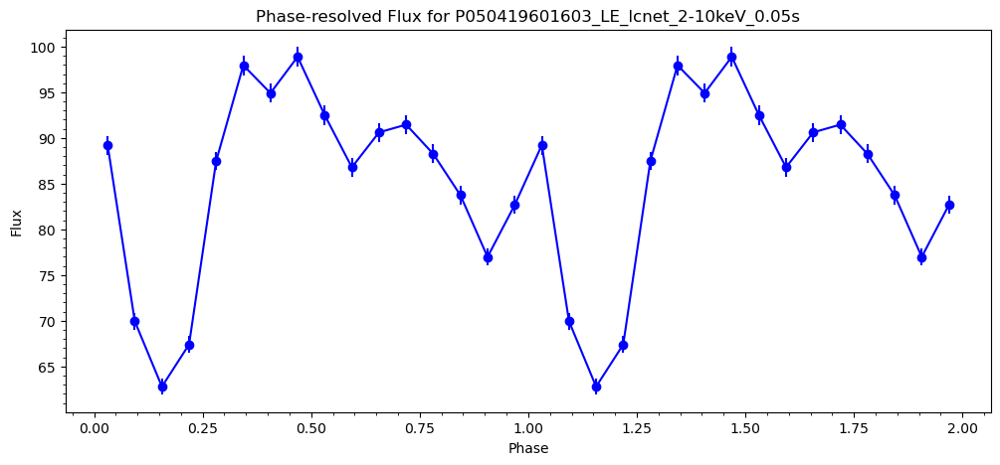

TSTART: 366975825.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196018/pipeline_output/P050419601801_LE_lcnet_2-10keV_0.05s.lc
First event time: 366975825.025
Last event time: 366982904.97499996
Total duration: 7079.949999988079 seconds
raw time value: [3.66975825e+08 3.66975825e+08 3.66975825e+08 3.66975825e+08
 3.66975825e+08 3.66975825e+08 3.66975825e+08 3.66975825e+08
 3.66975825e+08 3.66975825e+08]
converted from reference epoch time:  [3.72330094e+08 3.72330094e+08 3.72330094e+08 3.72330094e+08
 3.72330094e+08 3.72330094e+08 3.72330094e+08 3.72330094e+08
 3.72330094e+08 3.72330094e+08]


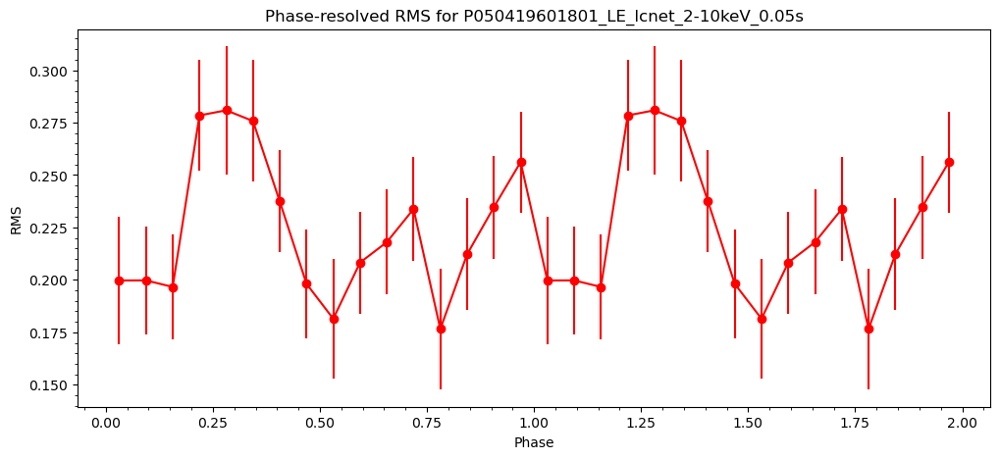

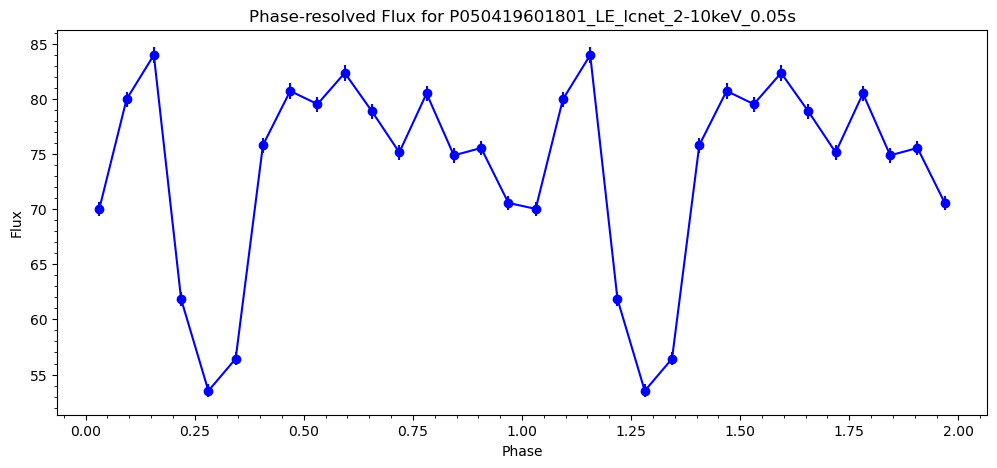

TSTART: 367055861.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601902_LE_lcnet_2-10keV_0.05s.lc
First event time: 367055861.025
Last event time: 367062760.97499996
Total duration: 6899.949999988079 seconds
raw time value: [3.67055861e+08 3.67055861e+08 3.67055861e+08 3.67055861e+08
 3.67055861e+08 3.67055861e+08 3.67055861e+08 3.67055861e+08
 3.67055861e+08 3.67055861e+08]
converted from reference epoch time:  [3.72490166e+08 3.72490166e+08 3.72490166e+08 3.72490166e+08
 3.72490166e+08 3.72490166e+08 3.72490166e+08 3.72490166e+08
 3.72490166e+08 3.72490166e+08]


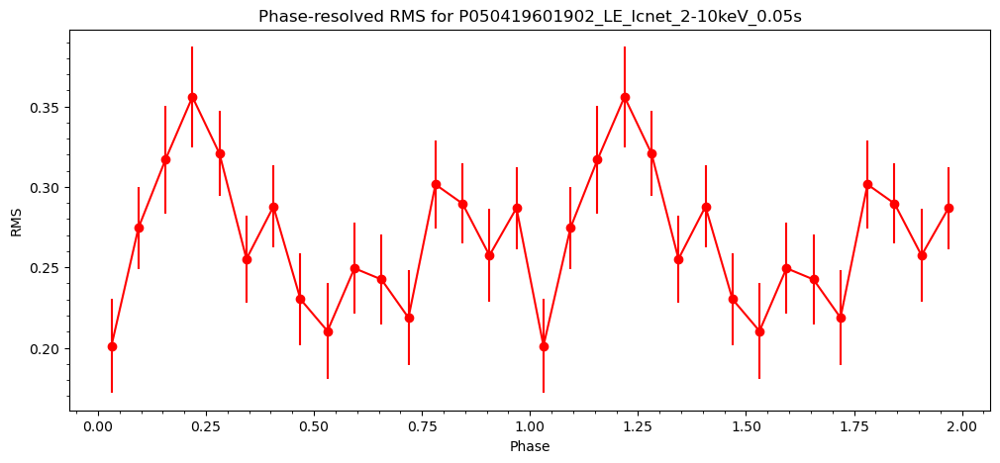

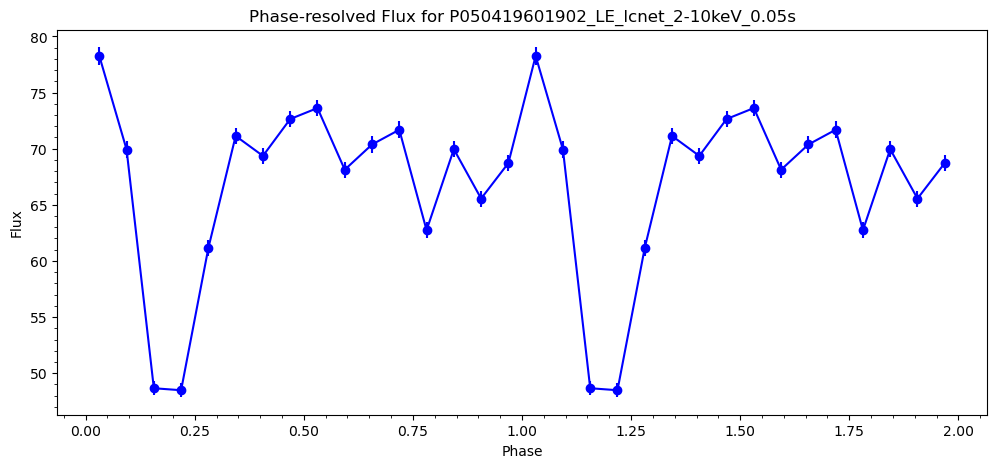

TSTART: 367066915.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601903_LE_lcnet_2-10keV_0.05s.lc
First event time: 367066915.025
Last event time: 367068474.97499996
Total duration: 1559.949999988079 seconds
raw time value: [3.67066915e+08 3.67066915e+08 3.67066915e+08 3.67066915e+08
 3.67066915e+08 3.67066915e+08 3.67066915e+08 3.67066915e+08
 3.67066915e+08 3.67066915e+08]
converted from reference epoch time:  [3.72512274e+08 3.72512274e+08 3.72512274e+08 3.72512274e+08
 3.72512274e+08 3.72512274e+08 3.72512274e+08 3.72512274e+08
 3.72512274e+08 3.72512274e+08]


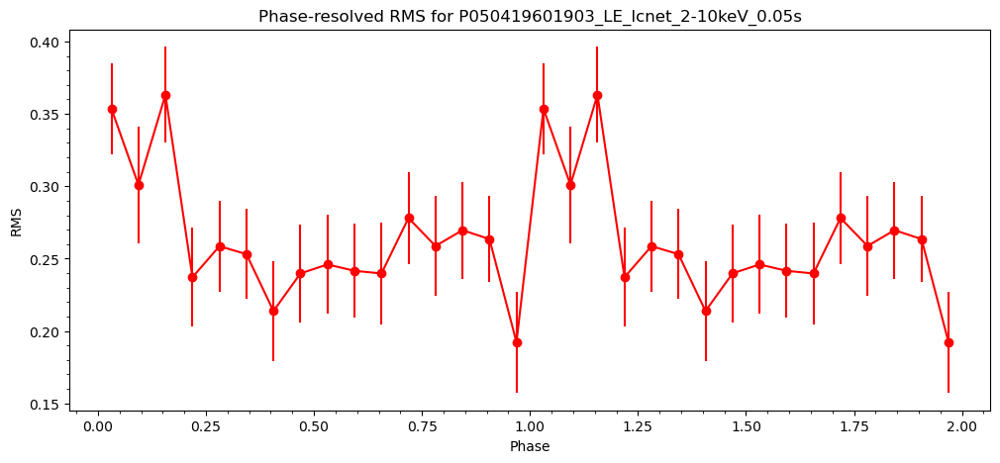

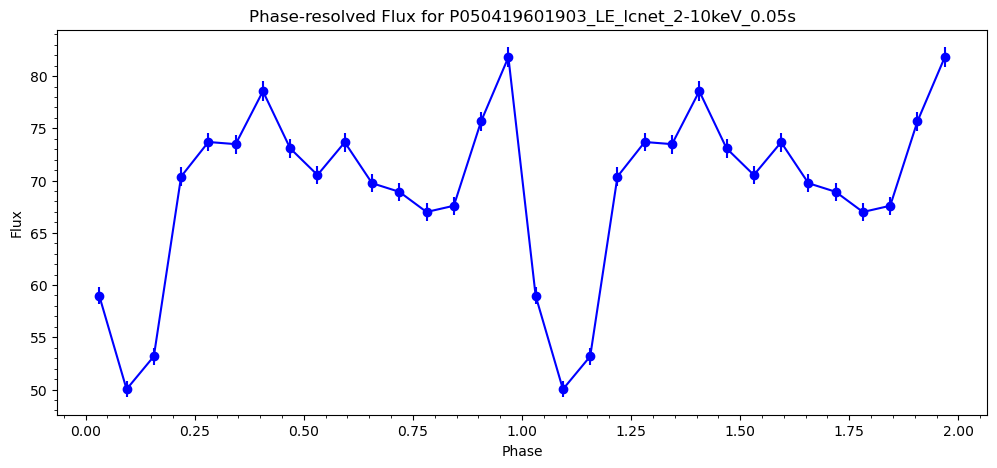

TSTART: 367159435.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196020/pipeline_output/P050419602001_LE_lcnet_2-10keV_0.05s.lc
First event time: 367159435.025
Last event time: 367170954.97499996
Total duration: 11519.949999988079 seconds
raw time value: [3.67159435e+08 3.67159435e+08 3.67159435e+08 3.67159435e+08
 3.67159435e+08 3.67159435e+08 3.67159435e+08 3.67159435e+08
 3.67159435e+08 3.67159435e+08]
converted from reference epoch time:  [3.72697314e+08 3.72697314e+08 3.72697314e+08 3.72697314e+08
 3.72697314e+08 3.72697314e+08 3.72697314e+08 3.72697314e+08
 3.72697314e+08 3.72697314e+08]


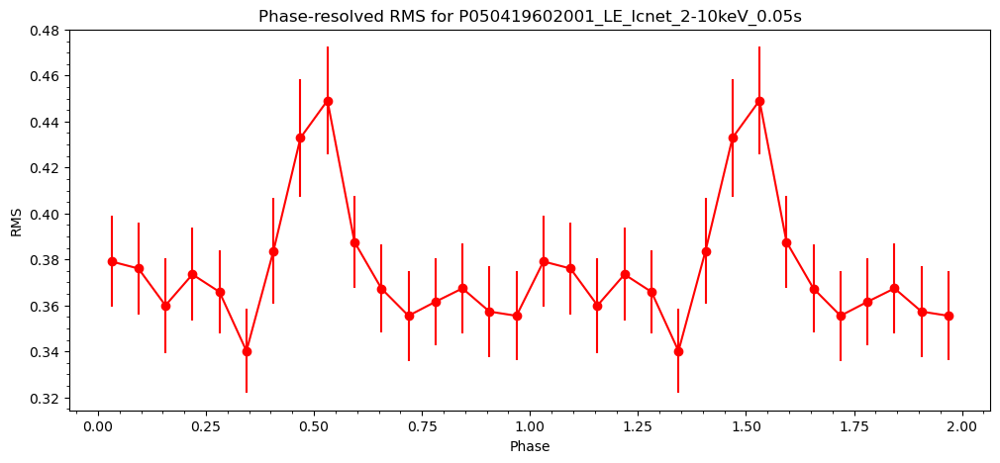

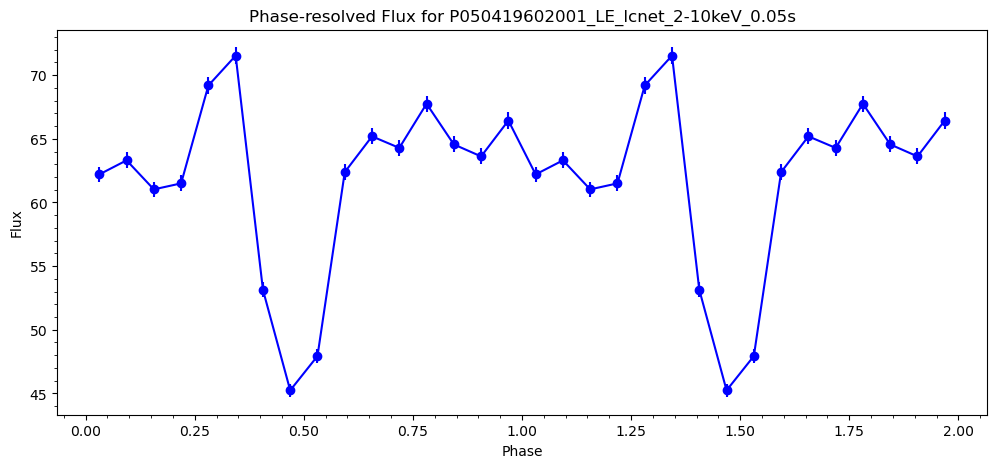

TSTART: 367175279.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196020/pipeline_output/P050419602002_LE_lcnet_2-10keV_0.05s.lc
First event time: 367175279.025
Last event time: 367187938.97499996
Total duration: 12659.949999988079 seconds
raw time value: [3.67175279e+08 3.67175279e+08 3.67175279e+08 3.67175279e+08
 3.67175279e+08 3.67175279e+08 3.67175279e+08 3.67175279e+08
 3.67175279e+08 3.67175279e+08]
converted from reference epoch time:  [3.72729002e+08 3.72729002e+08 3.72729002e+08 3.72729002e+08
 3.72729002e+08 3.72729002e+08 3.72729002e+08 3.72729002e+08
 3.72729002e+08 3.72729002e+08]


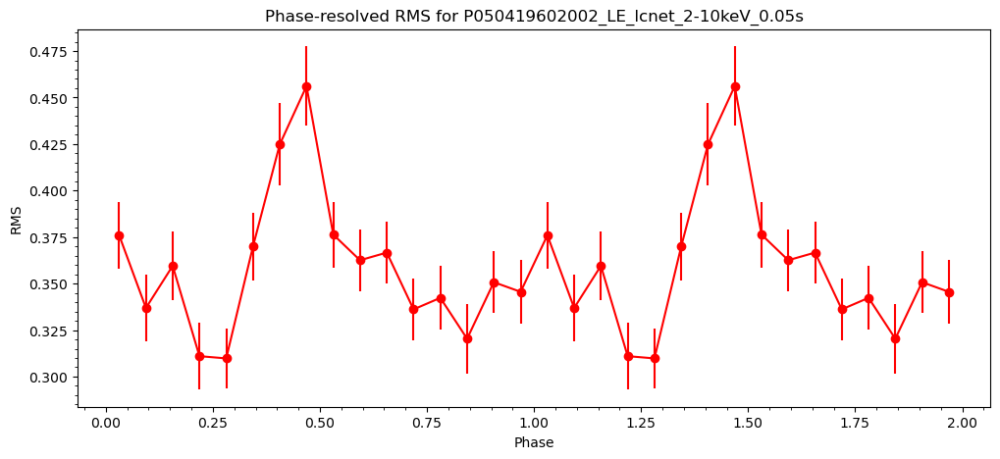

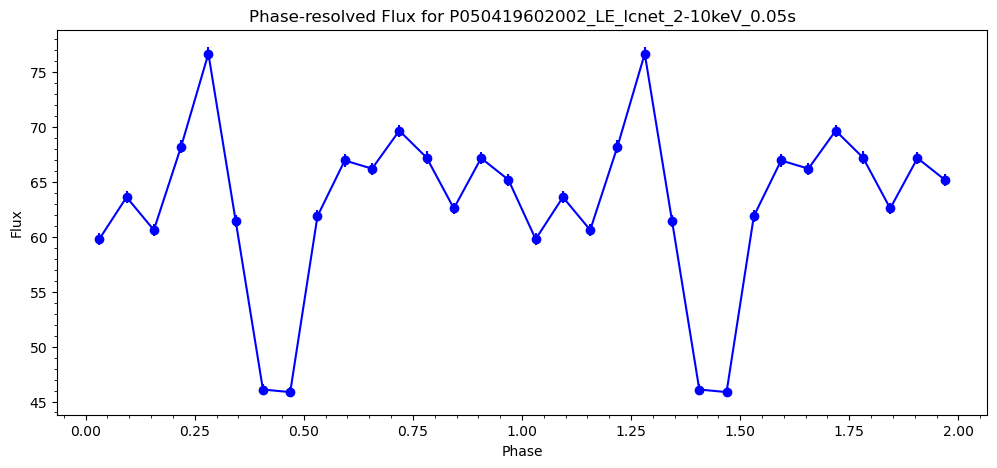

TSTART: 367262146.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196021/pipeline_output/P050419602101_LE_lcnet_2-10keV_0.05s.lc
First event time: 367262146.025
Last event time: 367284705.97499996
Total duration: 22559.94999998808 seconds
raw time value: [3.67262146e+08 3.67262146e+08 3.67262146e+08 3.67262146e+08
 3.67262146e+08 3.67262146e+08 3.67262146e+08 3.67262146e+08
 3.67262146e+08 3.67262146e+08]
converted from reference epoch time:  [3.72902736e+08 3.72902736e+08 3.72902736e+08 3.72902736e+08
 3.72902736e+08 3.72902736e+08 3.72902736e+08 3.72902736e+08
 3.72902736e+08 3.72902736e+08]


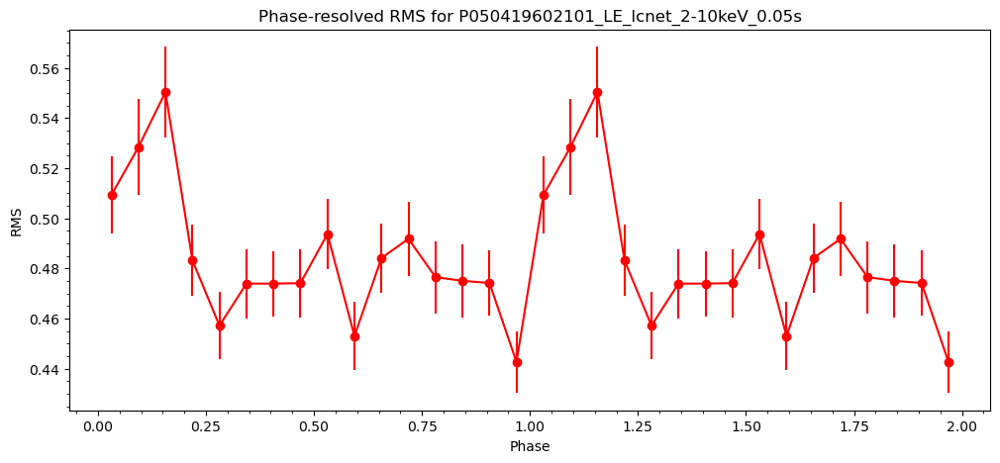

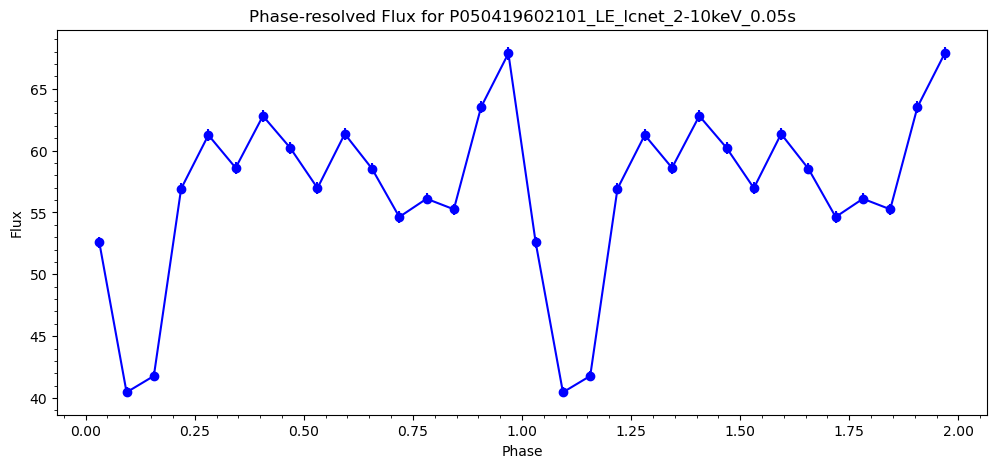

TSTART: 367397855.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602201_LE_lcnet_2-10keV_0.05s.lc
First event time: 367397855.025
Last event time: 367405114.97499996
Total duration: 7259.949999988079 seconds
raw time value: [3.67397855e+08 3.67397855e+08 3.67397855e+08 3.67397855e+08
 3.67397855e+08 3.67397855e+08 3.67397855e+08 3.67397855e+08
 3.67397855e+08 3.67397855e+08]
converted from reference epoch time:  [3.73174154e+08 3.73174154e+08 3.73174154e+08 3.73174154e+08
 3.73174154e+08 3.73174154e+08 3.73174154e+08 3.73174154e+08
 3.73174154e+08 3.73174154e+08]


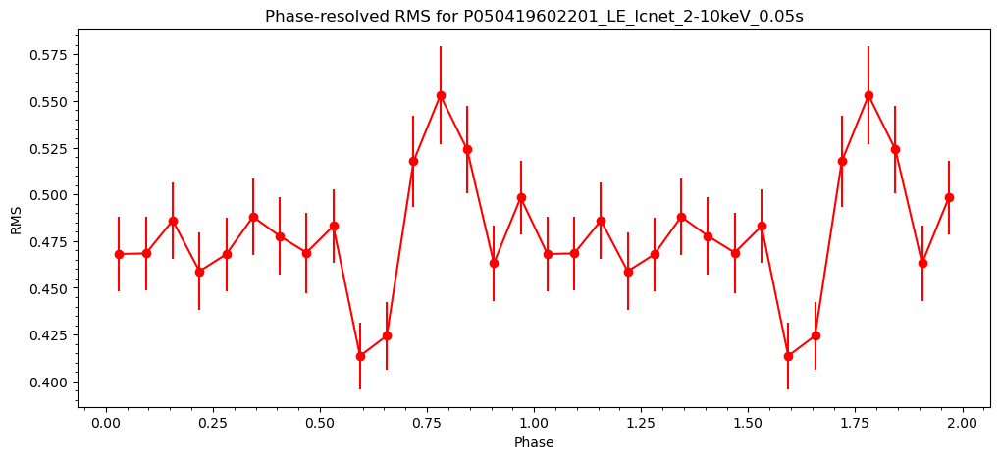

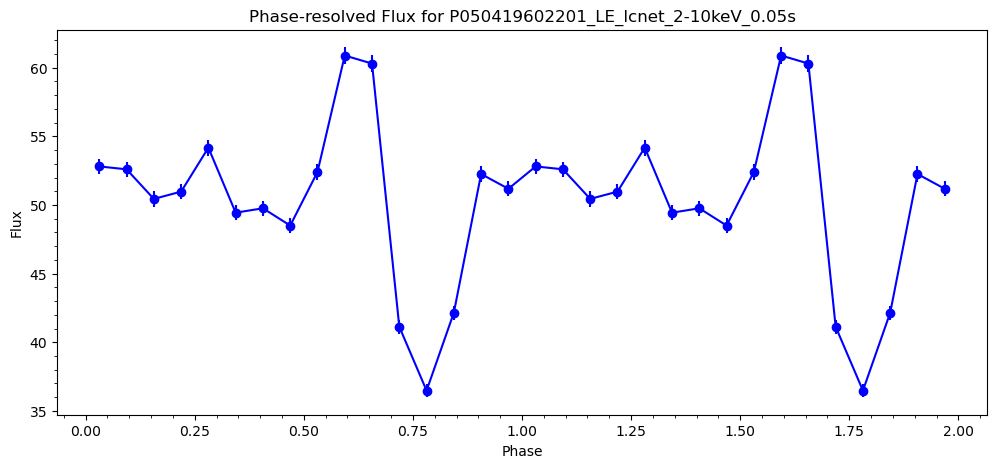

TSTART: 367409175.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602202_LE_lcnet_2-10keV_0.05s.lc
First event time: 367409175.025
Last event time: 367416314.97499996
Total duration: 7139.949999988079 seconds
raw time value: [3.67409175e+08 3.67409175e+08 3.67409175e+08 3.67409175e+08
 3.67409175e+08 3.67409175e+08 3.67409175e+08 3.67409175e+08
 3.67409175e+08 3.67409175e+08]
converted from reference epoch time:  [3.73196794e+08 3.73196794e+08 3.73196794e+08 3.73196794e+08
 3.73196794e+08 3.73196794e+08 3.73196794e+08 3.73196794e+08
 3.73196794e+08 3.73196794e+08]


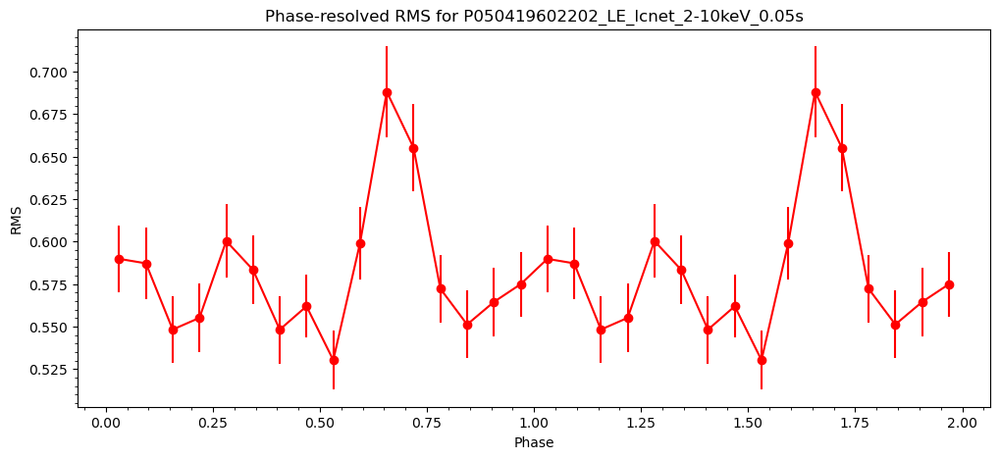

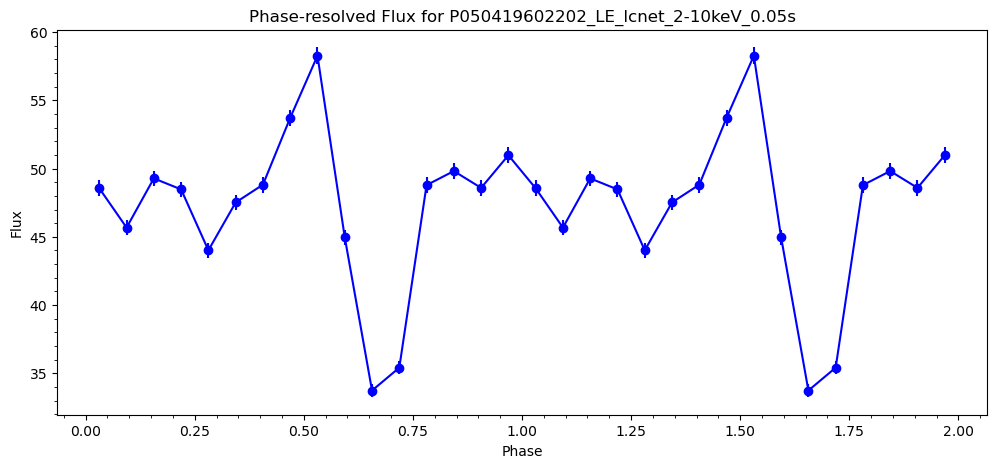

TSTART: 367419336.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602203_LE_lcnet_2-10keV_0.05s.lc
First event time: 367419336.025
Last event time: 367455815.97499996
Total duration: 36479.94999998808 seconds
raw time value: [3.67419336e+08 3.67419336e+08 3.67419336e+08 3.67419336e+08
 3.67419336e+08 3.67419336e+08 3.67419336e+08 3.67419336e+08
 3.67419336e+08 3.67419336e+08]
converted from reference epoch time:  [3.73217116e+08 3.73217116e+08 3.73217116e+08 3.73217116e+08
 3.73217116e+08 3.73217116e+08 3.73217116e+08 3.73217116e+08
 3.73217116e+08 3.73217116e+08]


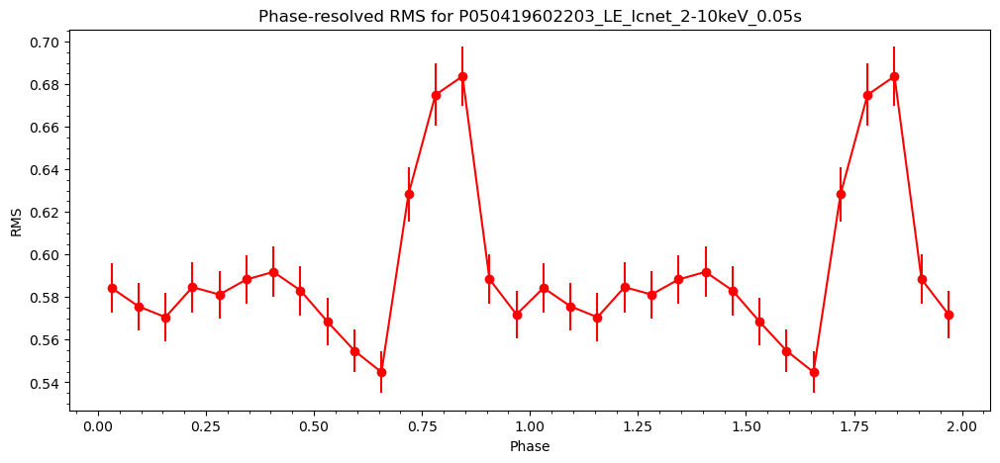

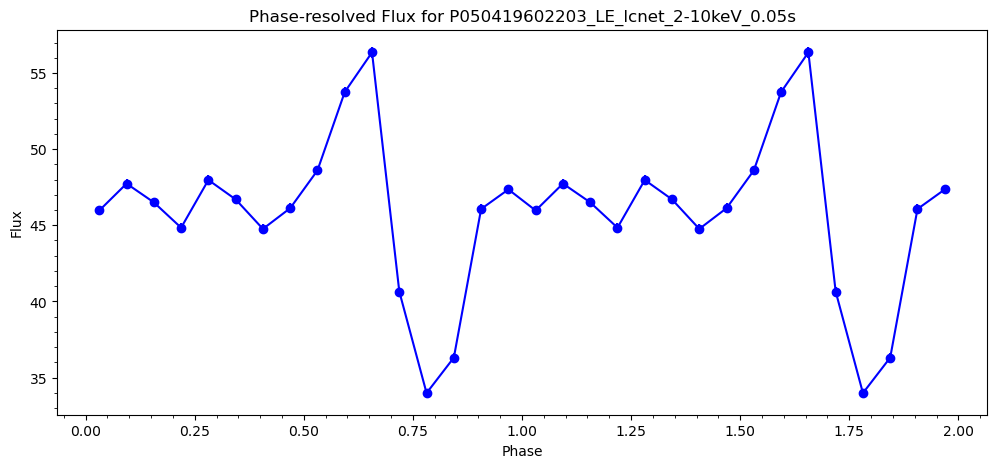

TSTART: 367470676.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602205_LE_lcnet_2-10keV_0.05s.lc
First event time: 367470676.025
Last event time: 367478475.97499996
Total duration: 7799.949999988079 seconds
raw time value: [3.67470676e+08 3.67470676e+08 3.67470676e+08 3.67470676e+08
 3.67470676e+08 3.67470676e+08 3.67470676e+08 3.67470676e+08
 3.67470676e+08 3.67470676e+08]
converted from reference epoch time:  [3.73319796e+08 3.73319796e+08 3.73319796e+08 3.73319796e+08
 3.73319796e+08 3.73319796e+08 3.73319796e+08 3.73319796e+08
 3.73319796e+08 3.73319796e+08]


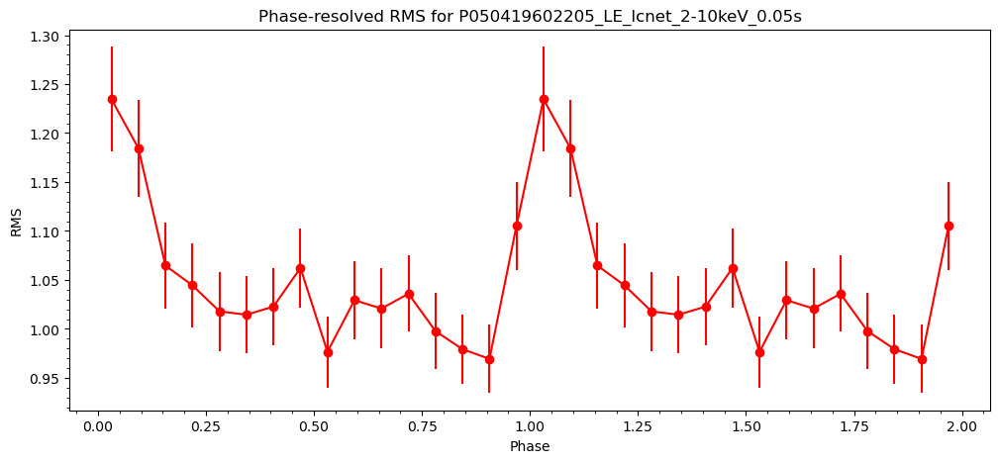

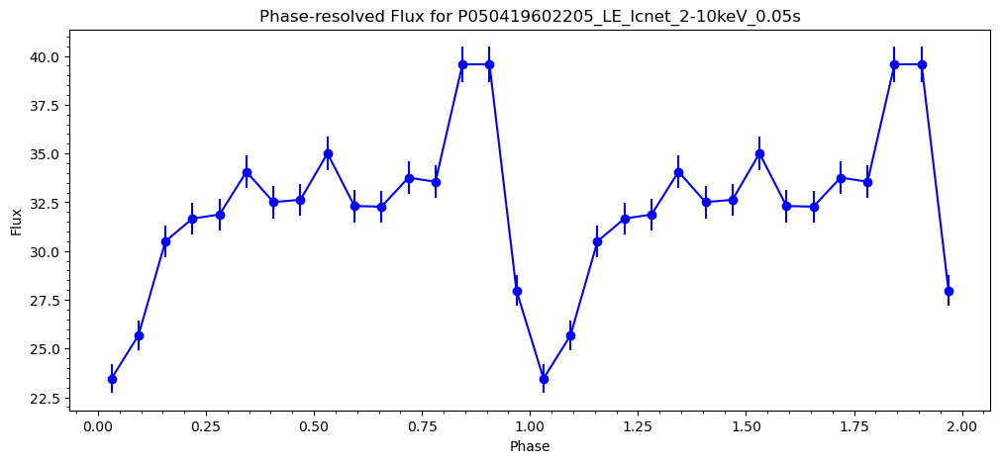

TSTART: 367483471.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602206_LE_lcnet_2-10keV_0.05s.lc
First event time: 367483471.025
Last event time: 367490490.97499996
Total duration: 7019.949999988079 seconds
raw time value: [3.67483471e+08 3.67483471e+08 3.67483471e+08 3.67483471e+08
 3.67483471e+08 3.67483471e+08 3.67483471e+08 3.67483471e+08
 3.67483471e+08 3.67483471e+08]
converted from reference epoch time:  [3.73345386e+08 3.73345386e+08 3.73345386e+08 3.73345386e+08
 3.73345386e+08 3.73345386e+08 3.73345386e+08 3.73345386e+08
 3.73345386e+08 3.73345386e+08]


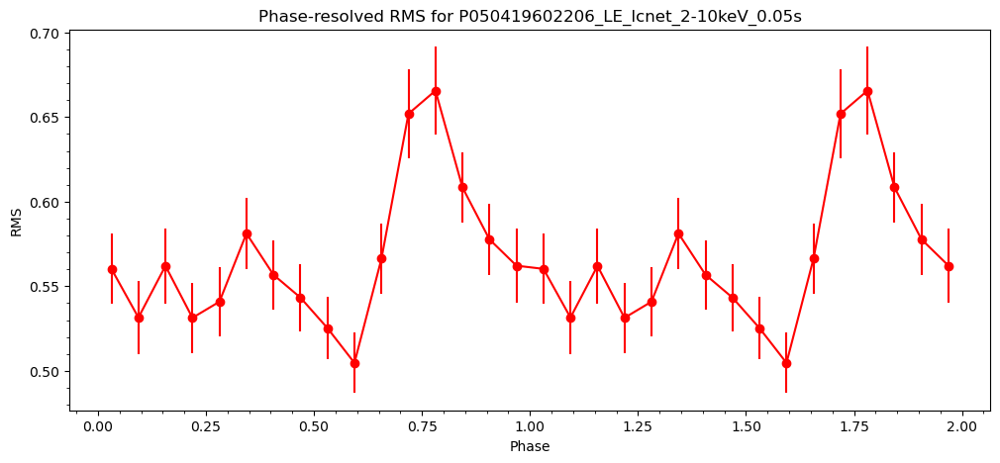

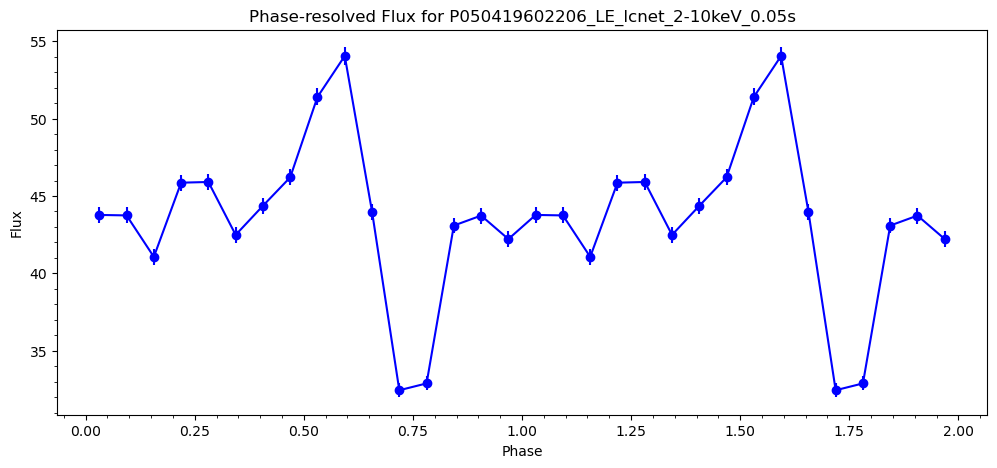

TSTART: 367493418.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602207_LE_lcnet_2-10keV_0.05s.lc
First event time: 367493418.025
Last event time: 367501877.97499996
Total duration: 8459.949999988079 seconds
raw time value: [3.67493418e+08 3.67493418e+08 3.67493418e+08 3.67493418e+08
 3.67493418e+08 3.67493418e+08 3.67493418e+08 3.67493418e+08
 3.67493418e+08 3.67493418e+08]
converted from reference epoch time:  [3.7336528e+08 3.7336528e+08 3.7336528e+08 3.7336528e+08 3.7336528e+08
 3.7336528e+08 3.7336528e+08 3.7336528e+08 3.7336528e+08 3.7336528e+08]


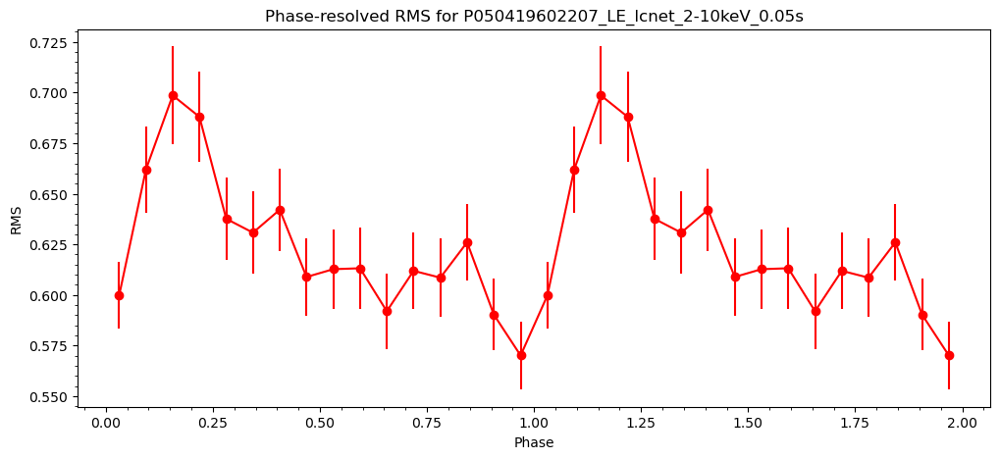

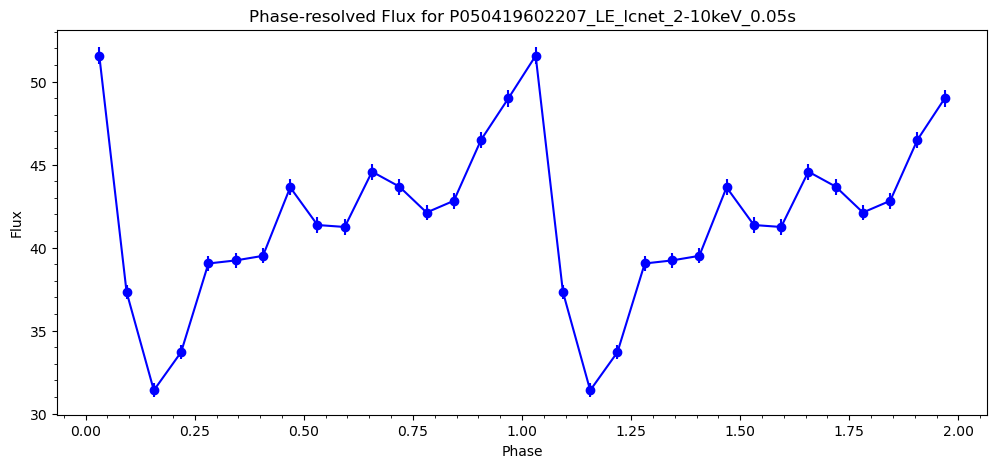

TSTART: 367504637.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602208_LE_lcnet_2-10keV_0.05s.lc
First event time: 367504637.025
Last event time: 367541416.97499996
Total duration: 36779.94999998808 seconds
raw time value: [3.67504637e+08 3.67504637e+08 3.67504637e+08 3.67504637e+08
 3.67504637e+08 3.67504637e+08 3.67504637e+08 3.67504637e+08
 3.67504637e+08 3.67504637e+08]
converted from reference epoch time:  [3.73387718e+08 3.73387718e+08 3.73387718e+08 3.73387718e+08
 3.73387718e+08 3.73387718e+08 3.73387718e+08 3.73387718e+08
 3.73387718e+08 3.73387718e+08]


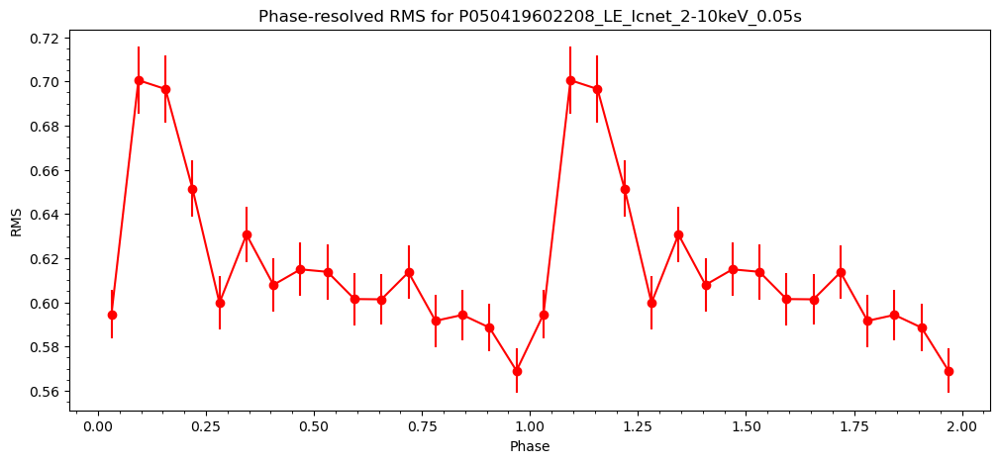

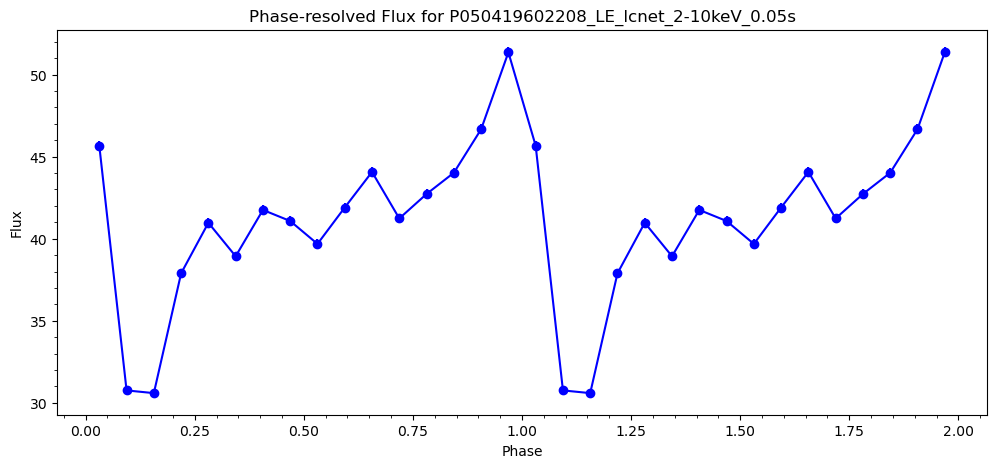

TSTART: 367544597.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602209_LE_lcnet_2-10keV_0.05s.lc
First event time: 367544597.025
Last event time: 367550716.97499996
Total duration: 6119.949999988079 seconds
raw time value: [3.67544597e+08 3.67544597e+08 3.67544597e+08 3.67544597e+08
 3.67544597e+08 3.67544597e+08 3.67544597e+08 3.67544597e+08
 3.67544597e+08 3.67544597e+08]
converted from reference epoch time:  [3.73467638e+08 3.73467638e+08 3.73467638e+08 3.73467638e+08
 3.73467638e+08 3.73467638e+08 3.73467638e+08 3.73467638e+08
 3.73467638e+08 3.73467638e+08]


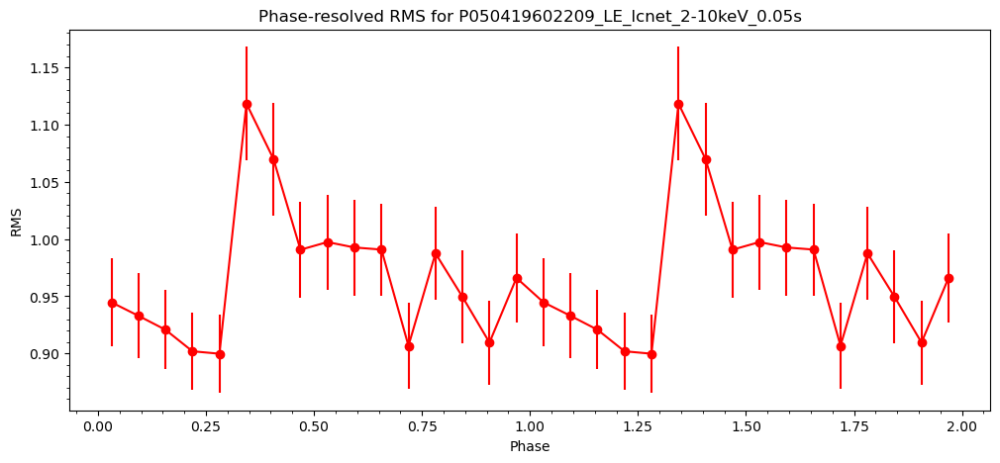

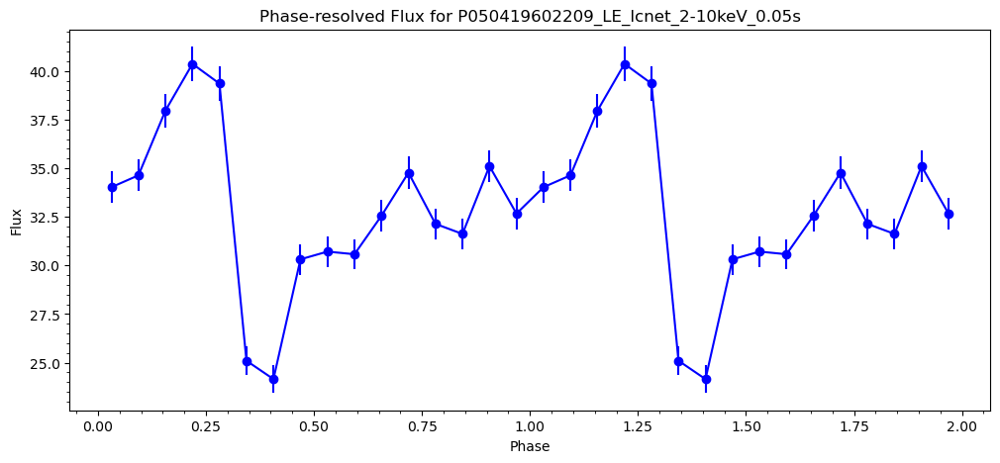

TSTART: 367556036.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602210_LE_lcnet_2-10keV_0.05s.lc
First event time: 367556036.025
Last event time: 367564135.97499996
Total duration: 8099.949999988079 seconds
raw time value: [3.67556036e+08 3.67556036e+08 3.67556036e+08 3.67556036e+08
 3.67556036e+08 3.67556036e+08 3.67556036e+08 3.67556036e+08
 3.67556036e+08 3.67556036e+08]
converted from reference epoch time:  [3.73490516e+08 3.73490516e+08 3.73490516e+08 3.73490516e+08
 3.73490516e+08 3.73490516e+08 3.73490516e+08 3.73490516e+08
 3.73490516e+08 3.73490516e+08]


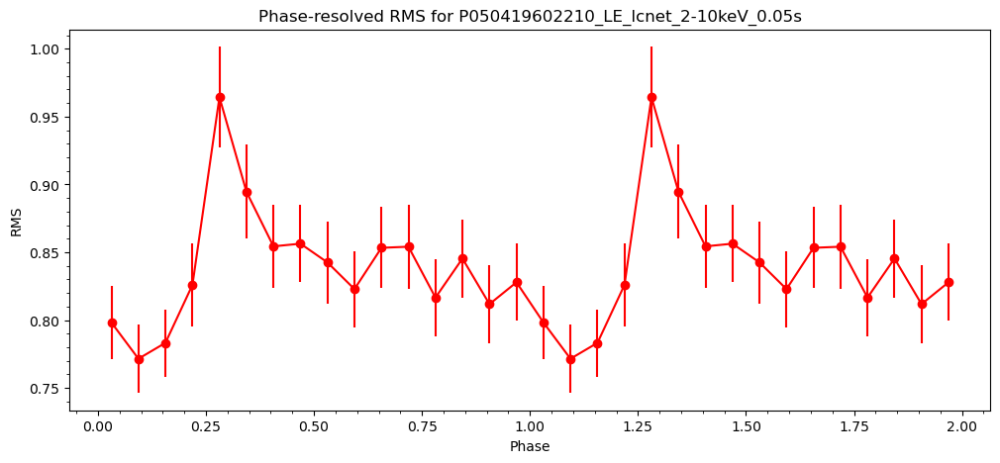

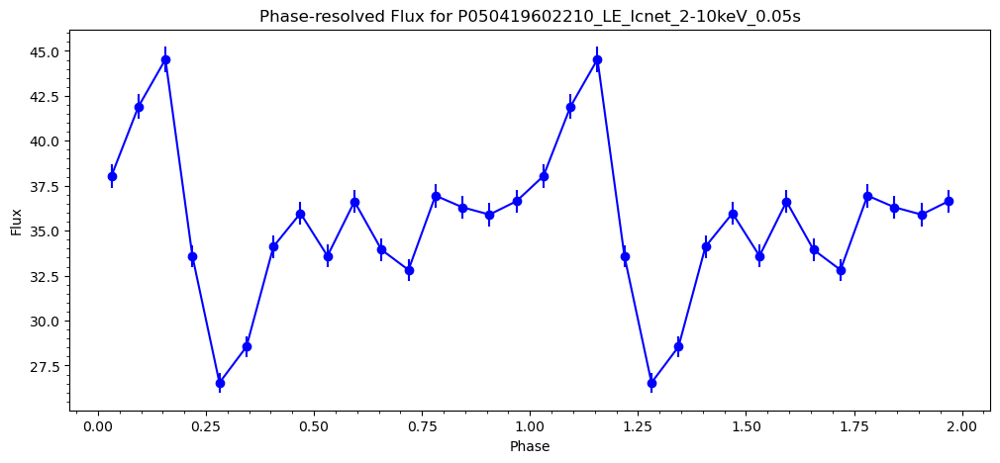

TSTART: 367567113.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602211_LE_lcnet_2-10keV_0.05s.lc
First event time: 367567113.025
Last event time: 367574972.97499996
Total duration: 7859.949999988079 seconds
raw time value: [3.67567113e+08 3.67567113e+08 3.67567113e+08 3.67567113e+08
 3.67567113e+08 3.67567113e+08 3.67567113e+08 3.67567113e+08
 3.67567113e+08 3.67567113e+08]
converted from reference epoch time:  [3.7351267e+08 3.7351267e+08 3.7351267e+08 3.7351267e+08 3.7351267e+08
 3.7351267e+08 3.7351267e+08 3.7351267e+08 3.7351267e+08 3.7351267e+08]


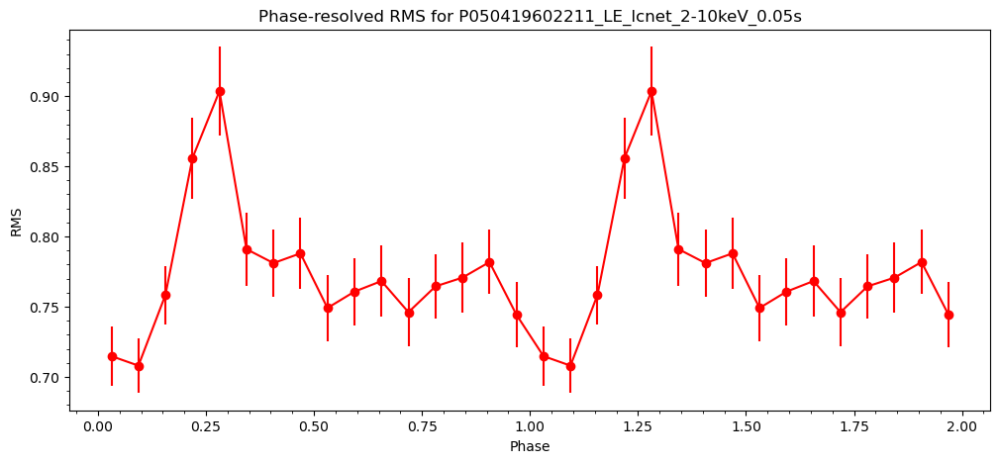

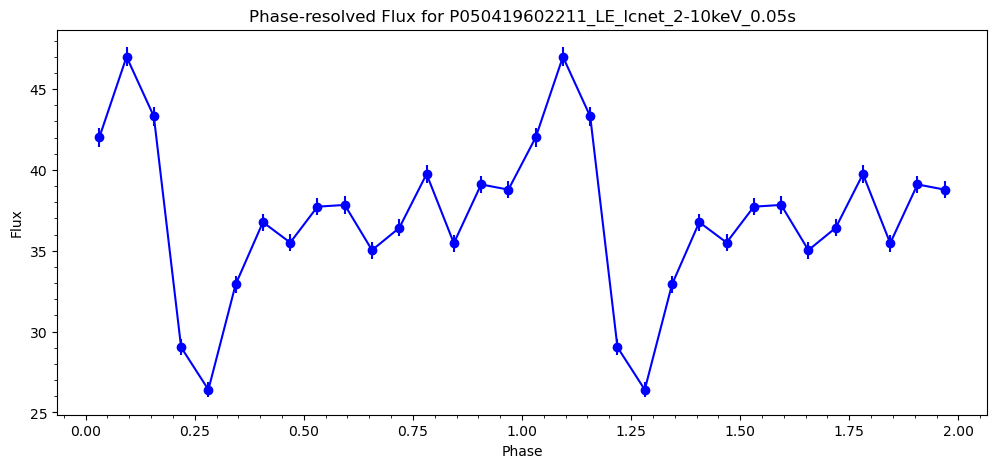

In [14]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_LE_manual.txt'  # Adjust the path as needed
main(input_file)

TSTART: 365108005.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900101_ME_lcnet_10-35keV_0.05s.lc
First event time: 365108005.025
Last event time: 365116734.97499996
Total duration: 8729.949999988079 seconds
raw time value: [3.65108005e+08 3.65108005e+08 3.65108005e+08 3.65108005e+08
 3.65108005e+08 3.65108005e+08 3.65108005e+08 3.65108005e+08
 3.65108005e+08 3.65108005e+08]
converted from reference epoch time:  [3.68594454e+08 3.68594454e+08 3.68594454e+08 3.68594454e+08
 3.68594454e+08 3.68594454e+08 3.68594454e+08 3.68594454e+08
 3.68594454e+08 3.68594454e+08]


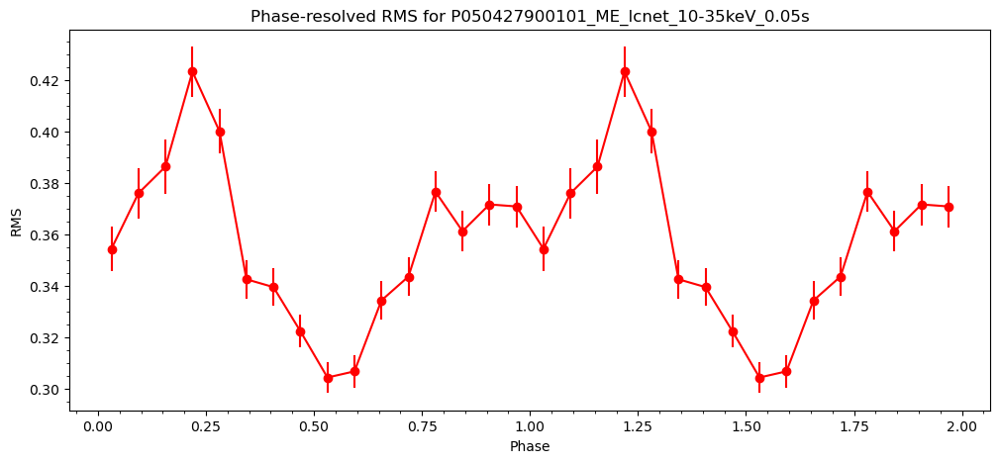

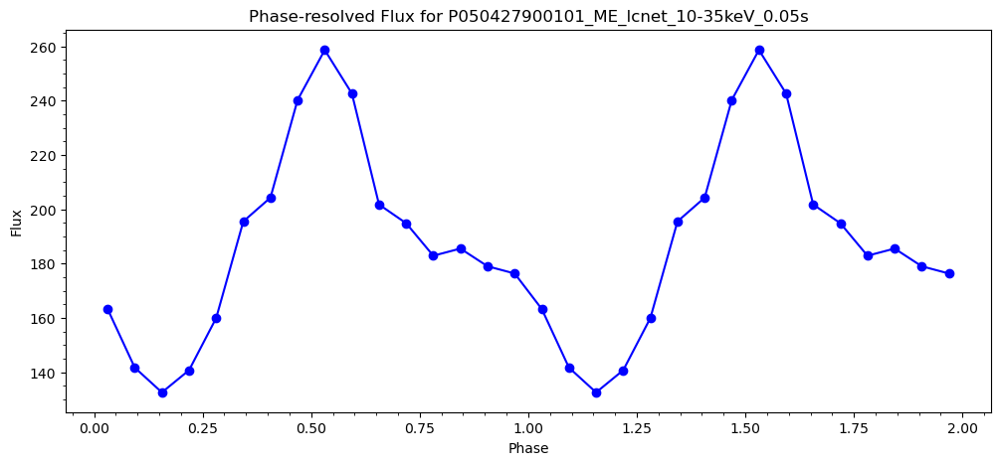

TSTART: 365119350.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900102_ME_lcnet_10-35keV_0.05s.lc
First event time: 365119350.025
Last event time: 365128079.97499996
Total duration: 8729.949999988079 seconds
raw time value: [3.6511935e+08 3.6511935e+08 3.6511935e+08 3.6511935e+08 3.6511935e+08
 3.6511935e+08 3.6511935e+08 3.6511935e+08 3.6511935e+08 3.6511935e+08]
converted from reference epoch time:  [3.68617144e+08 3.68617144e+08 3.68617144e+08 3.68617144e+08
 3.68617144e+08 3.68617144e+08 3.68617144e+08 3.68617144e+08
 3.68617144e+08 3.68617144e+08]


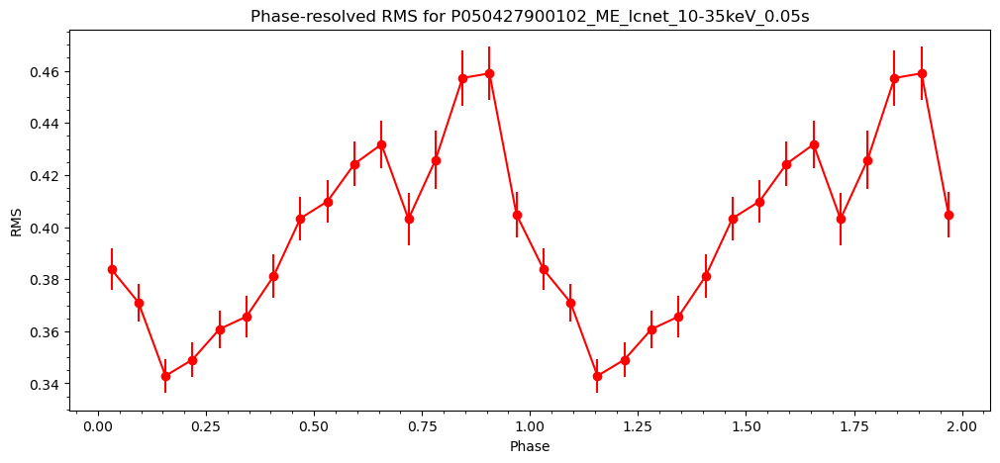

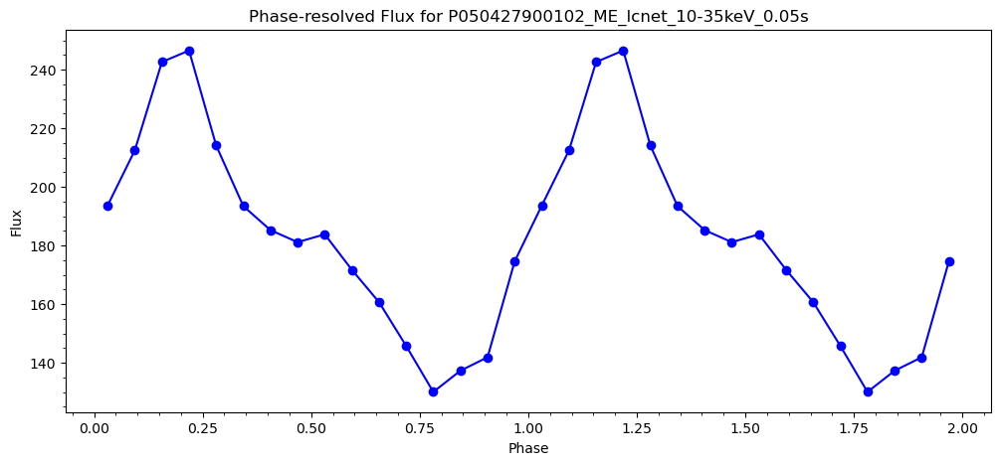

TSTART: 365131048.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900103_ME_lcnet_10-35keV_0.05s.lc
First event time: 365131048.025
Last event time: 365145177.97499996
Total duration: 14129.949999988079 seconds
raw time value: [3.65131048e+08 3.65131048e+08 3.65131048e+08 3.65131048e+08
 3.65131048e+08 3.65131048e+08 3.65131048e+08 3.65131048e+08
 3.65131048e+08 3.65131048e+08]
converted from reference epoch time:  [3.6864054e+08 3.6864054e+08 3.6864054e+08 3.6864054e+08 3.6864054e+08
 3.6864054e+08 3.6864054e+08 3.6864054e+08 3.6864054e+08 3.6864054e+08]


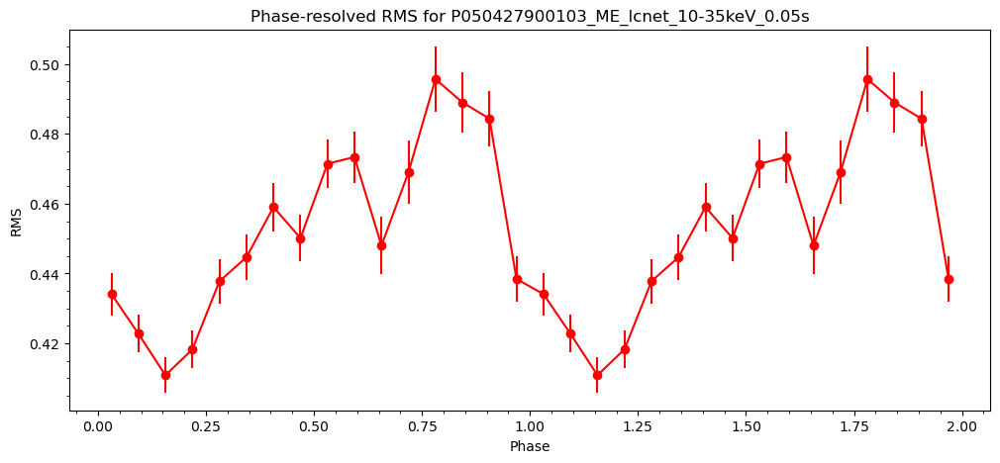

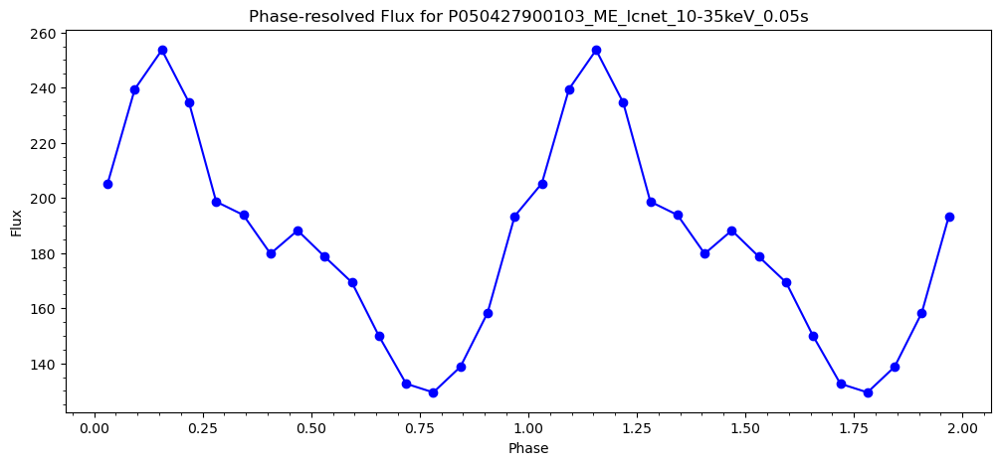

TSTART: 365147894.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900104_ME_lcnet_10-35keV_0.05s.lc
First event time: 365147894.025
Last event time: 365162263.97499996
Total duration: 14369.949999988079 seconds
raw time value: [3.65147894e+08 3.65147894e+08 3.65147894e+08 3.65147894e+08
 3.65147894e+08 3.65147894e+08 3.65147894e+08 3.65147894e+08
 3.65147894e+08 3.65147894e+08]
converted from reference epoch time:  [3.68674232e+08 3.68674232e+08 3.68674232e+08 3.68674232e+08
 3.68674232e+08 3.68674232e+08 3.68674232e+08 3.68674232e+08
 3.68674232e+08 3.68674232e+08]


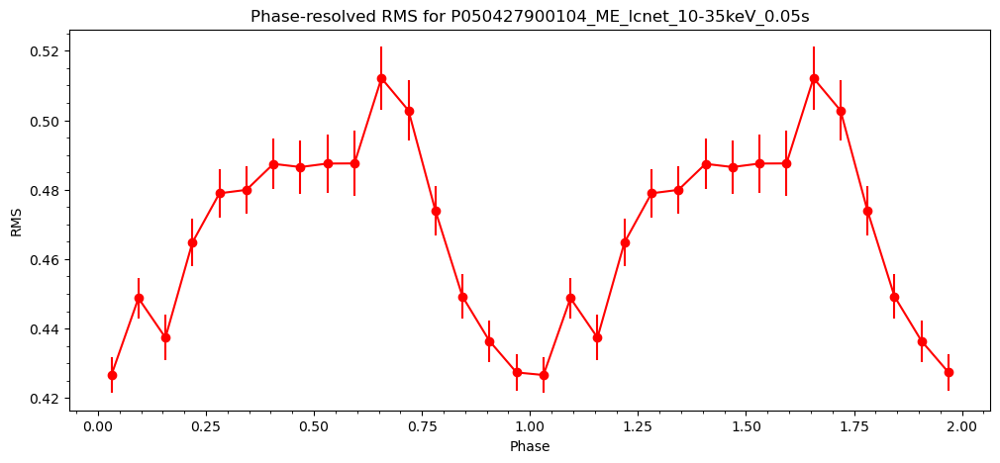

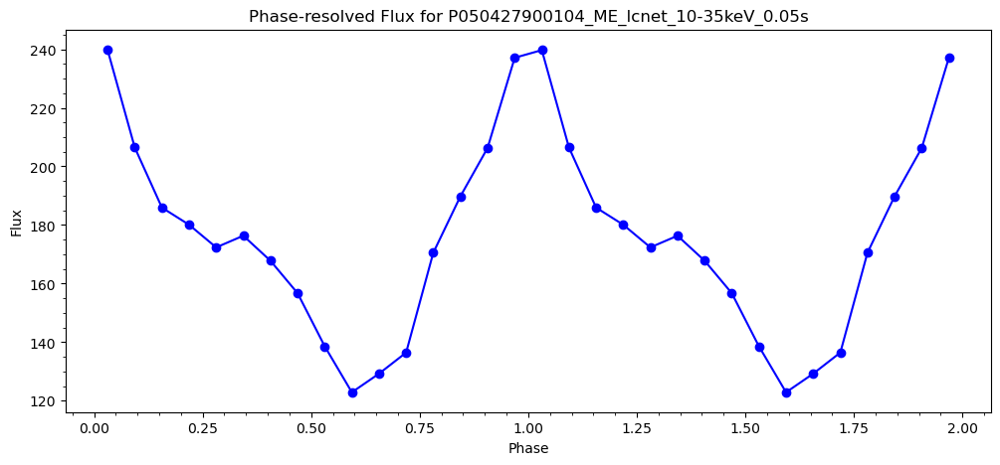

TSTART: 365245053.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600101_ME_lcnet_10-35keV_0.05s.lc
First event time: 365245053.025
Last event time: 365258672.97499996
Total duration: 13619.949999988079 seconds
raw time value: [3.65245053e+08 3.65245053e+08 3.65245053e+08 3.65245053e+08
 3.65245053e+08 3.65245053e+08 3.65245053e+08 3.65245053e+08
 3.65245053e+08 3.65245053e+08]
converted from reference epoch time:  [3.6886855e+08 3.6886855e+08 3.6886855e+08 3.6886855e+08 3.6886855e+08
 3.6886855e+08 3.6886855e+08 3.6886855e+08 3.6886855e+08 3.6886855e+08]


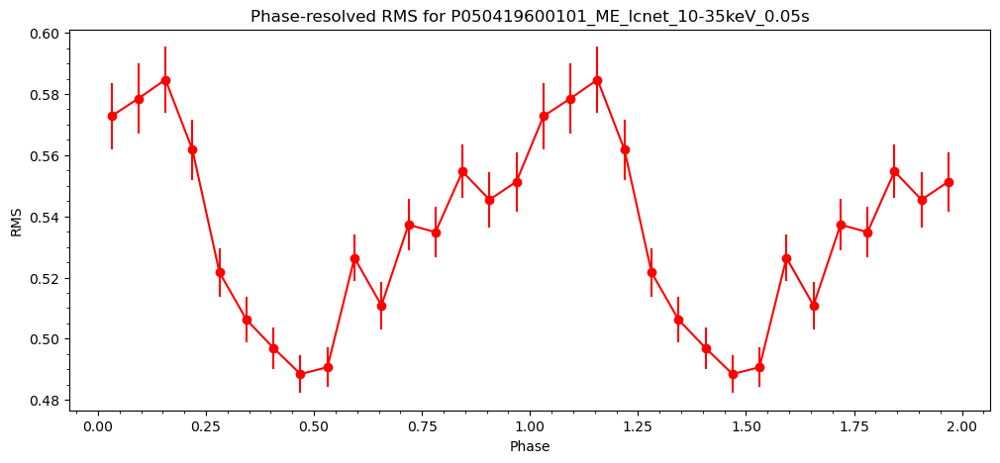

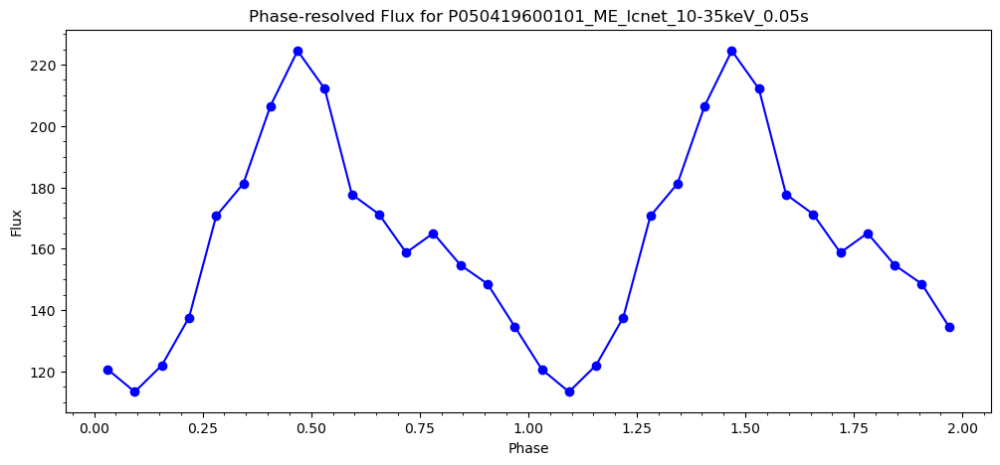

TSTART: 365262067.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600102_ME_lcnet_10-35keV_0.05s.lc
First event time: 365262067.025
Last event time: 365270346.97499996
Total duration: 8279.949999988079 seconds
raw time value: [3.65262067e+08 3.65262067e+08 3.65262067e+08 3.65262067e+08
 3.65262067e+08 3.65262067e+08 3.65262067e+08 3.65262067e+08
 3.65262067e+08 3.65262067e+08]
converted from reference epoch time:  [3.68902578e+08 3.68902578e+08 3.68902578e+08 3.68902578e+08
 3.68902578e+08 3.68902578e+08 3.68902578e+08 3.68902578e+08
 3.68902578e+08 3.68902578e+08]


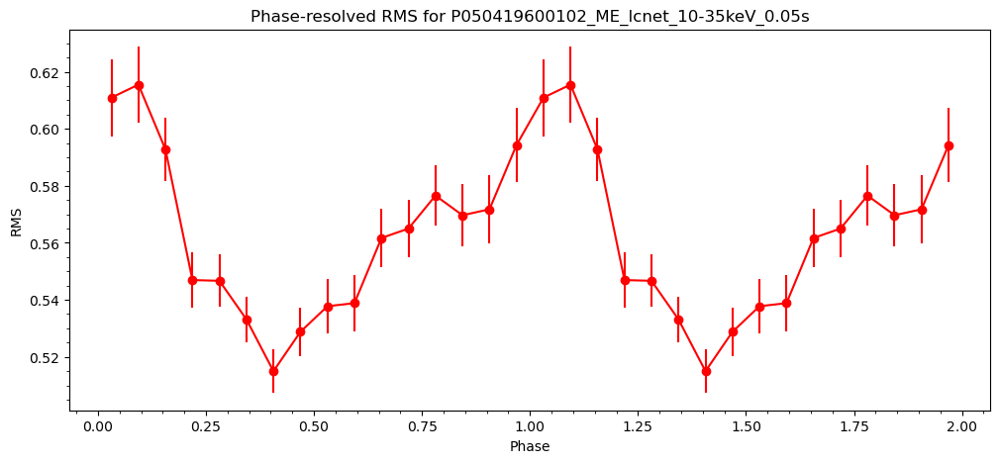

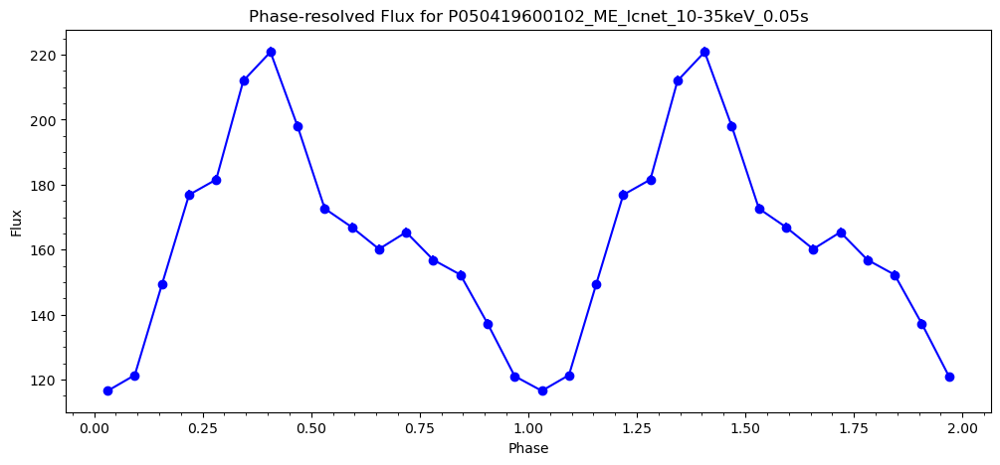

TSTART: 365273484.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600103_ME_lcnet_10-35keV_0.05s.lc
First event time: 365273484.025
Last event time: 365276693.97499996
Total duration: 3209.949999988079 seconds
raw time value: [3.65273484e+08 3.65273484e+08 3.65273484e+08 3.65273484e+08
 3.65273484e+08 3.65273484e+08 3.65273484e+08 3.65273484e+08
 3.65273484e+08 3.65273484e+08]
converted from reference epoch time:  [3.68925412e+08 3.68925412e+08 3.68925412e+08 3.68925412e+08
 3.68925412e+08 3.68925412e+08 3.68925412e+08 3.68925412e+08
 3.68925412e+08 3.68925412e+08]


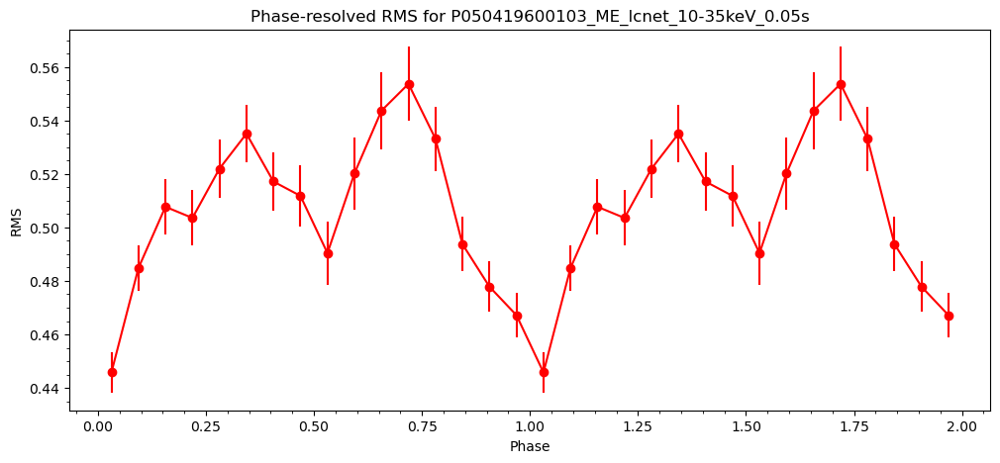

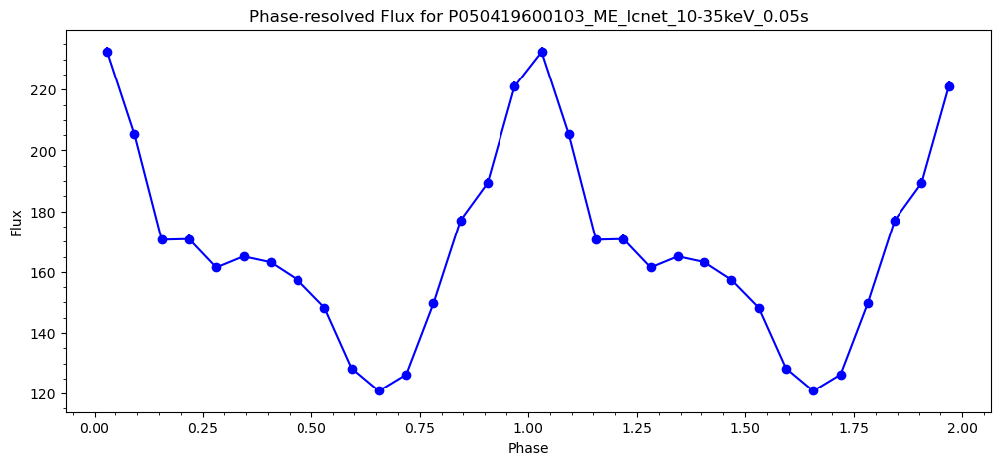

TSTART: 365347896.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600201_ME_lcnet_10-35keV_0.05s.lc
First event time: 365347896.025
Last event time: 365362325.97499996
Total duration: 14429.949999988079 seconds
raw time value: [3.65347896e+08 3.65347896e+08 3.65347896e+08 3.65347896e+08
 3.65347896e+08 3.65347896e+08 3.65347896e+08 3.65347896e+08
 3.65347896e+08 3.65347896e+08]
converted from reference epoch time:  [3.69074236e+08 3.69074236e+08 3.69074236e+08 3.69074236e+08
 3.69074236e+08 3.69074236e+08 3.69074236e+08 3.69074236e+08
 3.69074236e+08 3.69074236e+08]


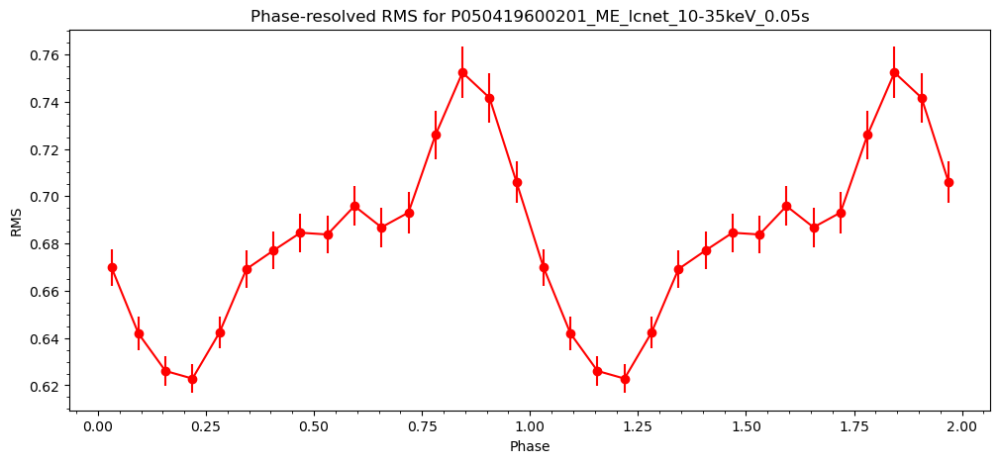

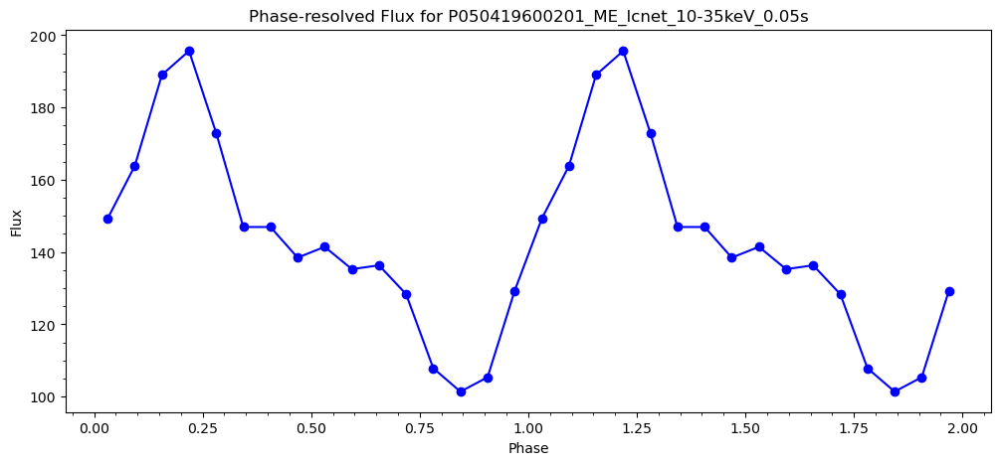

TSTART: 365364819.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600202_ME_lcnet_10-35keV_0.05s.lc
First event time: 365364819.025
Last event time: 365379458.97499996
Total duration: 14639.949999988079 seconds
raw time value: [3.65364819e+08 3.65364819e+08 3.65364819e+08 3.65364819e+08
 3.65364819e+08 3.65364819e+08 3.65364819e+08 3.65364819e+08
 3.65364819e+08 3.65364819e+08]
converted from reference epoch time:  [3.69108082e+08 3.69108082e+08 3.69108082e+08 3.69108082e+08
 3.69108082e+08 3.69108082e+08 3.69108082e+08 3.69108082e+08
 3.69108082e+08 3.69108082e+08]


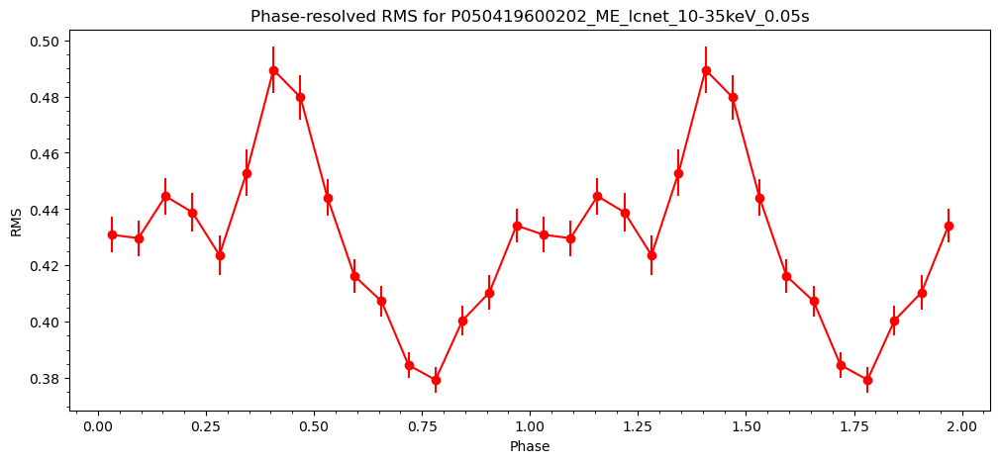

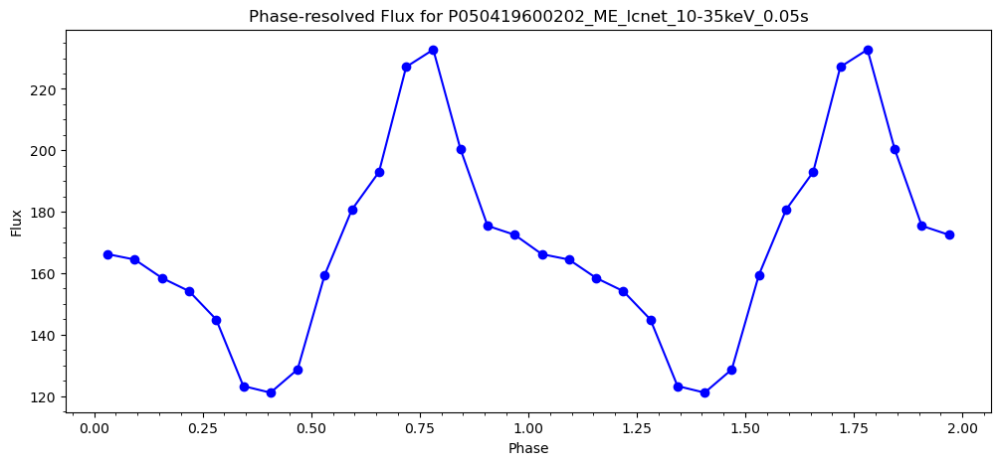

TSTART: 365416502.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600301_ME_lcnet_10-35keV_0.05s.lc
First event time: 365416502.025
Last event time: 365428231.97499996
Total duration: 11729.949999988079 seconds
raw time value: [3.65416502e+08 3.65416502e+08 3.65416502e+08 3.65416502e+08
 3.65416502e+08 3.65416502e+08 3.65416502e+08 3.65416502e+08
 3.65416502e+08 3.65416502e+08]
converted from reference epoch time:  [3.69211448e+08 3.69211448e+08 3.69211448e+08 3.69211448e+08
 3.69211448e+08 3.69211448e+08 3.69211448e+08 3.69211448e+08
 3.69211448e+08 3.69211448e+08]


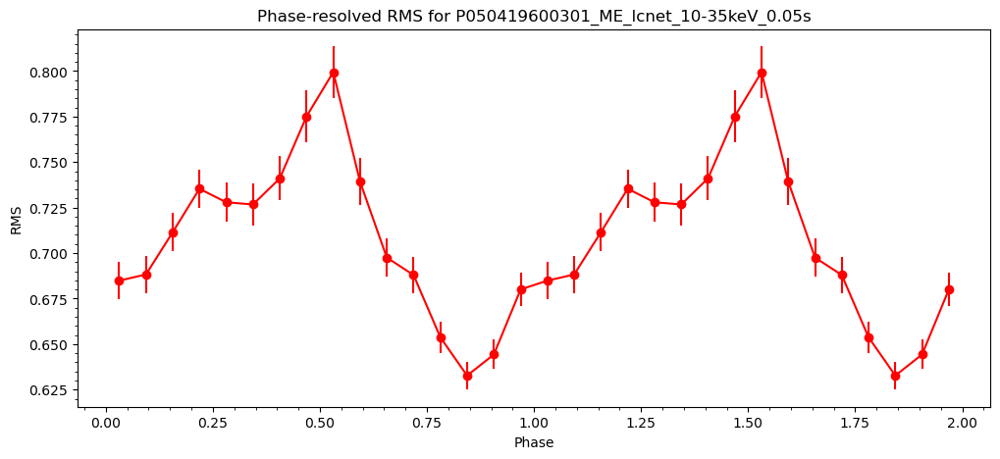

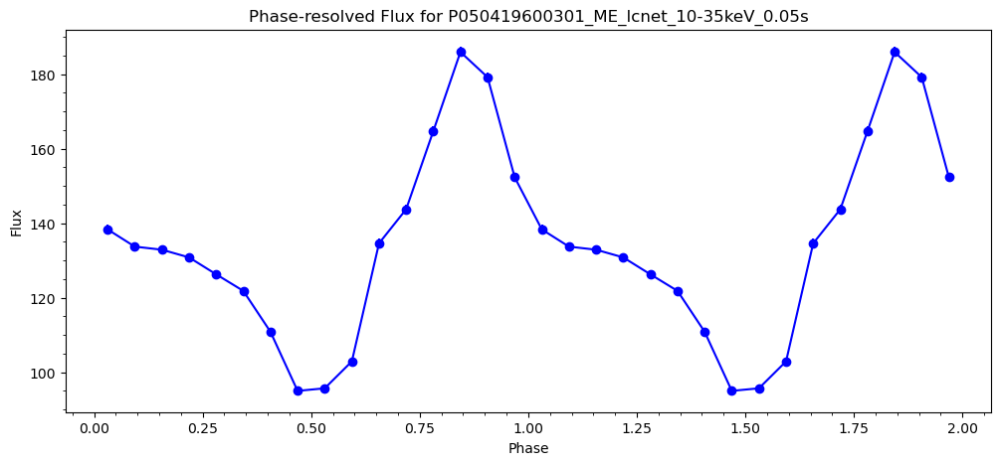

TSTART: 365433319.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600302_ME_lcnet_10-35keV_0.05s.lc
First event time: 365433319.025
Last event time: 365441598.97499996
Total duration: 8279.949999988079 seconds
raw time value: [3.65433319e+08 3.65433319e+08 3.65433319e+08 3.65433319e+08
 3.65433319e+08 3.65433319e+08 3.65433319e+08 3.65433319e+08
 3.65433319e+08 3.65433319e+08]
converted from reference epoch time:  [3.69245082e+08 3.69245082e+08 3.69245082e+08 3.69245082e+08
 3.69245082e+08 3.69245082e+08 3.69245082e+08 3.69245082e+08
 3.69245082e+08 3.69245082e+08]


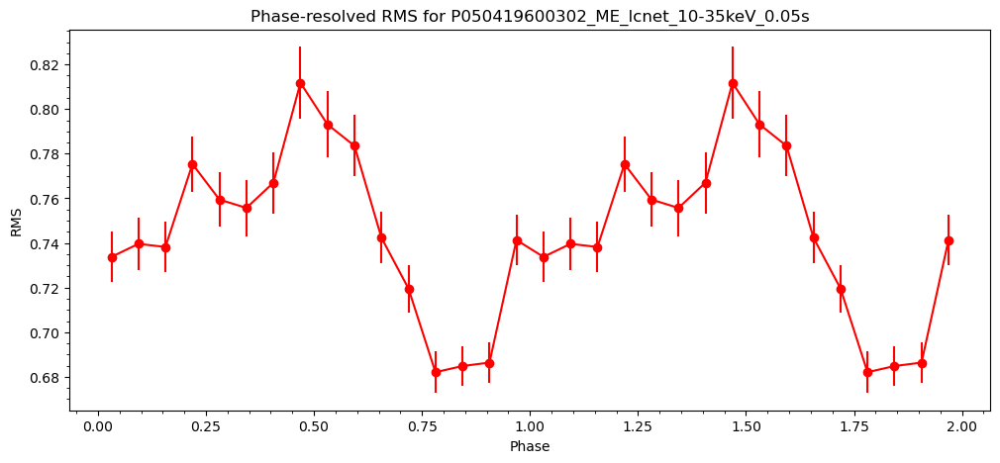

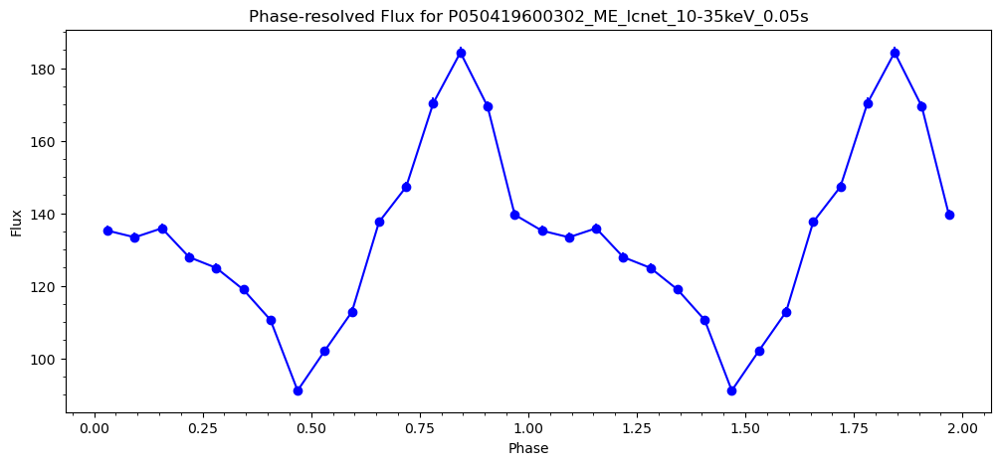

TSTART: 365444757.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600303_ME_lcnet_10-35keV_0.05s.lc
First event time: 365444757.025
Last event time: 365453666.97499996
Total duration: 8909.949999988079 seconds
raw time value: [3.65444757e+08 3.65444757e+08 3.65444757e+08 3.65444757e+08
 3.65444757e+08 3.65444757e+08 3.65444757e+08 3.65444757e+08
 3.65444757e+08 3.65444757e+08]
converted from reference epoch time:  [3.69267958e+08 3.69267958e+08 3.69267958e+08 3.69267958e+08
 3.69267958e+08 3.69267958e+08 3.69267958e+08 3.69267958e+08
 3.69267958e+08 3.69267958e+08]


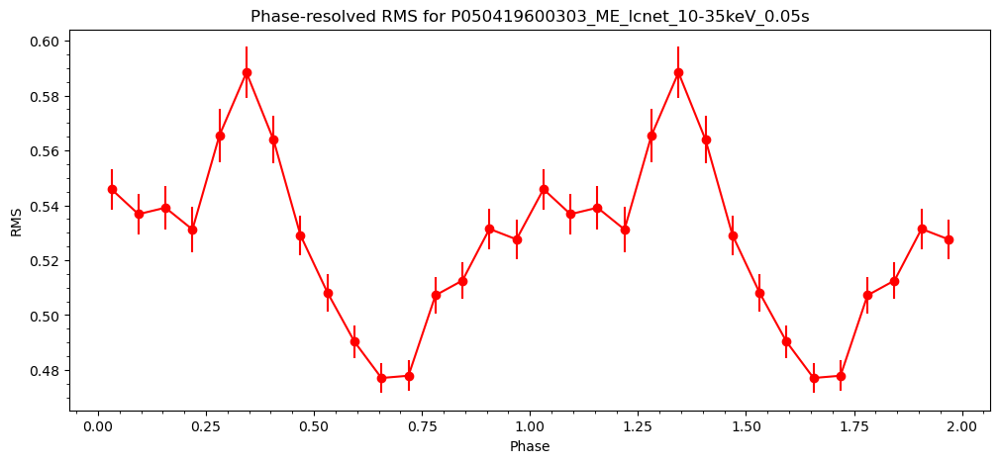

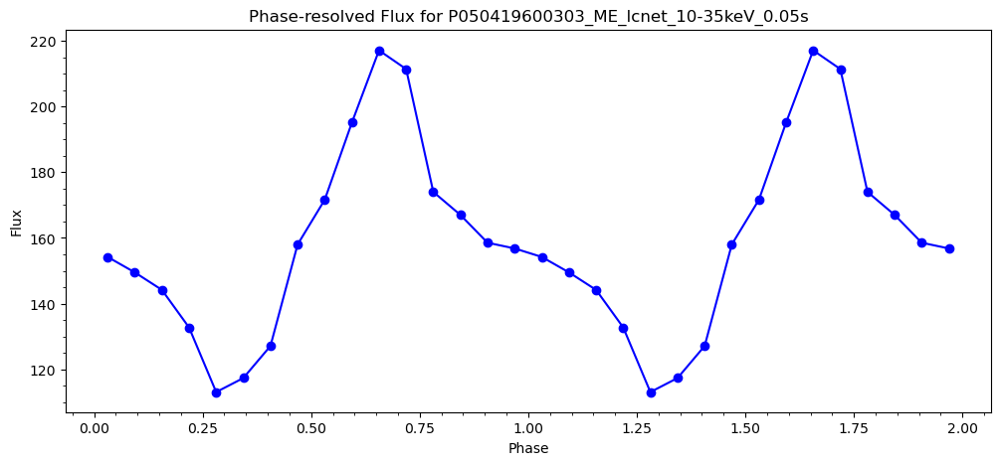

TSTART: 365513713.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600401_ME_lcnet_10-35keV_0.05s.lc
First event time: 365513713.025
Last event time: 365527302.97499996
Total duration: 13589.949999988079 seconds
raw time value: [3.65513713e+08 3.65513713e+08 3.65513713e+08 3.65513713e+08
 3.65513713e+08 3.65513713e+08 3.65513713e+08 3.65513713e+08
 3.65513713e+08 3.65513713e+08]
converted from reference epoch time:  [3.6940587e+08 3.6940587e+08 3.6940587e+08 3.6940587e+08 3.6940587e+08
 3.6940587e+08 3.6940587e+08 3.6940587e+08 3.6940587e+08 3.6940587e+08]


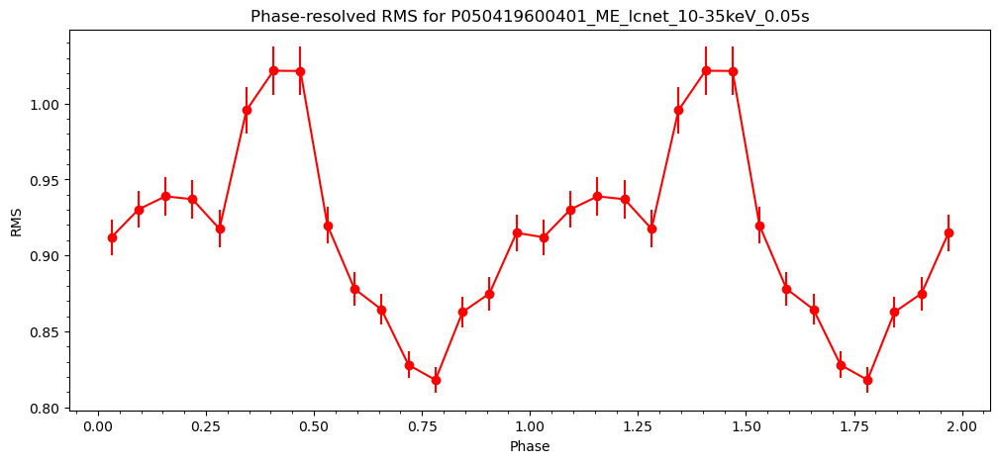

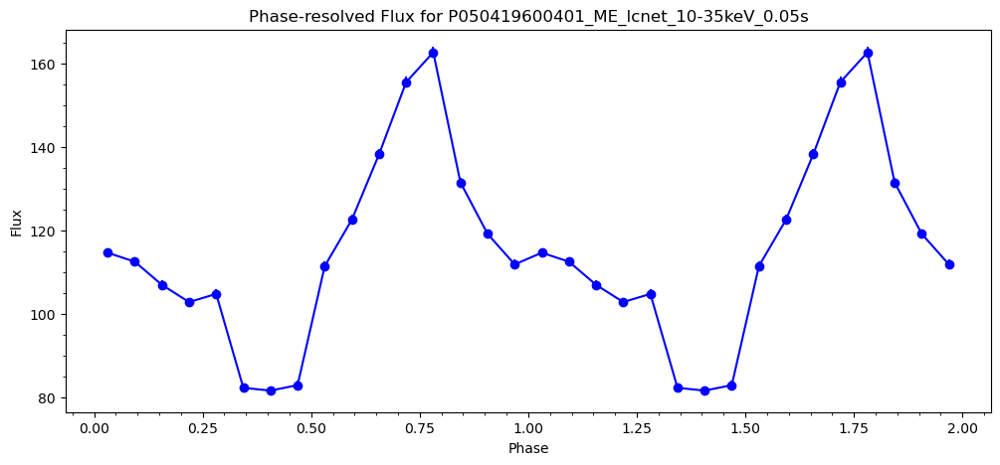

TSTART: 365530407.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600402_ME_lcnet_10-35keV_0.05s.lc
First event time: 365530407.025
Last event time: 365539316.97499996
Total duration: 8909.949999988079 seconds
raw time value: [3.65530407e+08 3.65530407e+08 3.65530407e+08 3.65530407e+08
 3.65530407e+08 3.65530407e+08 3.65530407e+08 3.65530407e+08
 3.65530407e+08 3.65530407e+08]
converted from reference epoch time:  [3.69439258e+08 3.69439258e+08 3.69439258e+08 3.69439258e+08
 3.69439258e+08 3.69439258e+08 3.69439258e+08 3.69439258e+08
 3.69439258e+08 3.69439258e+08]


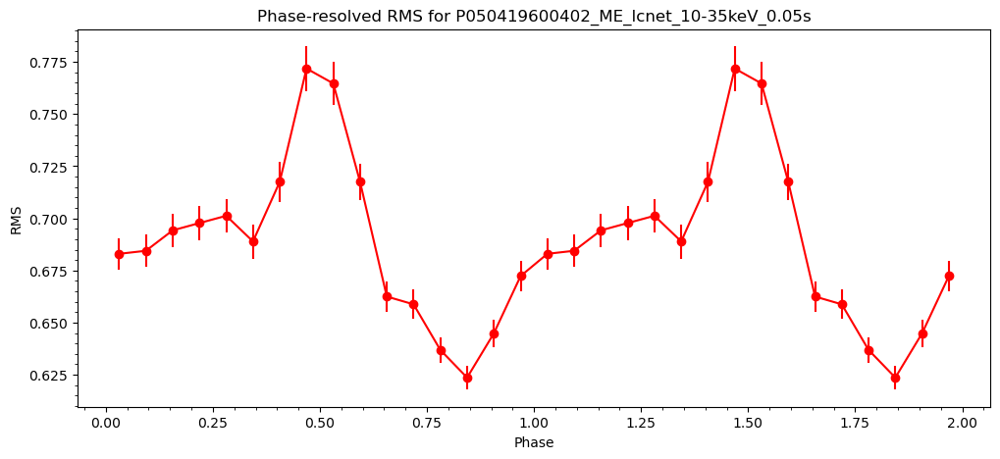

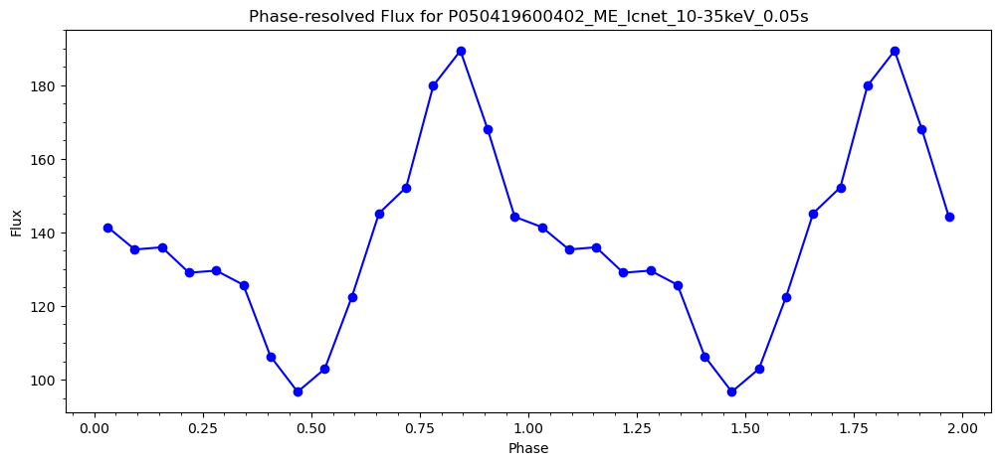

TSTART: 365541933.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600403_ME_lcnet_10-35keV_0.05s.lc
First event time: 365541933.025
Last event time: 365545022.97499996
Total duration: 3089.949999988079 seconds
raw time value: [3.65541933e+08 3.65541933e+08 3.65541933e+08 3.65541933e+08
 3.65541933e+08 3.65541933e+08 3.65541933e+08 3.65541933e+08
 3.65541933e+08 3.65541933e+08]
converted from reference epoch time:  [3.6946231e+08 3.6946231e+08 3.6946231e+08 3.6946231e+08 3.6946231e+08
 3.6946231e+08 3.6946231e+08 3.6946231e+08 3.6946231e+08 3.6946231e+08]


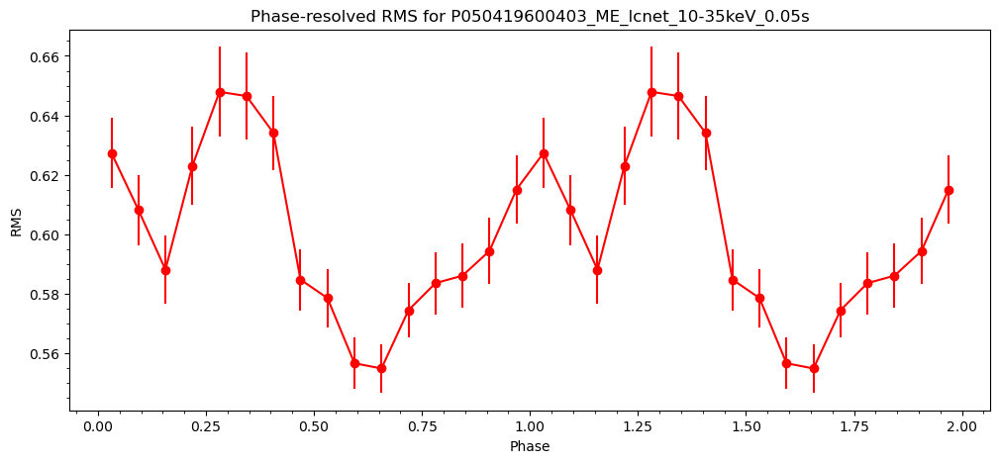

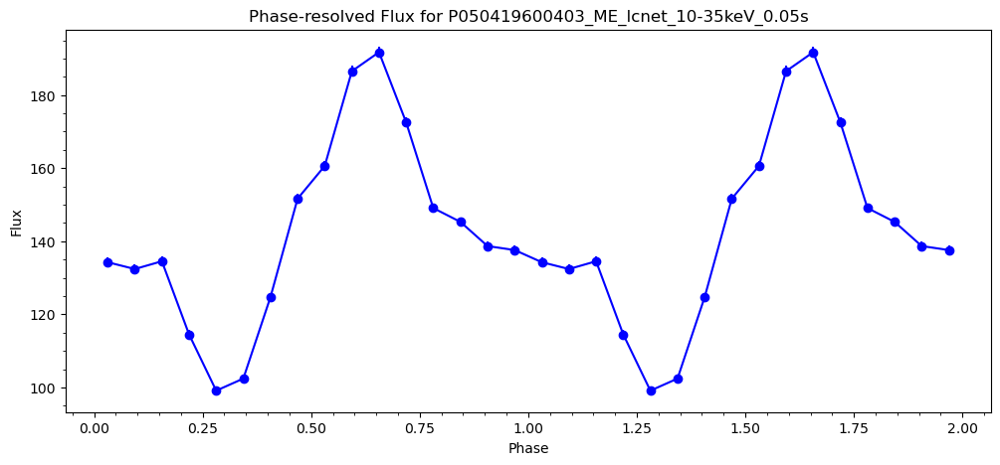

TSTART: 365606823.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600501_ME_lcnet_10-35keV_0.05s.lc
First event time: 365606823.025
Last event time: 365619212.97499996
Total duration: 12389.949999988079 seconds
raw time value: [3.65606823e+08 3.65606823e+08 3.65606823e+08 3.65606823e+08
 3.65606823e+08 3.65606823e+08 3.65606823e+08 3.65606823e+08
 3.65606823e+08 3.65606823e+08]
converted from reference epoch time:  [3.6959209e+08 3.6959209e+08 3.6959209e+08 3.6959209e+08 3.6959209e+08
 3.6959209e+08 3.6959209e+08 3.6959209e+08 3.6959209e+08 3.6959209e+08]


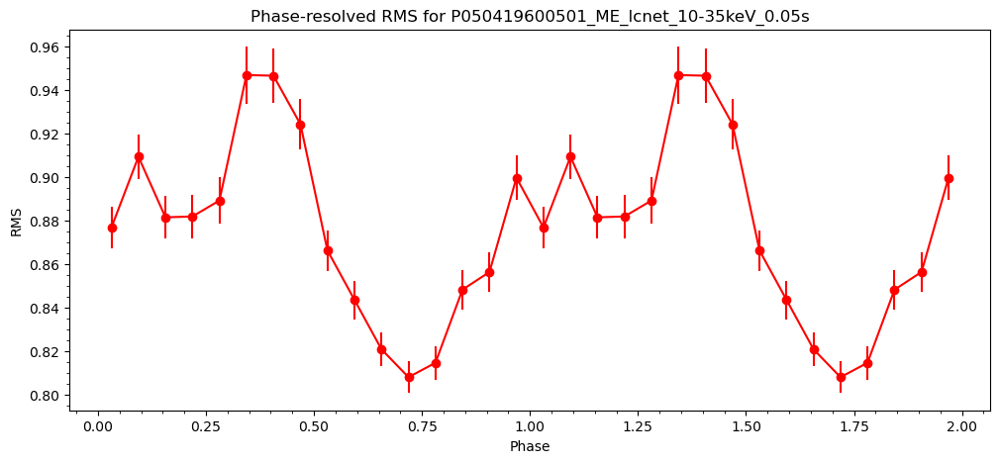

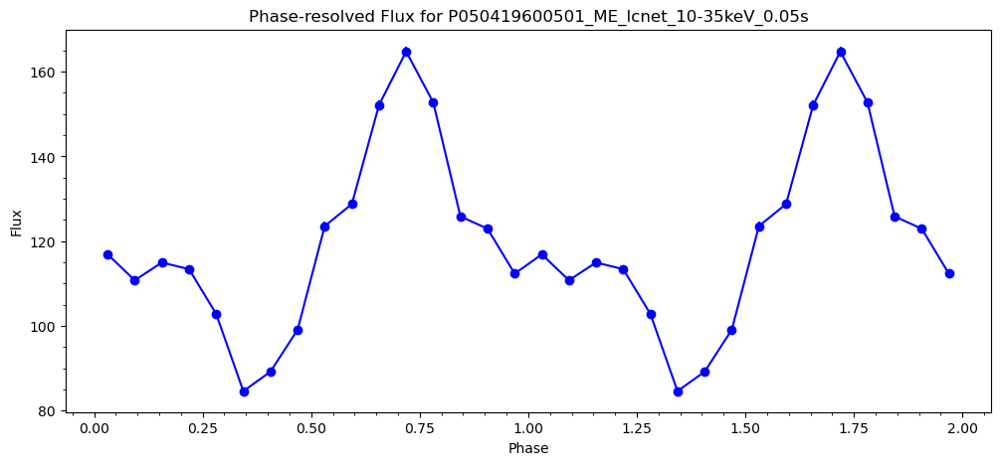

TSTART: 365621899.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600502_ME_lcnet_10-35keV_0.05s.lc
First event time: 365621899.025
Last event time: 365630598.97499996
Total duration: 8699.949999988079 seconds
raw time value: [3.65621899e+08 3.65621899e+08 3.65621899e+08 3.65621899e+08
 3.65621899e+08 3.65621899e+08 3.65621899e+08 3.65621899e+08
 3.65621899e+08 3.65621899e+08]
converted from reference epoch time:  [3.69622242e+08 3.69622242e+08 3.69622242e+08 3.69622242e+08
 3.69622242e+08 3.69622242e+08 3.69622242e+08 3.69622242e+08
 3.69622242e+08 3.69622242e+08]


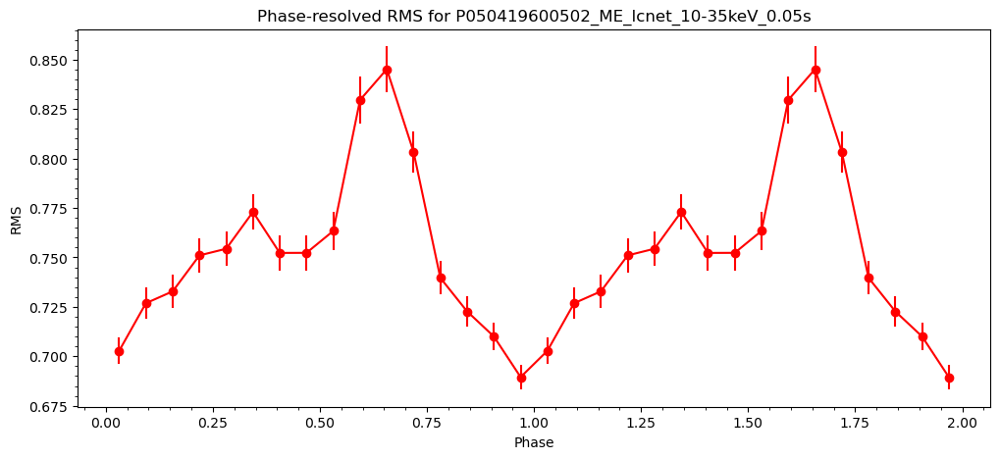

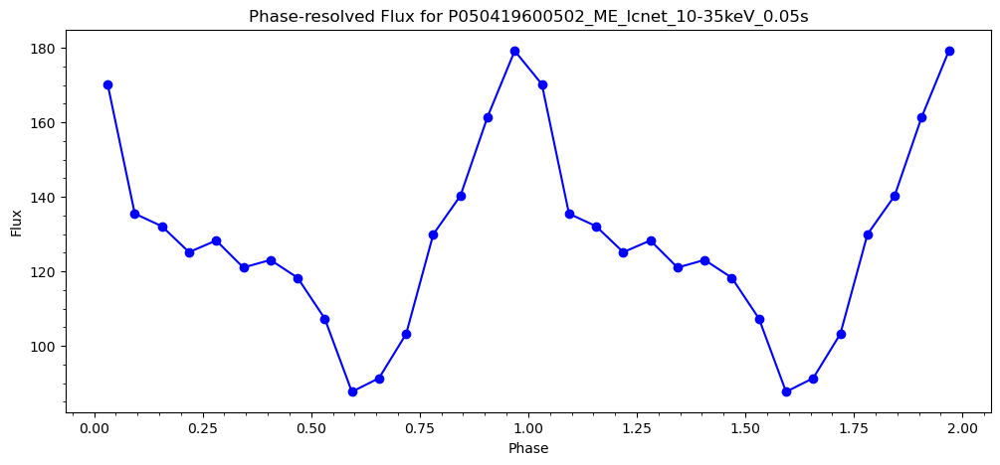

TSTART: 365708757.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600601_ME_lcnet_10-35keV_0.05s.lc
First event time: 365708757.025
Last event time: 365721806.97499996
Total duration: 13049.949999988079 seconds
raw time value: [3.65708757e+08 3.65708757e+08 3.65708757e+08 3.65708757e+08
 3.65708757e+08 3.65708757e+08 3.65708757e+08 3.65708757e+08
 3.65708757e+08 3.65708757e+08]
converted from reference epoch time:  [3.69795958e+08 3.69795958e+08 3.69795958e+08 3.69795958e+08
 3.69795958e+08 3.69795958e+08 3.69795958e+08 3.69795958e+08
 3.69795958e+08 3.69795958e+08]


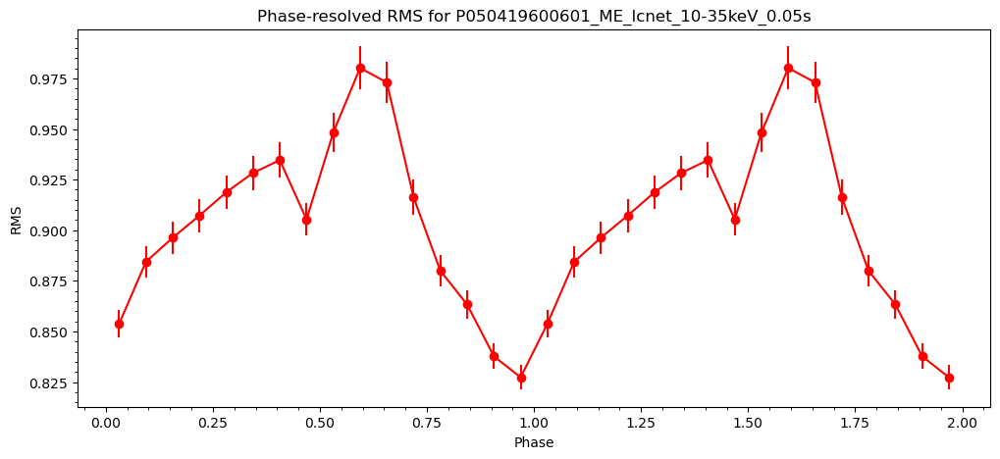

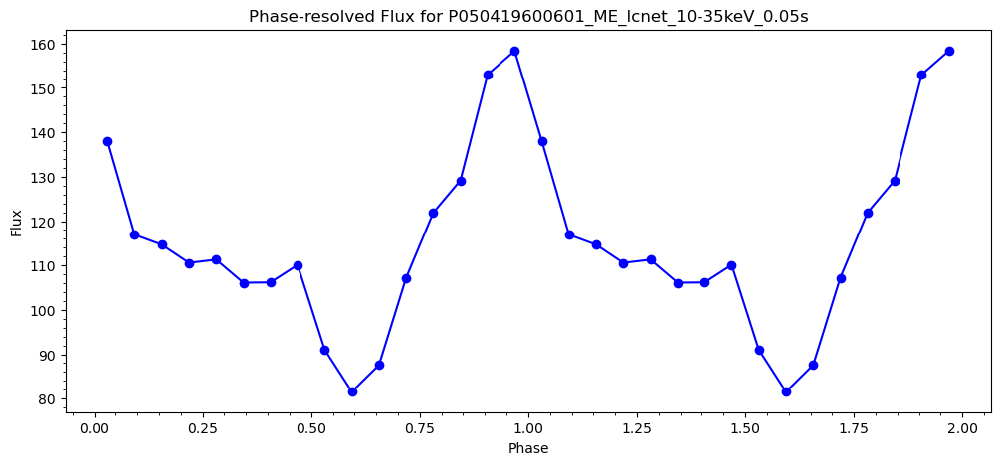

TSTART: 365724753.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600602_ME_lcnet_10-35keV_0.05s.lc
First event time: 365724753.025
Last event time: 365733152.97499996
Total duration: 8399.949999988079 seconds
raw time value: [3.65724753e+08 3.65724753e+08 3.65724753e+08 3.65724753e+08
 3.65724753e+08 3.65724753e+08 3.65724753e+08 3.65724753e+08
 3.65724753e+08 3.65724753e+08]
converted from reference epoch time:  [3.6982795e+08 3.6982795e+08 3.6982795e+08 3.6982795e+08 3.6982795e+08
 3.6982795e+08 3.6982795e+08 3.6982795e+08 3.6982795e+08 3.6982795e+08]


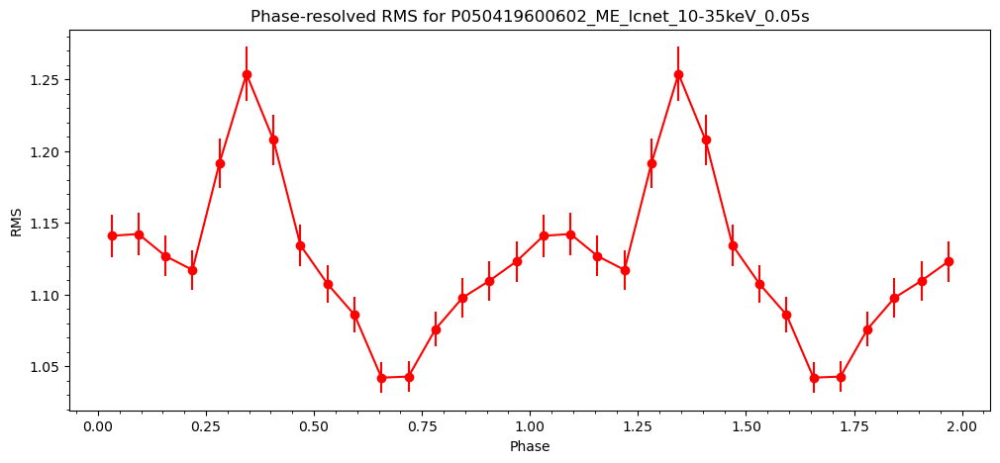

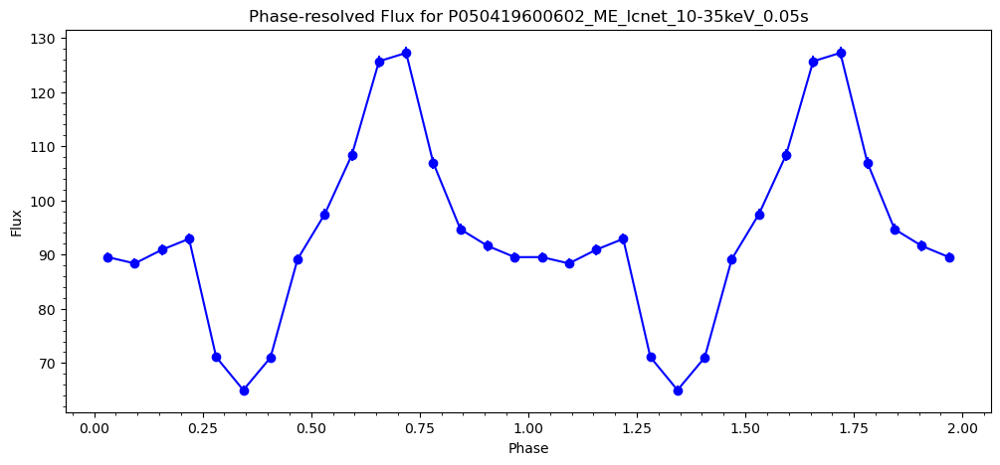

TSTART: 365735838.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600603_ME_lcnet_10-35keV_0.05s.lc
First event time: 365735838.025
Last event time: 365738897.97499996
Total duration: 3059.949999988079 seconds
raw time value: [3.65735838e+08 3.65735838e+08 3.65735838e+08 3.65735838e+08
 3.65735838e+08 3.65735838e+08 3.65735838e+08 3.65735838e+08
 3.65735838e+08 3.65735838e+08]
converted from reference epoch time:  [3.6985012e+08 3.6985012e+08 3.6985012e+08 3.6985012e+08 3.6985012e+08
 3.6985012e+08 3.6985012e+08 3.6985012e+08 3.6985012e+08 3.6985012e+08]


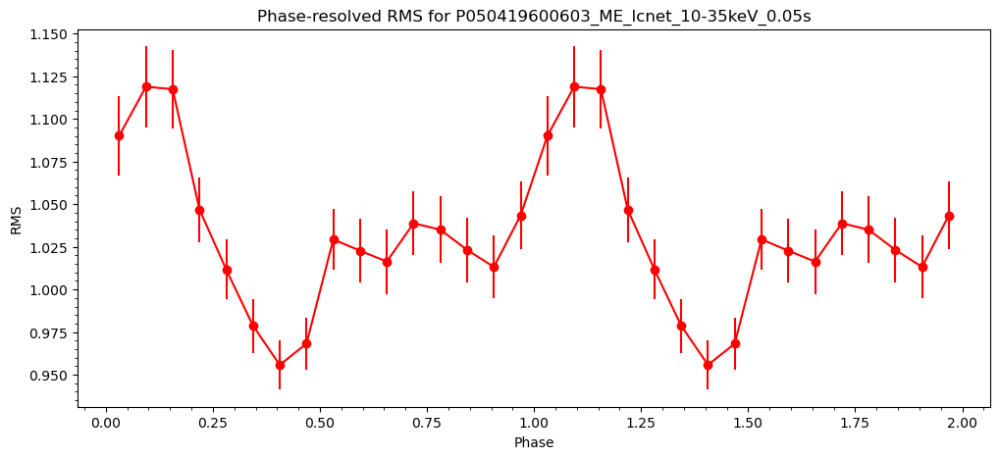

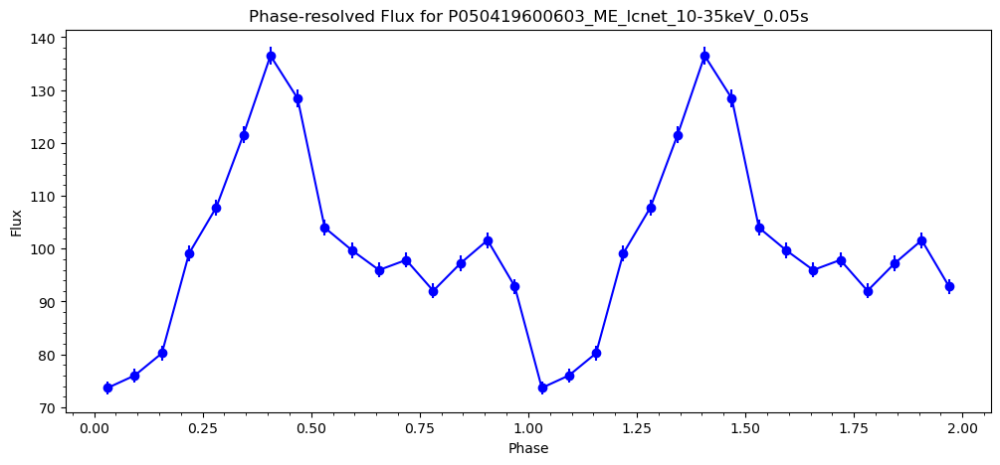

TSTART: 365811569.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600701_ME_lcnet_10-35keV_0.05s.lc
First event time: 365811569.025
Last event time: 365824438.97499996
Total duration: 12869.949999988079 seconds
raw time value: [3.65811569e+08 3.65811569e+08 3.65811569e+08 3.65811569e+08
 3.65811569e+08 3.65811569e+08 3.65811569e+08 3.65811569e+08
 3.65811569e+08 3.65811569e+08]
converted from reference epoch time:  [3.70001582e+08 3.70001582e+08 3.70001582e+08 3.70001582e+08
 3.70001582e+08 3.70001582e+08 3.70001582e+08 3.70001582e+08
 3.70001582e+08 3.70001582e+08]


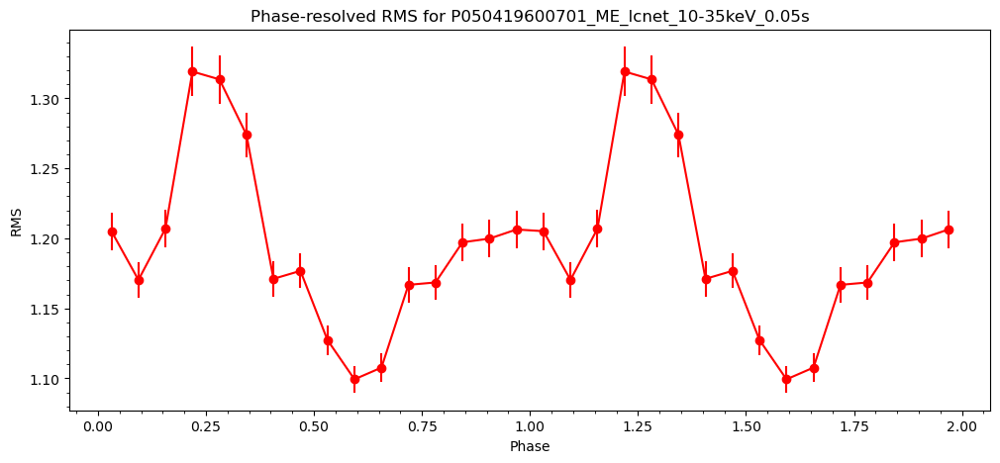

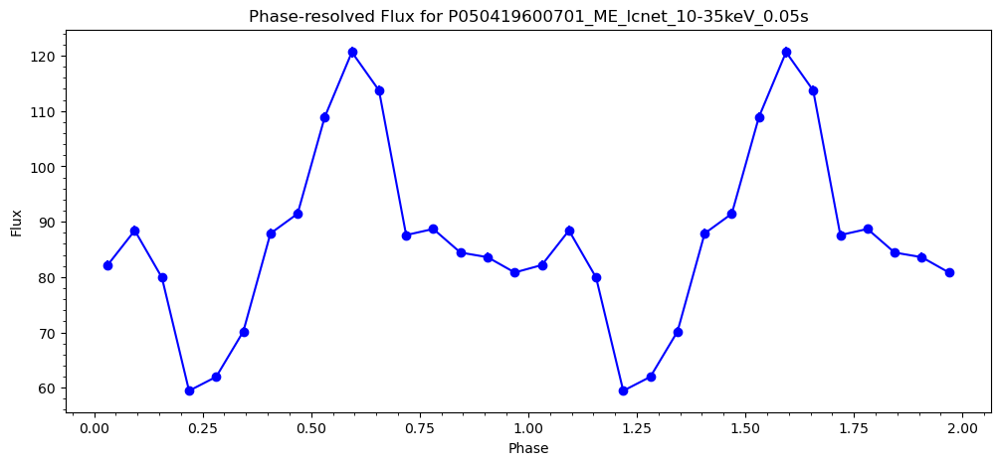

TSTART: 365828764.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600702_ME_lcnet_10-35keV_0.05s.lc
First event time: 365828764.025
Last event time: 365835843.97499996
Total duration: 7079.949999988079 seconds
raw time value: [3.65828764e+08 3.65828764e+08 3.65828764e+08 3.65828764e+08
 3.65828764e+08 3.65828764e+08 3.65828764e+08 3.65828764e+08
 3.65828764e+08 3.65828764e+08]
converted from reference epoch time:  [3.70035972e+08 3.70035972e+08 3.70035972e+08 3.70035972e+08
 3.70035972e+08 3.70035972e+08 3.70035972e+08 3.70035972e+08
 3.70035972e+08 3.70035972e+08]


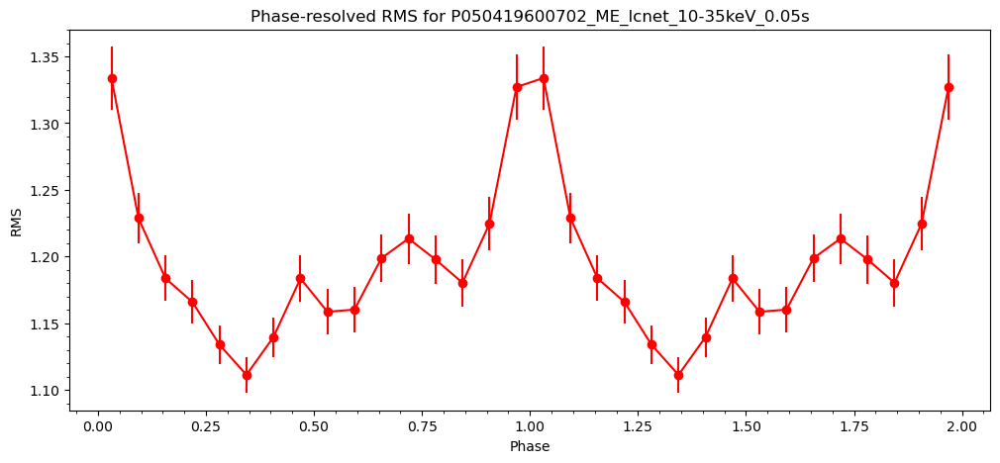

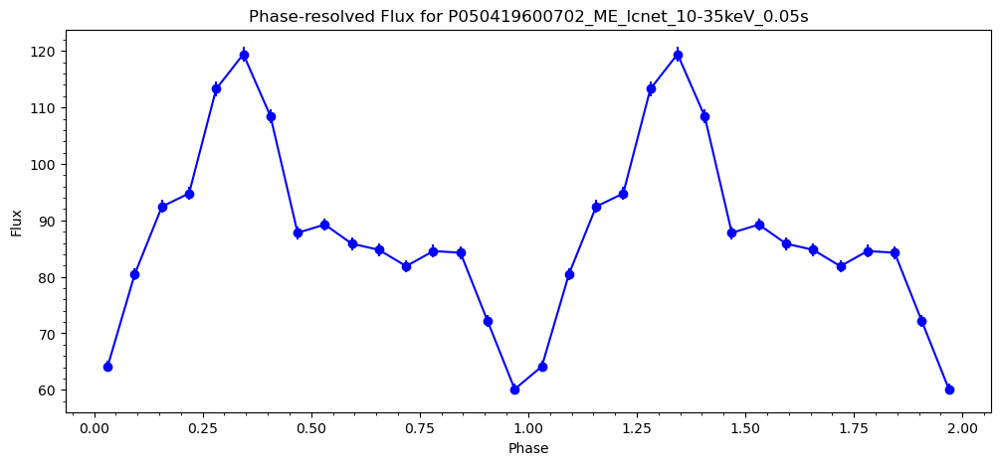

TSTART: 365838718.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600703_ME_lcnet_10-35keV_0.05s.lc
First event time: 365838718.025
Last event time: 365844597.97499996
Total duration: 5879.949999988079 seconds
raw time value: [3.65838718e+08 3.65838718e+08 3.65838718e+08 3.65838718e+08
 3.65838718e+08 3.65838718e+08 3.65838718e+08 3.65838718e+08
 3.65838718e+08 3.65838718e+08]
converted from reference epoch time:  [3.7005588e+08 3.7005588e+08 3.7005588e+08 3.7005588e+08 3.7005588e+08
 3.7005588e+08 3.7005588e+08 3.7005588e+08 3.7005588e+08 3.7005588e+08]


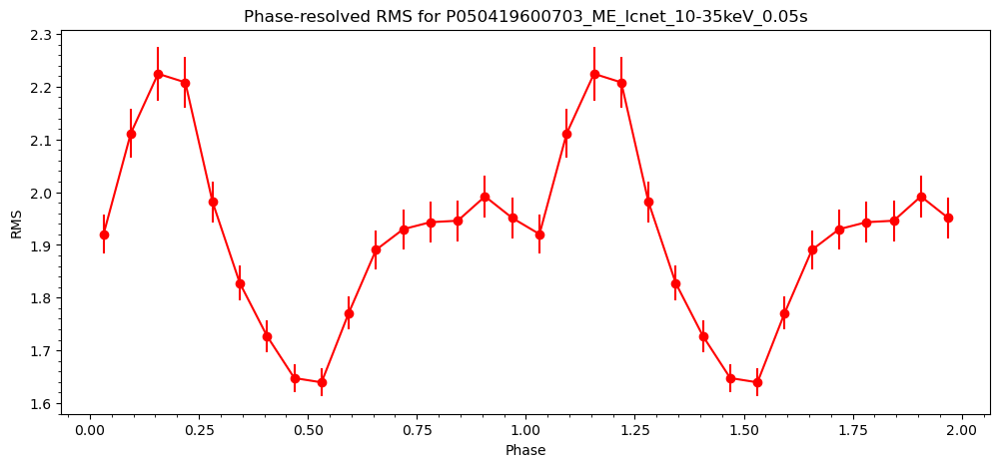

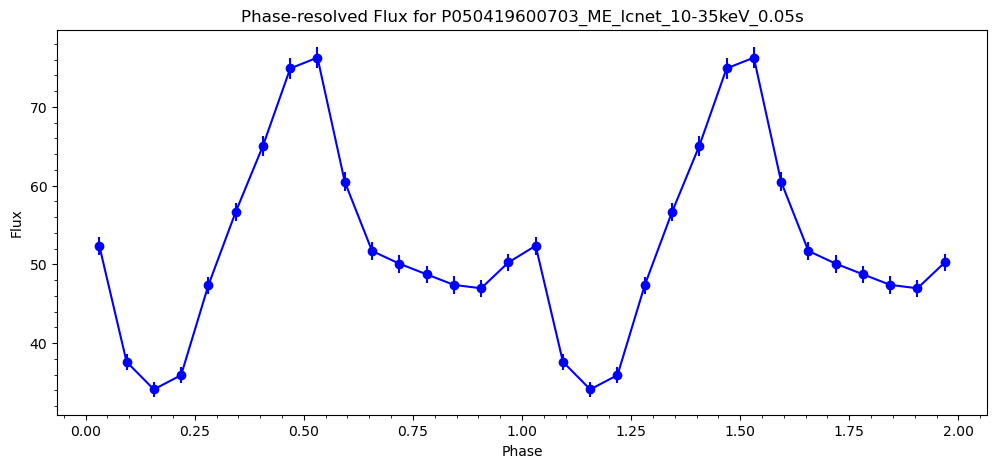

TSTART: 365880039.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196008/pipeline_output/P050419600801_ME_lcnet_10-35keV_0.05s.lc
First event time: 365880039.025
Last event time: 365892968.97499996
Total duration: 12929.949999988079 seconds
raw time value: [3.65880039e+08 3.65880039e+08 3.65880039e+08 3.65880039e+08
 3.65880039e+08 3.65880039e+08 3.65880039e+08 3.65880039e+08
 3.65880039e+08 3.65880039e+08]
converted from reference epoch time:  [3.70138522e+08 3.70138522e+08 3.70138522e+08 3.70138522e+08
 3.70138522e+08 3.70138522e+08 3.70138522e+08 3.70138522e+08
 3.70138522e+08 3.70138522e+08]


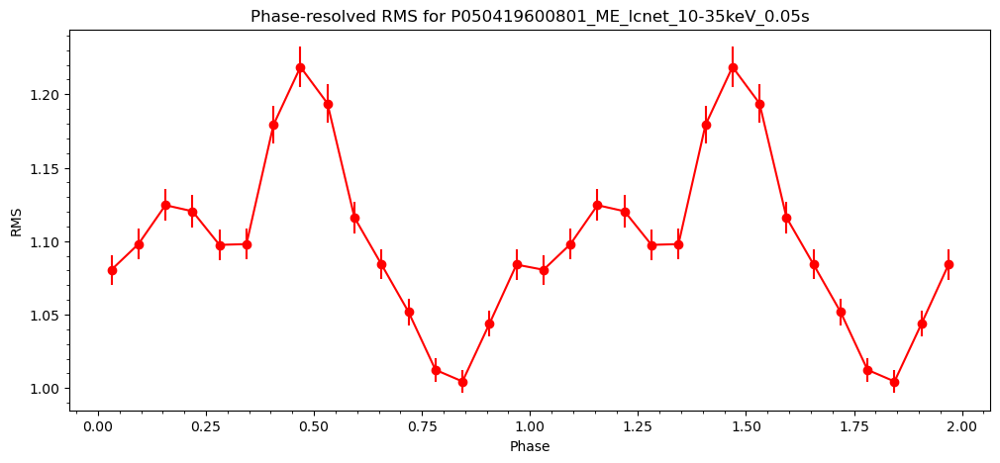

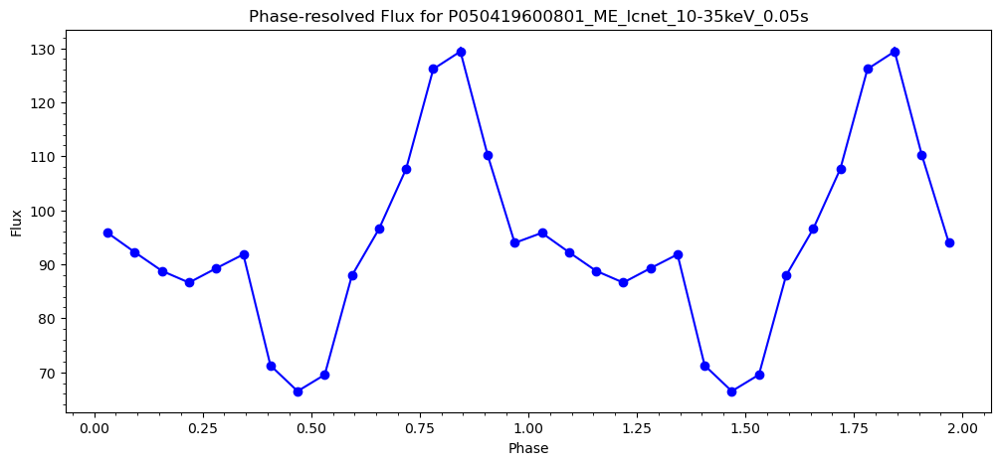

TSTART: 365895983.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196008/pipeline_output/P050419600802_ME_lcnet_10-35keV_0.05s.lc
First event time: 365895983.025
Last event time: 365904322.97499996
Total duration: 8339.949999988079 seconds
raw time value: [3.65895983e+08 3.65895983e+08 3.65895983e+08 3.65895983e+08
 3.65895983e+08 3.65895983e+08 3.65895983e+08 3.65895983e+08
 3.65895983e+08 3.65895983e+08]
converted from reference epoch time:  [3.7017041e+08 3.7017041e+08 3.7017041e+08 3.7017041e+08 3.7017041e+08
 3.7017041e+08 3.7017041e+08 3.7017041e+08 3.7017041e+08 3.7017041e+08]


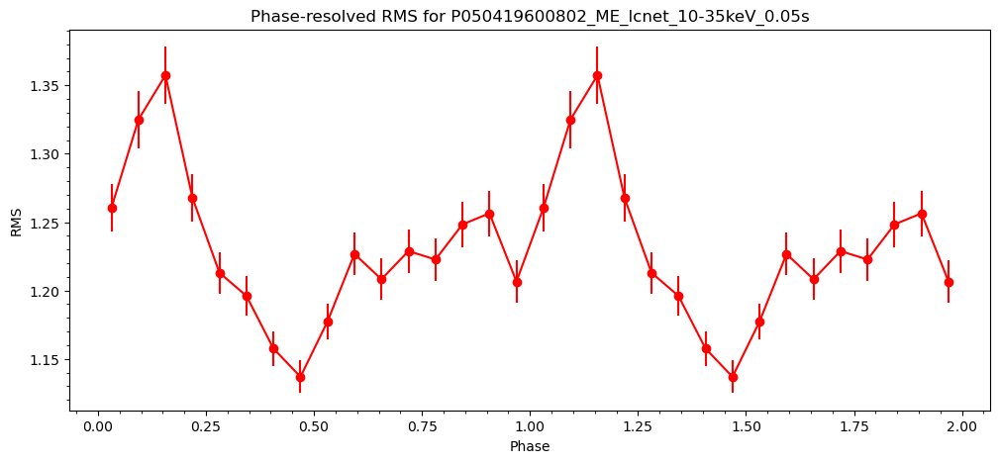

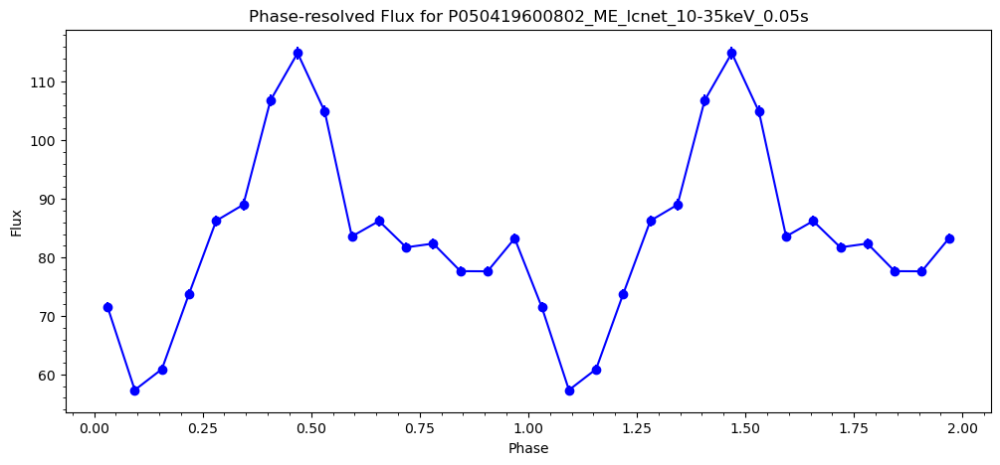

TSTART: 365982864.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600901_ME_lcnet_10-35keV_0.05s.lc
First event time: 365982864.025
Last event time: 365995613.97499996
Total duration: 12749.949999988079 seconds
raw time value: [3.65982864e+08 3.65982864e+08 3.65982864e+08 3.65982864e+08
 3.65982864e+08 3.65982864e+08 3.65982864e+08 3.65982864e+08
 3.65982864e+08 3.65982864e+08]
converted from reference epoch time:  [3.70344172e+08 3.70344172e+08 3.70344172e+08 3.70344172e+08
 3.70344172e+08 3.70344172e+08 3.70344172e+08 3.70344172e+08
 3.70344172e+08 3.70344172e+08]


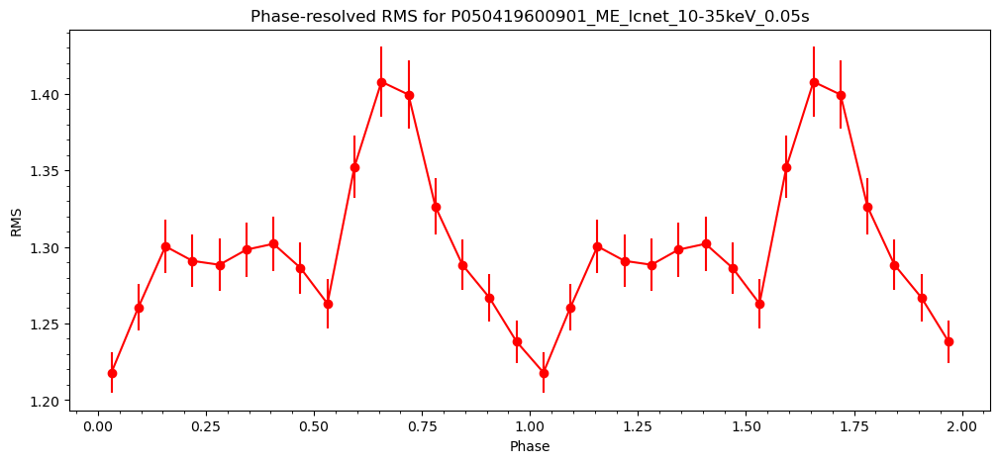

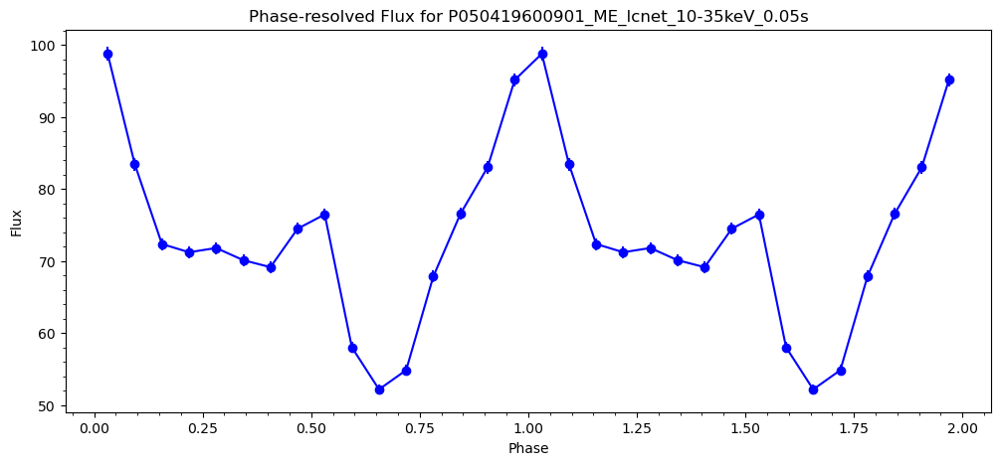

TSTART: 365999956.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600902_ME_lcnet_10-35keV_0.05s.lc
First event time: 365999956.025
Last event time: 366007005.97499996
Total duration: 7049.949999988079 seconds
raw time value: [3.65999956e+08 3.65999956e+08 3.65999956e+08 3.65999956e+08
 3.65999956e+08 3.65999956e+08 3.65999956e+08 3.65999956e+08
 3.65999956e+08 3.65999956e+08]
converted from reference epoch time:  [3.70378356e+08 3.70378356e+08 3.70378356e+08 3.70378356e+08
 3.70378356e+08 3.70378356e+08 3.70378356e+08 3.70378356e+08
 3.70378356e+08 3.70378356e+08]


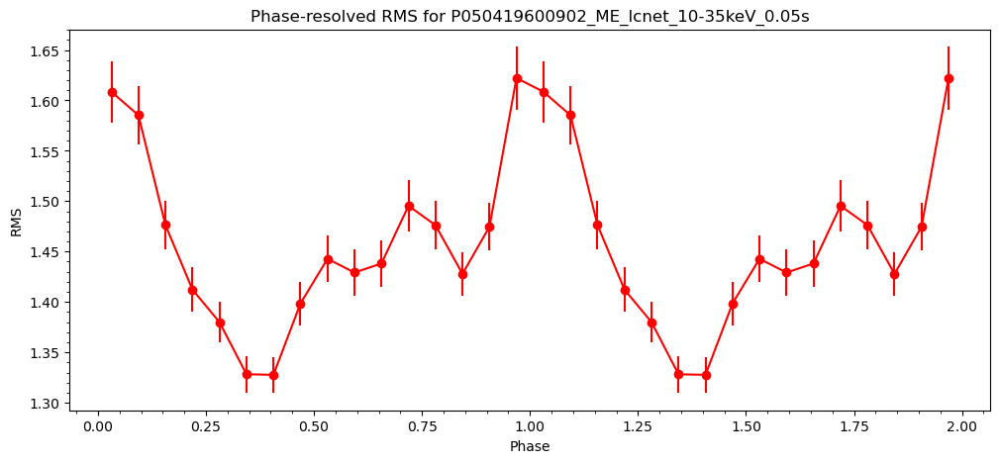

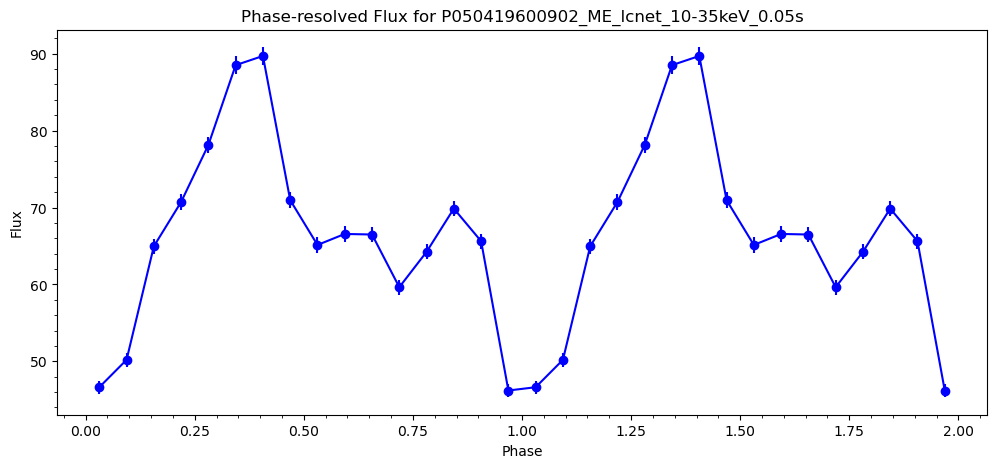

TSTART: 366171277.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196010/pipeline_output/P050419601001_ME_lcnet_10-35keV_0.05s.lc
First event time: 366171277.025
Last event time: 366183216.97499996
Total duration: 11939.949999988079 seconds
raw time value: [3.66171277e+08 3.66171277e+08 3.66171277e+08 3.66171277e+08
 3.66171277e+08 3.66171277e+08 3.66171277e+08 3.66171277e+08
 3.66171277e+08 3.66171277e+08]
converted from reference epoch time:  [3.70720998e+08 3.70720998e+08 3.70720998e+08 3.70720998e+08
 3.70720998e+08 3.70720998e+08 3.70720998e+08 3.70720998e+08
 3.70720998e+08 3.70720998e+08]


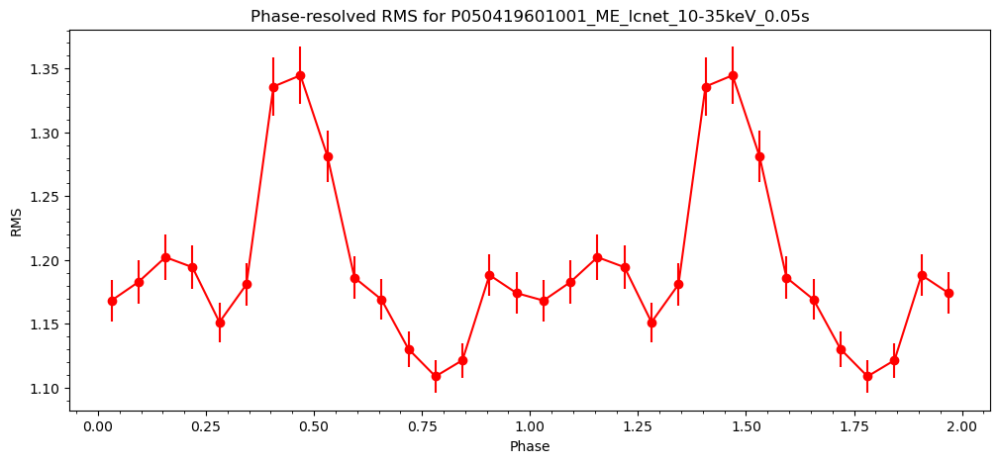

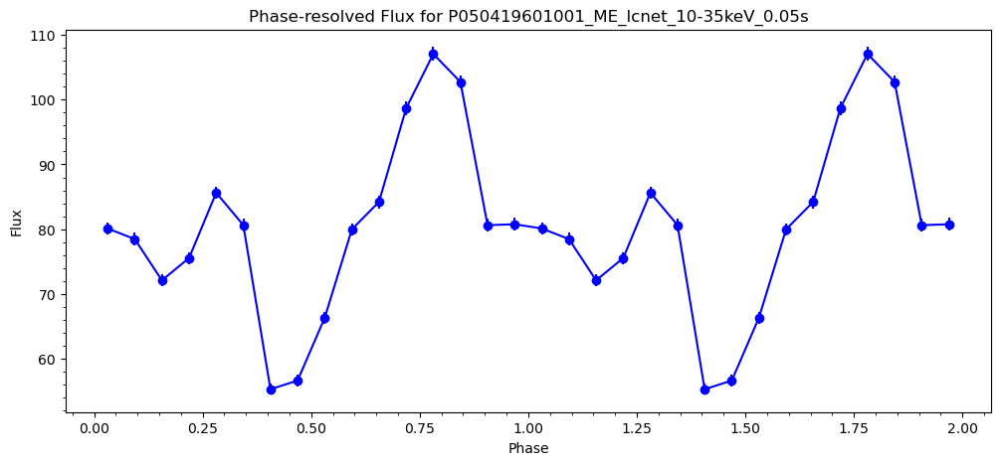

TSTART: 366256745.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196011/pipeline_output/P050419601101_ME_lcnet_10-35keV_0.05s.lc
First event time: 366256745.025
Last event time: 366268834.97499996
Total duration: 12089.949999988079 seconds
raw time value: [3.66256745e+08 3.66256745e+08 3.66256745e+08 3.66256745e+08
 3.66256745e+08 3.66256745e+08 3.66256745e+08 3.66256745e+08
 3.66256745e+08 3.66256745e+08]
converted from reference epoch time:  [3.70891934e+08 3.70891934e+08 3.70891934e+08 3.70891934e+08
 3.70891934e+08 3.70891934e+08 3.70891934e+08 3.70891934e+08
 3.70891934e+08 3.70891934e+08]


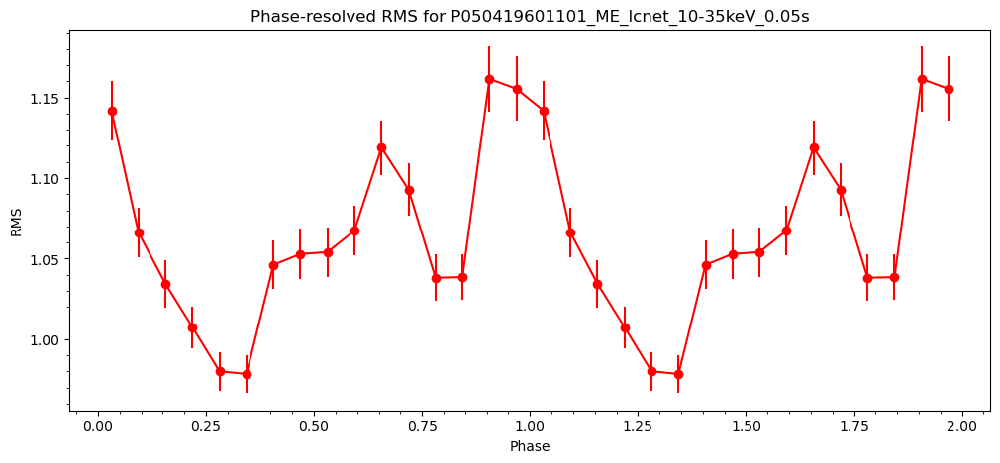

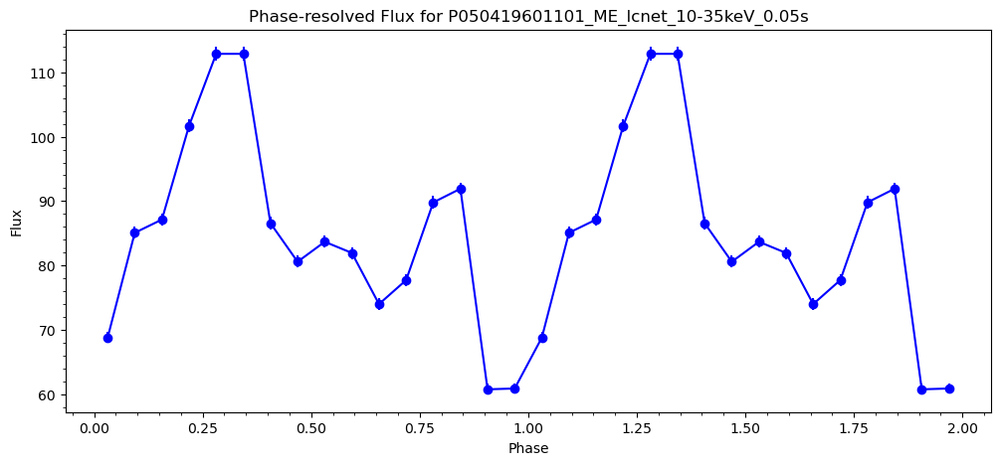

TSTART: 366422462.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196013/pipeline_output/P050419601301_ME_lcnet_10-35keV_0.05s.lc
First event time: 366422462.025
Last event time: 366434911.97499996
Total duration: 12449.949999988079 seconds
raw time value: [3.66422462e+08 3.66422462e+08 3.66422462e+08 3.66422462e+08
 3.66422462e+08 3.66422462e+08 3.66422462e+08 3.66422462e+08
 3.66422462e+08 3.66422462e+08]
converted from reference epoch time:  [3.71223368e+08 3.71223368e+08 3.71223368e+08 3.71223368e+08
 3.71223368e+08 3.71223368e+08 3.71223368e+08 3.71223368e+08
 3.71223368e+08 3.71223368e+08]


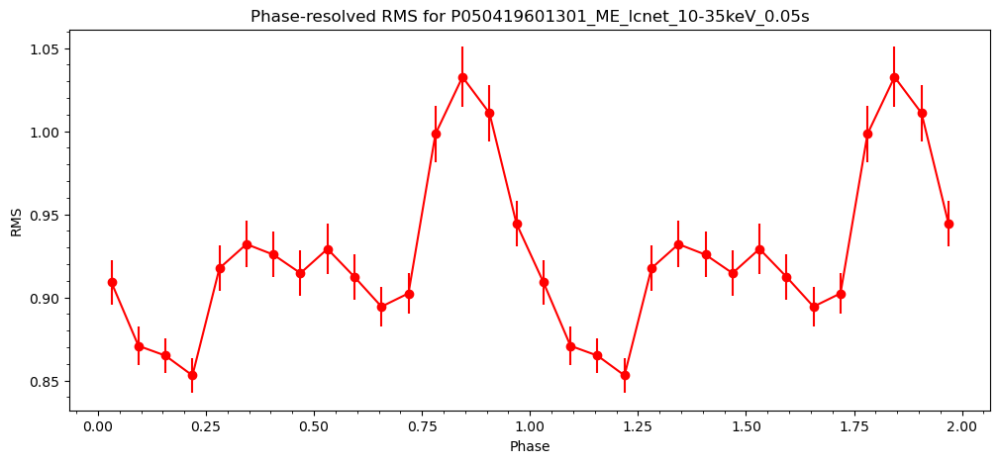

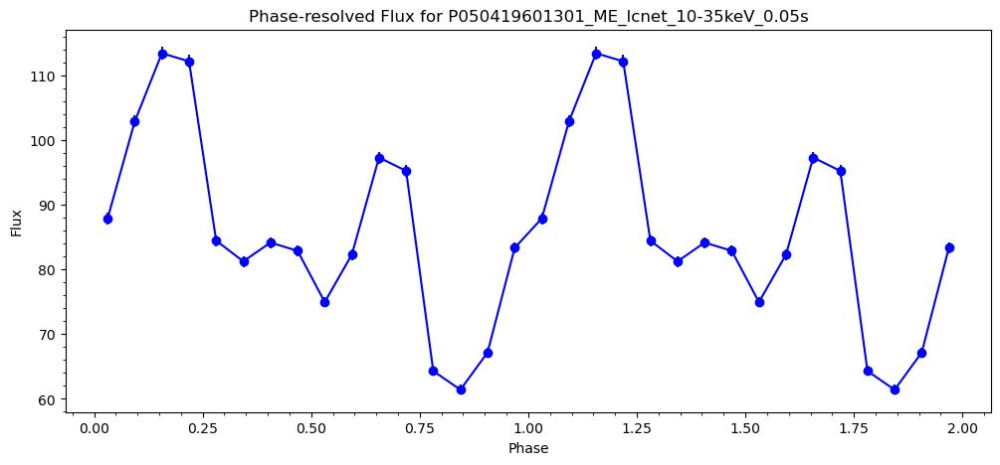

TSTART: 366540382.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196014/pipeline_output/P050419601402_ME_lcnet_10-35keV_0.05s.lc
First event time: 366540382.025
Last event time: 366549021.97499996
Total duration: 8639.949999988079 seconds
raw time value: [3.66540382e+08 3.66540382e+08 3.66540382e+08 3.66540382e+08
 3.66540382e+08 3.66540382e+08 3.66540382e+08 3.66540382e+08
 3.66540382e+08 3.66540382e+08]
converted from reference epoch time:  [3.71459208e+08 3.71459208e+08 3.71459208e+08 3.71459208e+08
 3.71459208e+08 3.71459208e+08 3.71459208e+08 3.71459208e+08
 3.71459208e+08 3.71459208e+08]


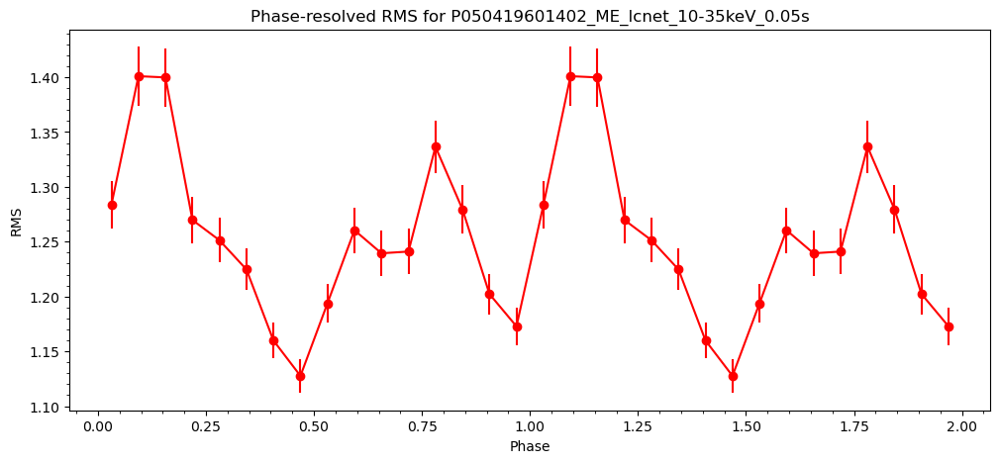

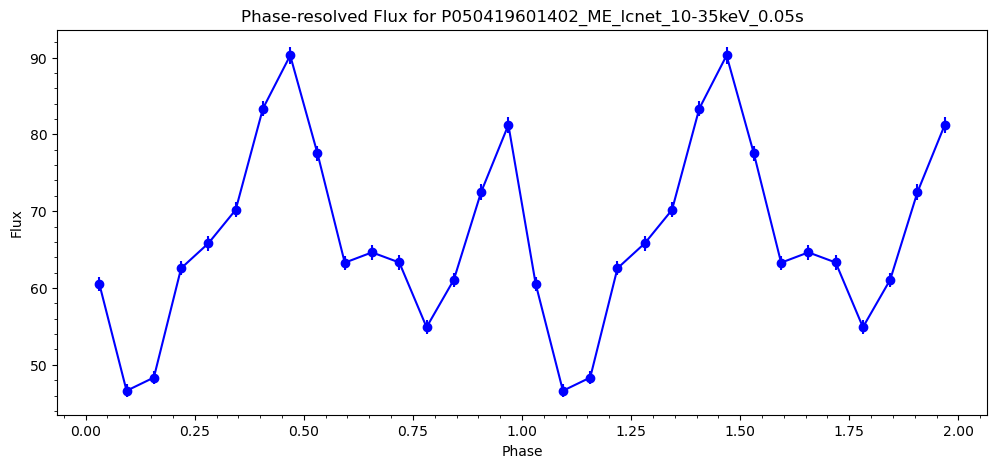

TSTART: 366551789.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196014/pipeline_output/P050419601403_ME_lcnet_10-35keV_0.05s.lc
First event time: 366551789.025
Last event time: 366558088.97499996
Total duration: 6299.949999988079 seconds
raw time value: [3.66551789e+08 3.66551789e+08 3.66551789e+08 3.66551789e+08
 3.66551789e+08 3.66551789e+08 3.66551789e+08 3.66551789e+08
 3.66551789e+08 3.66551789e+08]
converted from reference epoch time:  [3.71482022e+08 3.71482022e+08 3.71482022e+08 3.71482022e+08
 3.71482022e+08 3.71482022e+08 3.71482022e+08 3.71482022e+08
 3.71482022e+08 3.71482022e+08]


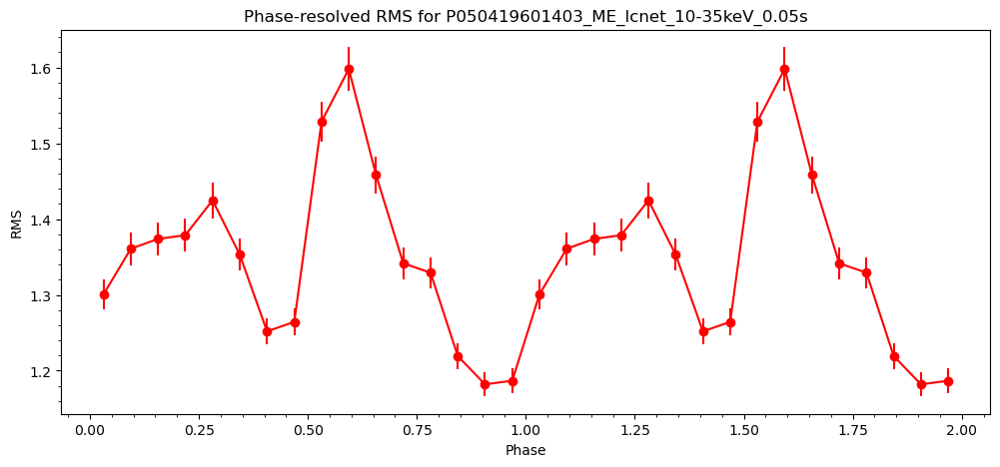

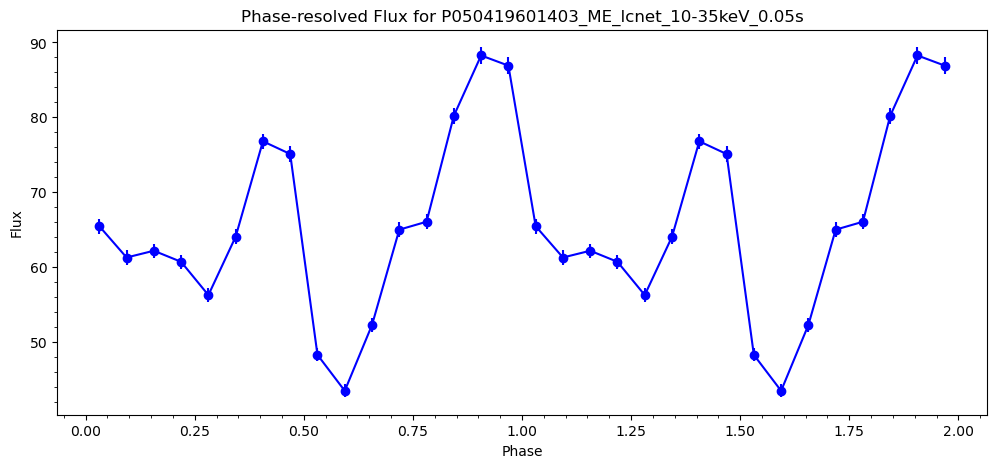

TSTART: 366627999.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601501_ME_lcnet_10-35keV_0.05s.lc
First event time: 366627999.025
Last event time: 366640838.97499996
Total duration: 12839.949999988079 seconds
raw time value: [3.66627999e+08 3.66627999e+08 3.66627999e+08 3.66627999e+08
 3.66627999e+08 3.66627999e+08 3.66627999e+08 3.66627999e+08
 3.66627999e+08 3.66627999e+08]
converted from reference epoch time:  [3.71634442e+08 3.71634442e+08 3.71634442e+08 3.71634442e+08
 3.71634442e+08 3.71634442e+08 3.71634442e+08 3.71634442e+08
 3.71634442e+08 3.71634442e+08]


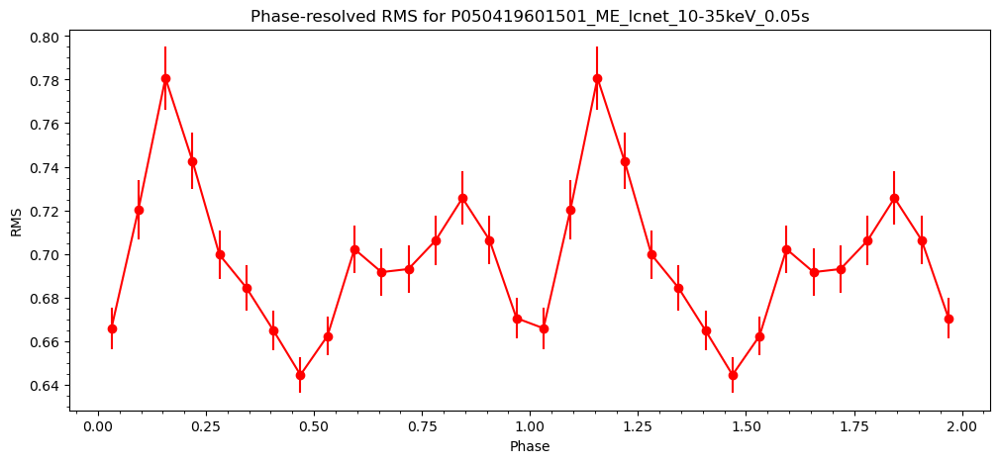

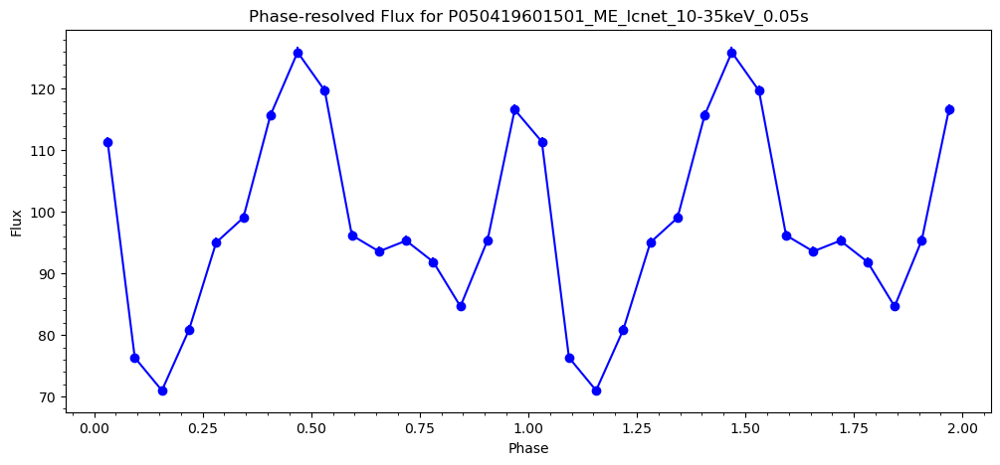

TSTART: 366643037.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601502_ME_lcnet_10-35keV_0.05s.lc
First event time: 366643037.025
Last event time: 366651916.97499996
Total duration: 8879.949999988079 seconds
raw time value: [3.66643037e+08 3.66643037e+08 3.66643037e+08 3.66643037e+08
 3.66643037e+08 3.66643037e+08 3.66643037e+08 3.66643037e+08
 3.66643037e+08 3.66643037e+08]
converted from reference epoch time:  [3.71664518e+08 3.71664518e+08 3.71664518e+08 3.71664518e+08
 3.71664518e+08 3.71664518e+08 3.71664518e+08 3.71664518e+08
 3.71664518e+08 3.71664518e+08]


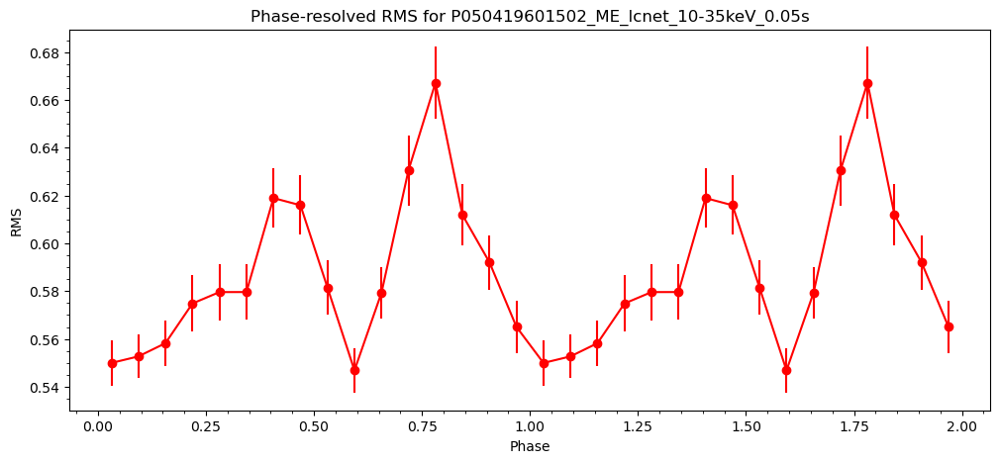

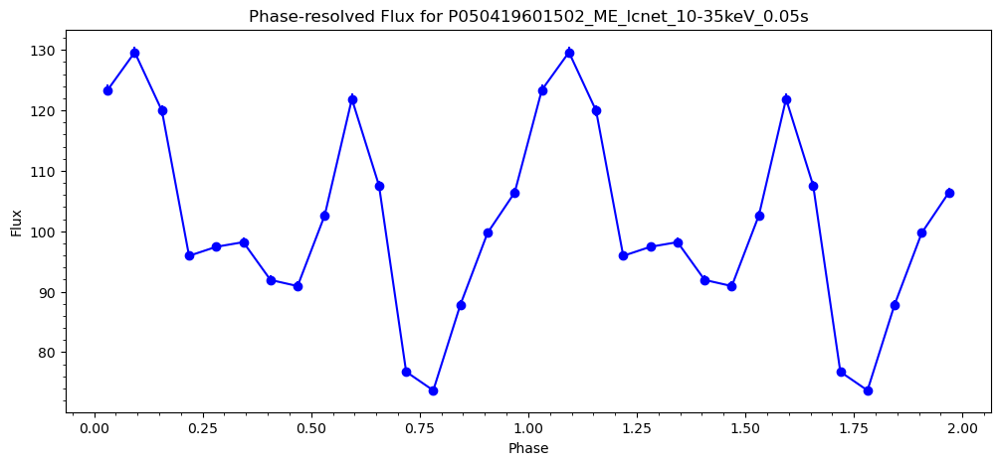

TSTART: 366700057.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601601_ME_lcnet_10-35keV_0.05s.lc
First event time: 366700057.025
Last event time: 366708096.97499996
Total duration: 8039.949999988079 seconds
raw time value: [3.66700057e+08 3.66700057e+08 3.66700057e+08 3.66700057e+08
 3.66700057e+08 3.66700057e+08 3.66700057e+08 3.66700057e+08
 3.66700057e+08 3.66700057e+08]
converted from reference epoch time:  [3.71778558e+08 3.71778558e+08 3.71778558e+08 3.71778558e+08
 3.71778558e+08 3.71778558e+08 3.71778558e+08 3.71778558e+08
 3.71778558e+08 3.71778558e+08]


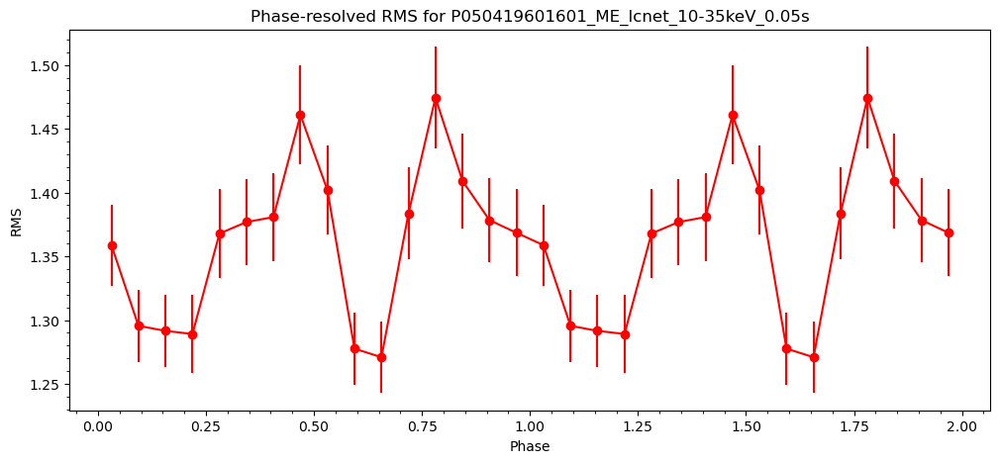

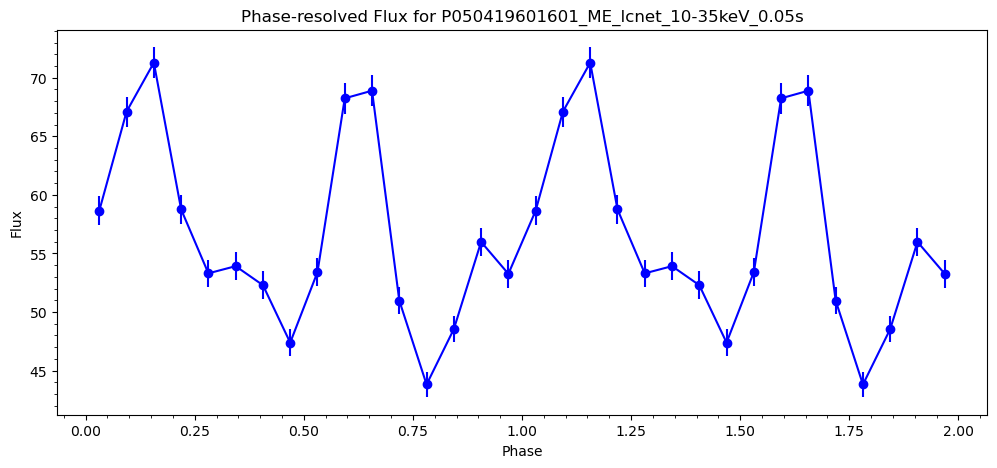

TSTART: 366711460.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601602_ME_lcnet_10-35keV_0.05s.lc
First event time: 366711460.025
Last event time: 366720369.97499996
Total duration: 8909.949999988079 seconds
raw time value: [3.6671146e+08 3.6671146e+08 3.6671146e+08 3.6671146e+08 3.6671146e+08
 3.6671146e+08 3.6671146e+08 3.6671146e+08 3.6671146e+08 3.6671146e+08]
converted from reference epoch time:  [3.71801364e+08 3.71801364e+08 3.71801364e+08 3.71801364e+08
 3.71801364e+08 3.71801364e+08 3.71801364e+08 3.71801364e+08
 3.71801364e+08 3.71801364e+08]


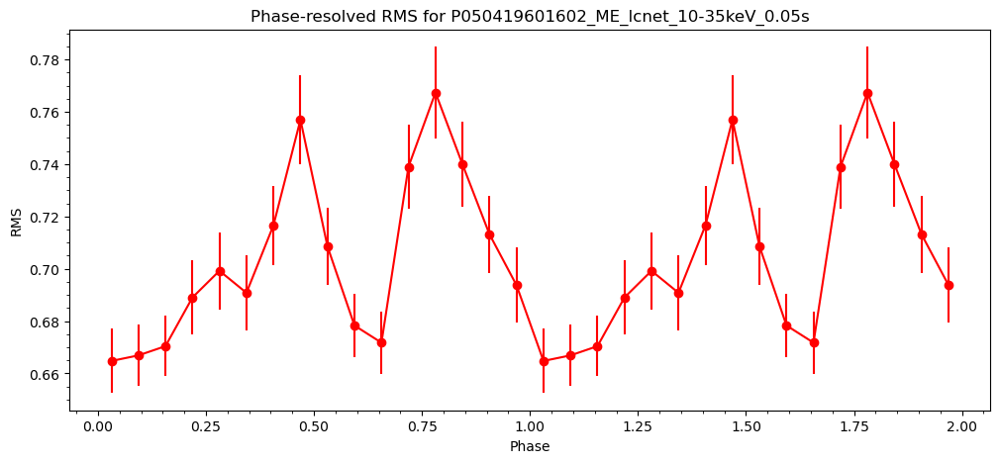

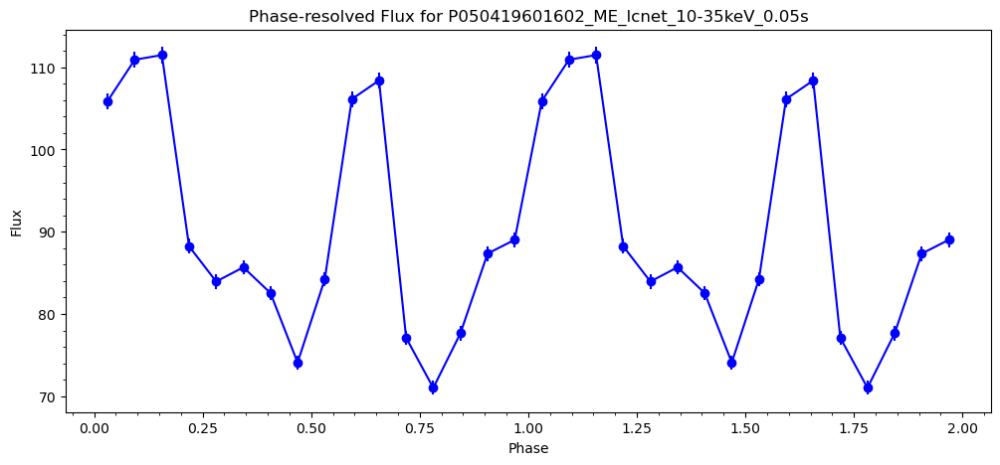

TSTART: 366722863.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601603_ME_lcnet_10-35keV_0.05s.lc
First event time: 366722863.025
Last event time: 366729252.97499996
Total duration: 6389.949999988079 seconds
raw time value: [3.66722863e+08 3.66722863e+08 3.66722863e+08 3.66722863e+08
 3.66722863e+08 3.66722863e+08 3.66722863e+08 3.66722863e+08
 3.66722863e+08 3.66722863e+08]
converted from reference epoch time:  [3.7182417e+08 3.7182417e+08 3.7182417e+08 3.7182417e+08 3.7182417e+08
 3.7182417e+08 3.7182417e+08 3.7182417e+08 3.7182417e+08 3.7182417e+08]


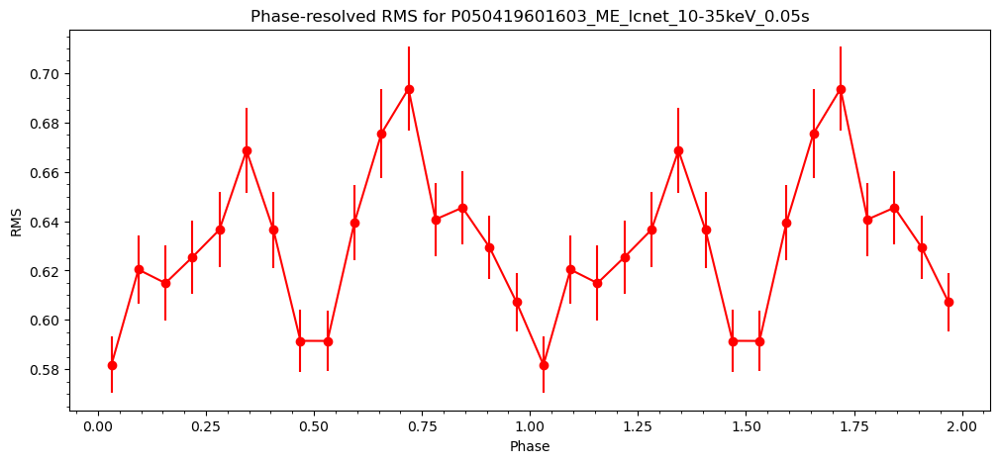

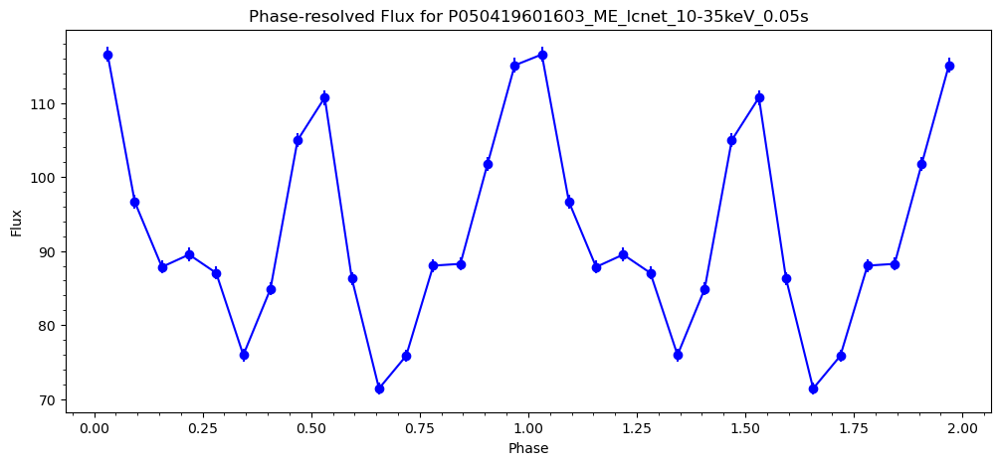

TSTART: 366867605.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196017/pipeline_output/P050419601701_ME_lcnet_10-35keV_0.05s.lc
First event time: 366867605.025
Last event time: 366883414.97499996
Total duration: 15809.949999988079 seconds
raw time value: [3.66867605e+08 3.66867605e+08 3.66867605e+08 3.66867605e+08
 3.66867605e+08 3.66867605e+08 3.66867605e+08 3.66867605e+08
 3.66867605e+08 3.66867605e+08]
converted from reference epoch time:  [3.72113654e+08 3.72113654e+08 3.72113654e+08 3.72113654e+08
 3.72113654e+08 3.72113654e+08 3.72113654e+08 3.72113654e+08
 3.72113654e+08 3.72113654e+08]


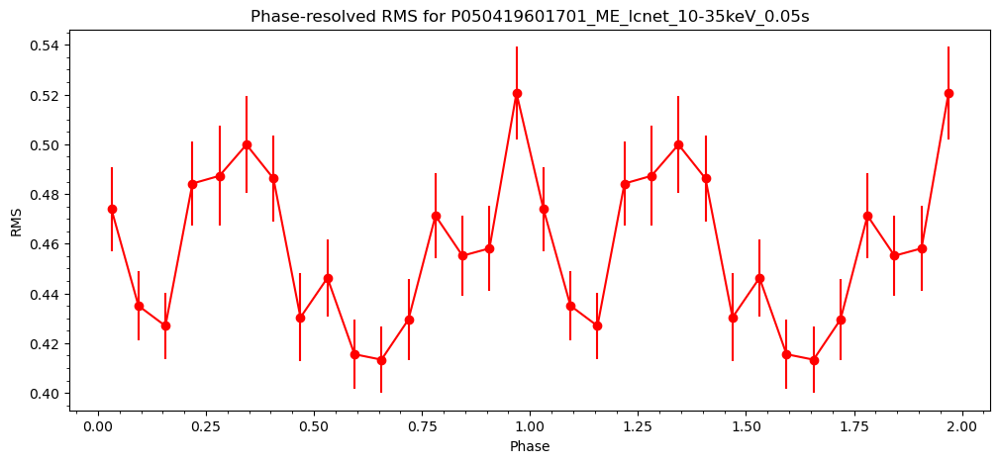

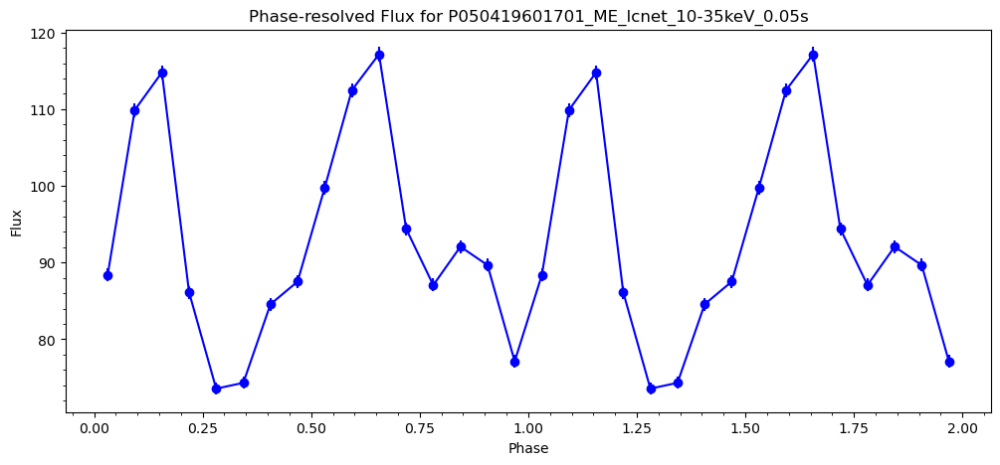

TSTART: 366973576.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196018/pipeline_output/P050419601801_ME_lcnet_10-35keV_0.05s.lc
First event time: 366973576.025
Last event time: 366986895.97499996
Total duration: 13319.949999988079 seconds
raw time value: [3.66973576e+08 3.66973576e+08 3.66973576e+08 3.66973576e+08
 3.66973576e+08 3.66973576e+08 3.66973576e+08 3.66973576e+08
 3.66973576e+08 3.66973576e+08]
converted from reference epoch time:  [3.72325596e+08 3.72325596e+08 3.72325596e+08 3.72325596e+08
 3.72325596e+08 3.72325596e+08 3.72325596e+08 3.72325596e+08
 3.72325596e+08 3.72325596e+08]


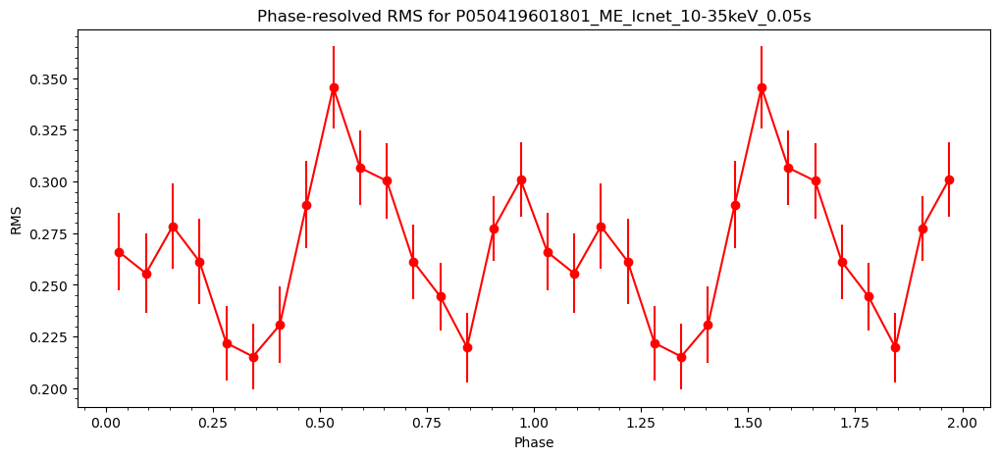

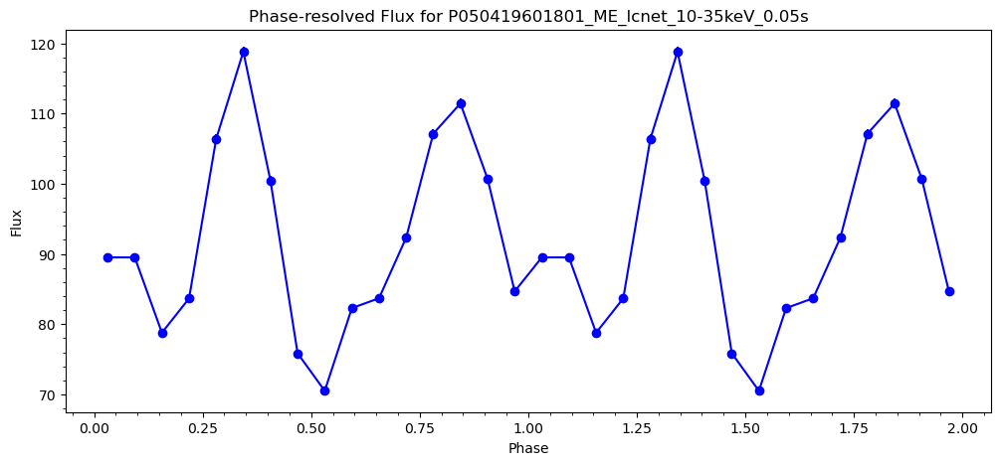

TSTART: 367041948.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601901_ME_lcnet_10-35keV_0.05s.lc
First event time: 367041948.025
Last event time: 367050497.97499996
Total duration: 8549.949999988079 seconds
raw time value: [3.67041948e+08 3.67041948e+08 3.67041948e+08 3.67041948e+08
 3.67041948e+08 3.67041948e+08 3.67041948e+08 3.67041948e+08
 3.67041948e+08 3.67041948e+08]
converted from reference epoch time:  [3.7246234e+08 3.7246234e+08 3.7246234e+08 3.7246234e+08 3.7246234e+08
 3.7246234e+08 3.7246234e+08 3.7246234e+08 3.7246234e+08 3.7246234e+08]


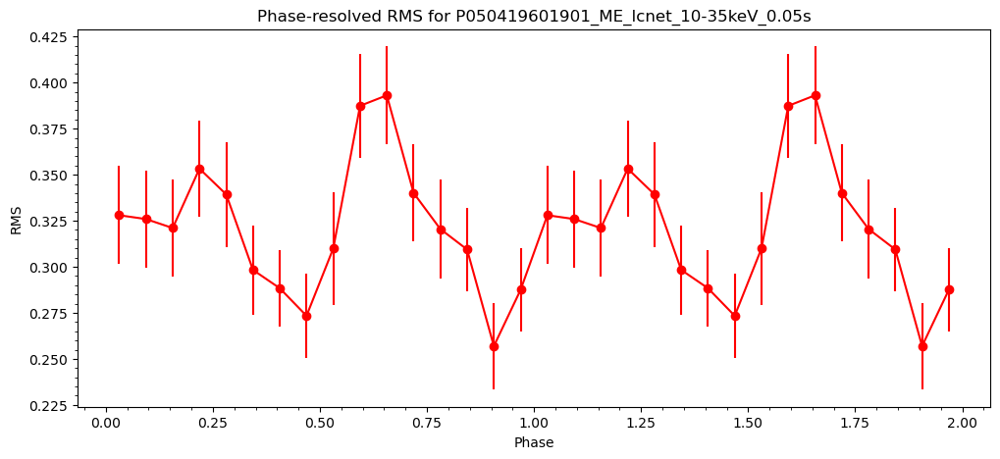

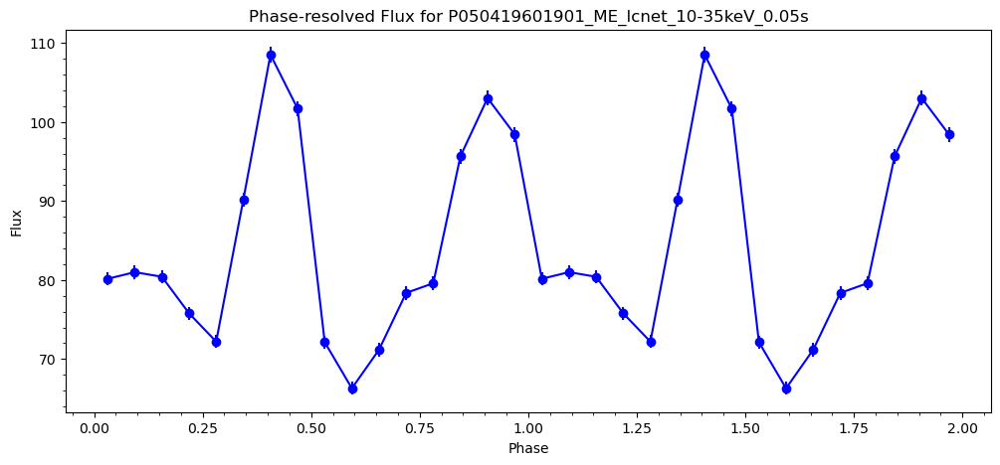

TSTART: 367053336.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601902_ME_lcnet_10-35keV_0.05s.lc
First event time: 367053336.025
Last event time: 367062905.97499996
Total duration: 9569.949999988079 seconds
raw time value: [3.67053336e+08 3.67053336e+08 3.67053336e+08 3.67053336e+08
 3.67053336e+08 3.67053336e+08 3.67053336e+08 3.67053336e+08
 3.67053336e+08 3.67053336e+08]
converted from reference epoch time:  [3.72485116e+08 3.72485116e+08 3.72485116e+08 3.72485116e+08
 3.72485116e+08 3.72485116e+08 3.72485116e+08 3.72485116e+08
 3.72485116e+08 3.72485116e+08]


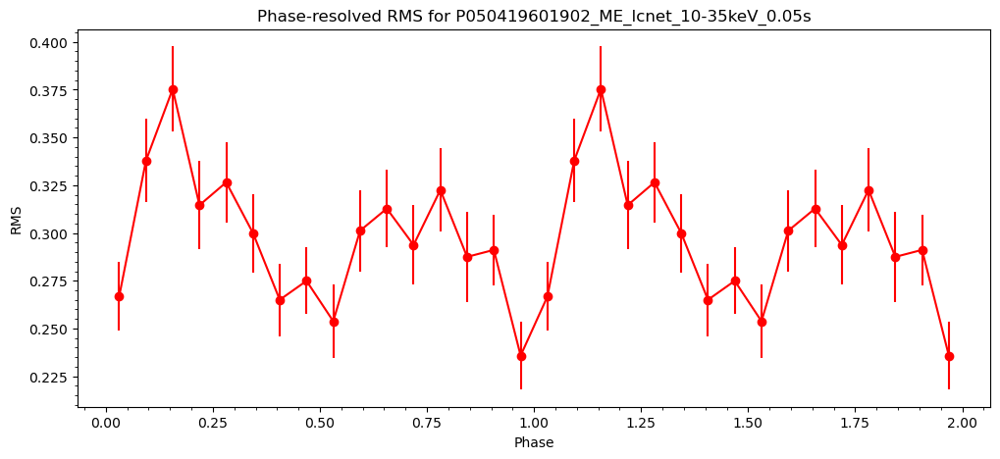

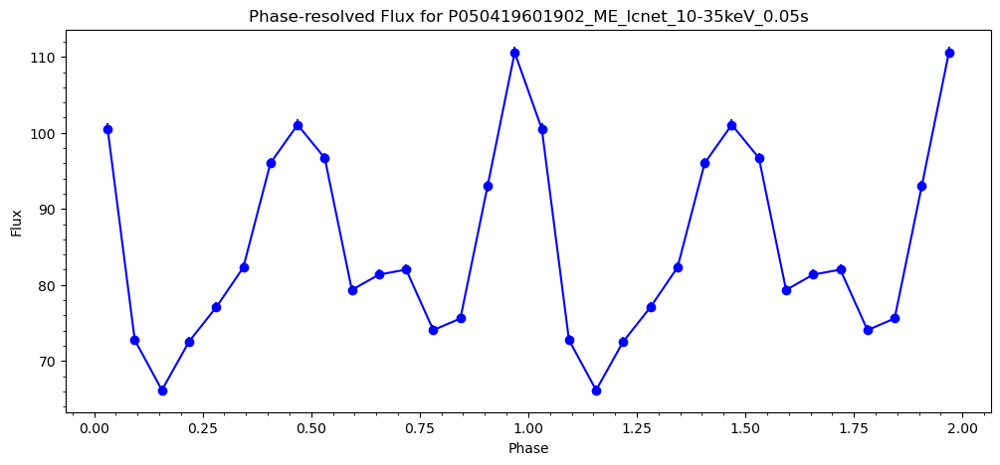

TSTART: 367064783.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601903_ME_lcnet_10-35keV_0.05s.lc
First event time: 367064783.025
Last event time: 367072522.97499996
Total duration: 7739.949999988079 seconds
raw time value: [3.67064783e+08 3.67064783e+08 3.67064783e+08 3.67064783e+08
 3.67064783e+08 3.67064783e+08 3.67064783e+08 3.67064783e+08
 3.67064783e+08 3.67064783e+08]
converted from reference epoch time:  [3.7250801e+08 3.7250801e+08 3.7250801e+08 3.7250801e+08 3.7250801e+08
 3.7250801e+08 3.7250801e+08 3.7250801e+08 3.7250801e+08 3.7250801e+08]


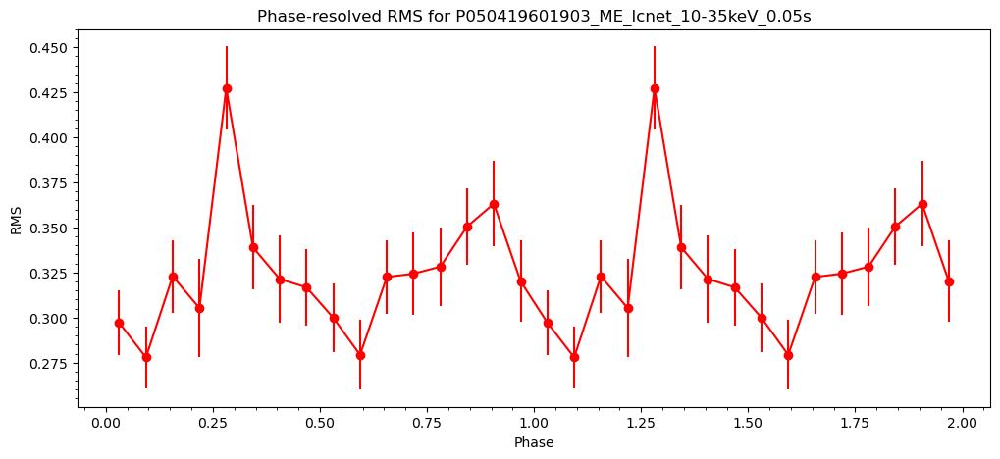

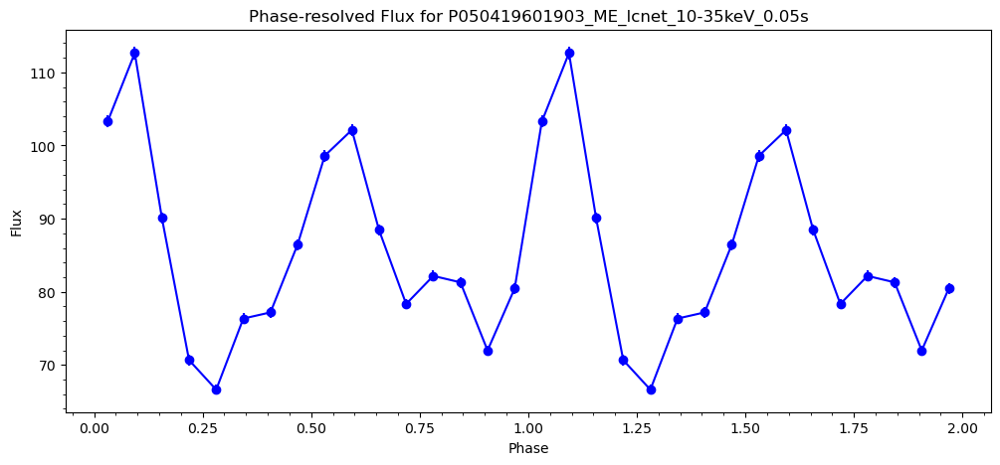

TSTART: 367159405.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196020/pipeline_output/P050419602001_ME_lcnet_10-35keV_0.05s.lc
First event time: 367159405.025
Last event time: 367170984.97499996
Total duration: 11579.949999988079 seconds
raw time value: [3.67159405e+08 3.67159405e+08 3.67159405e+08 3.67159405e+08
 3.67159405e+08 3.67159405e+08 3.67159405e+08 3.67159405e+08
 3.67159405e+08 3.67159405e+08]
converted from reference epoch time:  [3.72697254e+08 3.72697254e+08 3.72697254e+08 3.72697254e+08
 3.72697254e+08 3.72697254e+08 3.72697254e+08 3.72697254e+08
 3.72697254e+08 3.72697254e+08]


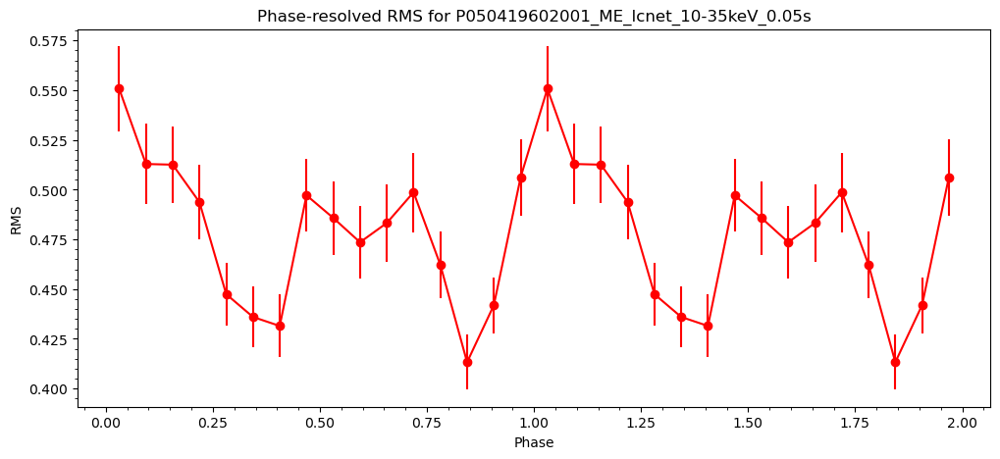

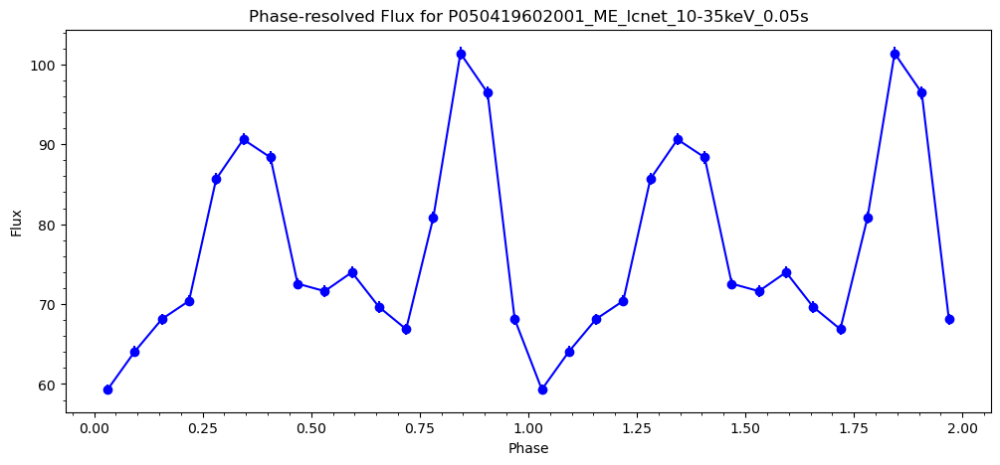

TSTART: 367173526.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196020/pipeline_output/P050419602002_ME_lcnet_10-35keV_0.05s.lc
First event time: 367173526.025
Last event time: 367190985.97499996
Total duration: 17459.94999998808 seconds
raw time value: [3.67173526e+08 3.67173526e+08 3.67173526e+08 3.67173526e+08
 3.67173526e+08 3.67173526e+08 3.67173526e+08 3.67173526e+08
 3.67173526e+08 3.67173526e+08]
converted from reference epoch time:  [3.72725496e+08 3.72725496e+08 3.72725496e+08 3.72725496e+08
 3.72725496e+08 3.72725496e+08 3.72725496e+08 3.72725496e+08
 3.72725496e+08 3.72725496e+08]


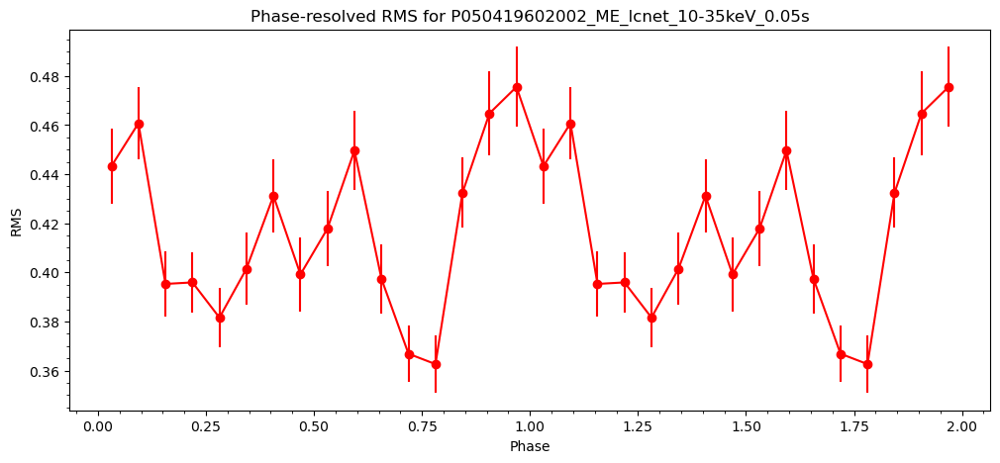

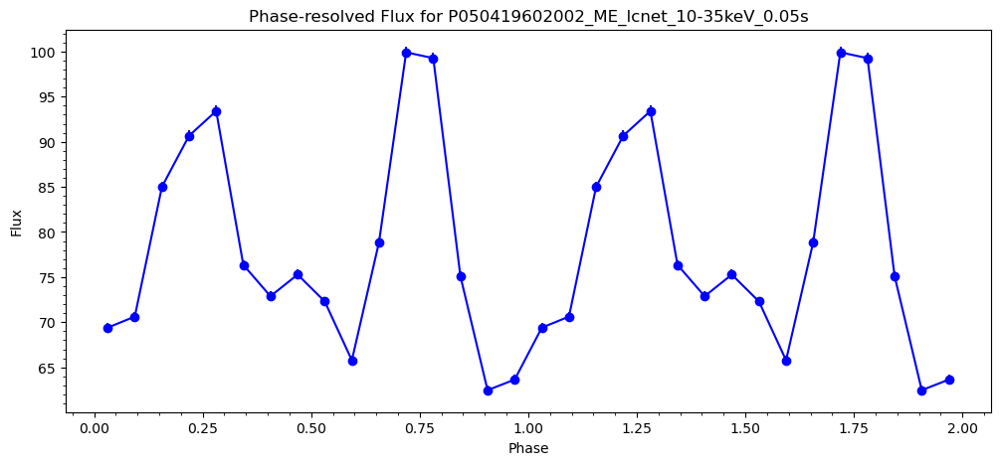

TSTART: 367262100.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196021/pipeline_output/P050419602101_ME_lcnet_10-35keV_0.05s.lc
First event time: 367262100.025
Last event time: 367284779.97499996
Total duration: 22679.94999998808 seconds
raw time value: [3.672621e+08 3.672621e+08 3.672621e+08 3.672621e+08 3.672621e+08
 3.672621e+08 3.672621e+08 3.672621e+08 3.672621e+08 3.672621e+08]
converted from reference epoch time:  [3.72902644e+08 3.72902644e+08 3.72902644e+08 3.72902644e+08
 3.72902644e+08 3.72902644e+08 3.72902644e+08 3.72902644e+08
 3.72902644e+08 3.72902644e+08]


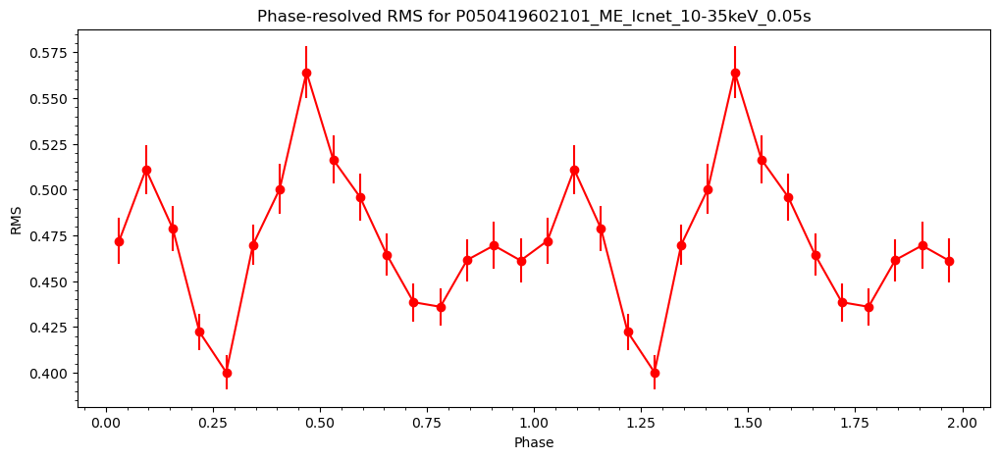

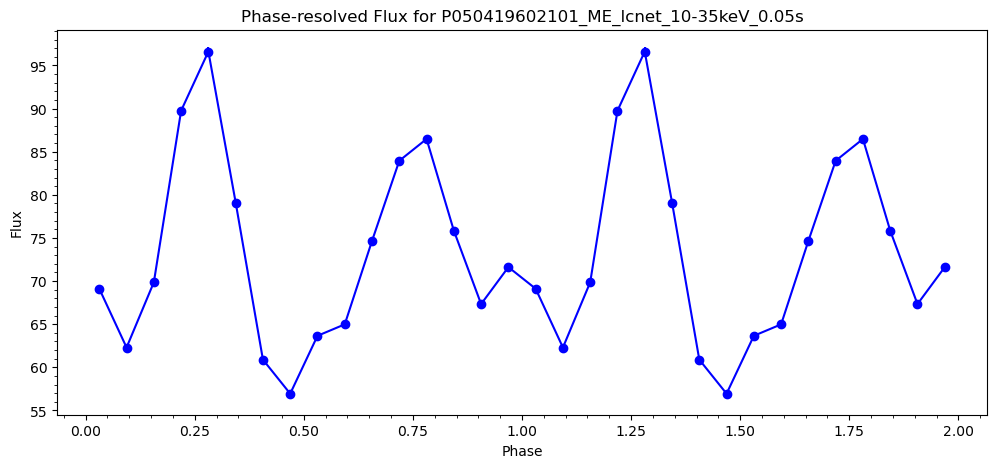

TSTART: 367286916.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196021/pipeline_output/P050419602102_ME_lcnet_10-35keV_0.05s.lc
First event time: 367286916.025
Last event time: 367293995.97499996
Total duration: 7079.949999988079 seconds
raw time value: [3.67286916e+08 3.67286916e+08 3.67286916e+08 3.67286916e+08
 3.67286916e+08 3.67286916e+08 3.67286916e+08 3.67286916e+08
 3.67286916e+08 3.67286916e+08]
converted from reference epoch time:  [3.72952276e+08 3.72952276e+08 3.72952276e+08 3.72952276e+08
 3.72952276e+08 3.72952276e+08 3.72952276e+08 3.72952276e+08
 3.72952276e+08 3.72952276e+08]


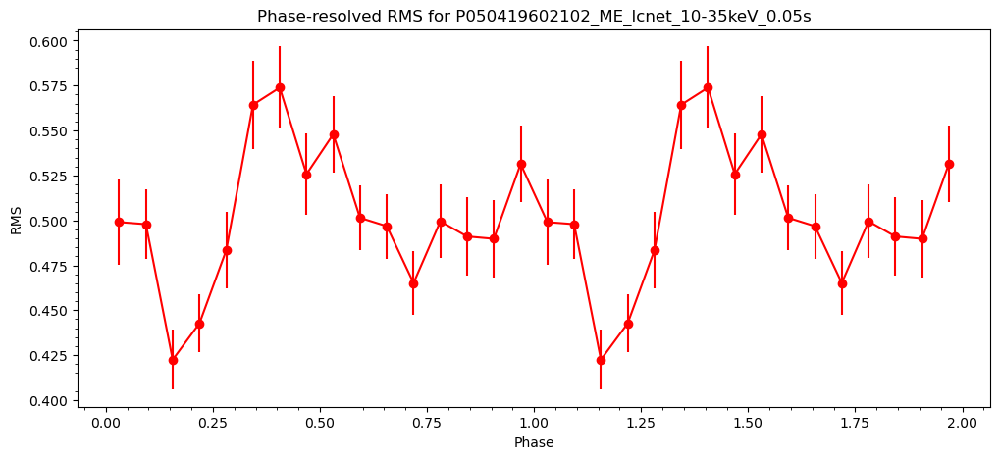

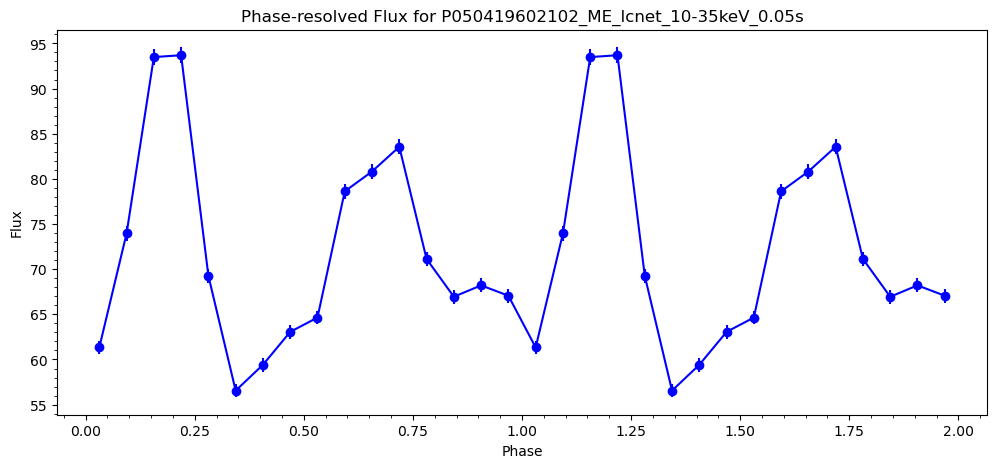

TSTART: 367395433.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602201_ME_lcnet_10-35keV_0.05s.lc
First event time: 367395433.025
Last event time: 367405212.97499996
Total duration: 9779.949999988079 seconds
raw time value: [3.67395433e+08 3.67395433e+08 3.67395433e+08 3.67395433e+08
 3.67395433e+08 3.67395433e+08 3.67395433e+08 3.67395433e+08
 3.67395433e+08 3.67395433e+08]
converted from reference epoch time:  [3.7316931e+08 3.7316931e+08 3.7316931e+08 3.7316931e+08 3.7316931e+08
 3.7316931e+08 3.7316931e+08 3.7316931e+08 3.7316931e+08 3.7316931e+08]


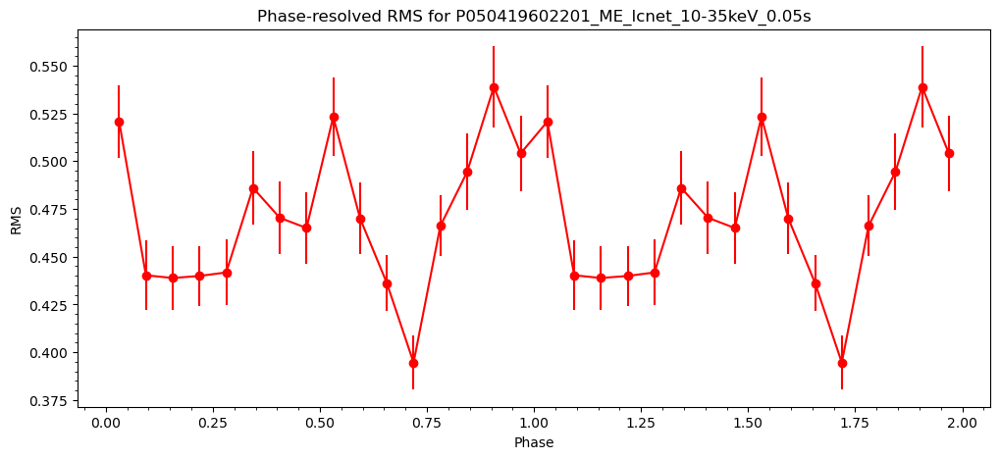

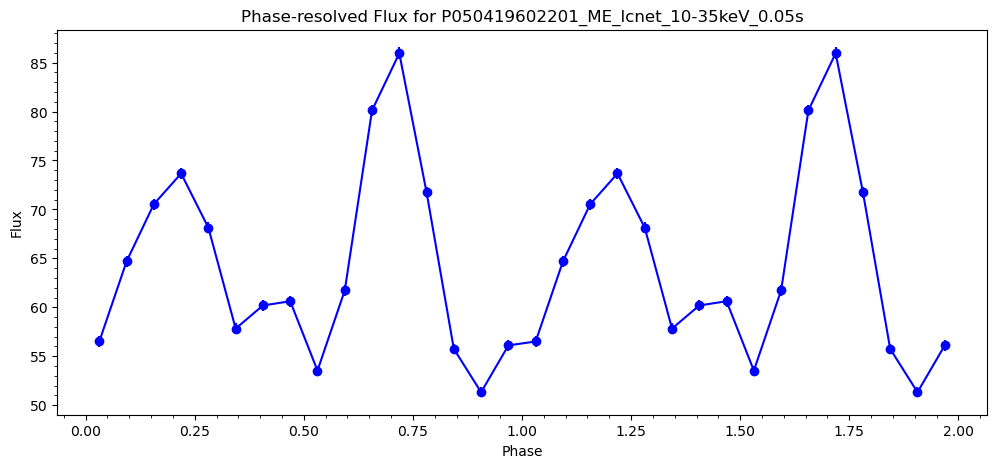

TSTART: 367407151.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602202_ME_lcnet_10-35keV_0.05s.lc
First event time: 367407151.025
Last event time: 367416390.97499996
Total duration: 9239.949999988079 seconds
raw time value: [3.67407151e+08 3.67407151e+08 3.67407151e+08 3.67407151e+08
 3.67407151e+08 3.67407151e+08 3.67407151e+08 3.67407151e+08
 3.67407151e+08 3.67407151e+08]
converted from reference epoch time:  [3.73192746e+08 3.73192746e+08 3.73192746e+08 3.73192746e+08
 3.73192746e+08 3.73192746e+08 3.73192746e+08 3.73192746e+08
 3.73192746e+08 3.73192746e+08]


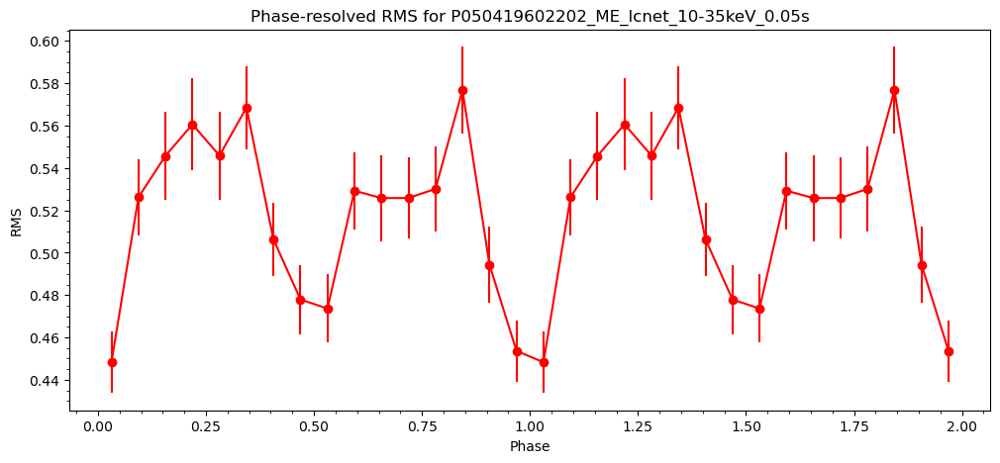

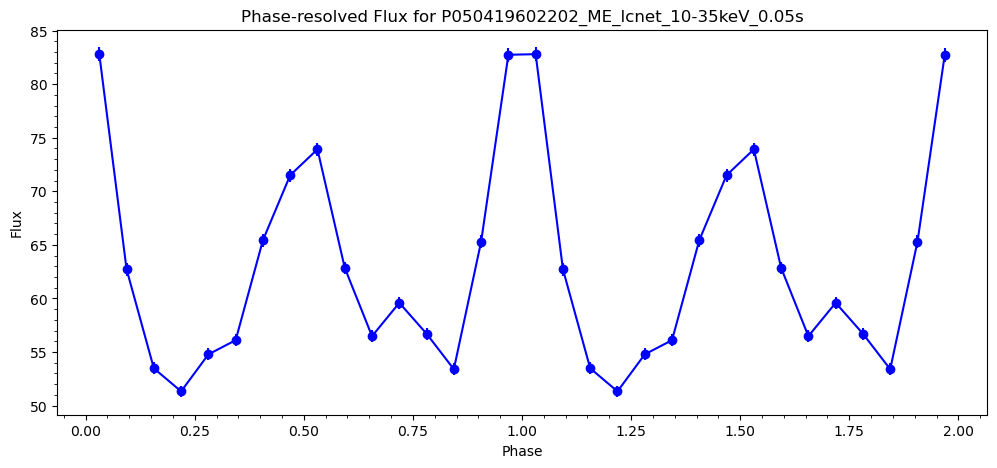

TSTART: 367419025.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602203_ME_lcnet_10-35keV_0.05s.lc
First event time: 367419025.025
Last event time: 367455894.97499996
Total duration: 36869.94999998808 seconds
raw time value: [3.67419025e+08 3.67419025e+08 3.67419025e+08 3.67419025e+08
 3.67419025e+08 3.67419025e+08 3.67419025e+08 3.67419025e+08
 3.67419025e+08 3.67419025e+08]
converted from reference epoch time:  [3.73216494e+08 3.73216494e+08 3.73216494e+08 3.73216494e+08
 3.73216494e+08 3.73216494e+08 3.73216494e+08 3.73216494e+08
 3.73216494e+08 3.73216494e+08]


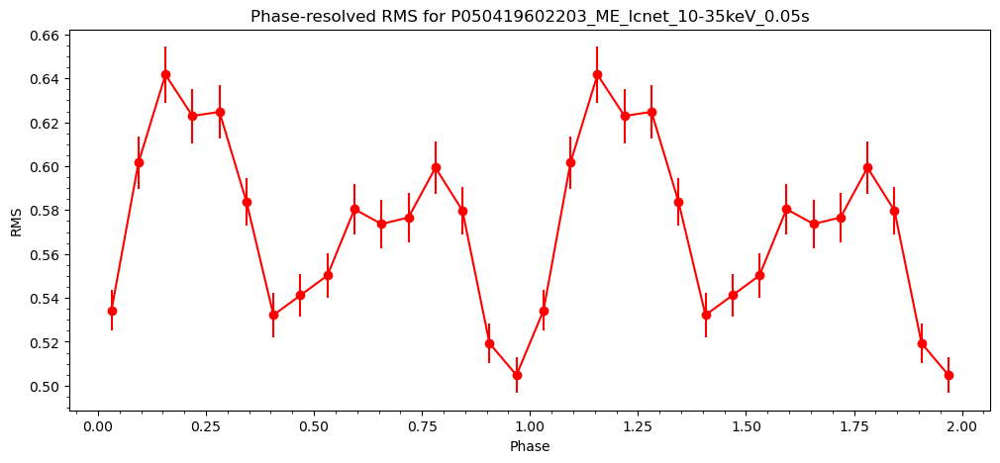

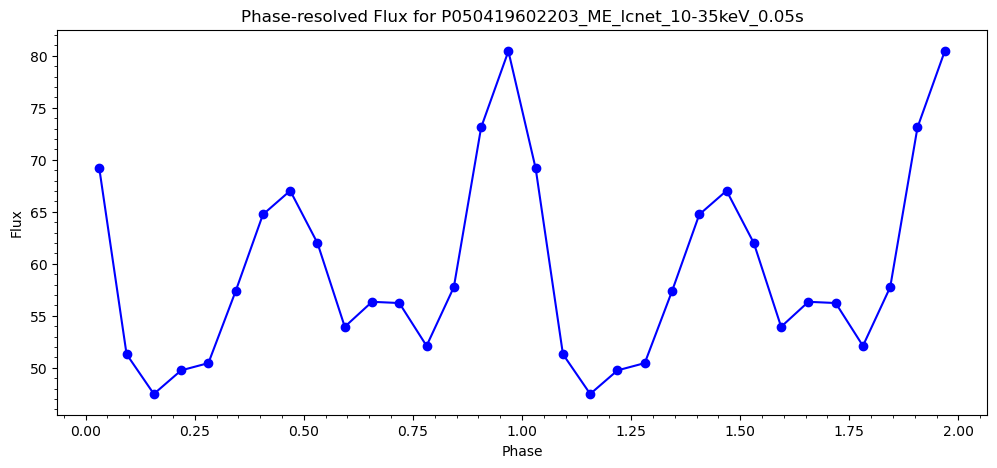

TSTART: 367458074.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602204_ME_lcnet_10-35keV_0.05s.lc
First event time: 367458074.025
Last event time: 367466803.97499996
Total duration: 8729.949999988079 seconds
raw time value: [3.67458074e+08 3.67458074e+08 3.67458074e+08 3.67458074e+08
 3.67458074e+08 3.67458074e+08 3.67458074e+08 3.67458074e+08
 3.67458074e+08 3.67458074e+08]
converted from reference epoch time:  [3.73294592e+08 3.73294592e+08 3.73294592e+08 3.73294592e+08
 3.73294592e+08 3.73294592e+08 3.73294592e+08 3.73294592e+08
 3.73294592e+08 3.73294592e+08]


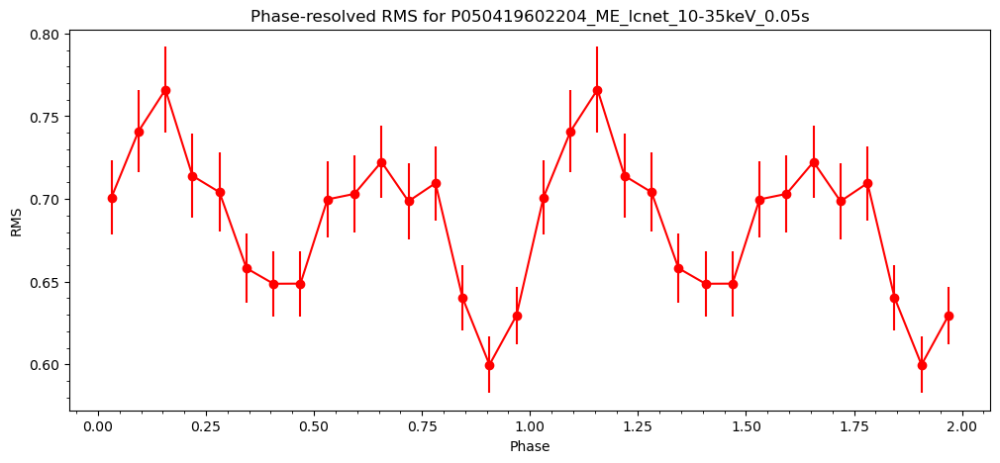

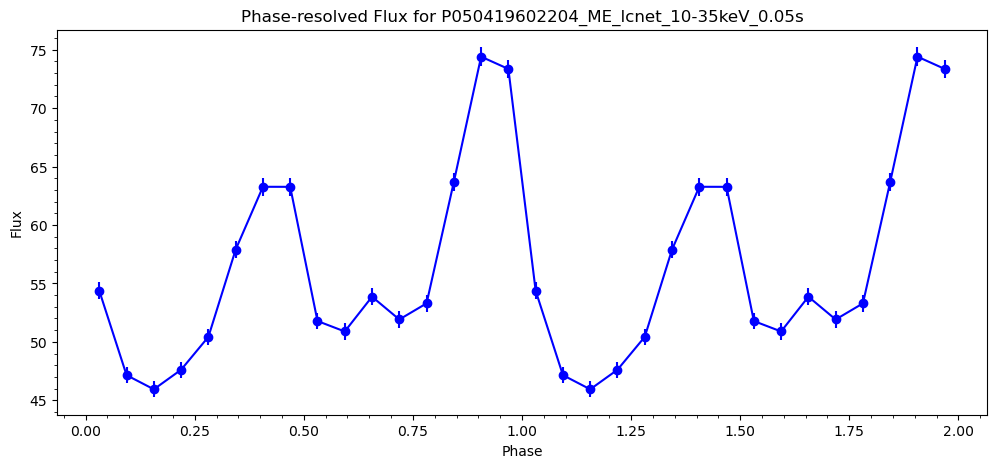

TSTART: 367469483.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602205_ME_lcnet_10-35keV_0.05s.lc
First event time: 367469483.025
Last event time: 367478512.97499996
Total duration: 9029.949999988079 seconds
raw time value: [3.67469483e+08 3.67469483e+08 3.67469483e+08 3.67469483e+08
 3.67469483e+08 3.67469483e+08 3.67469483e+08 3.67469483e+08
 3.67469483e+08 3.67469483e+08]
converted from reference epoch time:  [3.7331741e+08 3.7331741e+08 3.7331741e+08 3.7331741e+08 3.7331741e+08
 3.7331741e+08 3.7331741e+08 3.7331741e+08 3.7331741e+08 3.7331741e+08]


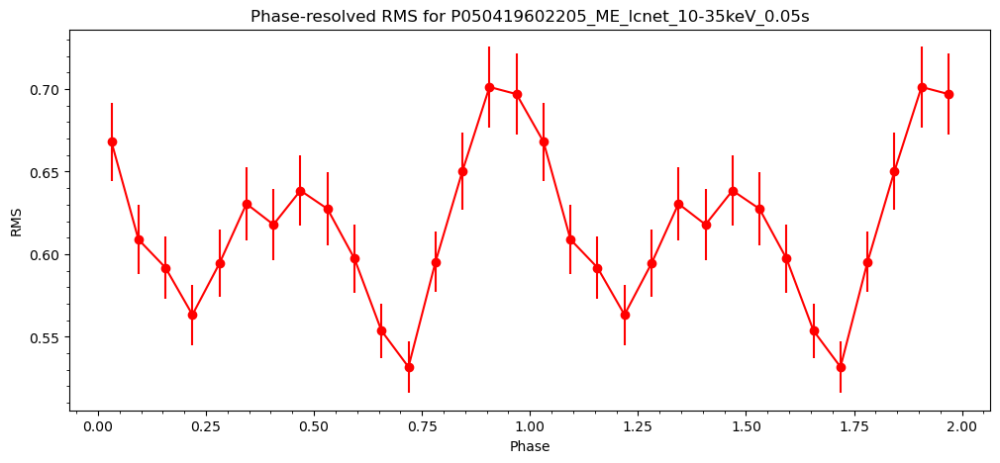

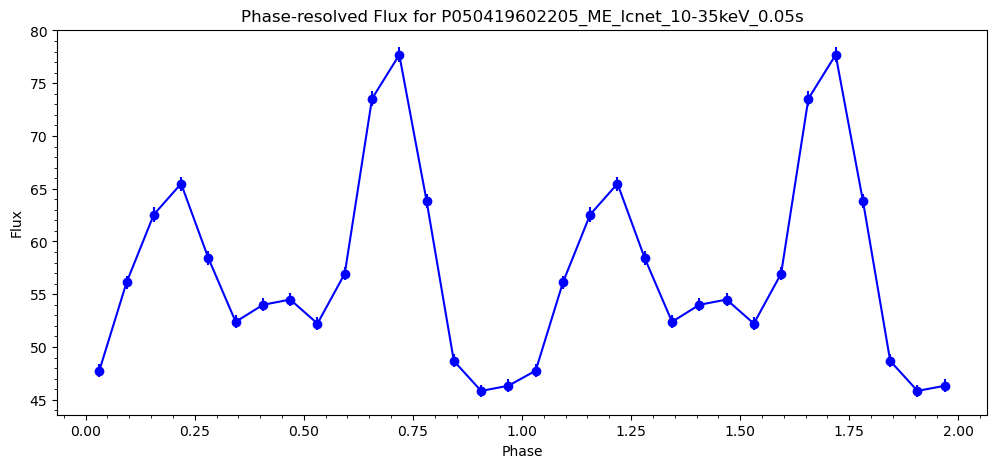

TSTART: 367481035.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602206_ME_lcnet_10-35keV_0.05s.lc
First event time: 367481035.025
Last event time: 367490544.97499996
Total duration: 9509.949999988079 seconds
raw time value: [3.67481035e+08 3.67481035e+08 3.67481035e+08 3.67481035e+08
 3.67481035e+08 3.67481035e+08 3.67481035e+08 3.67481035e+08
 3.67481035e+08 3.67481035e+08]
converted from reference epoch time:  [3.73340514e+08 3.73340514e+08 3.73340514e+08 3.73340514e+08
 3.73340514e+08 3.73340514e+08 3.73340514e+08 3.73340514e+08
 3.73340514e+08 3.73340514e+08]


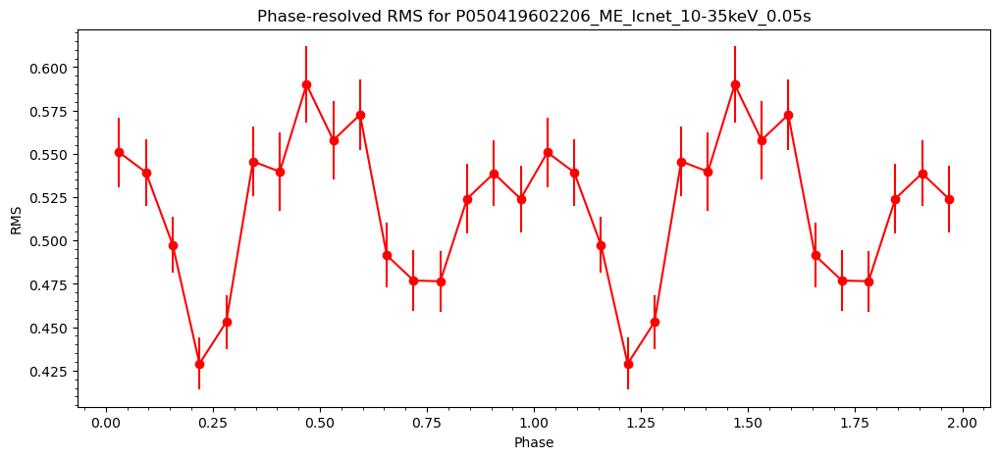

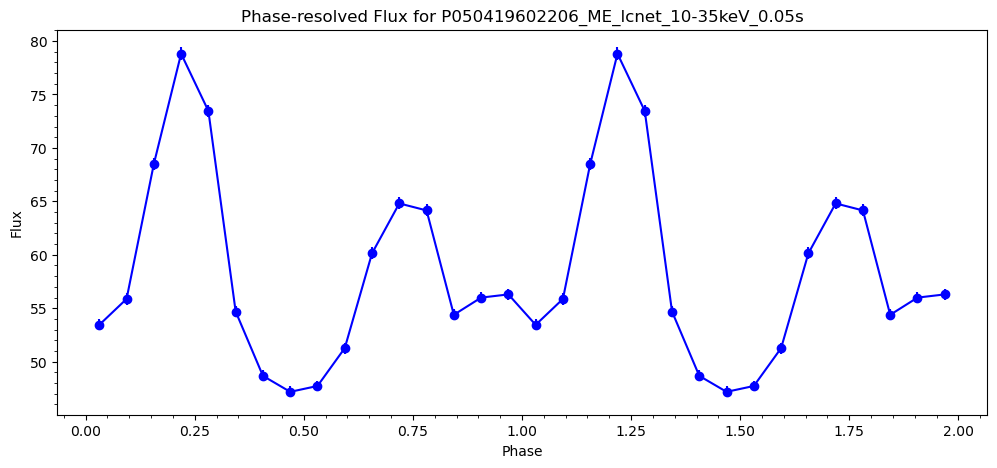

TSTART: 367492741.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602207_ME_lcnet_10-35keV_0.05s.lc
First event time: 367492741.025
Last event time: 367501920.97499996
Total duration: 9179.949999988079 seconds
raw time value: [3.67492741e+08 3.67492741e+08 3.67492741e+08 3.67492741e+08
 3.67492741e+08 3.67492741e+08 3.67492741e+08 3.67492741e+08
 3.67492741e+08 3.67492741e+08]
converted from reference epoch time:  [3.73363926e+08 3.73363926e+08 3.73363926e+08 3.73363926e+08
 3.73363926e+08 3.73363926e+08 3.73363926e+08 3.73363926e+08
 3.73363926e+08 3.73363926e+08]


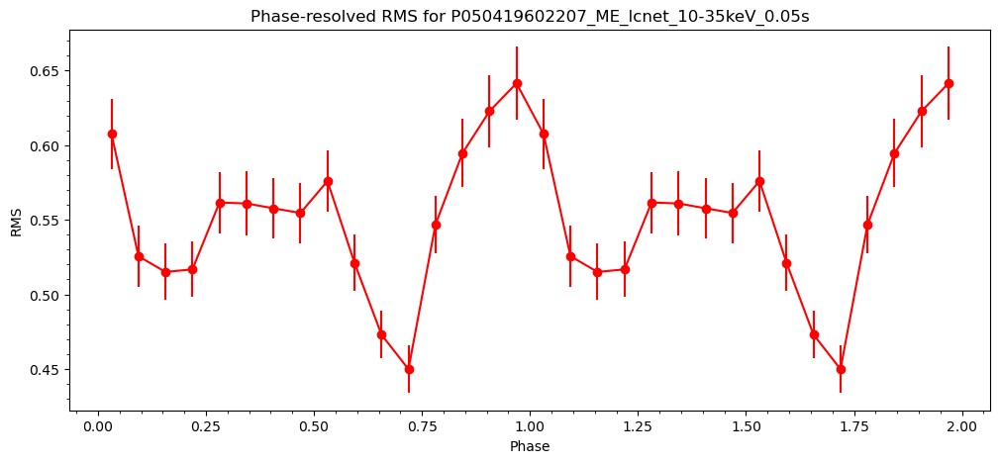

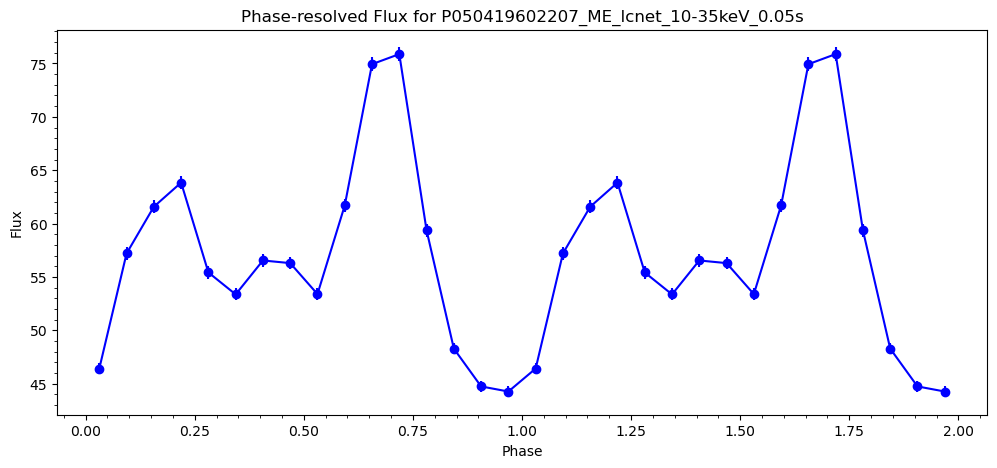

TSTART: 367504607.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602208_ME_lcnet_10-35keV_0.05s.lc
First event time: 367504607.025
Last event time: 367541446.97499996
Total duration: 36839.94999998808 seconds
raw time value: [3.67504607e+08 3.67504607e+08 3.67504607e+08 3.67504607e+08
 3.67504607e+08 3.67504607e+08 3.67504607e+08 3.67504607e+08
 3.67504607e+08 3.67504607e+08]
converted from reference epoch time:  [3.73387658e+08 3.73387658e+08 3.73387658e+08 3.73387658e+08
 3.73387658e+08 3.73387658e+08 3.73387658e+08 3.73387658e+08
 3.73387658e+08 3.73387658e+08]


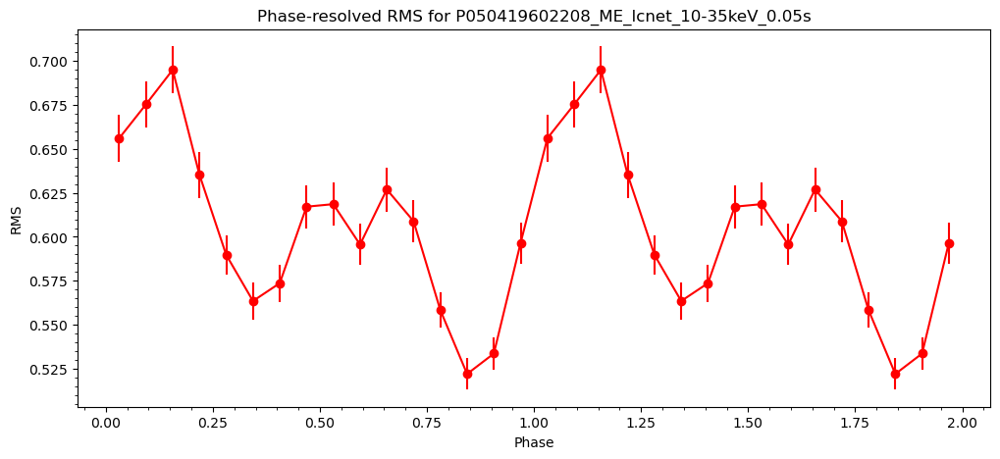

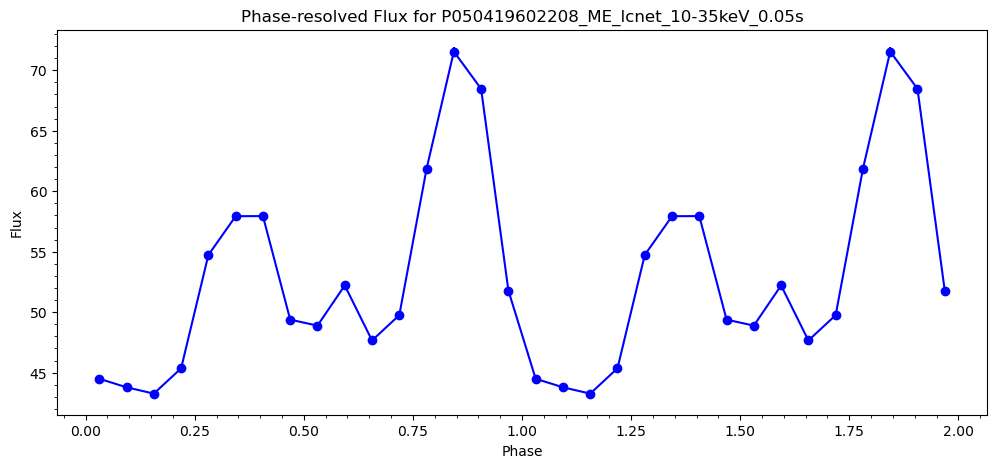

TSTART: 367543651.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602209_ME_lcnet_10-35keV_0.05s.lc
First event time: 367543651.025
Last event time: 367550820.97499996
Total duration: 7169.949999988079 seconds
raw time value: [3.67543651e+08 3.67543651e+08 3.67543651e+08 3.67543651e+08
 3.67543651e+08 3.67543651e+08 3.67543651e+08 3.67543651e+08
 3.67543651e+08 3.67543651e+08]
converted from reference epoch time:  [3.73465746e+08 3.73465746e+08 3.73465746e+08 3.73465746e+08
 3.73465746e+08 3.73465746e+08 3.73465746e+08 3.73465746e+08
 3.73465746e+08 3.73465746e+08]


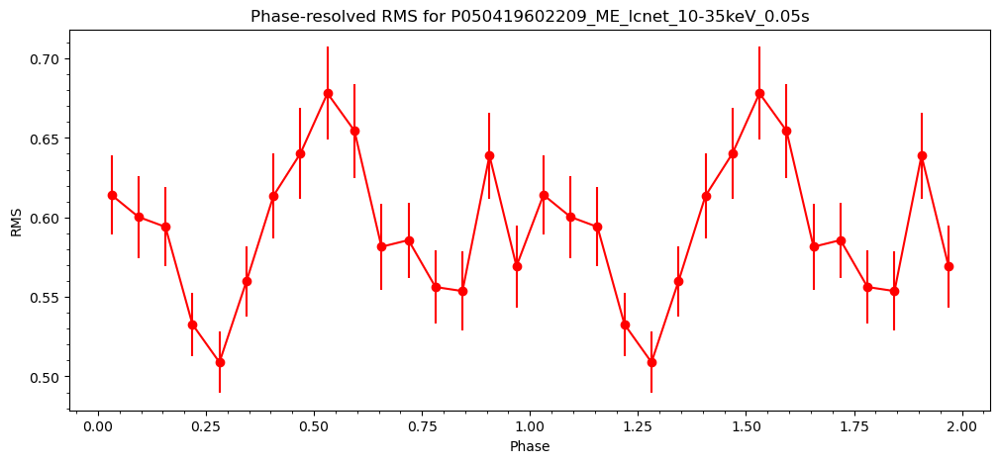

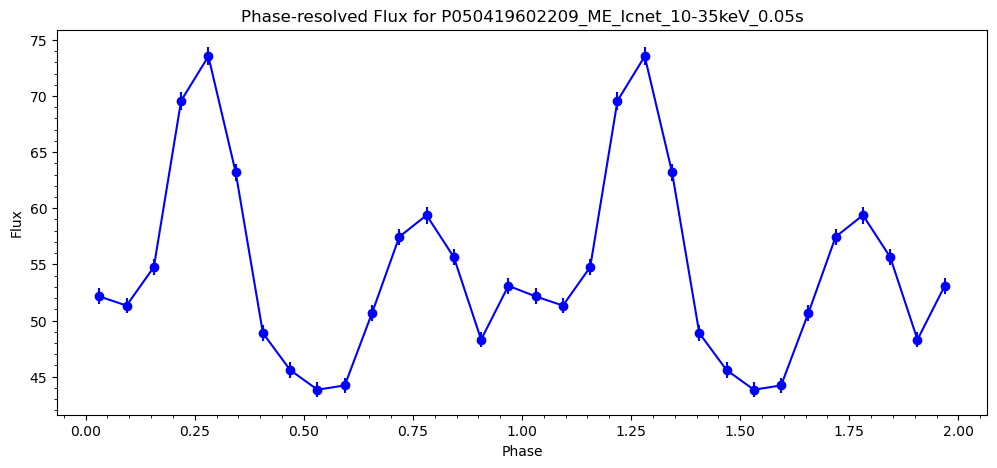

TSTART: 367555058.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602210_ME_lcnet_10-35keV_0.05s.lc
First event time: 367555058.025
Last event time: 367564207.97499996
Total duration: 9149.949999988079 seconds
raw time value: [3.67555058e+08 3.67555058e+08 3.67555058e+08 3.67555058e+08
 3.67555058e+08 3.67555058e+08 3.67555058e+08 3.67555058e+08
 3.67555058e+08 3.67555058e+08]
converted from reference epoch time:  [3.7348856e+08 3.7348856e+08 3.7348856e+08 3.7348856e+08 3.7348856e+08
 3.7348856e+08 3.7348856e+08 3.7348856e+08 3.7348856e+08 3.7348856e+08]


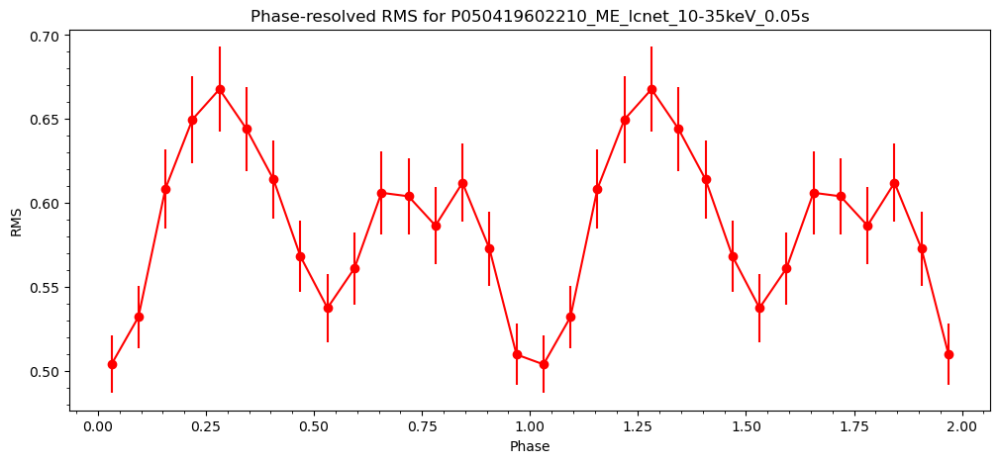

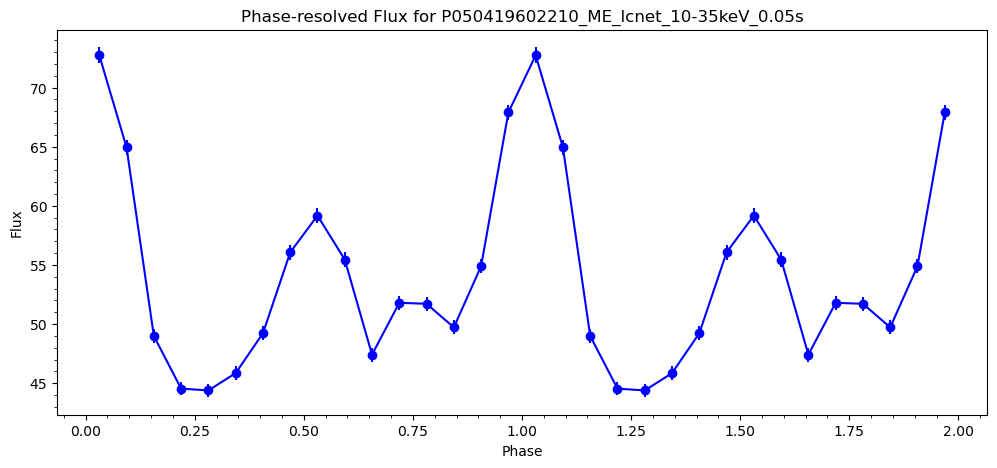

TSTART: 367566636.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602211_ME_lcnet_10-35keV_0.05s.lc
First event time: 367566636.025
Last event time: 367575005.97499996
Total duration: 8369.949999988079 seconds
raw time value: [3.67566636e+08 3.67566636e+08 3.67566636e+08 3.67566636e+08
 3.67566636e+08 3.67566636e+08 3.67566636e+08 3.67566636e+08
 3.67566636e+08 3.67566636e+08]
converted from reference epoch time:  [3.73511716e+08 3.73511716e+08 3.73511716e+08 3.73511716e+08
 3.73511716e+08 3.73511716e+08 3.73511716e+08 3.73511716e+08
 3.73511716e+08 3.73511716e+08]


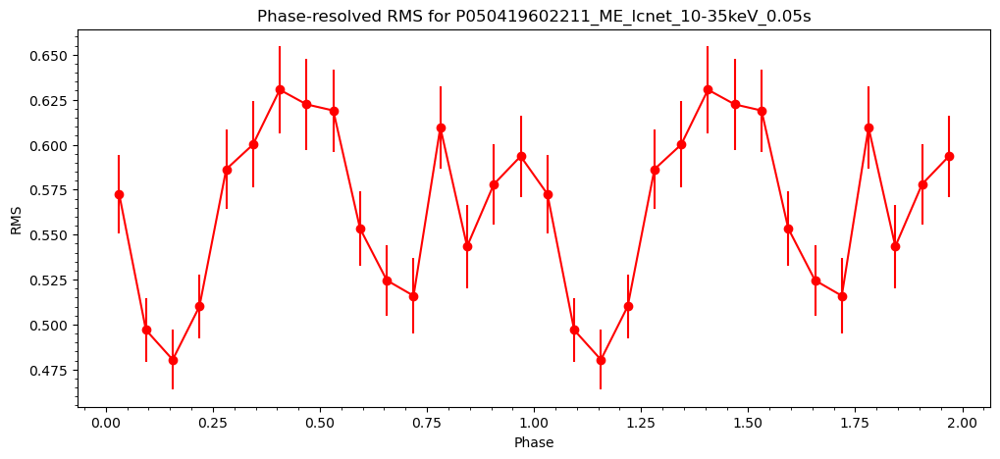

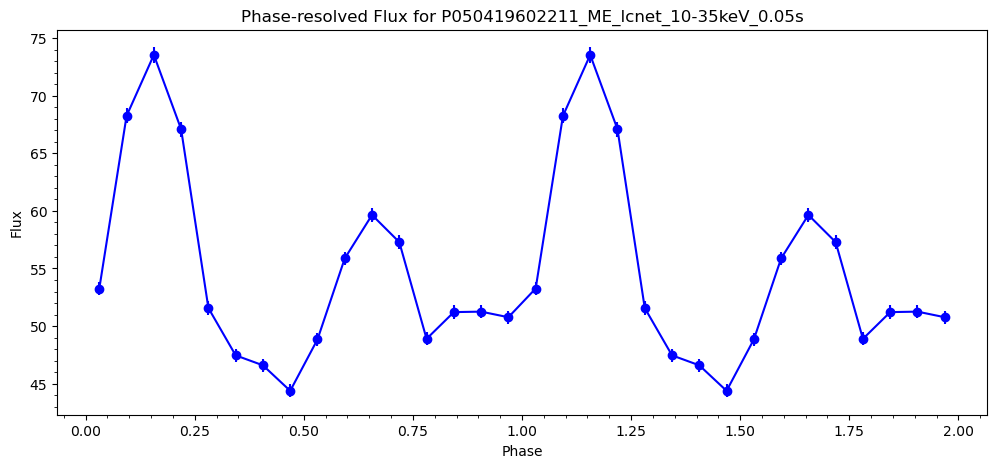

In [15]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_ME_manual.txt'  # Adjust the path as needed
main(input_file)

TSTART: 365108004.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900101_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365108004.525
Last event time: 365116825.47499996
Total duration: 8820.949999988079 seconds
raw time value: [3.65108005e+08 3.65108005e+08 3.65108005e+08 3.65108005e+08
 3.65108005e+08 3.65108005e+08 3.65108005e+08 3.65108005e+08
 3.65108005e+08 3.65108005e+08]
converted from reference epoch time:  [3.68594453e+08 3.68594453e+08 3.68594453e+08 3.68594453e+08
 3.68594453e+08 3.68594453e+08 3.68594453e+08 3.68594453e+08
 3.68594453e+08 3.68594453e+08]


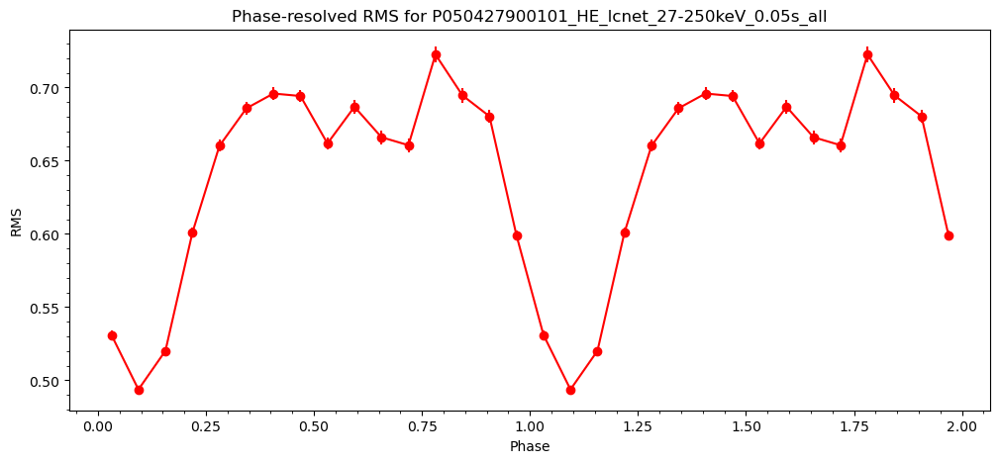

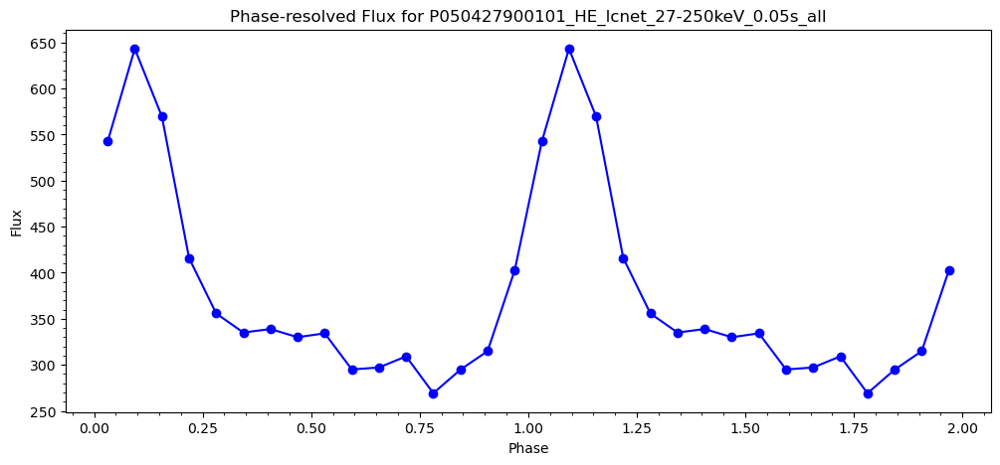

TSTART: 365133428.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900103_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365133428.025
Last event time: 365145256.47499996
Total duration: 11828.449999988079 seconds
raw time value: [3.65133428e+08 3.65133428e+08 3.65133428e+08 3.65133428e+08
 3.65133428e+08 3.65133428e+08 3.65133428e+08 3.65133428e+08
 3.65133428e+08 3.65133428e+08]
converted from reference epoch time:  [3.686453e+08 3.686453e+08 3.686453e+08 3.686453e+08 3.686453e+08
 3.686453e+08 3.686453e+08 3.686453e+08 3.686453e+08 3.686453e+08]


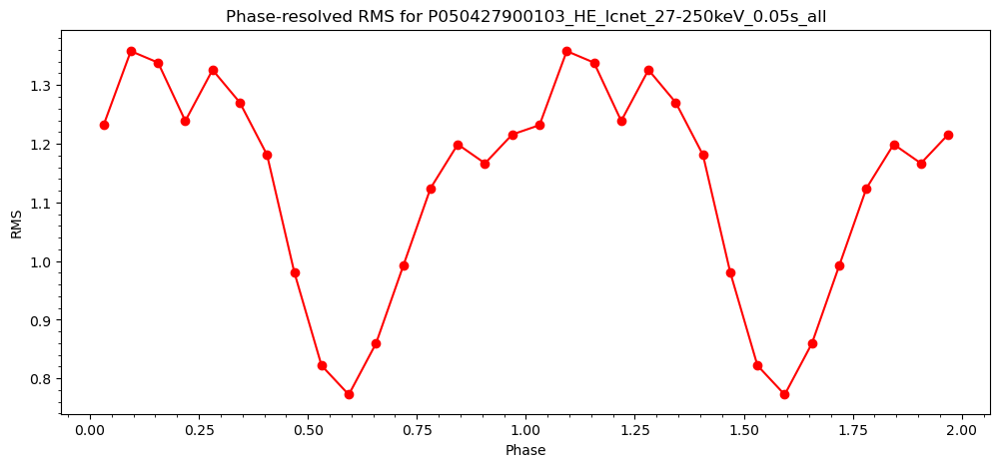

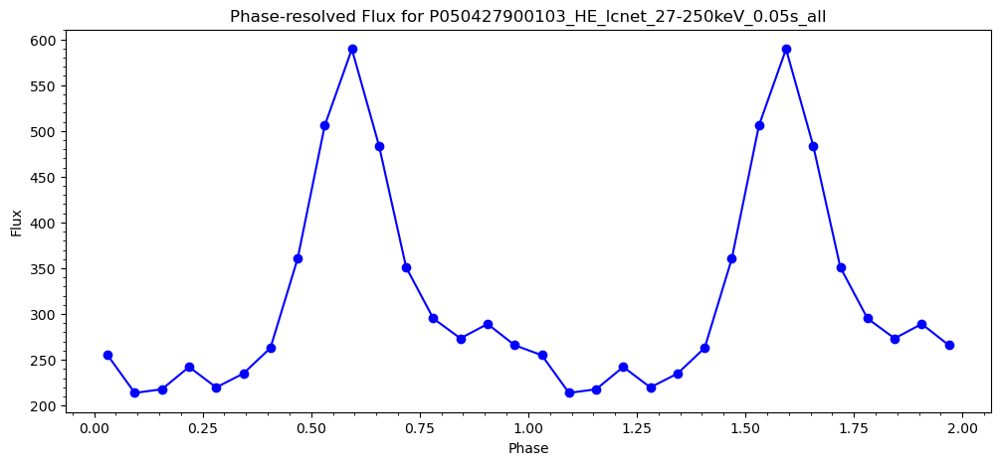

TSTART: 365147893.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504279/P0504279001/pipeline_output/P050427900104_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365147893.525
Last event time: 365162558.47499996
Total duration: 14664.949999988079 seconds
raw time value: [3.65147894e+08 3.65147894e+08 3.65147894e+08 3.65147894e+08
 3.65147894e+08 3.65147894e+08 3.65147894e+08 3.65147894e+08
 3.65147894e+08 3.65147894e+08]
converted from reference epoch time:  [3.68674231e+08 3.68674231e+08 3.68674231e+08 3.68674231e+08
 3.68674231e+08 3.68674231e+08 3.68674231e+08 3.68674231e+08
 3.68674231e+08 3.68674231e+08]


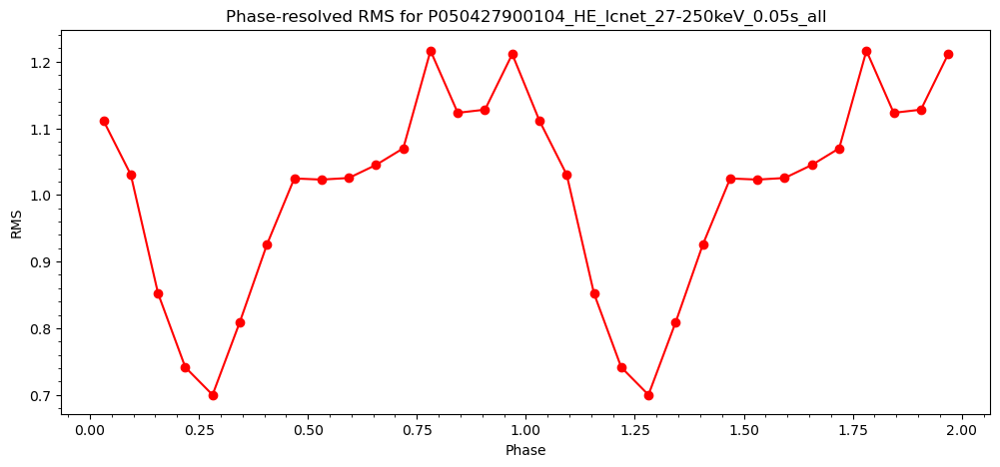

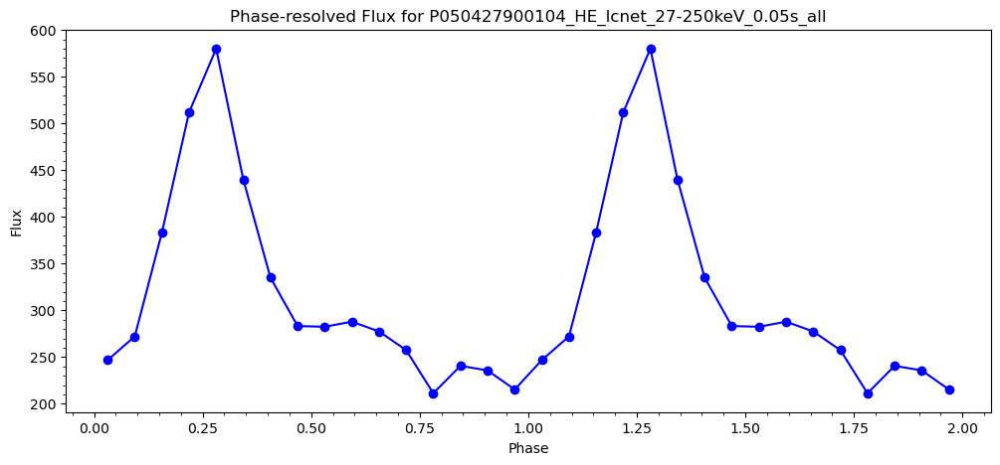

TSTART: 365244940.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600101_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365244940.525
Last event time: 365258759.47499996
Total duration: 13818.949999988079 seconds
raw time value: [3.65244941e+08 3.65244941e+08 3.65244941e+08 3.65244941e+08
 3.65244941e+08 3.65244941e+08 3.65244941e+08 3.65244941e+08
 3.65244941e+08 3.65244941e+08]
converted from reference epoch time:  [3.68868325e+08 3.68868325e+08 3.68868325e+08 3.68868325e+08
 3.68868325e+08 3.68868325e+08 3.68868325e+08 3.68868325e+08
 3.68868325e+08 3.68868325e+08]


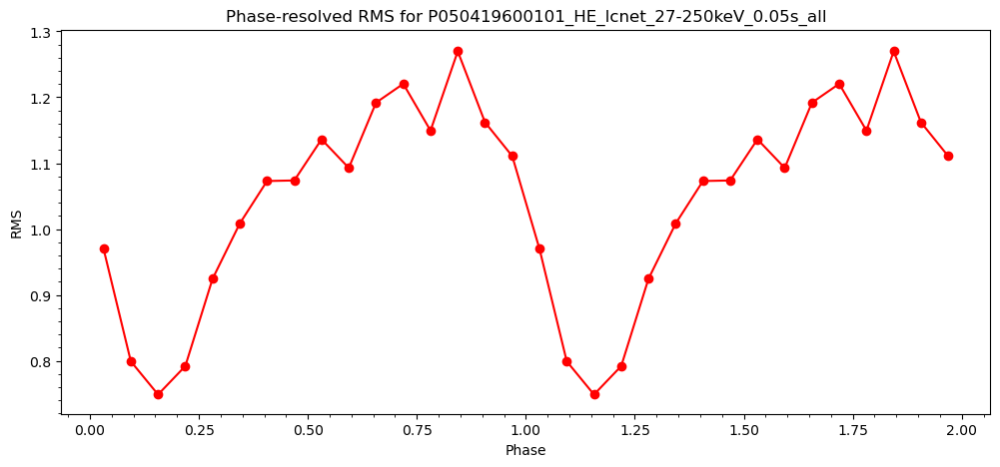

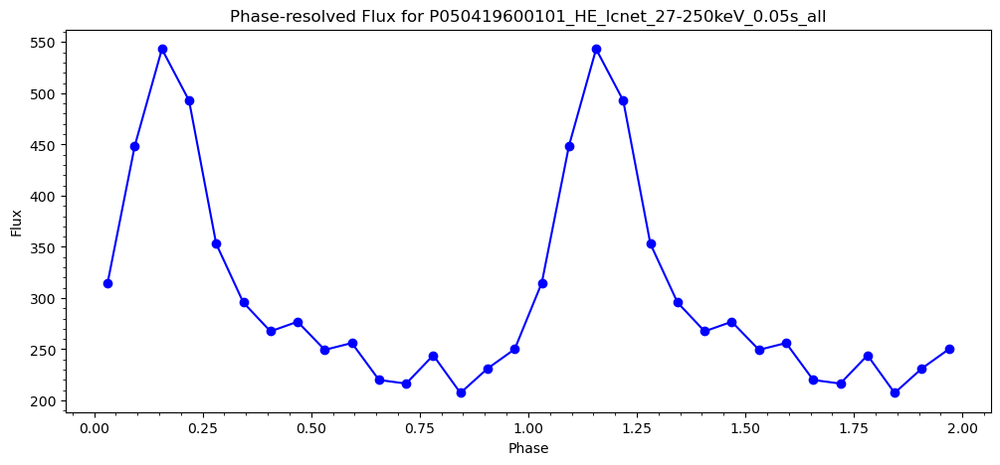

TSTART: 365275724.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600103_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365275724.025
Last event time: 365276776.47499996
Total duration: 1052.449999988079 seconds
raw time value: [3.65275724e+08 3.65275724e+08 3.65275724e+08 3.65275724e+08
 3.65275724e+08 3.65275724e+08 3.65275724e+08 3.65275724e+08
 3.65275724e+08 3.65275724e+08]
converted from reference epoch time:  [3.68929892e+08 3.68929892e+08 3.68929892e+08 3.68929892e+08
 3.68929892e+08 3.68929892e+08 3.68929892e+08 3.68929892e+08
 3.68929892e+08 3.68929892e+08]


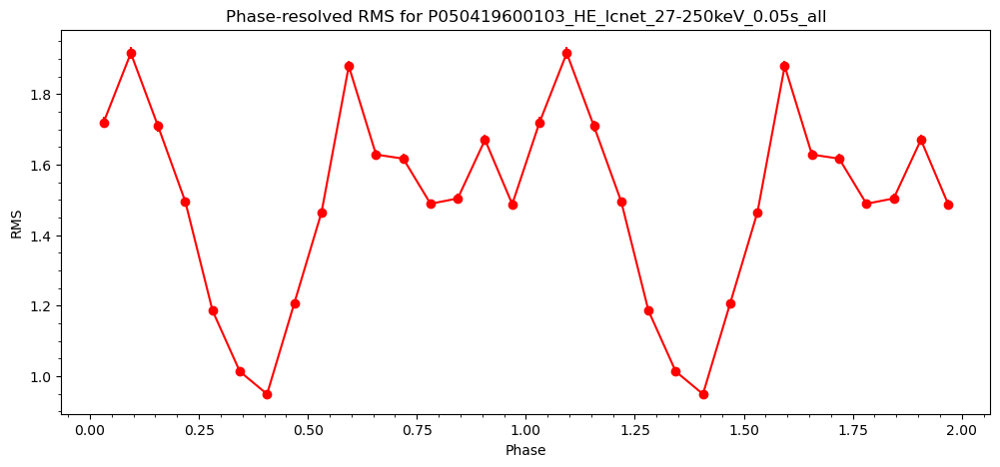

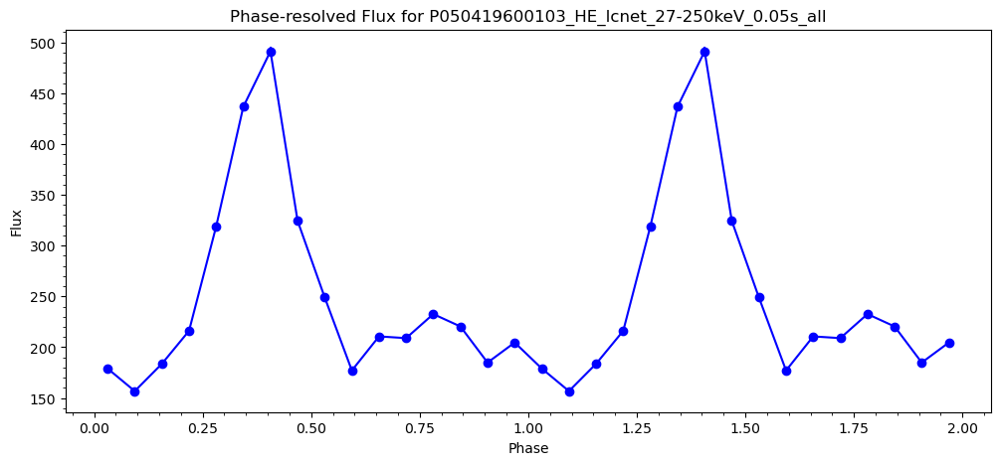

TSTART: 365262066.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196001/pipeline_output/P050419600102_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365262066.525
Last event time: 365264575.47499996
Total duration: 2508.949999988079 seconds
raw time value: [3.65262067e+08 3.65262067e+08 3.65262067e+08 3.65262067e+08
 3.65262067e+08 3.65262067e+08 3.65262067e+08 3.65262067e+08
 3.65262067e+08 3.65262067e+08]
converted from reference epoch time:  [3.68902577e+08 3.68902577e+08 3.68902577e+08 3.68902577e+08
 3.68902577e+08 3.68902577e+08 3.68902577e+08 3.68902577e+08
 3.68902577e+08 3.68902577e+08]


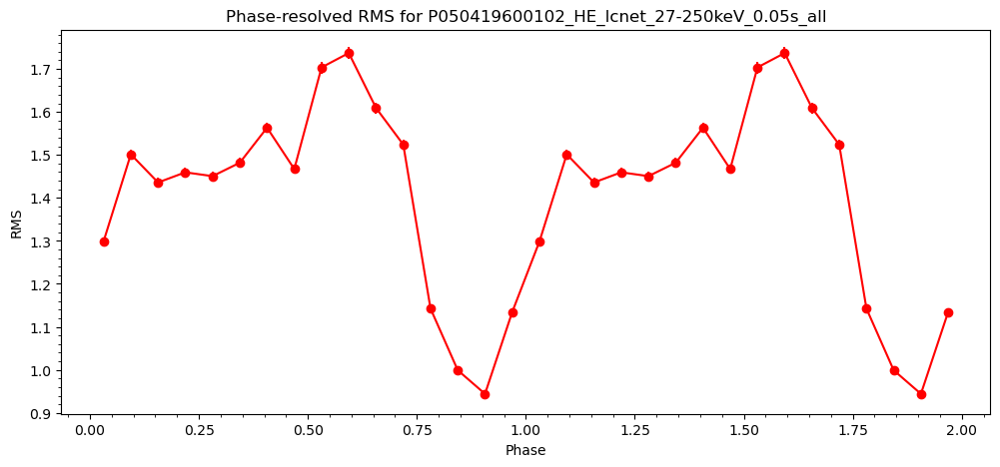

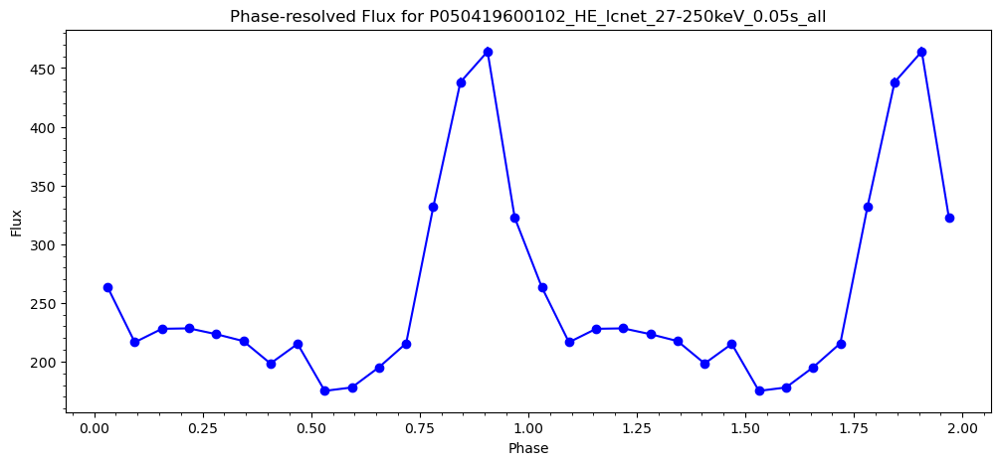

TSTART: 365347895.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600201_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365347895.525
Last event time: 365362409.47499996
Total duration: 14513.949999988079 seconds
raw time value: [3.65347896e+08 3.65347896e+08 3.65347896e+08 3.65347896e+08
 3.65347896e+08 3.65347896e+08 3.65347896e+08 3.65347896e+08
 3.65347896e+08 3.65347896e+08]
converted from reference epoch time:  [3.69074235e+08 3.69074235e+08 3.69074235e+08 3.69074235e+08
 3.69074235e+08 3.69074235e+08 3.69074235e+08 3.69074235e+08
 3.69074235e+08 3.69074235e+08]


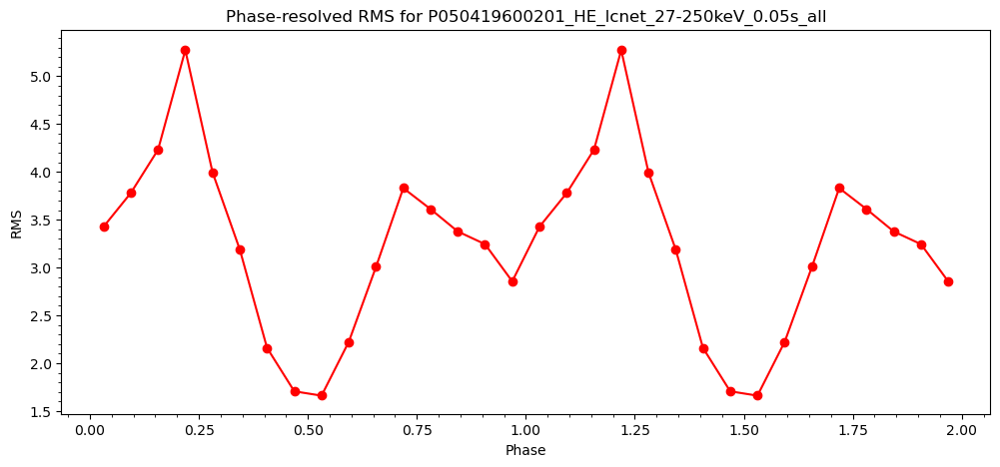

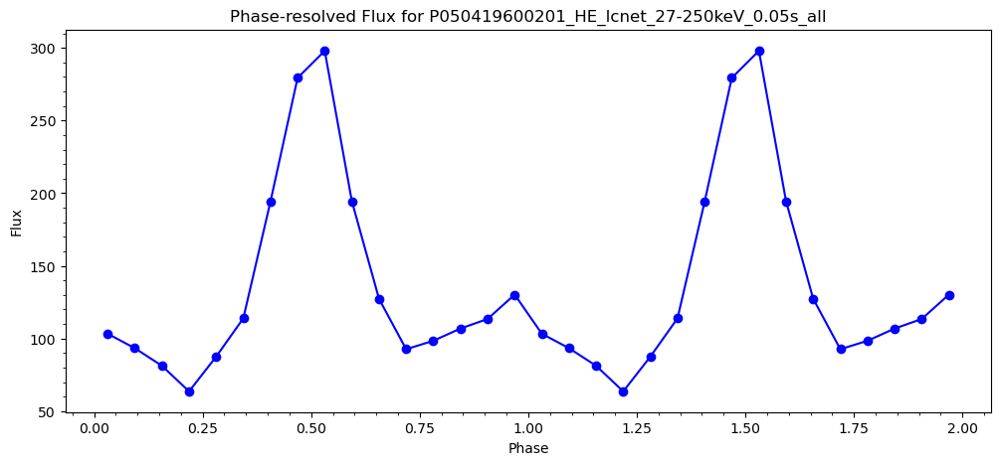

TSTART: 365364818.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196002/pipeline_output/P050419600202_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365364818.525
Last event time: 365379381.97499996
Total duration: 14563.449999988079 seconds
raw time value: [3.65364819e+08 3.65364819e+08 3.65364819e+08 3.65364819e+08
 3.65364819e+08 3.65364819e+08 3.65364819e+08 3.65364819e+08
 3.65364819e+08 3.65364819e+08]
converted from reference epoch time:  [3.69108081e+08 3.69108081e+08 3.69108081e+08 3.69108081e+08
 3.69108081e+08 3.69108081e+08 3.69108081e+08 3.69108081e+08
 3.69108081e+08 3.69108081e+08]


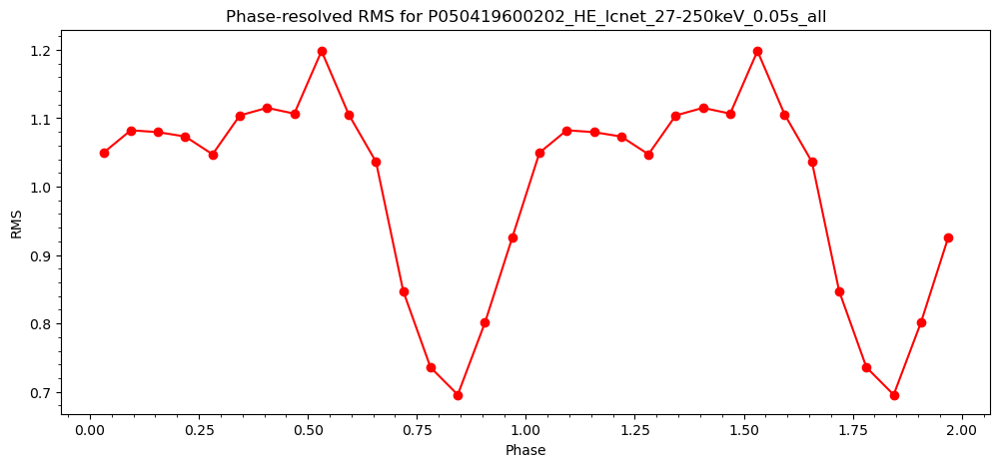

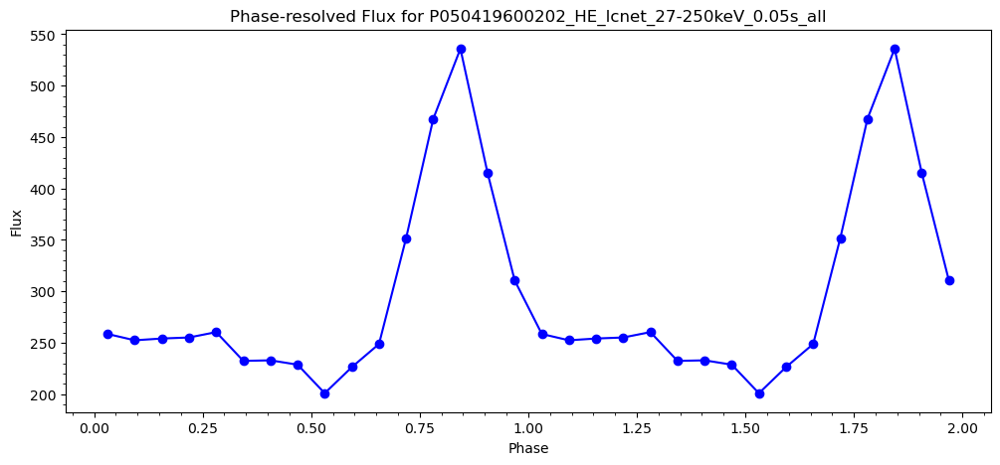

TSTART: 365416501.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600301_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365416501.525
Last event time: 365429968.47499996
Total duration: 13466.949999988079 seconds
raw time value: [3.65416502e+08 3.65416502e+08 3.65416502e+08 3.65416502e+08
 3.65416502e+08 3.65416502e+08 3.65416502e+08 3.65416502e+08
 3.65416502e+08 3.65416502e+08]
converted from reference epoch time:  [3.69211447e+08 3.69211447e+08 3.69211447e+08 3.69211447e+08
 3.69211447e+08 3.69211447e+08 3.69211447e+08 3.69211447e+08
 3.69211447e+08 3.69211447e+08]


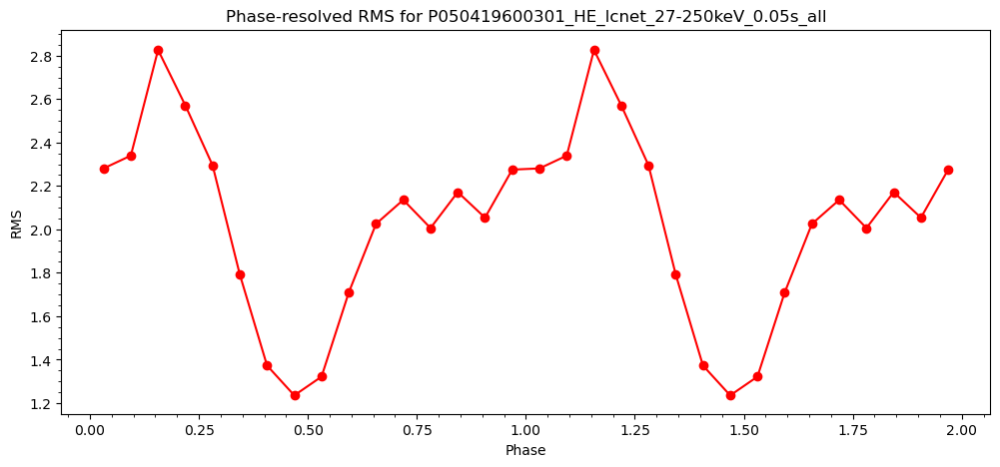

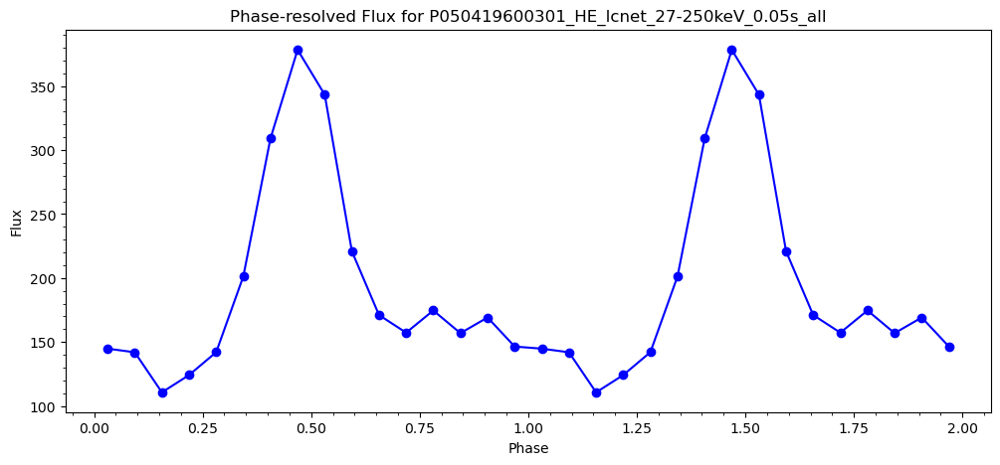

TSTART: 365433318.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600302_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365433318.525
Last event time: 365435791.47499996
Total duration: 2472.949999988079 seconds
raw time value: [3.65433319e+08 3.65433319e+08 3.65433319e+08 3.65433319e+08
 3.65433319e+08 3.65433319e+08 3.65433319e+08 3.65433319e+08
 3.65433319e+08 3.65433319e+08]
converted from reference epoch time:  [3.69245081e+08 3.69245081e+08 3.69245081e+08 3.69245081e+08
 3.69245081e+08 3.69245081e+08 3.69245081e+08 3.69245081e+08
 3.69245081e+08 3.69245081e+08]


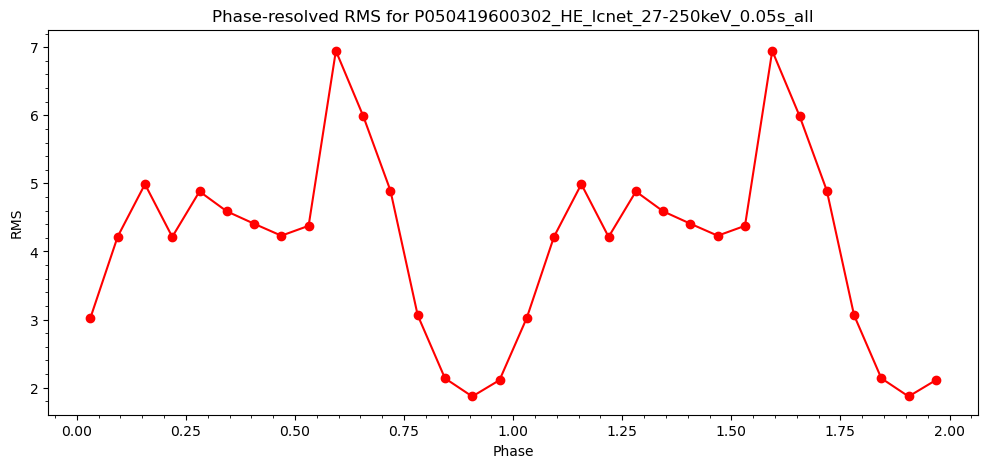

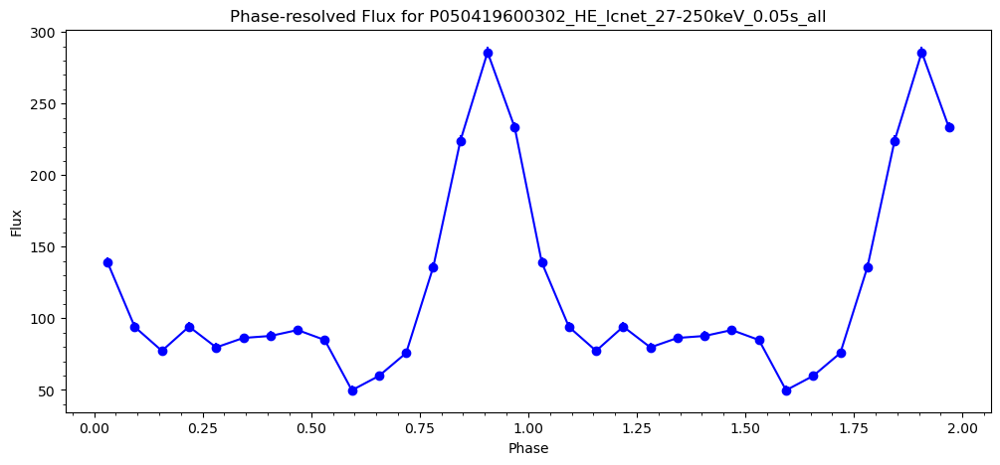

TSTART: 365444756.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196003/pipeline_output/P050419600303_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365444756.525
Last event time: 365453749.47499996
Total duration: 8992.949999988079 seconds
raw time value: [3.65444757e+08 3.65444757e+08 3.65444757e+08 3.65444757e+08
 3.65444757e+08 3.65444757e+08 3.65444757e+08 3.65444757e+08
 3.65444757e+08 3.65444757e+08]
converted from reference epoch time:  [3.69267957e+08 3.69267957e+08 3.69267957e+08 3.69267957e+08
 3.69267957e+08 3.69267957e+08 3.69267957e+08 3.69267957e+08
 3.69267957e+08 3.69267957e+08]


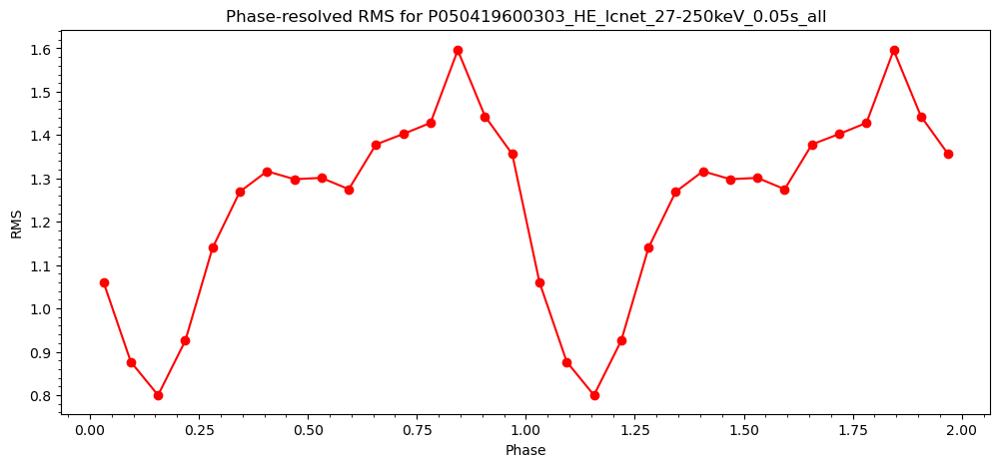

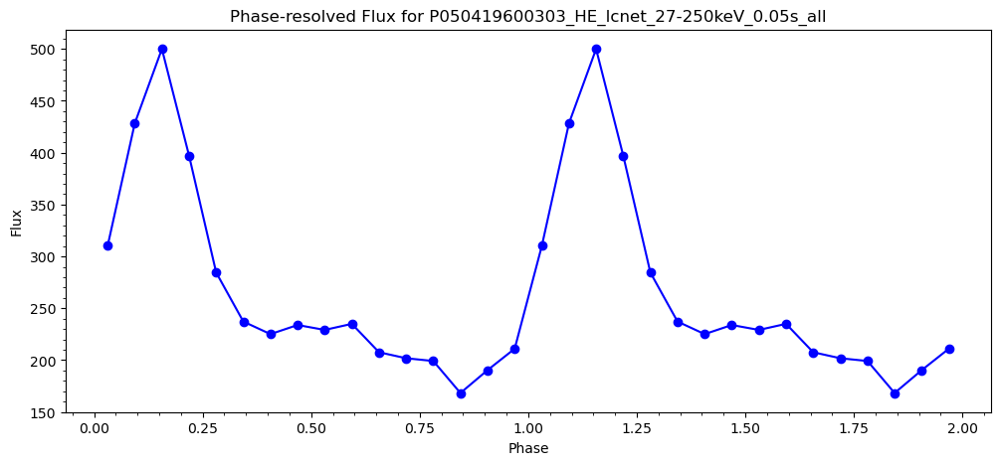

TSTART: 365530406.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600402_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365530406.525
Last event time: 365539378.47499996
Total duration: 8971.949999988079 seconds
raw time value: [3.65530407e+08 3.65530407e+08 3.65530407e+08 3.65530407e+08
 3.65530407e+08 3.65530407e+08 3.65530407e+08 3.65530407e+08
 3.65530407e+08 3.65530407e+08]
converted from reference epoch time:  [3.69439257e+08 3.69439257e+08 3.69439257e+08 3.69439257e+08
 3.69439257e+08 3.69439257e+08 3.69439257e+08 3.69439257e+08
 3.69439257e+08 3.69439257e+08]


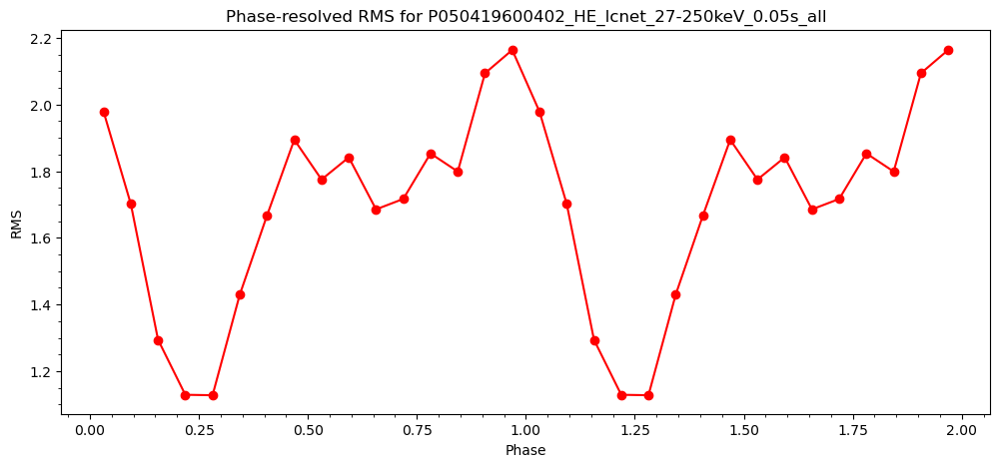

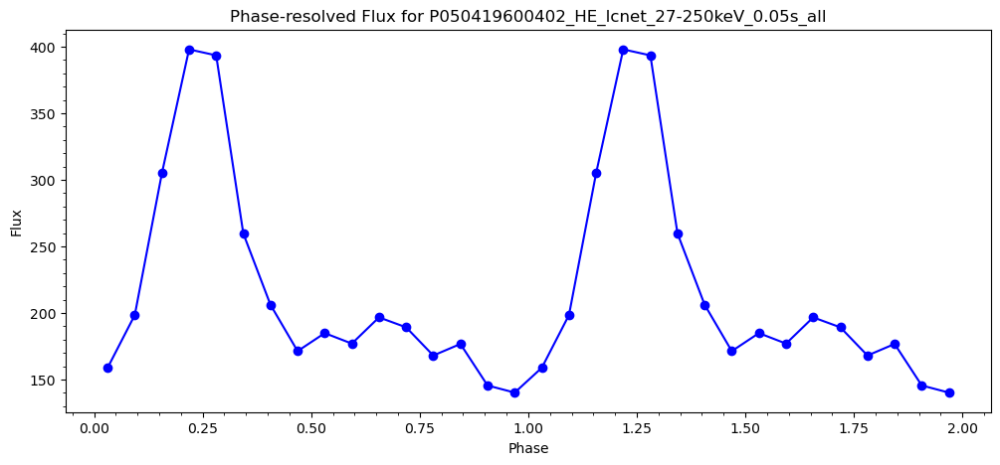

TSTART: 365541932.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196004/pipeline_output/P050419600403_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365541932.525
Last event time: 365545087.47499996
Total duration: 3154.949999988079 seconds
raw time value: [3.65541933e+08 3.65541933e+08 3.65541933e+08 3.65541933e+08
 3.65541933e+08 3.65541933e+08 3.65541933e+08 3.65541933e+08
 3.65541933e+08 3.65541933e+08]
converted from reference epoch time:  [3.69462309e+08 3.69462309e+08 3.69462309e+08 3.69462309e+08
 3.69462309e+08 3.69462309e+08 3.69462309e+08 3.69462309e+08
 3.69462309e+08 3.69462309e+08]


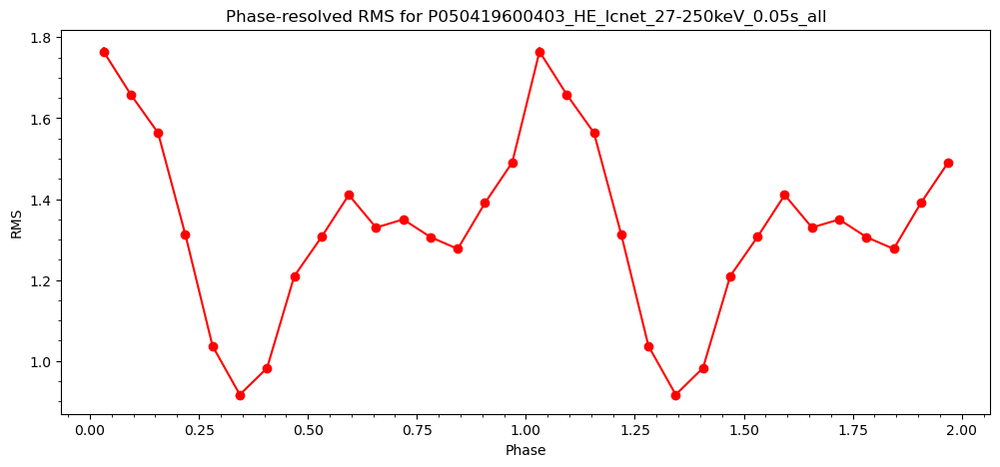

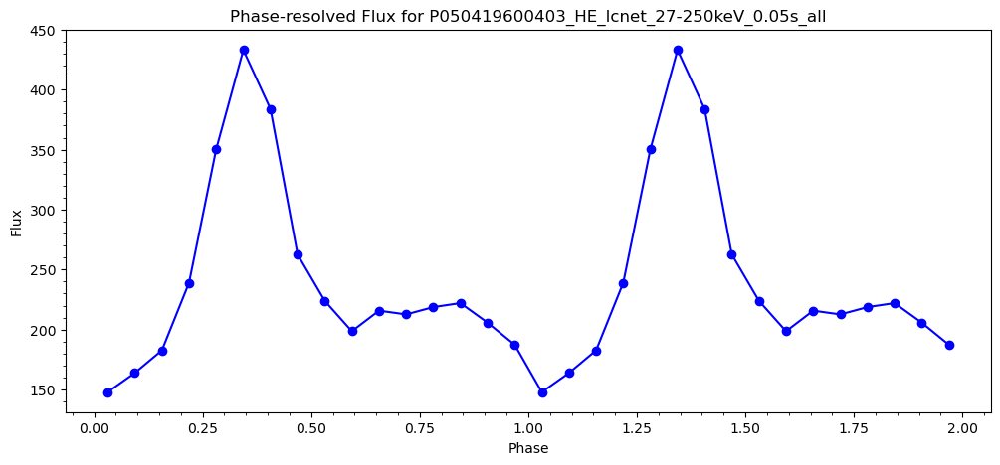

TSTART: 365606677.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600501_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365606677.025
Last event time: 365619298.47499996
Total duration: 12621.449999988079 seconds
raw time value: [3.65606677e+08 3.65606677e+08 3.65606677e+08 3.65606677e+08
 3.65606677e+08 3.65606677e+08 3.65606677e+08 3.65606677e+08
 3.65606677e+08 3.65606677e+08]
converted from reference epoch time:  [3.69591798e+08 3.69591798e+08 3.69591798e+08 3.69591798e+08
 3.69591798e+08 3.69591798e+08 3.69591798e+08 3.69591798e+08
 3.69591798e+08 3.69591798e+08]


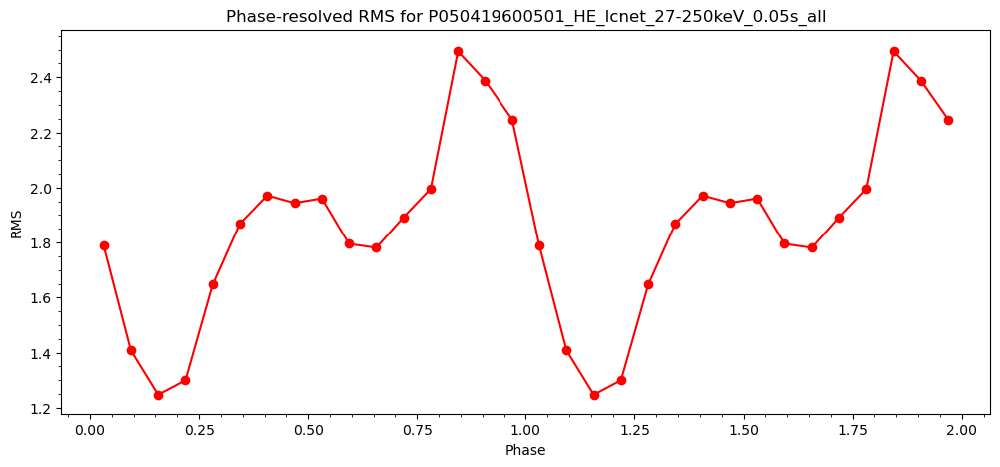

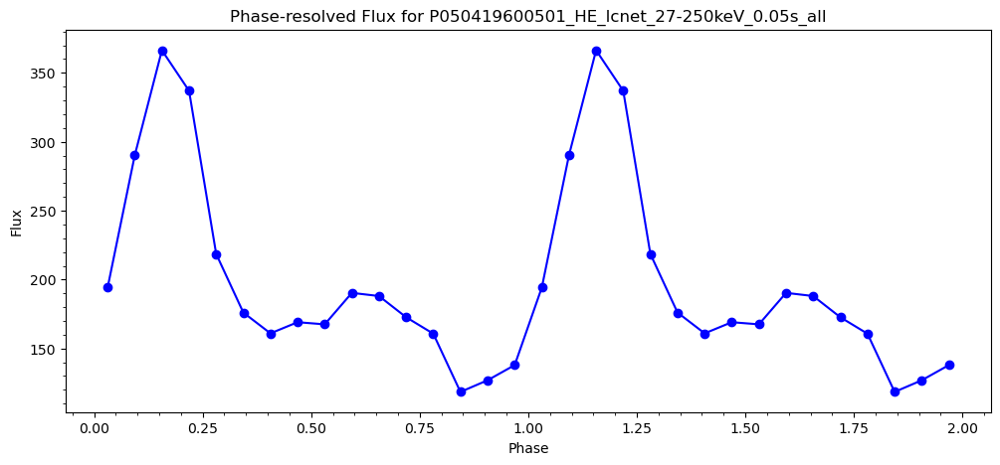

TSTART: 365621898.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196005/pipeline_output/P050419600502_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365621898.525
Last event time: 365630684.47499996
Total duration: 8785.949999988079 seconds
raw time value: [3.65621899e+08 3.65621899e+08 3.65621899e+08 3.65621899e+08
 3.65621899e+08 3.65621899e+08 3.65621899e+08 3.65621899e+08
 3.65621899e+08 3.65621899e+08]
converted from reference epoch time:  [3.69622241e+08 3.69622241e+08 3.69622241e+08 3.69622241e+08
 3.69622241e+08 3.69622241e+08 3.69622241e+08 3.69622241e+08
 3.69622241e+08 3.69622241e+08]


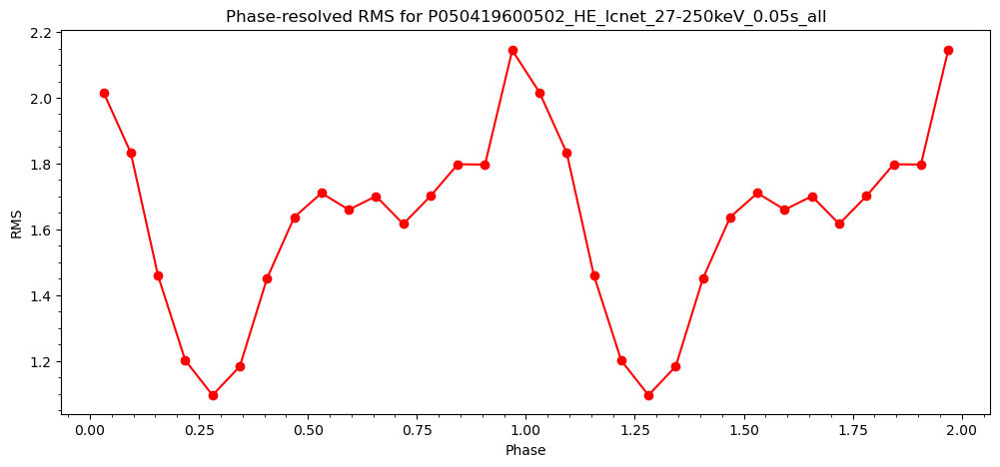

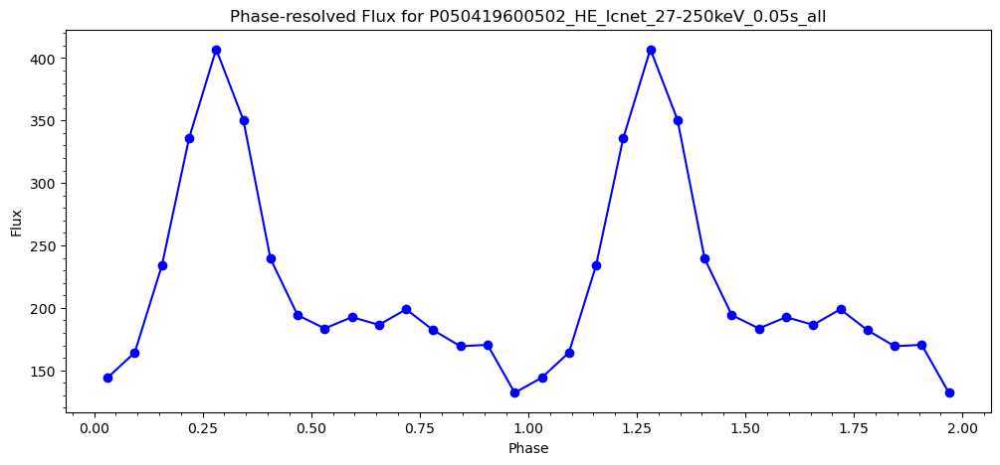

TSTART: 365708756.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600601_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365708756.525
Last event time: 365716264.47499996
Total duration: 7507.949999988079 seconds
raw time value: [3.65708757e+08 3.65708757e+08 3.65708757e+08 3.65708757e+08
 3.65708757e+08 3.65708757e+08 3.65708757e+08 3.65708757e+08
 3.65708757e+08 3.65708757e+08]
converted from reference epoch time:  [3.69795957e+08 3.69795957e+08 3.69795957e+08 3.69795957e+08
 3.69795957e+08 3.69795957e+08 3.69795957e+08 3.69795957e+08
 3.69795957e+08 3.69795957e+08]


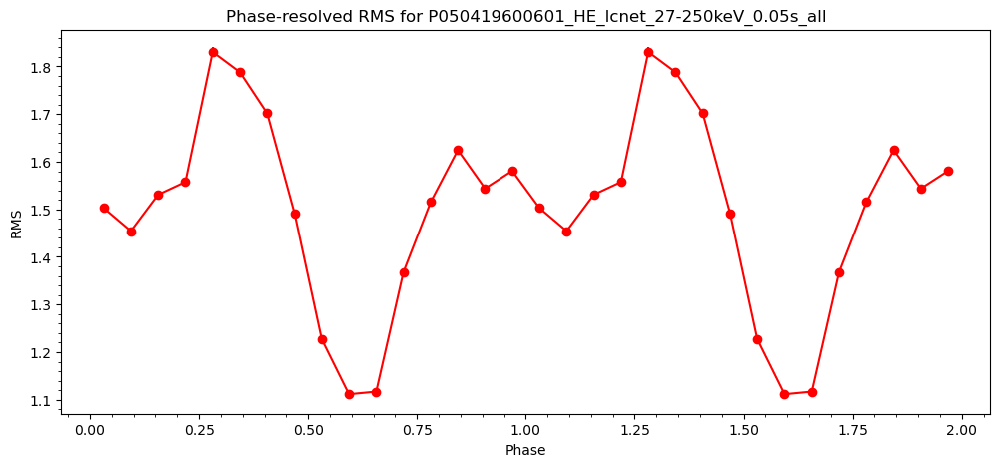

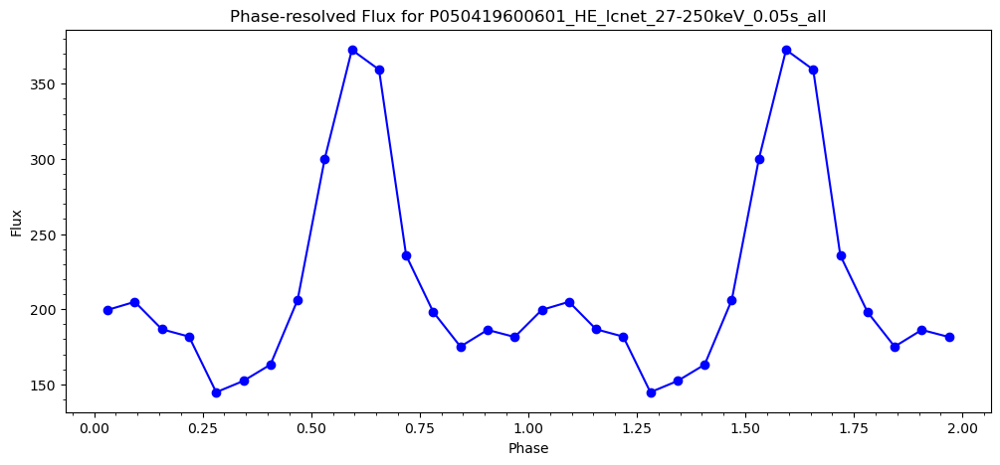

TSTART: 365735837.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196006/pipeline_output/P050419600603_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365735837.525
Last event time: 365741661.47499996
Total duration: 5823.949999988079 seconds
raw time value: [3.65735838e+08 3.65735838e+08 3.65735838e+08 3.65735838e+08
 3.65735838e+08 3.65735838e+08 3.65735838e+08 3.65735838e+08
 3.65735838e+08 3.65735838e+08]
converted from reference epoch time:  [3.69850119e+08 3.69850119e+08 3.69850119e+08 3.69850119e+08
 3.69850119e+08 3.69850119e+08 3.69850119e+08 3.69850119e+08
 3.69850119e+08 3.69850119e+08]


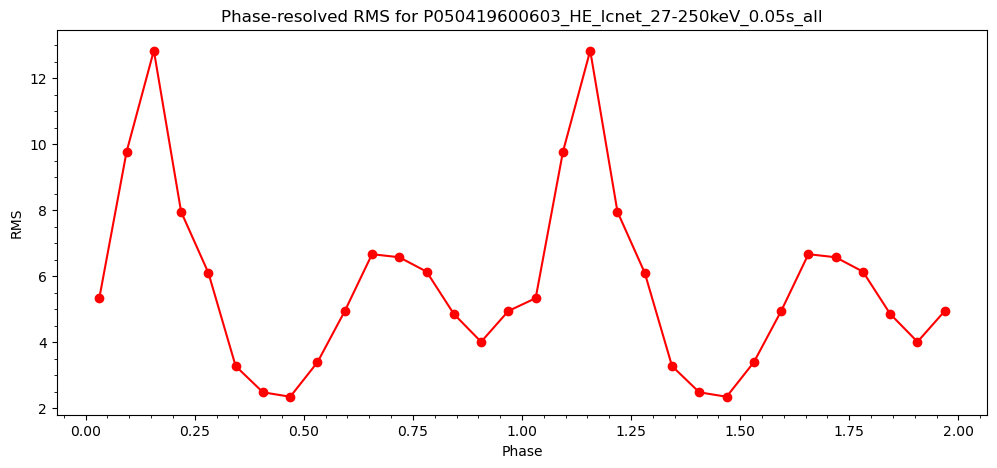

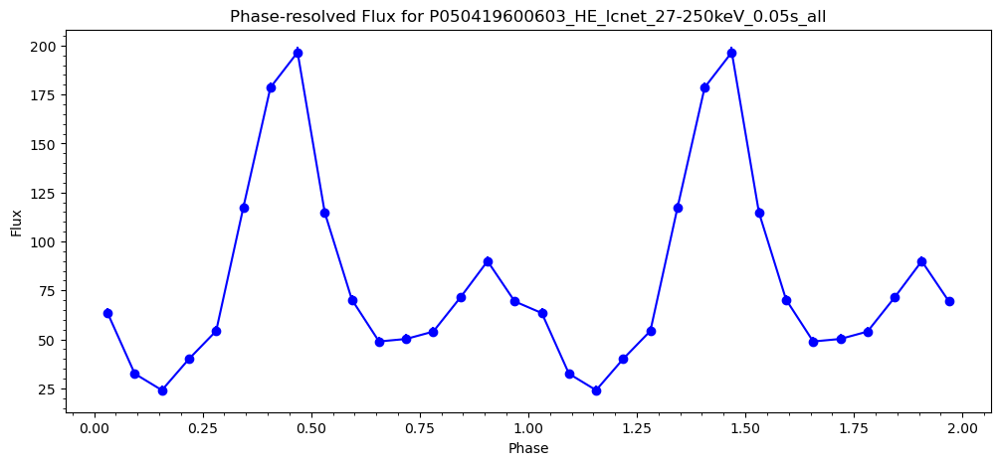

TSTART: 365827163.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600702_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365827163.525
Last event time: 365835919.47499996
Total duration: 8755.949999988079 seconds
raw time value: [3.65827164e+08 3.65827164e+08 3.65827164e+08 3.65827164e+08
 3.65827164e+08 3.65827164e+08 3.65827164e+08 3.65827164e+08
 3.65827164e+08 3.65827164e+08]
converted from reference epoch time:  [3.70032771e+08 3.70032771e+08 3.70032771e+08 3.70032771e+08
 3.70032771e+08 3.70032771e+08 3.70032771e+08 3.70032771e+08
 3.70032771e+08 3.70032771e+08]


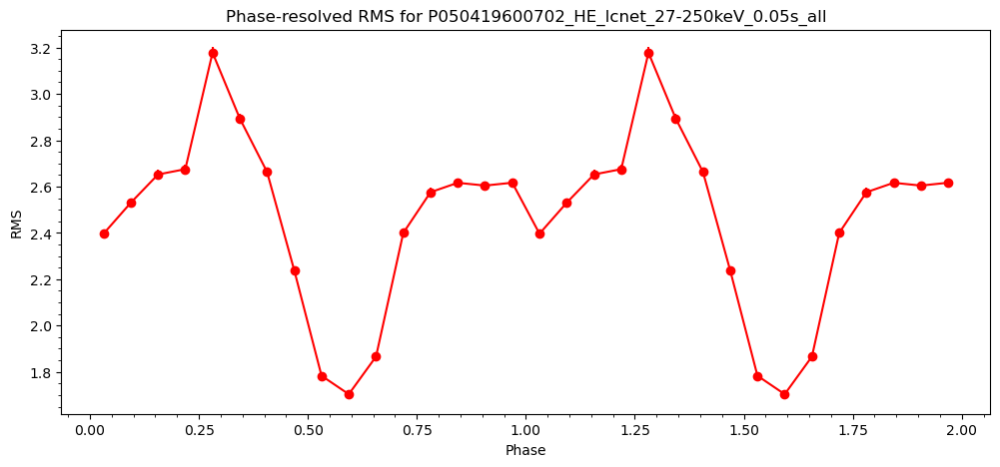

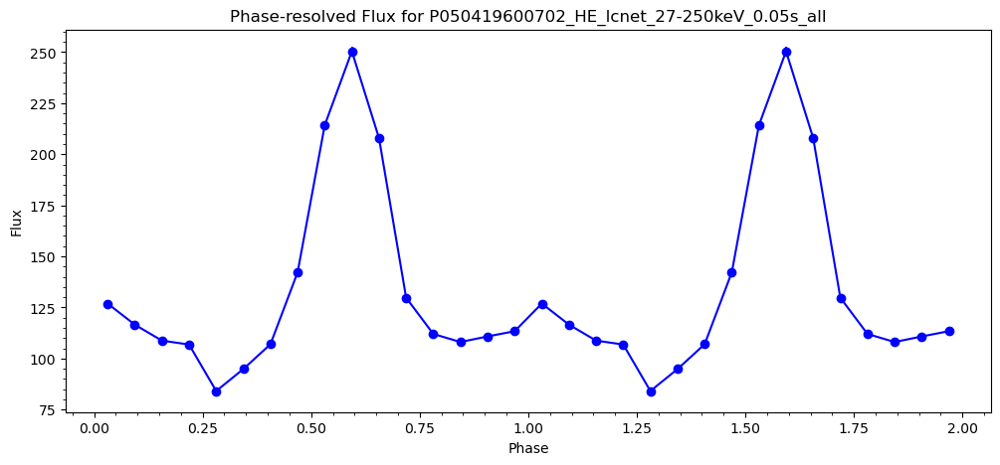

TSTART: 365838717.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196007/pipeline_output/P050419600703_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365838717.525
Last event time: 365844683.47499996
Total duration: 5965.949999988079 seconds
raw time value: [3.65838718e+08 3.65838718e+08 3.65838718e+08 3.65838718e+08
 3.65838718e+08 3.65838718e+08 3.65838718e+08 3.65838718e+08
 3.65838718e+08 3.65838718e+08]
converted from reference epoch time:  [3.70055879e+08 3.70055879e+08 3.70055879e+08 3.70055879e+08
 3.70055879e+08 3.70055879e+08 3.70055879e+08 3.70055879e+08
 3.70055879e+08 3.70055879e+08]


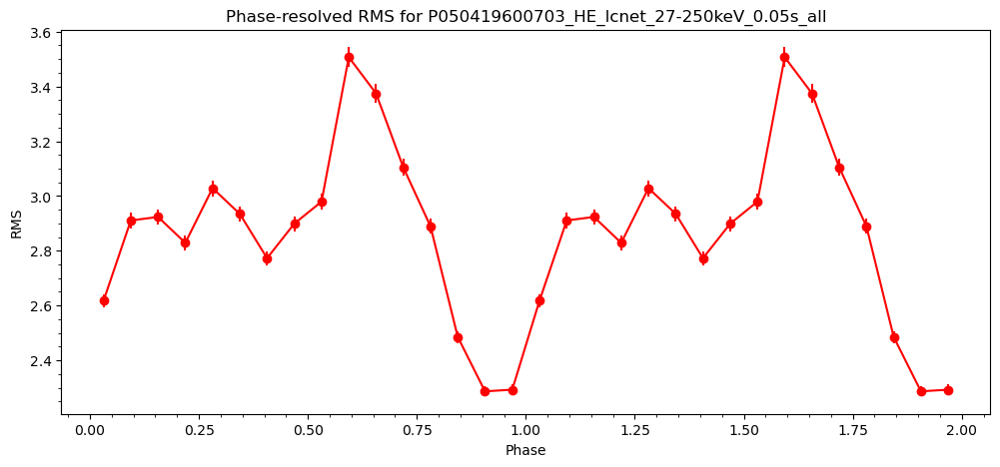

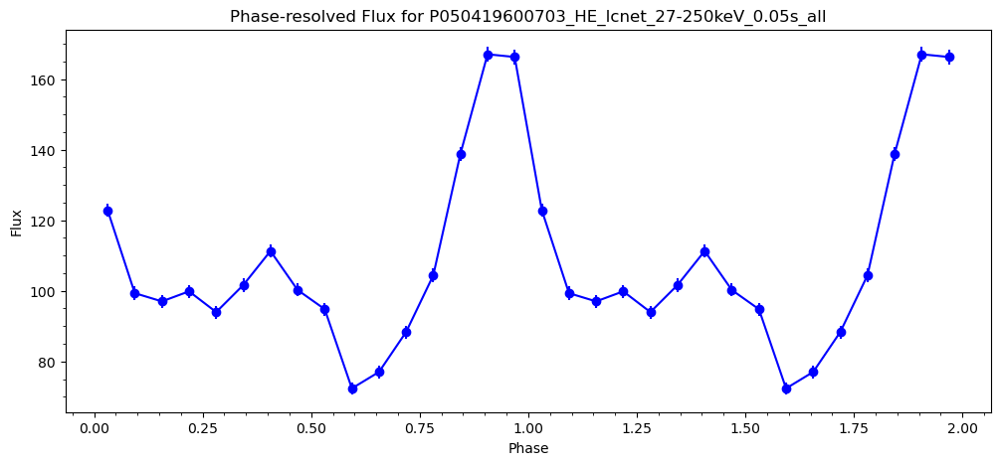

TSTART: 365879945.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196008/pipeline_output/P050419600801_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365879945.525
Last event time: 365887422.47499996
Total duration: 7476.949999988079 seconds
raw time value: [3.65879946e+08 3.65879946e+08 3.65879946e+08 3.65879946e+08
 3.65879946e+08 3.65879946e+08 3.65879946e+08 3.65879946e+08
 3.65879946e+08 3.65879946e+08]
converted from reference epoch time:  [3.70138335e+08 3.70138335e+08 3.70138335e+08 3.70138335e+08
 3.70138335e+08 3.70138335e+08 3.70138335e+08 3.70138335e+08
 3.70138335e+08 3.70138335e+08]


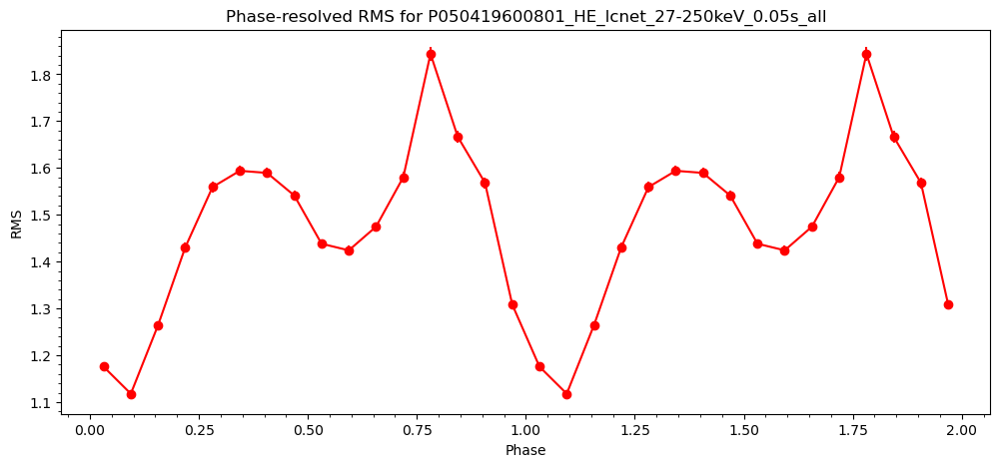

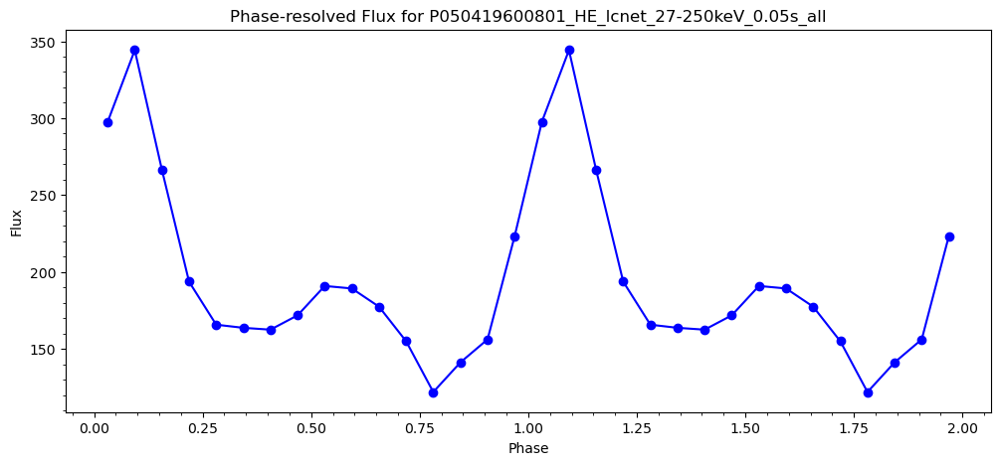

TSTART: 365983312.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600901_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365983312.025
Last event time: 365995693.47499996
Total duration: 12381.449999988079 seconds
raw time value: [3.65983312e+08 3.65983312e+08 3.65983312e+08 3.65983312e+08
 3.65983312e+08 3.65983312e+08 3.65983312e+08 3.65983312e+08
 3.65983312e+08 3.65983312e+08]
converted from reference epoch time:  [3.70345068e+08 3.70345068e+08 3.70345068e+08 3.70345068e+08
 3.70345068e+08 3.70345068e+08 3.70345068e+08 3.70345068e+08
 3.70345068e+08 3.70345068e+08]


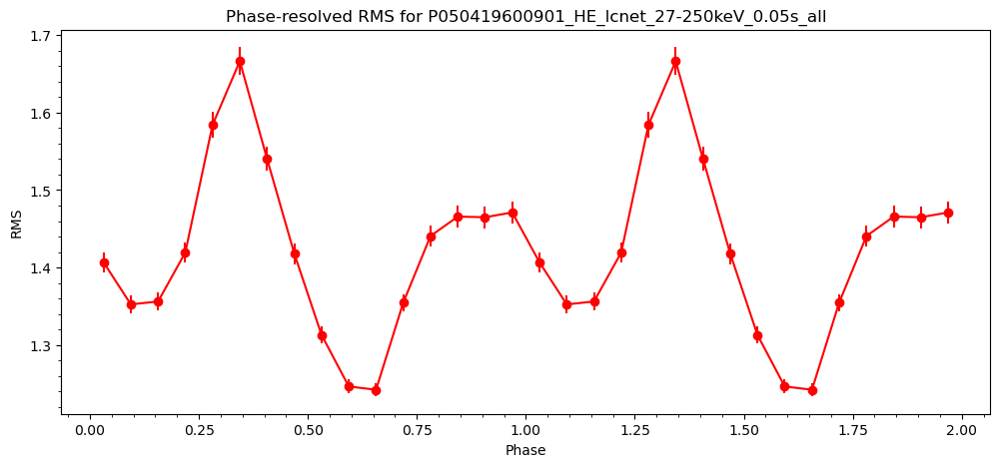

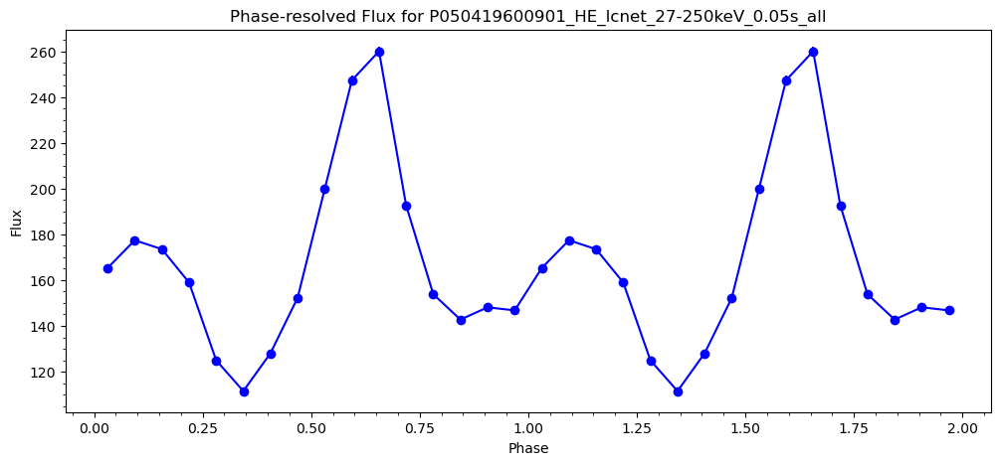

TSTART: 365999955.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196009/pipeline_output/P050419600902_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 365999955.525
Last event time: 366007085.47499996
Total duration: 7129.949999988079 seconds
raw time value: [3.65999956e+08 3.65999956e+08 3.65999956e+08 3.65999956e+08
 3.65999956e+08 3.65999956e+08 3.65999956e+08 3.65999956e+08
 3.65999956e+08 3.65999956e+08]
converted from reference epoch time:  [3.70378355e+08 3.70378355e+08 3.70378355e+08 3.70378355e+08
 3.70378355e+08 3.70378355e+08 3.70378355e+08 3.70378355e+08
 3.70378355e+08 3.70378355e+08]


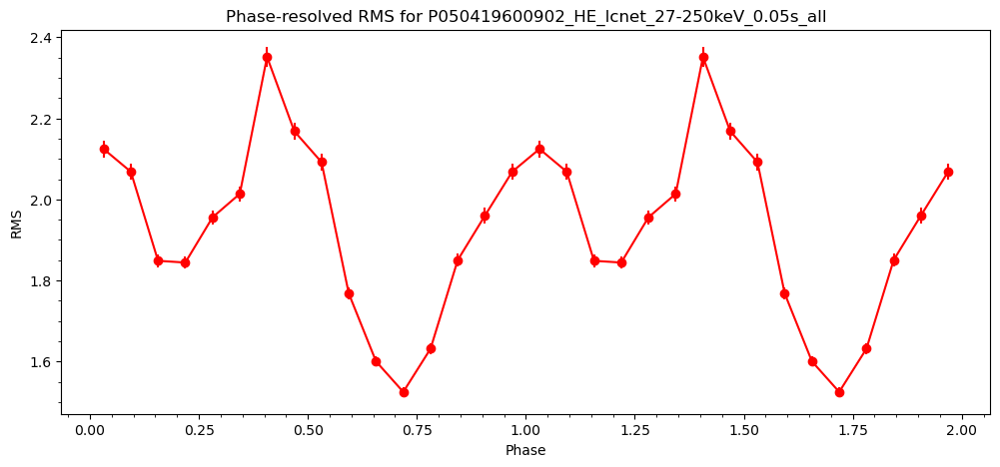

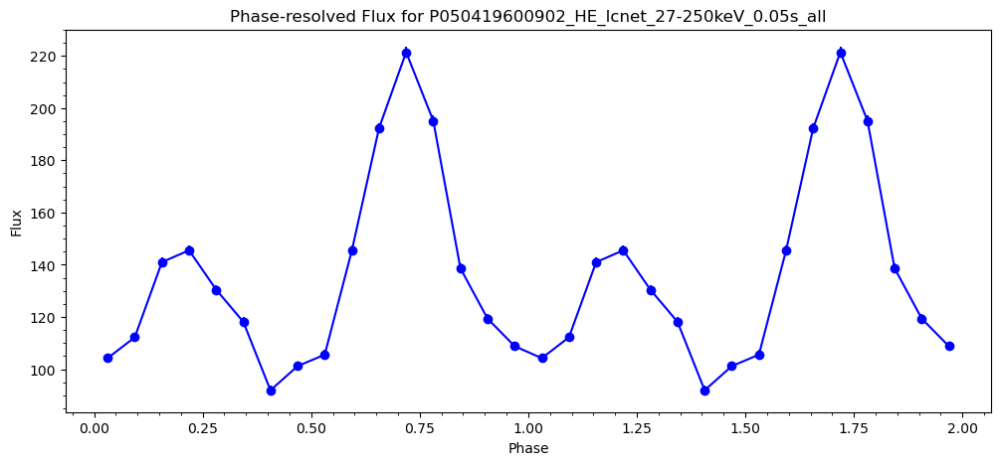

TSTART: 366171186.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196010/pipeline_output/P050419601001_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366171186.525
Last event time: 366183279.47499996
Total duration: 12092.949999988079 seconds
raw time value: [3.66171187e+08 3.66171187e+08 3.66171187e+08 3.66171187e+08
 3.66171187e+08 3.66171187e+08 3.66171187e+08 3.66171187e+08
 3.66171187e+08 3.66171187e+08]
converted from reference epoch time:  [3.70720817e+08 3.70720817e+08 3.70720817e+08 3.70720817e+08
 3.70720817e+08 3.70720817e+08 3.70720817e+08 3.70720817e+08
 3.70720817e+08 3.70720817e+08]


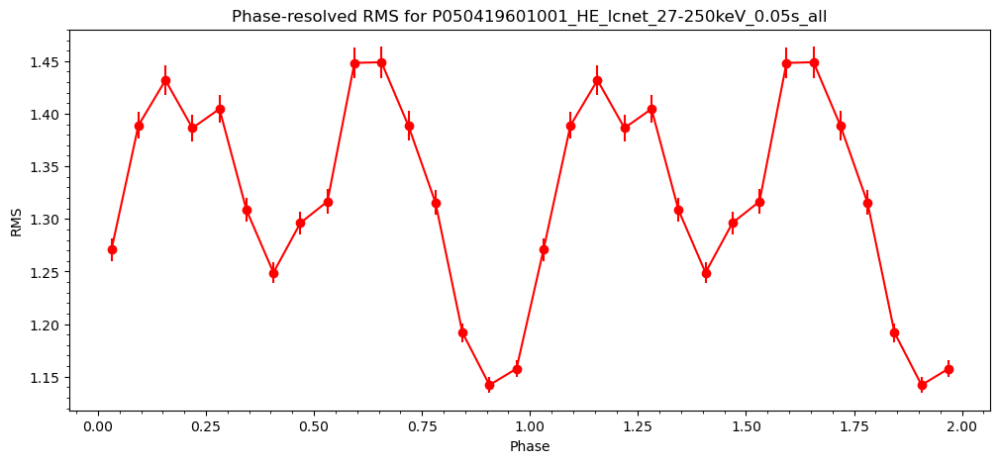

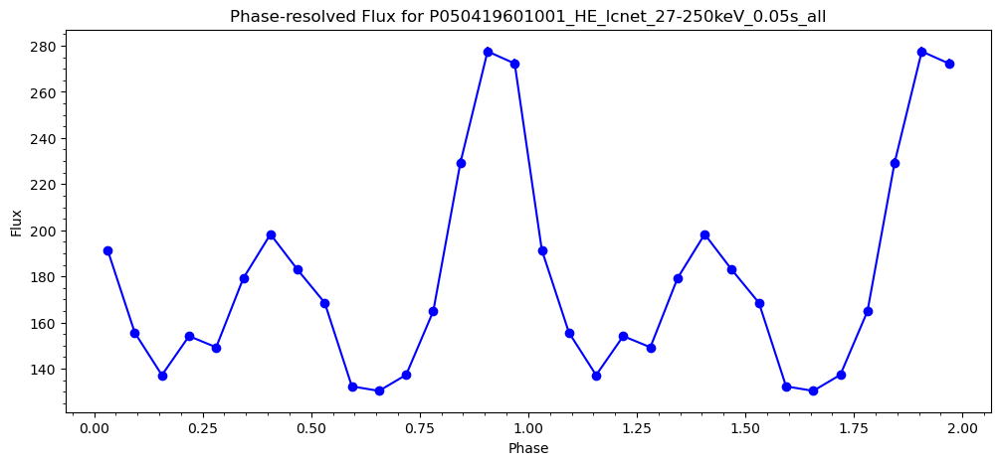

TSTART: 366256744.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196011/pipeline_output/P050419601101_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366256744.525
Last event time: 366272285.47499996
Total duration: 15540.949999988079 seconds
raw time value: [3.66256745e+08 3.66256745e+08 3.66256745e+08 3.66256745e+08
 3.66256745e+08 3.66256745e+08 3.66256745e+08 3.66256745e+08
 3.66256745e+08 3.66256745e+08]
converted from reference epoch time:  [3.70891933e+08 3.70891933e+08 3.70891933e+08 3.70891933e+08
 3.70891933e+08 3.70891933e+08 3.70891933e+08 3.70891933e+08
 3.70891933e+08 3.70891933e+08]


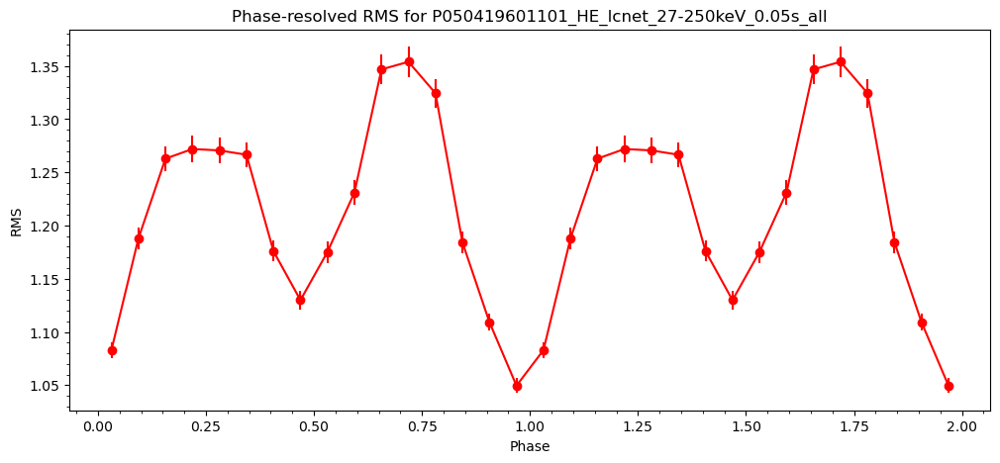

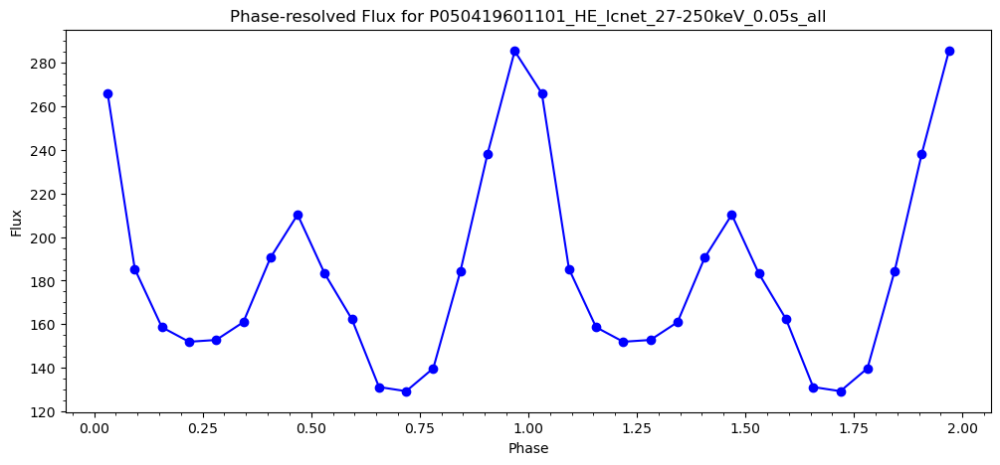

TSTART: 366348130.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196012/pipeline_output/P050419601201_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366348130.525
Last event time: 366364146.47499996
Total duration: 16015.949999988079 seconds
raw time value: [3.66348131e+08 3.66348131e+08 3.66348131e+08 3.66348131e+08
 3.66348131e+08 3.66348131e+08 3.66348131e+08 3.66348131e+08
 3.66348131e+08 3.66348131e+08]
converted from reference epoch time:  [3.71074705e+08 3.71074705e+08 3.71074705e+08 3.71074705e+08
 3.71074705e+08 3.71074705e+08 3.71074705e+08 3.71074705e+08
 3.71074705e+08 3.71074705e+08]


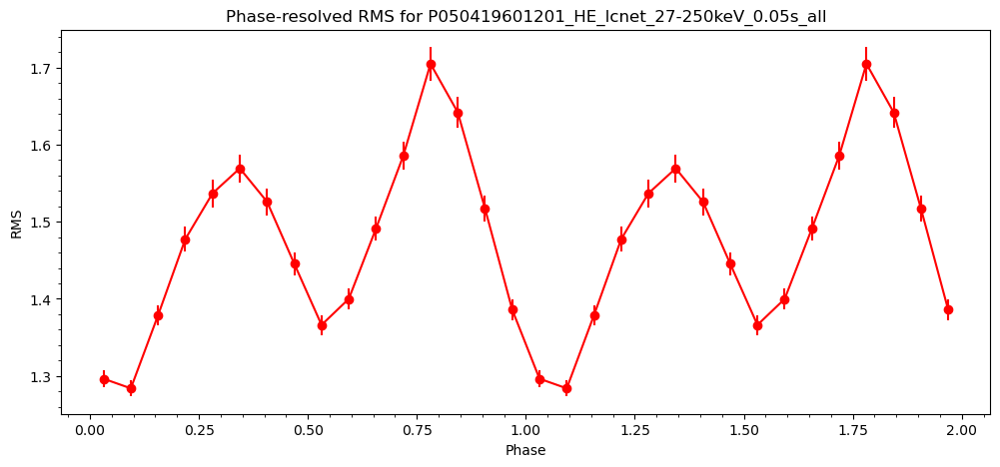

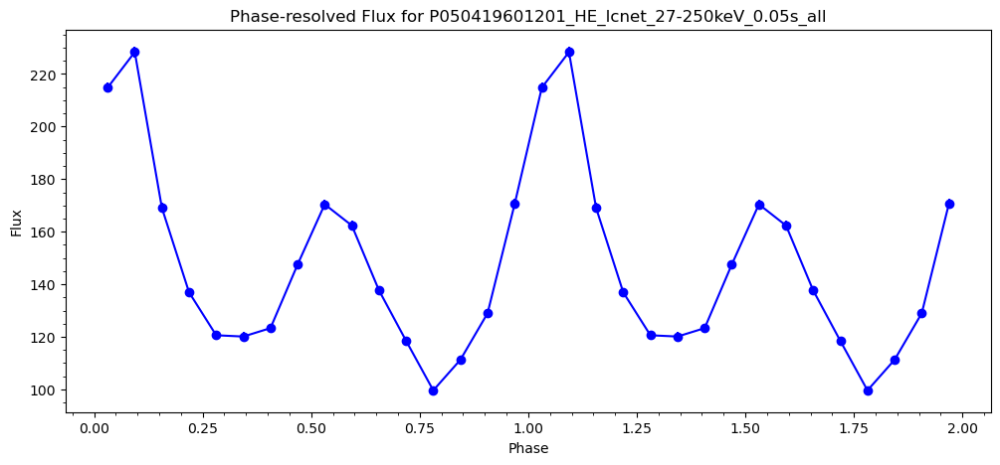

TSTART: 366422461.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196013/pipeline_output/P050419601301_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366422461.525
Last event time: 366434986.47499996
Total duration: 12524.949999988079 seconds
raw time value: [3.66422462e+08 3.66422462e+08 3.66422462e+08 3.66422462e+08
 3.66422462e+08 3.66422462e+08 3.66422462e+08 3.66422462e+08
 3.66422462e+08 3.66422462e+08]
converted from reference epoch time:  [3.71223367e+08 3.71223367e+08 3.71223367e+08 3.71223367e+08
 3.71223367e+08 3.71223367e+08 3.71223367e+08 3.71223367e+08
 3.71223367e+08 3.71223367e+08]


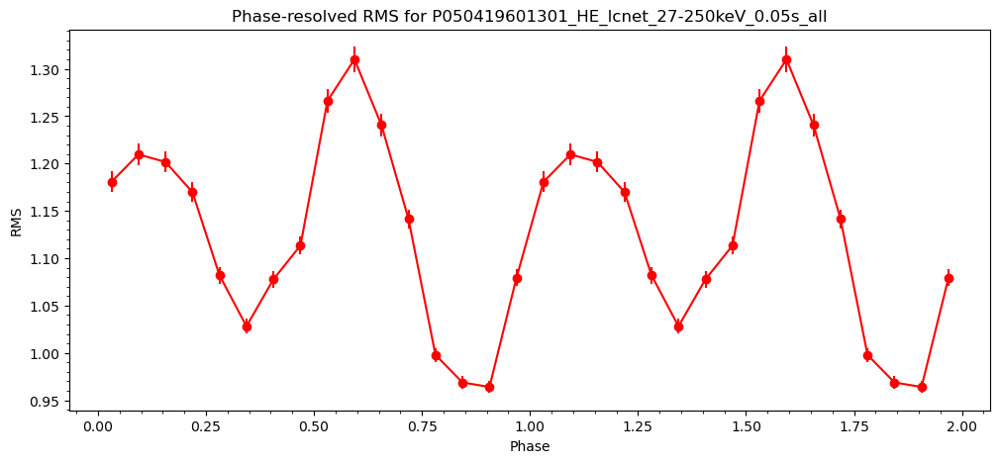

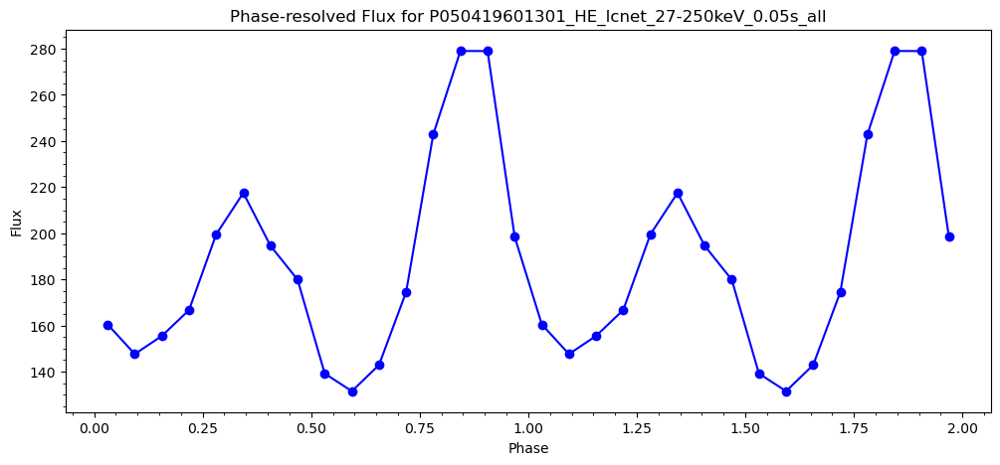

TSTART: 366633718.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601501_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366633718.025
Last event time: 366640915.47499996
Total duration: 7197.449999988079 seconds
raw time value: [3.66633718e+08 3.66633718e+08 3.66633718e+08 3.66633718e+08
 3.66633718e+08 3.66633718e+08 3.66633718e+08 3.66633718e+08
 3.66633718e+08 3.66633718e+08]
converted from reference epoch time:  [3.7164588e+08 3.7164588e+08 3.7164588e+08 3.7164588e+08 3.7164588e+08
 3.7164588e+08 3.7164588e+08 3.7164588e+08 3.7164588e+08 3.7164588e+08]


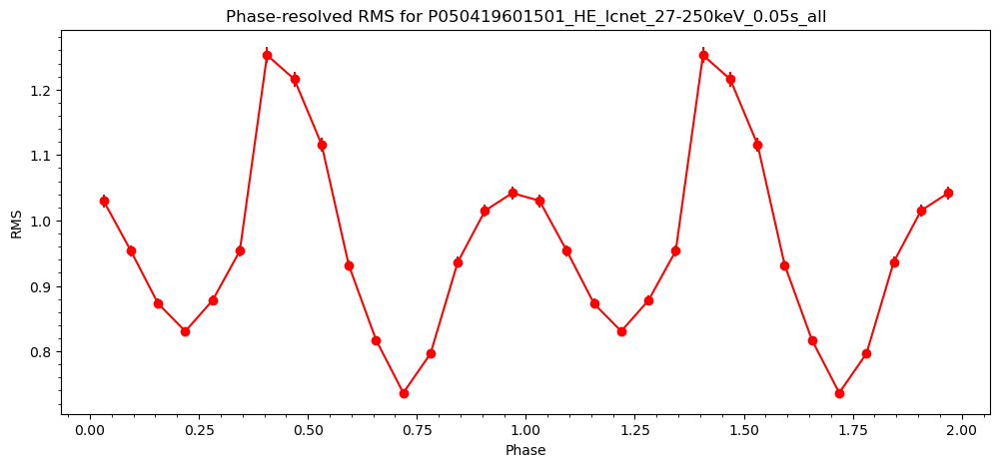

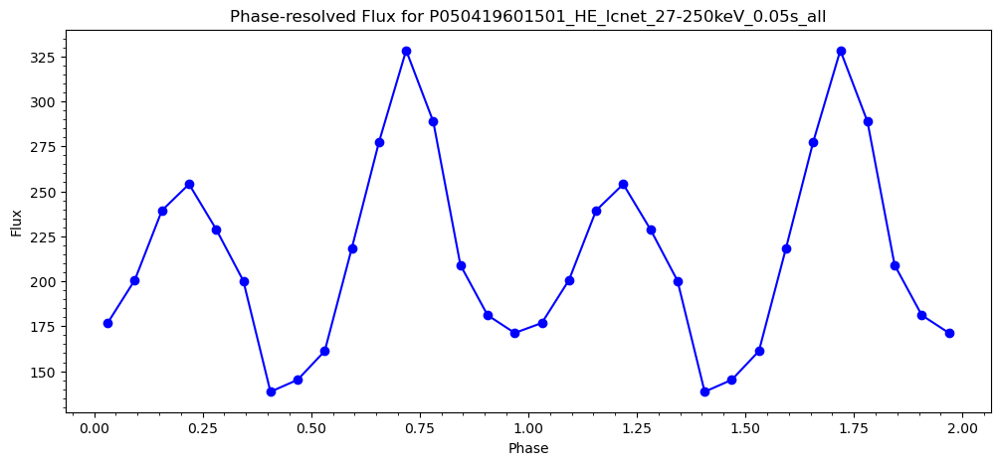

TSTART: 366643036.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196015/pipeline_output/P050419601502_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366643036.525
Last event time: 366651978.47499996
Total duration: 8941.949999988079 seconds
raw time value: [3.66643037e+08 3.66643037e+08 3.66643037e+08 3.66643037e+08
 3.66643037e+08 3.66643037e+08 3.66643037e+08 3.66643037e+08
 3.66643037e+08 3.66643037e+08]
converted from reference epoch time:  [3.71664517e+08 3.71664517e+08 3.71664517e+08 3.71664517e+08
 3.71664517e+08 3.71664517e+08 3.71664517e+08 3.71664517e+08
 3.71664517e+08 3.71664517e+08]


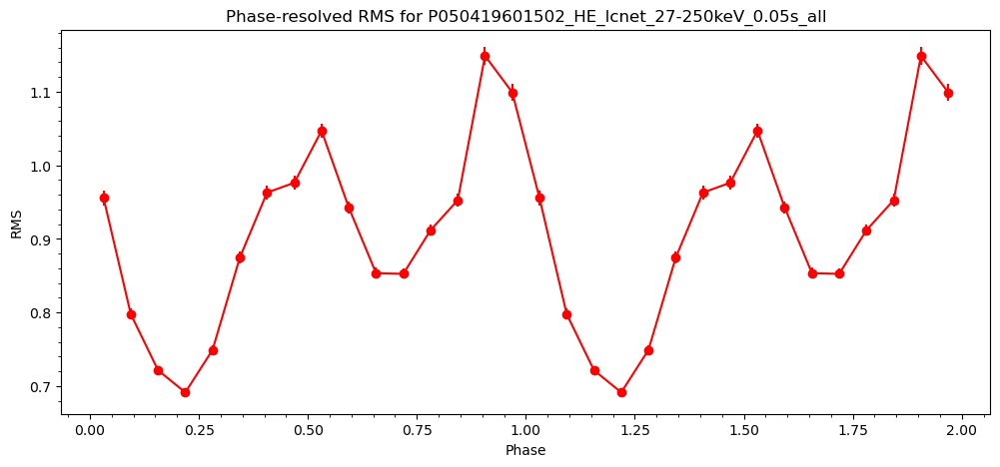

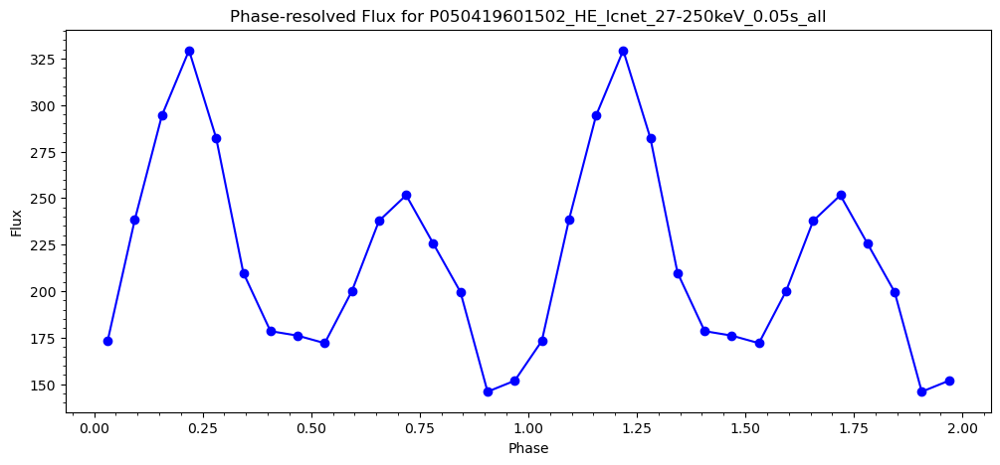

TSTART: 366696524.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601601_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366696524.525
Last event time: 366708172.47499996
Total duration: 11647.949999988079 seconds
raw time value: [3.66696525e+08 3.66696525e+08 3.66696525e+08 3.66696525e+08
 3.66696525e+08 3.66696525e+08 3.66696525e+08 3.66696525e+08
 3.66696525e+08 3.66696525e+08]
converted from reference epoch time:  [3.71771493e+08 3.71771493e+08 3.71771493e+08 3.71771493e+08
 3.71771493e+08 3.71771493e+08 3.71771493e+08 3.71771493e+08
 3.71771493e+08 3.71771493e+08]


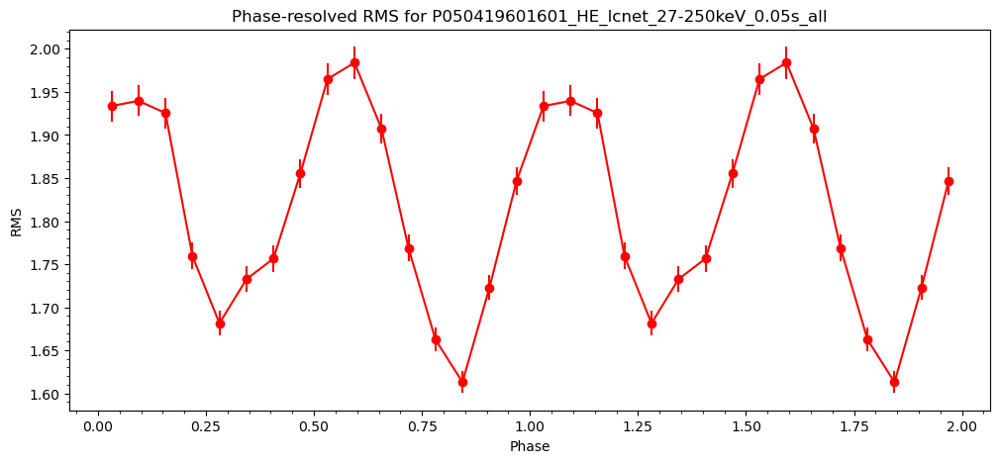

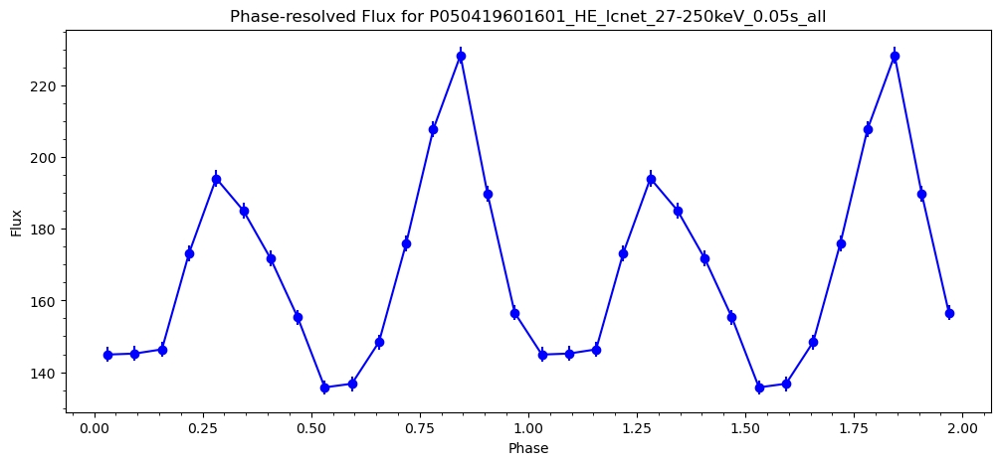

TSTART: 366717161.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601602_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366717161.525
Last event time: 366720435.47499996
Total duration: 3273.949999988079 seconds
raw time value: [3.66717162e+08 3.66717162e+08 3.66717162e+08 3.66717162e+08
 3.66717162e+08 3.66717162e+08 3.66717162e+08 3.66717162e+08
 3.66717162e+08 3.66717162e+08]
converted from reference epoch time:  [3.71812767e+08 3.71812767e+08 3.71812767e+08 3.71812767e+08
 3.71812767e+08 3.71812767e+08 3.71812767e+08 3.71812767e+08
 3.71812767e+08 3.71812767e+08]


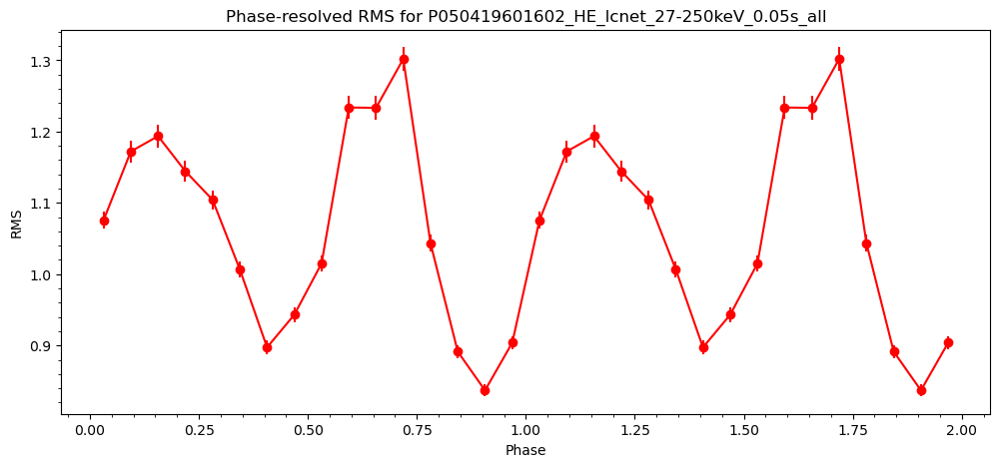

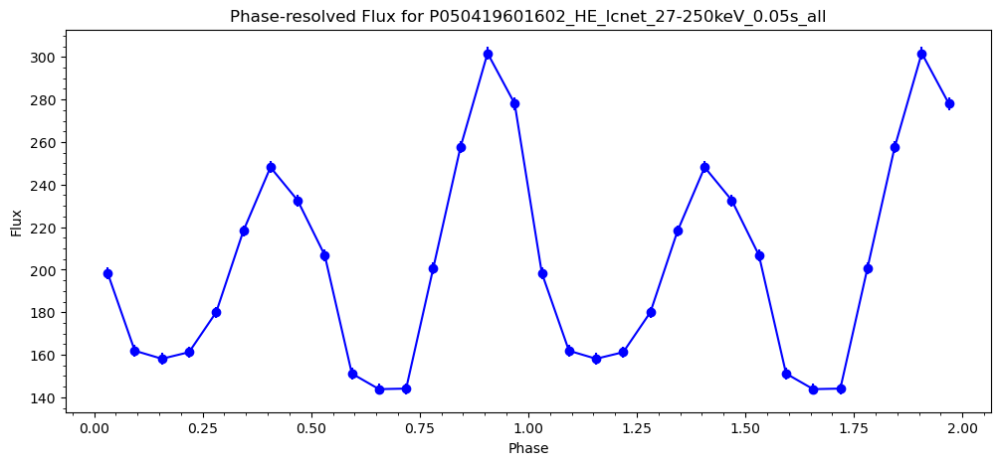

TSTART: 366722862.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196016/pipeline_output/P050419601603_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366722862.525
Last event time: 366729326.47499996
Total duration: 6463.949999988079 seconds
raw time value: [3.66722863e+08 3.66722863e+08 3.66722863e+08 3.66722863e+08
 3.66722863e+08 3.66722863e+08 3.66722863e+08 3.66722863e+08
 3.66722863e+08 3.66722863e+08]
converted from reference epoch time:  [3.71824169e+08 3.71824169e+08 3.71824169e+08 3.71824169e+08
 3.71824169e+08 3.71824169e+08 3.71824169e+08 3.71824169e+08
 3.71824169e+08 3.71824169e+08]


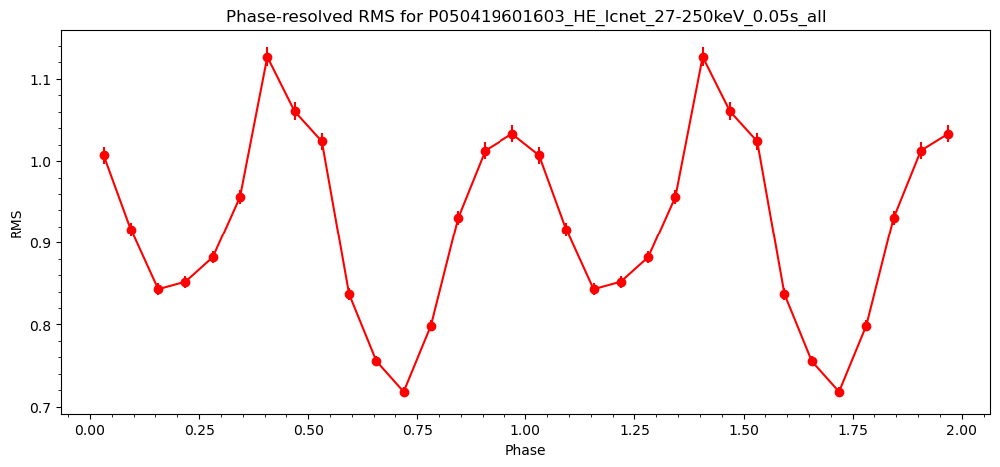

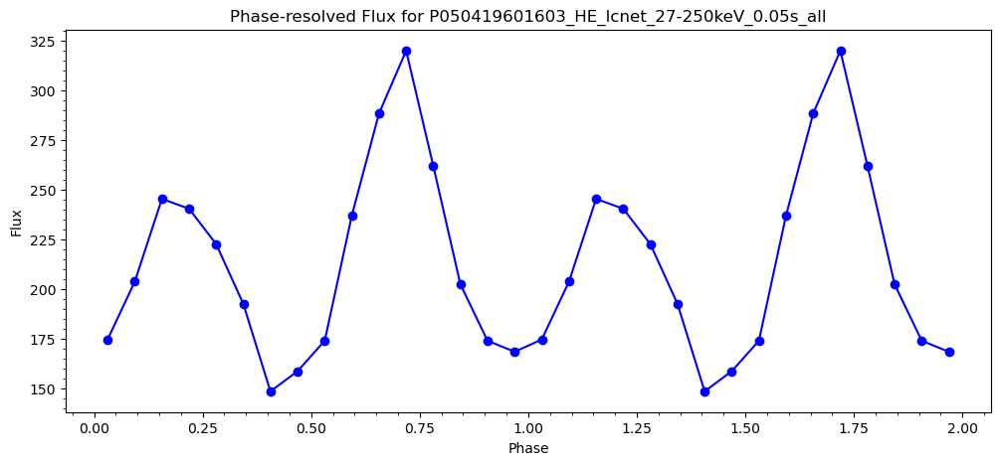

TSTART: 366867604.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196017/pipeline_output/P050419601701_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366867604.525
Last event time: 366879368.47499996
Total duration: 11763.949999988079 seconds
raw time value: [3.66867605e+08 3.66867605e+08 3.66867605e+08 3.66867605e+08
 3.66867605e+08 3.66867605e+08 3.66867605e+08 3.66867605e+08
 3.66867605e+08 3.66867605e+08]
converted from reference epoch time:  [3.72113653e+08 3.72113653e+08 3.72113653e+08 3.72113653e+08
 3.72113653e+08 3.72113653e+08 3.72113653e+08 3.72113653e+08
 3.72113653e+08 3.72113653e+08]


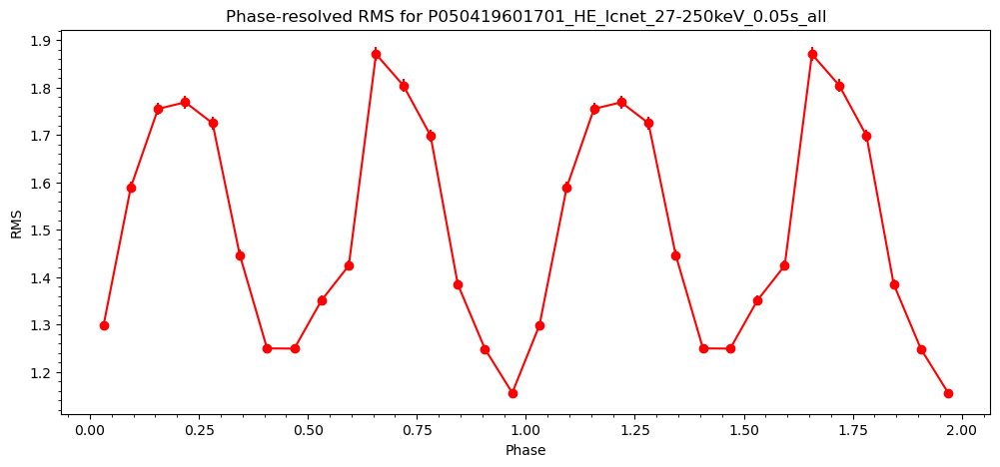

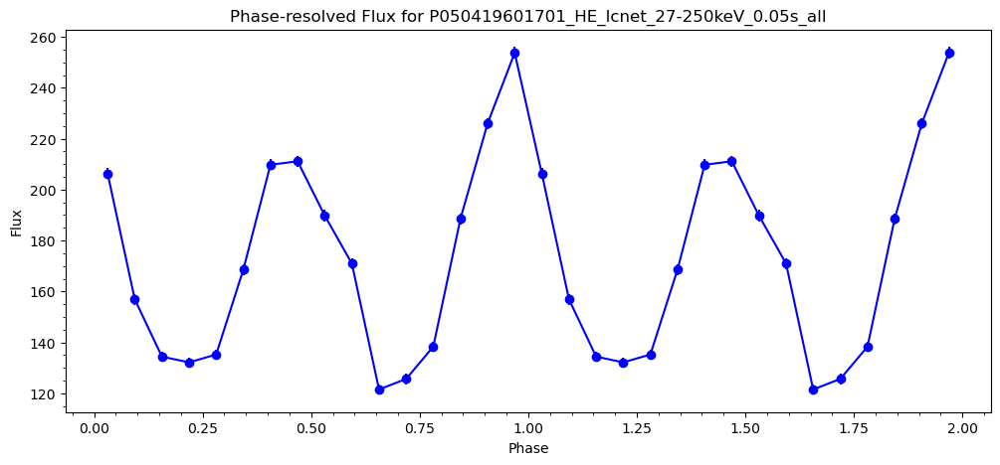

TSTART: 366973670.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196018/pipeline_output/P050419601801_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 366973670.025
Last event time: 366986957.47499996
Total duration: 13287.449999988079 seconds
raw time value: [3.6697367e+08 3.6697367e+08 3.6697367e+08 3.6697367e+08 3.6697367e+08
 3.6697367e+08 3.6697367e+08 3.6697367e+08 3.6697367e+08 3.6697367e+08]
converted from reference epoch time:  [3.72325784e+08 3.72325784e+08 3.72325784e+08 3.72325784e+08
 3.72325784e+08 3.72325784e+08 3.72325784e+08 3.72325784e+08
 3.72325784e+08 3.72325784e+08]


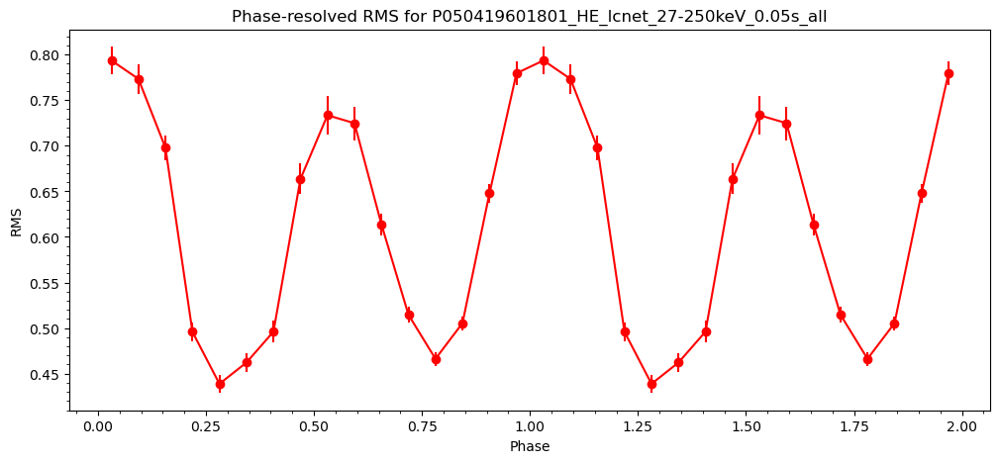

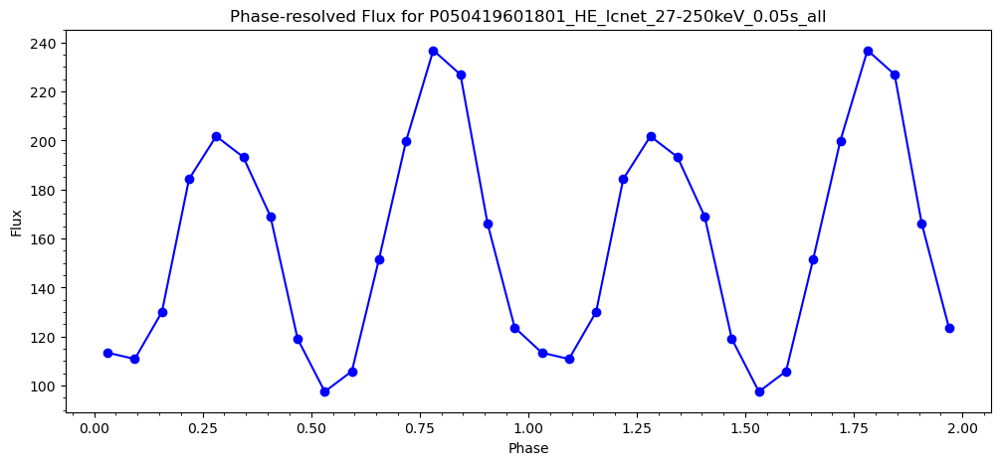

TSTART: 367041947.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601901_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367041947.525
Last event time: 367050561.47499996
Total duration: 8613.949999988079 seconds
raw time value: [3.67041948e+08 3.67041948e+08 3.67041948e+08 3.67041948e+08
 3.67041948e+08 3.67041948e+08 3.67041948e+08 3.67041948e+08
 3.67041948e+08 3.67041948e+08]
converted from reference epoch time:  [3.72462339e+08 3.72462339e+08 3.72462339e+08 3.72462339e+08
 3.72462339e+08 3.72462339e+08 3.72462339e+08 3.72462339e+08
 3.72462339e+08 3.72462339e+08]


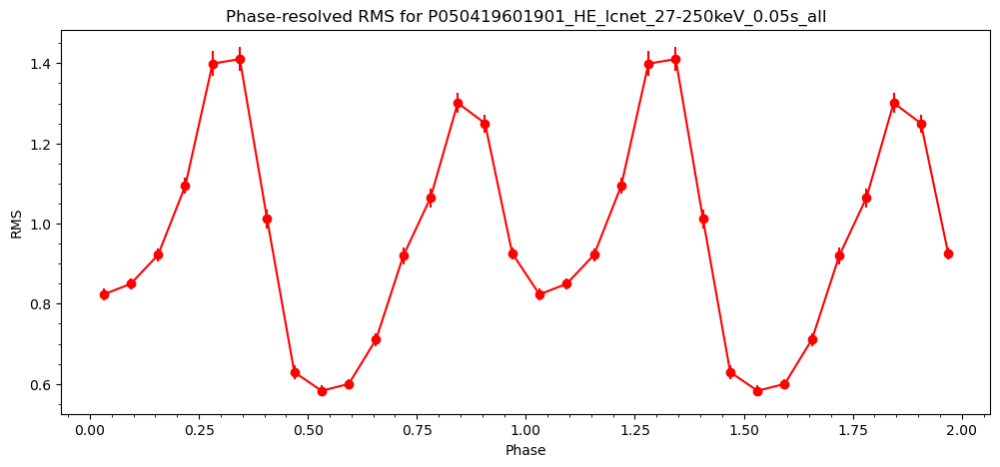

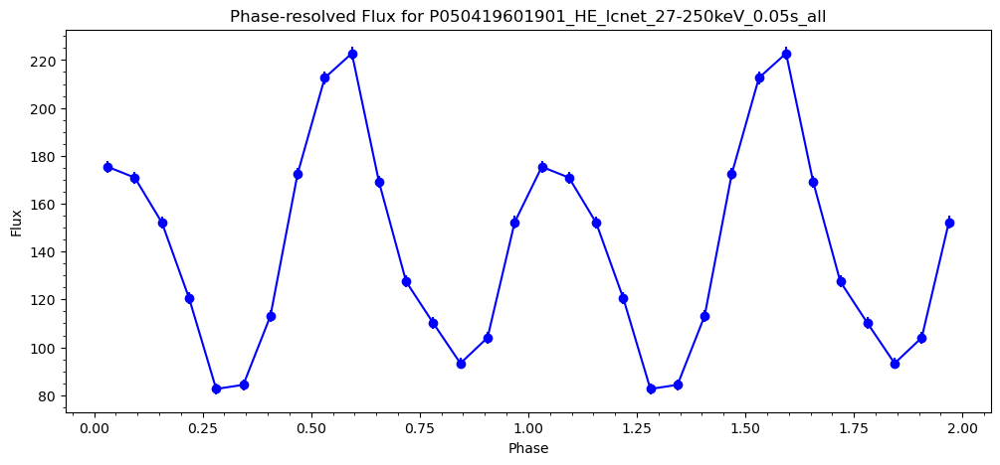

TSTART: 367056510.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601902_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367056510.025
Last event time: 367062983.47499996
Total duration: 6473.449999988079 seconds
raw time value: [3.6705651e+08 3.6705651e+08 3.6705651e+08 3.6705651e+08 3.6705651e+08
 3.6705651e+08 3.6705651e+08 3.6705651e+08 3.6705651e+08 3.6705651e+08]
converted from reference epoch time:  [3.72491464e+08 3.72491464e+08 3.72491464e+08 3.72491464e+08
 3.72491464e+08 3.72491464e+08 3.72491464e+08 3.72491464e+08
 3.72491464e+08 3.72491464e+08]


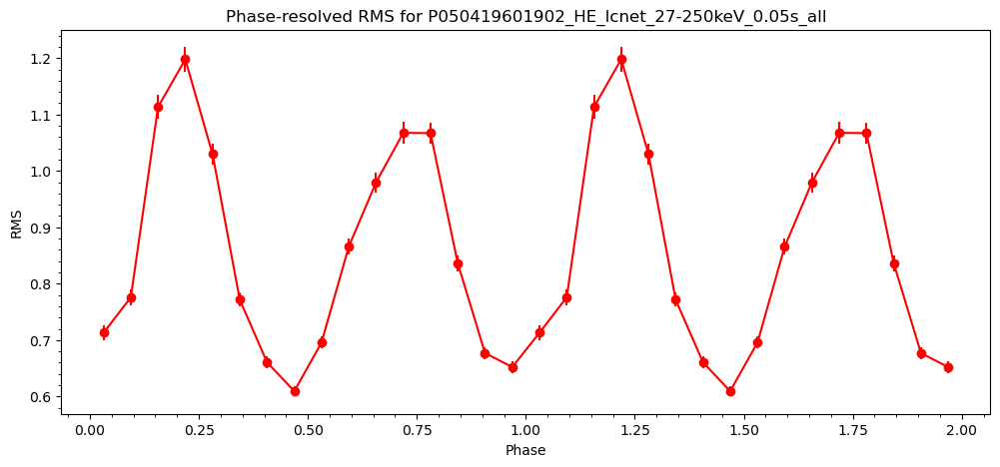

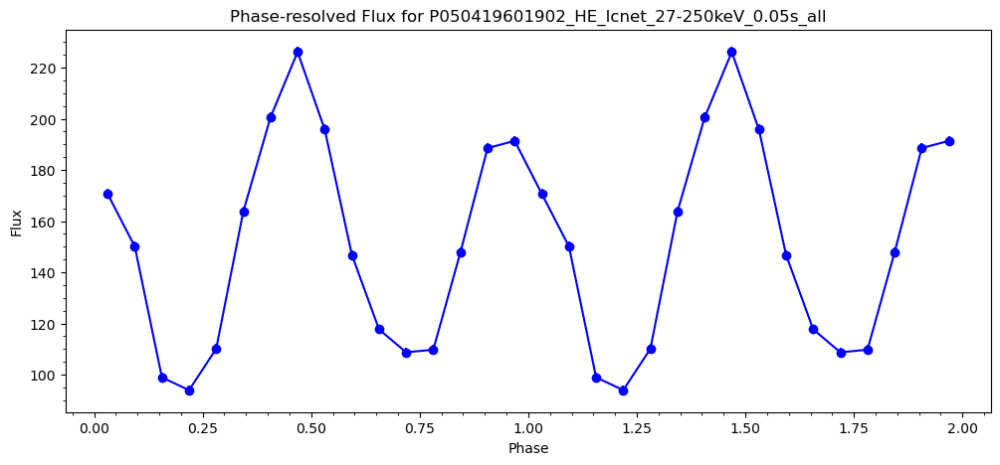

TSTART: 367064782.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196019/pipeline_output/P050419601903_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367064782.525
Last event time: 367072596.47499996
Total duration: 7813.949999988079 seconds
raw time value: [3.67064783e+08 3.67064783e+08 3.67064783e+08 3.67064783e+08
 3.67064783e+08 3.67064783e+08 3.67064783e+08 3.67064783e+08
 3.67064783e+08 3.67064783e+08]
converted from reference epoch time:  [3.72508009e+08 3.72508009e+08 3.72508009e+08 3.72508009e+08
 3.72508009e+08 3.72508009e+08 3.72508009e+08 3.72508009e+08
 3.72508009e+08 3.72508009e+08]


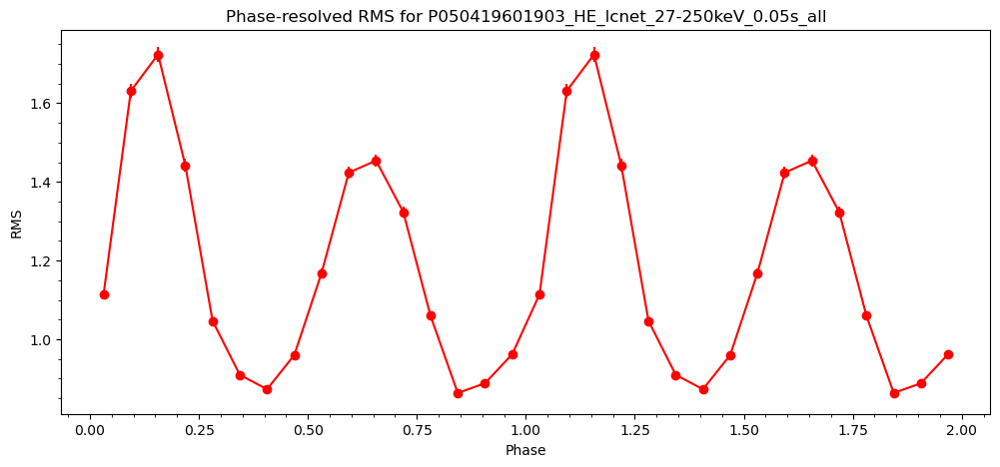

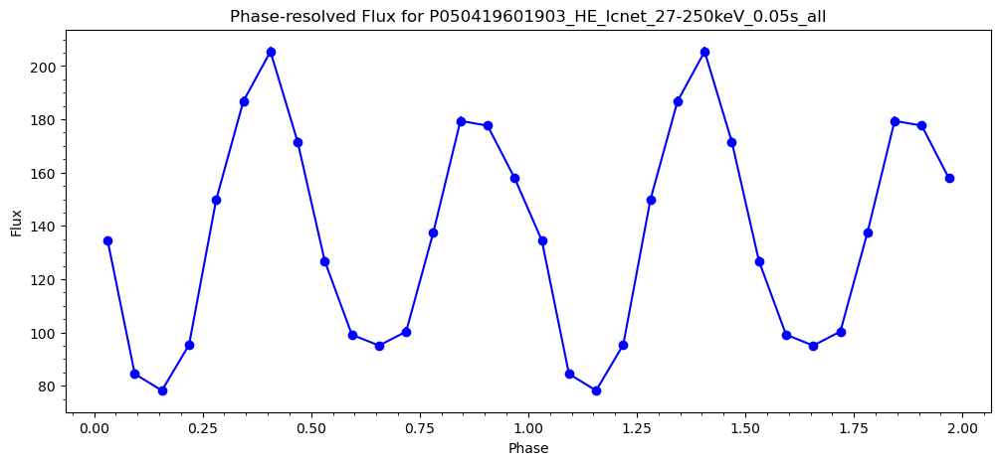

TSTART: 367173525.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196020/pipeline_output/P050419602002_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367173525.525
Last event time: 367192499.47499996
Total duration: 18973.94999998808 seconds
raw time value: [3.67173526e+08 3.67173526e+08 3.67173526e+08 3.67173526e+08
 3.67173526e+08 3.67173526e+08 3.67173526e+08 3.67173526e+08
 3.67173526e+08 3.67173526e+08]
converted from reference epoch time:  [3.72725495e+08 3.72725495e+08 3.72725495e+08 3.72725495e+08
 3.72725495e+08 3.72725495e+08 3.72725495e+08 3.72725495e+08
 3.72725495e+08 3.72725495e+08]


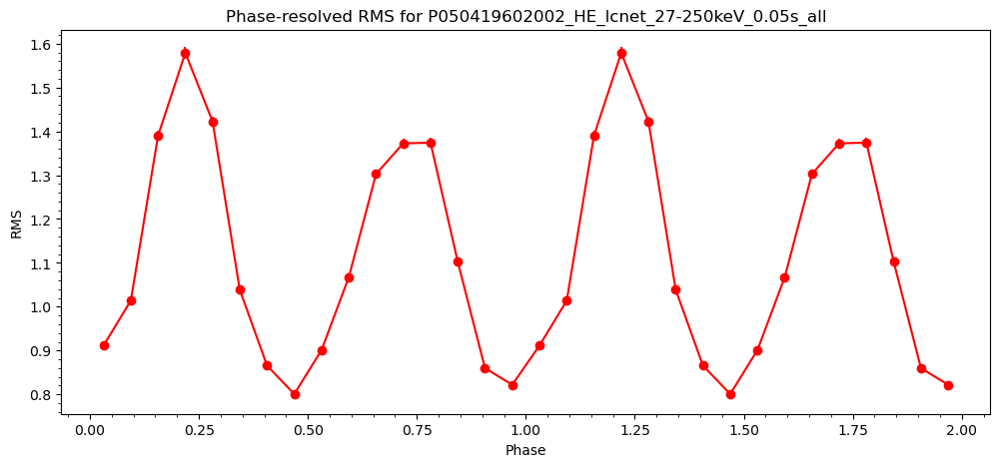

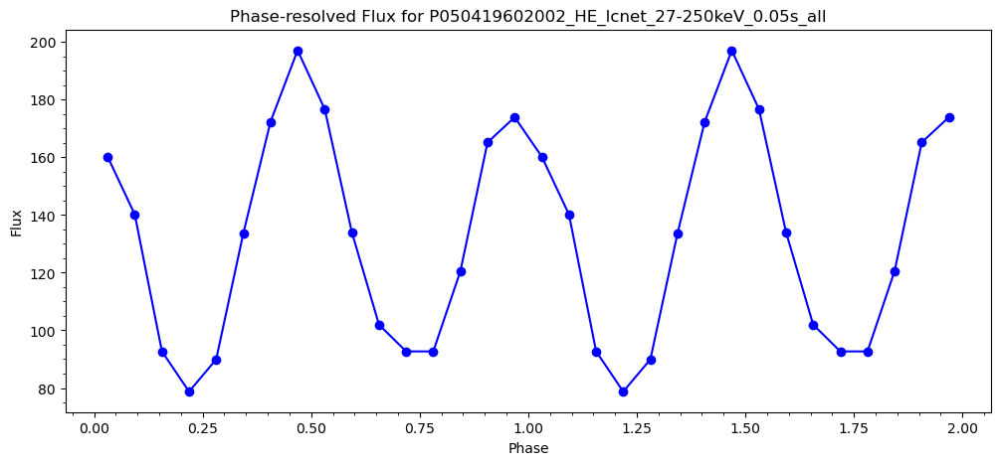

TSTART: 367261774.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196021/pipeline_output/P050419602101_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367261774.525
Last event time: 367284854.47499996
Total duration: 23079.94999998808 seconds
raw time value: [3.67261775e+08 3.67261775e+08 3.67261775e+08 3.67261775e+08
 3.67261775e+08 3.67261775e+08 3.67261775e+08 3.67261775e+08
 3.67261775e+08 3.67261775e+08]
converted from reference epoch time:  [3.72901993e+08 3.72901993e+08 3.72901993e+08 3.72901993e+08
 3.72901993e+08 3.72901993e+08 3.72901993e+08 3.72901993e+08
 3.72901993e+08 3.72901993e+08]


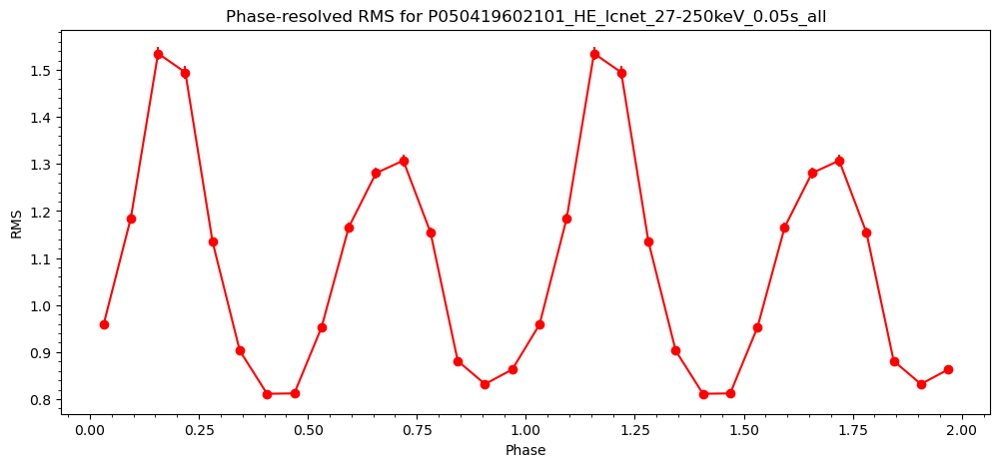

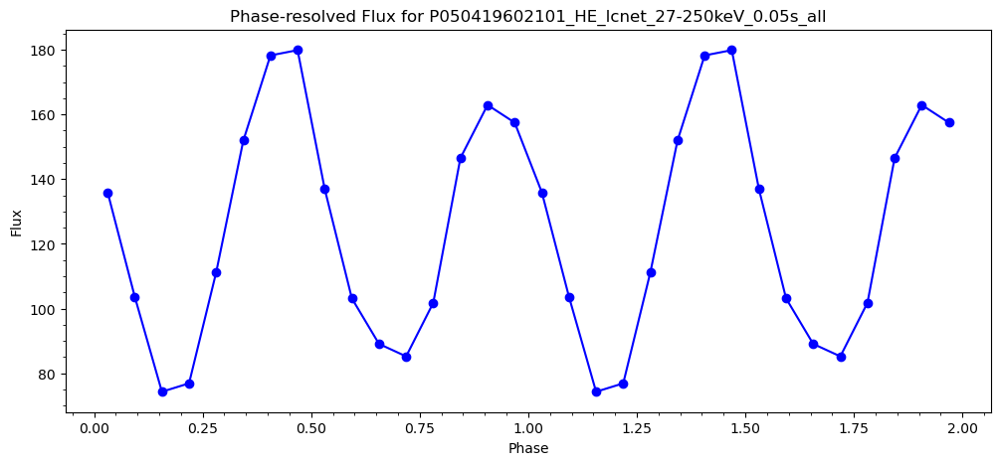

TSTART: 367286915.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196021/pipeline_output/P050419602102_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367286915.525
Last event time: 367294067.47499996
Total duration: 7151.949999988079 seconds
raw time value: [3.67286916e+08 3.67286916e+08 3.67286916e+08 3.67286916e+08
 3.67286916e+08 3.67286916e+08 3.67286916e+08 3.67286916e+08
 3.67286916e+08 3.67286916e+08]
converted from reference epoch time:  [3.72952275e+08 3.72952275e+08 3.72952275e+08 3.72952275e+08
 3.72952275e+08 3.72952275e+08 3.72952275e+08 3.72952275e+08
 3.72952275e+08 3.72952275e+08]


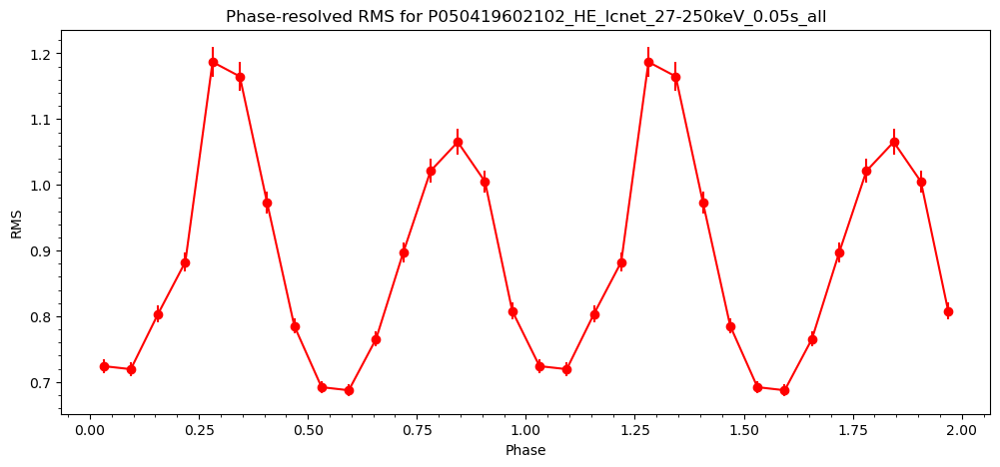

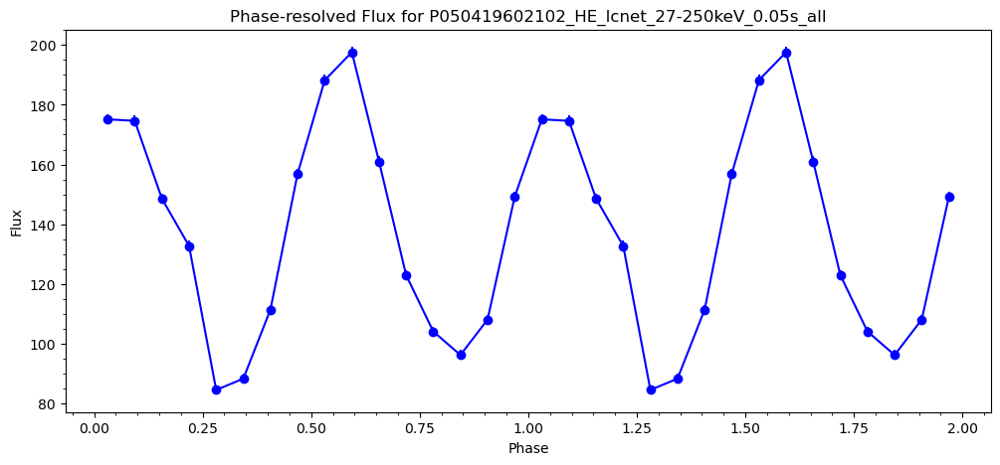

TSTART: 367395973.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602201_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367395973.025
Last event time: 367405278.47499996
Total duration: 9305.449999988079 seconds
raw time value: [3.67395973e+08 3.67395973e+08 3.67395973e+08 3.67395973e+08
 3.67395973e+08 3.67395973e+08 3.67395973e+08 3.67395973e+08
 3.67395973e+08 3.67395973e+08]
converted from reference epoch time:  [3.7317039e+08 3.7317039e+08 3.7317039e+08 3.7317039e+08 3.7317039e+08
 3.7317039e+08 3.7317039e+08 3.7317039e+08 3.7317039e+08 3.7317039e+08]


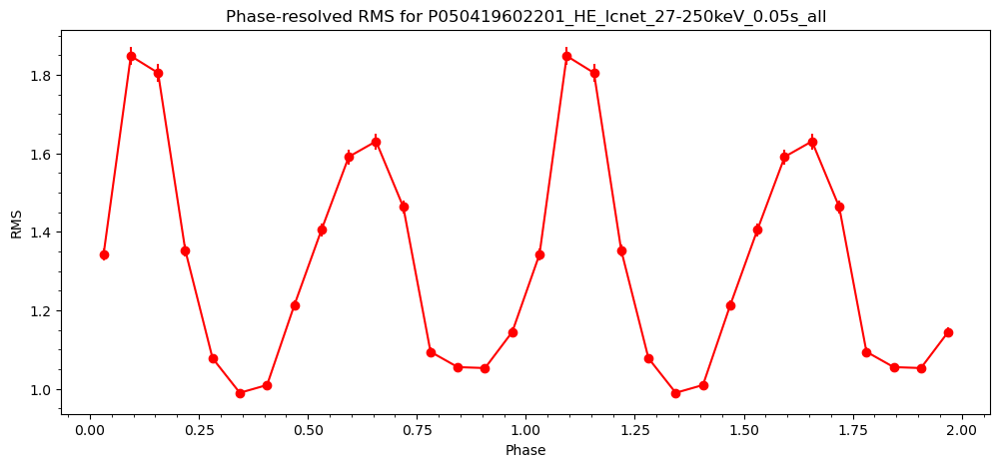

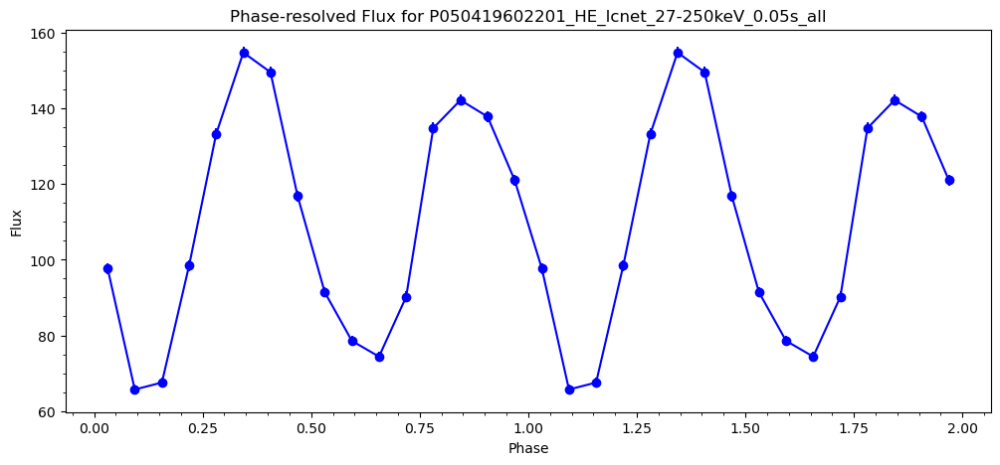

TSTART: 367407150.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602202_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367407150.525
Last event time: 367416294.97499996
Total duration: 9144.449999988079 seconds
raw time value: [3.67407151e+08 3.67407151e+08 3.67407151e+08 3.67407151e+08
 3.67407151e+08 3.67407151e+08 3.67407151e+08 3.67407151e+08
 3.67407151e+08 3.67407151e+08]
converted from reference epoch time:  [3.73192745e+08 3.73192745e+08 3.73192745e+08 3.73192745e+08
 3.73192745e+08 3.73192745e+08 3.73192745e+08 3.73192745e+08
 3.73192745e+08 3.73192745e+08]


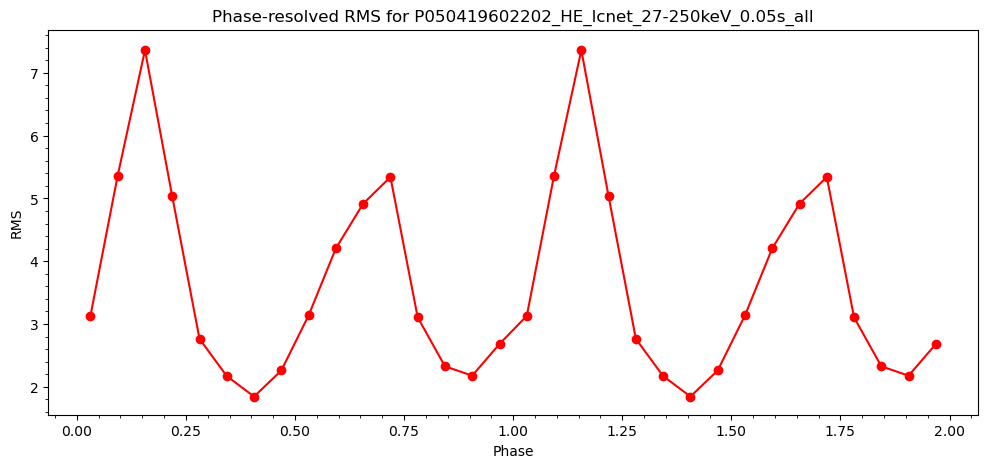

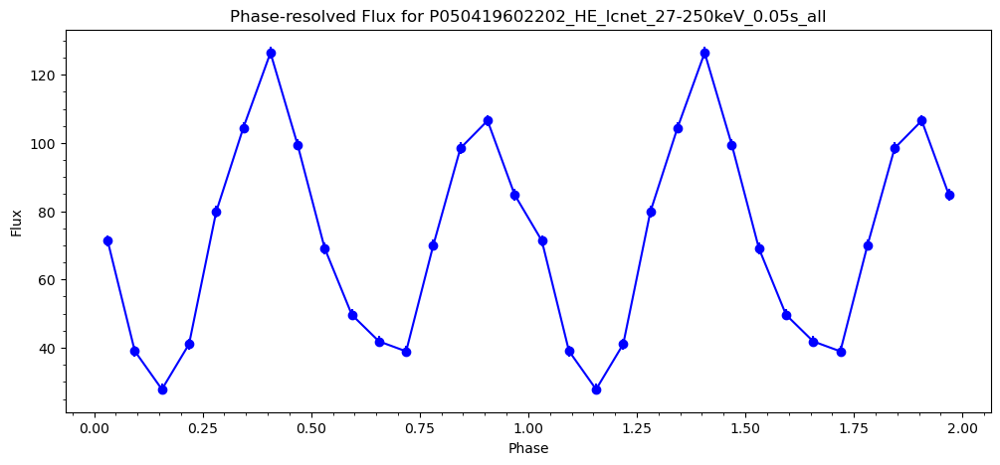

TSTART: 367424985.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602203_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367424985.025
Last event time: 367455960.47499996
Total duration: 30975.44999998808 seconds
raw time value: [3.67424985e+08 3.67424985e+08 3.67424985e+08 3.67424985e+08
 3.67424985e+08 3.67424985e+08 3.67424985e+08 3.67424985e+08
 3.67424985e+08 3.67424985e+08]
converted from reference epoch time:  [3.73228414e+08 3.73228414e+08 3.73228414e+08 3.73228414e+08
 3.73228414e+08 3.73228414e+08 3.73228414e+08 3.73228414e+08
 3.73228414e+08 3.73228414e+08]


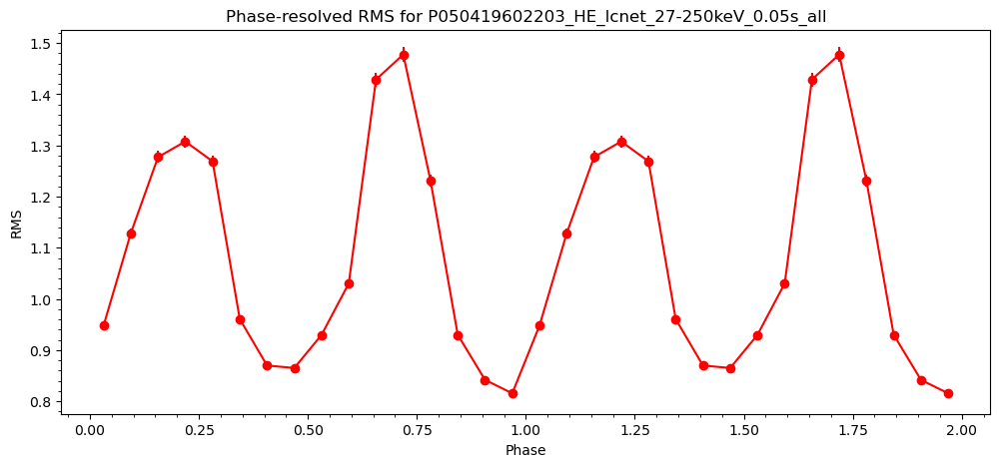

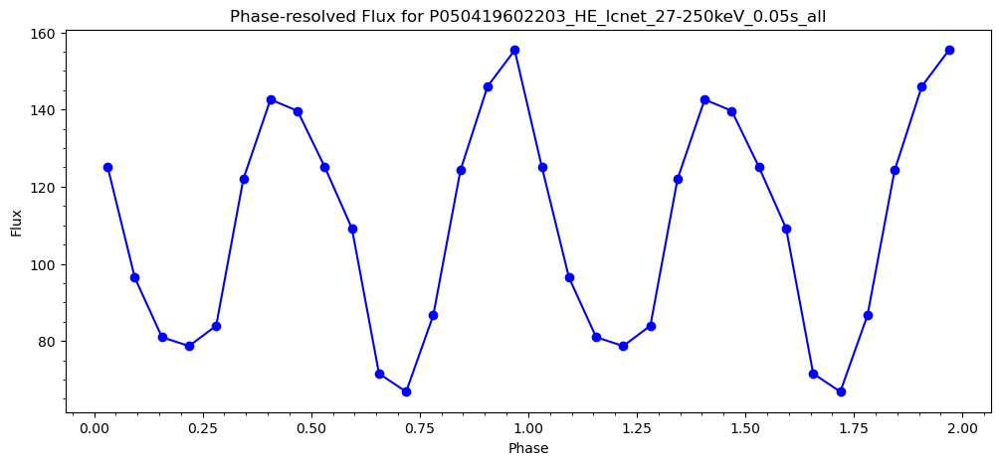

TSTART: 367458073.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602204_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367458073.525
Last event time: 367466873.47499996
Total duration: 8799.949999988079 seconds
raw time value: [3.67458074e+08 3.67458074e+08 3.67458074e+08 3.67458074e+08
 3.67458074e+08 3.67458074e+08 3.67458074e+08 3.67458074e+08
 3.67458074e+08 3.67458074e+08]
converted from reference epoch time:  [3.73294591e+08 3.73294591e+08 3.73294591e+08 3.73294591e+08
 3.73294591e+08 3.73294591e+08 3.73294591e+08 3.73294591e+08
 3.73294591e+08 3.73294591e+08]


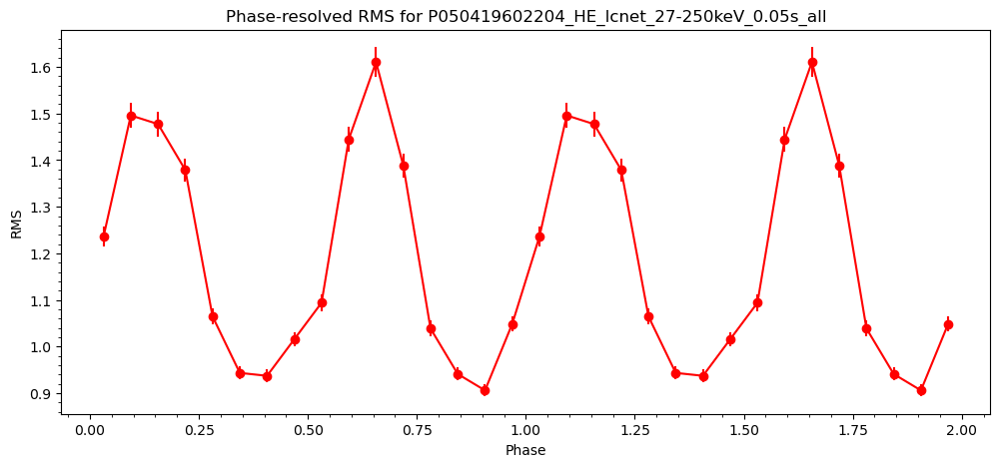

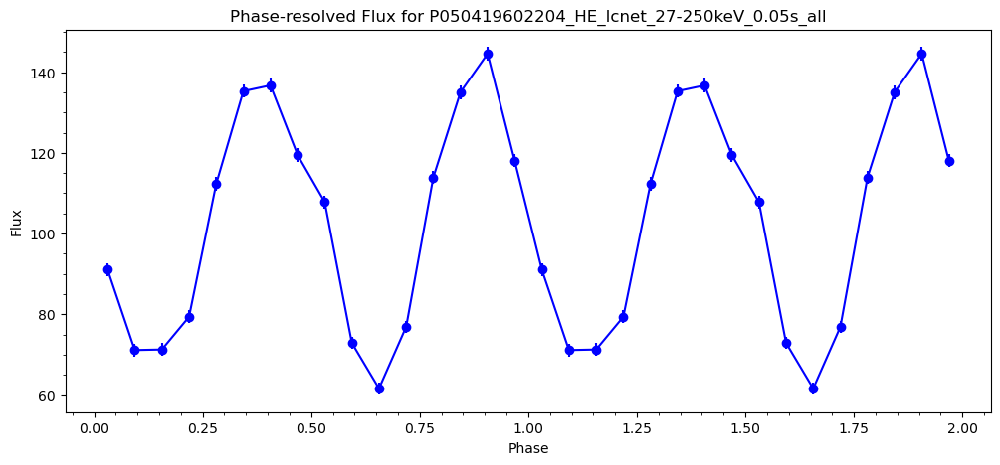

TSTART: 367481433.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602206_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367481433.025
Last event time: 367490632.47499996
Total duration: 9199.449999988079 seconds
raw time value: [3.67481433e+08 3.67481433e+08 3.67481433e+08 3.67481433e+08
 3.67481433e+08 3.67481433e+08 3.67481433e+08 3.67481433e+08
 3.67481433e+08 3.67481433e+08]
converted from reference epoch time:  [3.7334131e+08 3.7334131e+08 3.7334131e+08 3.7334131e+08 3.7334131e+08
 3.7334131e+08 3.7334131e+08 3.7334131e+08 3.7334131e+08 3.7334131e+08]


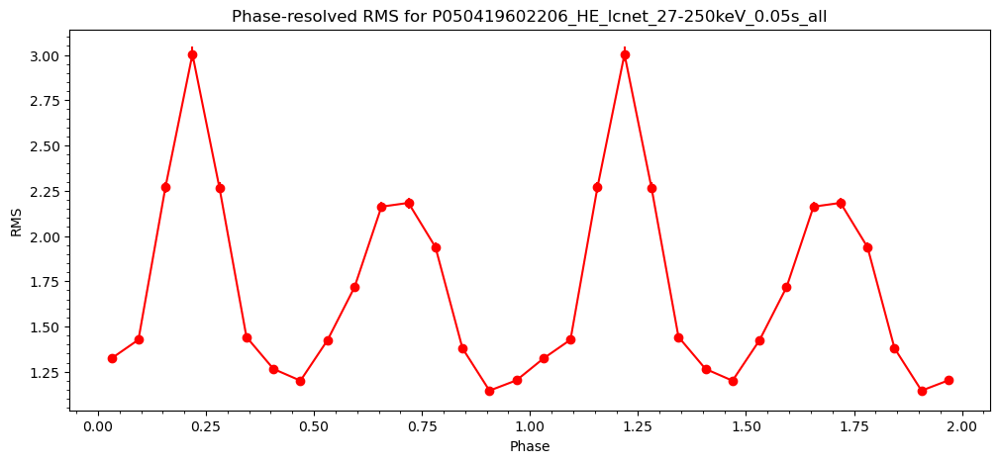

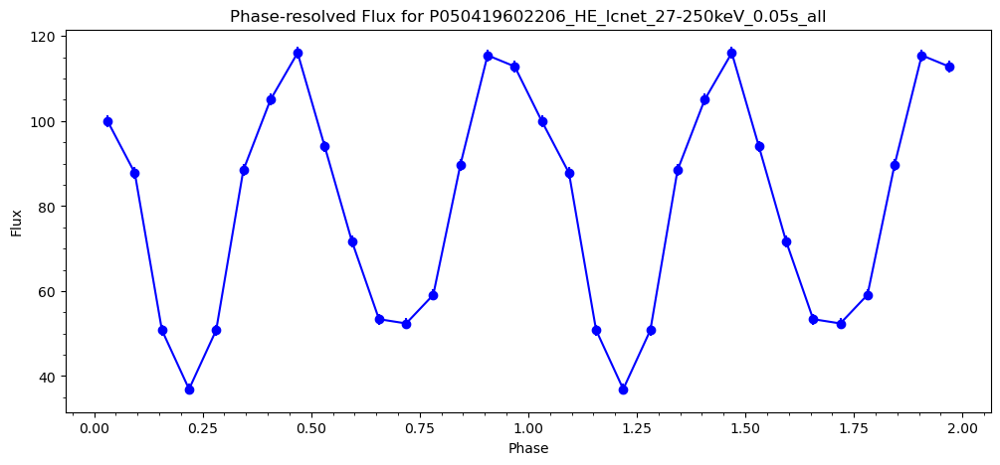

TSTART: 367492740.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602207_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367492740.525
Last event time: 367496322.47499996
Total duration: 3581.949999988079 seconds
raw time value: [3.67492741e+08 3.67492741e+08 3.67492741e+08 3.67492741e+08
 3.67492741e+08 3.67492741e+08 3.67492741e+08 3.67492741e+08
 3.67492741e+08 3.67492741e+08]
converted from reference epoch time:  [3.73363925e+08 3.73363925e+08 3.73363925e+08 3.73363925e+08
 3.73363925e+08 3.73363925e+08 3.73363925e+08 3.73363925e+08
 3.73363925e+08 3.73363925e+08]


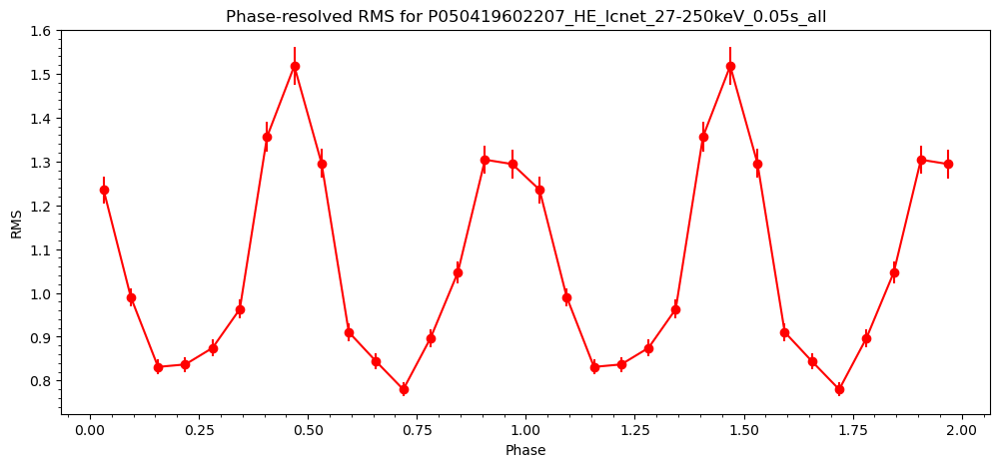

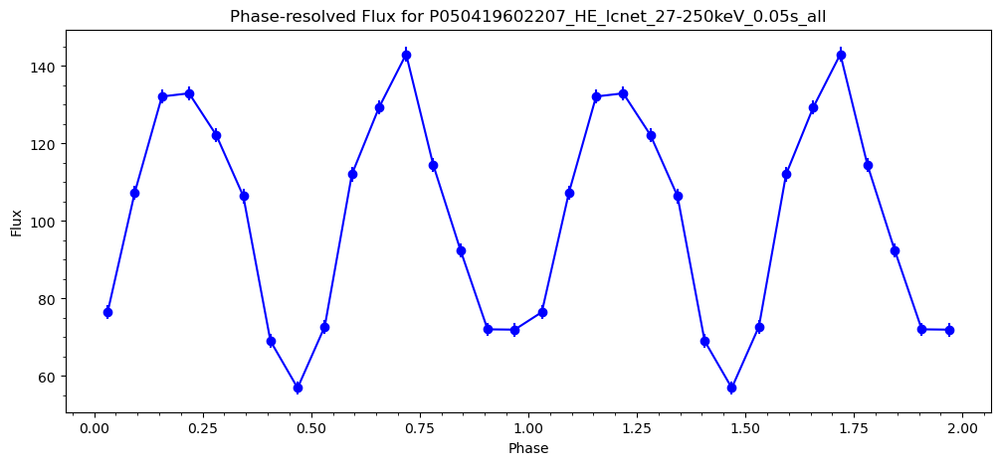

TSTART: 367510233.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602208_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367510233.525
Last event time: 367541509.47499996
Total duration: 31275.94999998808 seconds
raw time value: [3.67510234e+08 3.67510234e+08 3.67510234e+08 3.67510234e+08
 3.67510234e+08 3.67510234e+08 3.67510234e+08 3.67510234e+08
 3.67510234e+08 3.67510234e+08]
converted from reference epoch time:  [3.73398911e+08 3.73398911e+08 3.73398911e+08 3.73398911e+08
 3.73398911e+08 3.73398911e+08 3.73398911e+08 3.73398911e+08
 3.73398911e+08 3.73398911e+08]


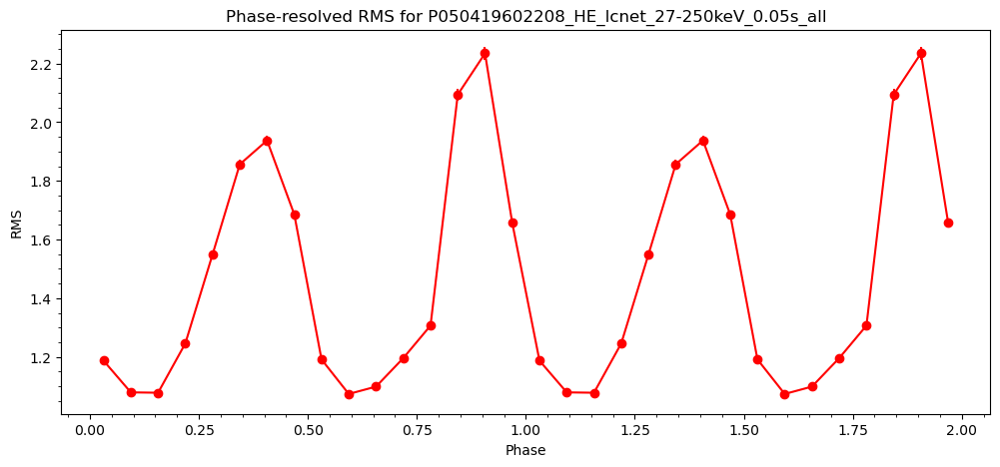

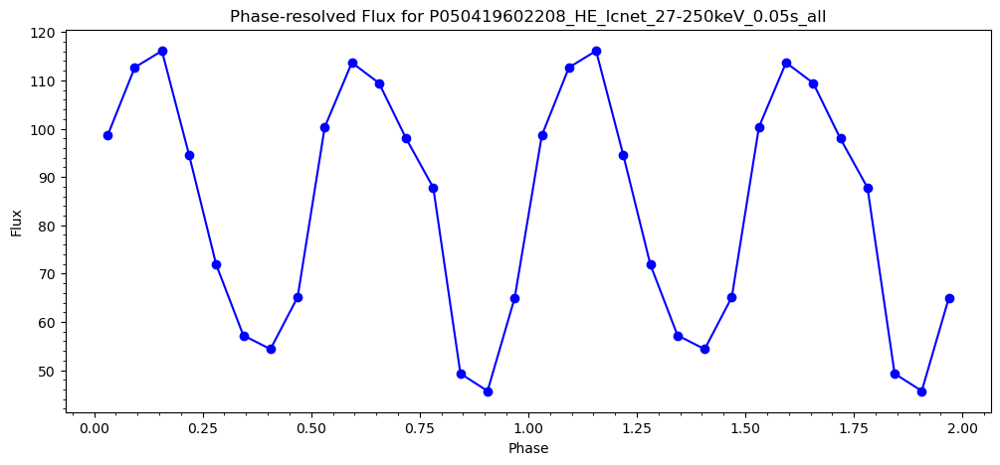

TSTART: 367543650.5
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602209_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367543650.525
Last event time: 367552461.47499996
Total duration: 8810.949999988079 seconds
raw time value: [3.67543651e+08 3.67543651e+08 3.67543651e+08 3.67543651e+08
 3.67543651e+08 3.67543651e+08 3.67543651e+08 3.67543651e+08
 3.67543651e+08 3.67543651e+08]
converted from reference epoch time:  [3.73465745e+08 3.73465745e+08 3.73465745e+08 3.73465745e+08
 3.73465745e+08 3.73465745e+08 3.73465745e+08 3.73465745e+08
 3.73465745e+08 3.73465745e+08]


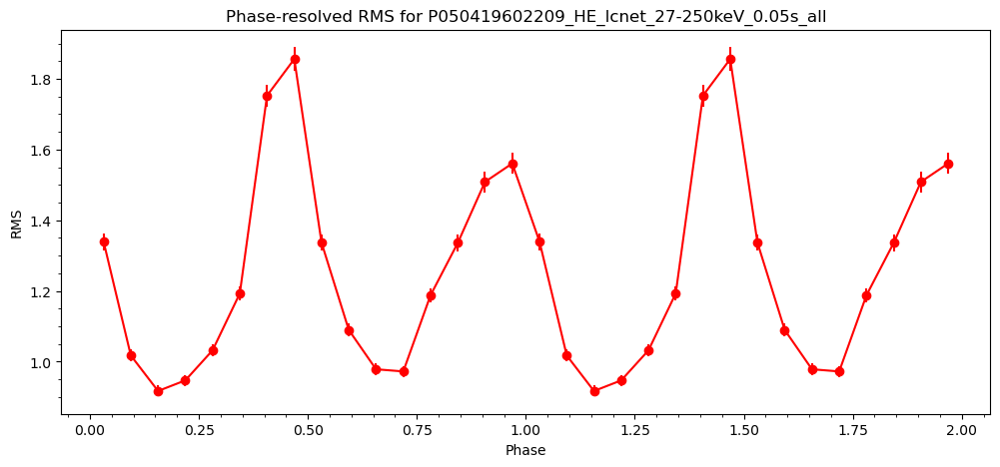

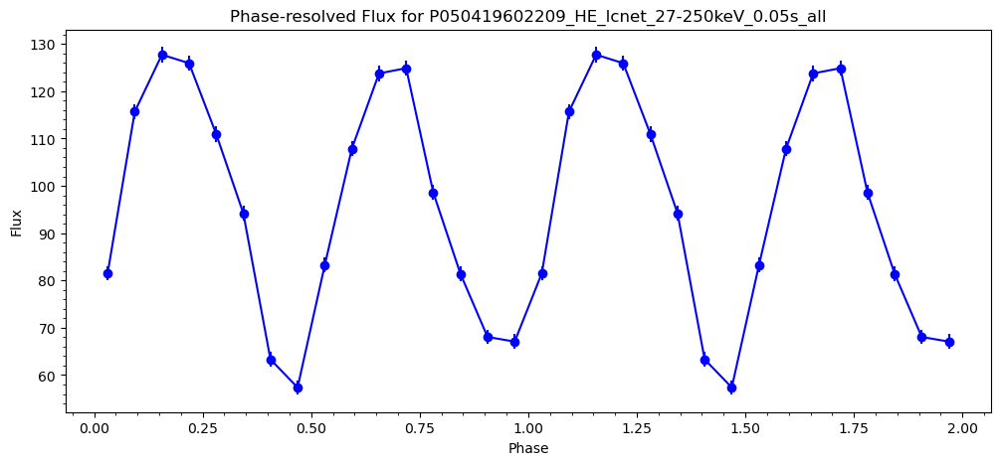

TSTART: 367567009.0
Processing file: /home/supremekai/thesis/J0243_6p6124/HXMT/hxmt_me_l3_products_pipeline//P0504196/P0504196022/pipeline_output/P050419602211_HE_lcnet_27-250keV_0.05s_all.lc
First event time: 367567009.025
Last event time: 367575086.47499996
Total duration: 8077.449999988079 seconds
raw time value: [3.67567009e+08 3.67567009e+08 3.67567009e+08 3.67567009e+08
 3.67567009e+08 3.67567009e+08 3.67567009e+08 3.67567009e+08
 3.67567009e+08 3.67567009e+08]
converted from reference epoch time:  [3.73512462e+08 3.73512462e+08 3.73512462e+08 3.73512462e+08
 3.73512462e+08 3.73512462e+08 3.73512462e+08 3.73512462e+08
 3.73512462e+08 3.73512462e+08]


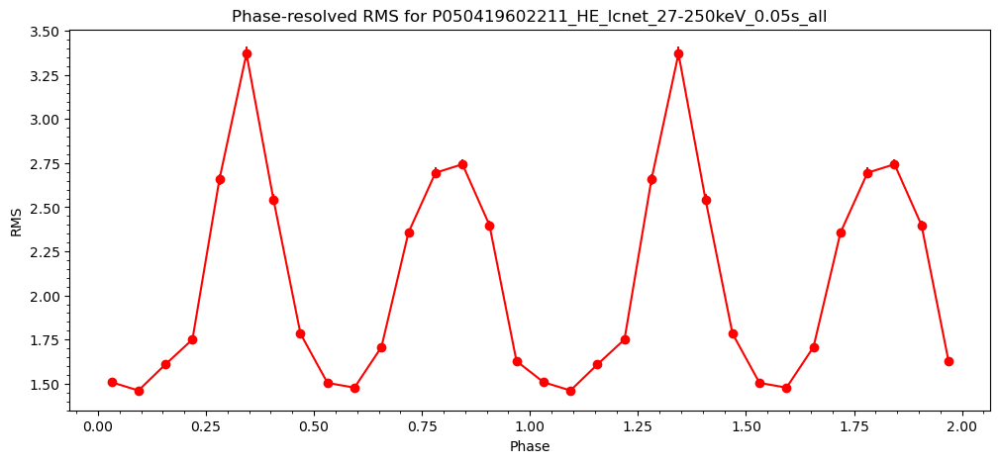

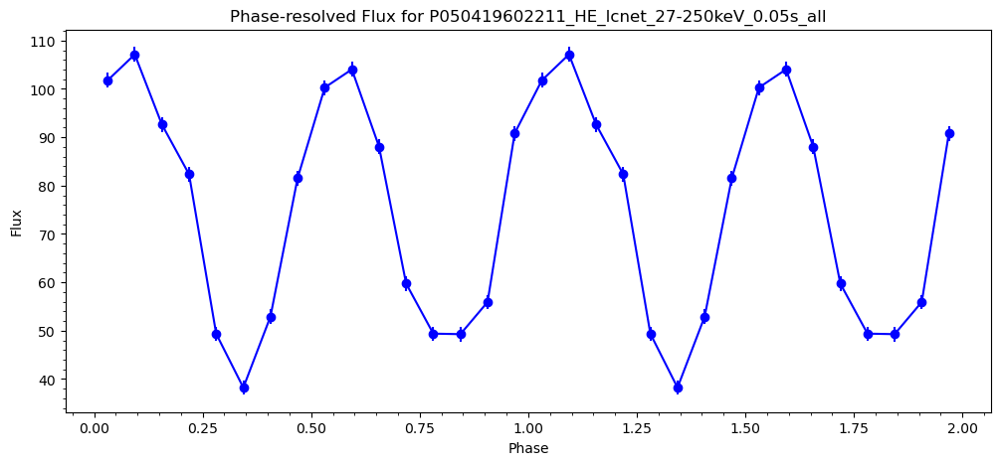

In [16]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_HE_manual.txt'  # Adjust the path as needed
main(input_file)

## TESTING ERROR OF RMS OF MA'AM AND MY ERROR UNCERTAINTY

In [ ]:
from astropy.io import fits
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from uncertainties import ufloat, unumpy

In [ ]:
hdu=fits.open('/home/supremekai/thesis/J0243_6p6124/hxmt/pulse_profiles/P050427900101_HE_lcnet_27-250keV_0.05s_all/P050427900101_HE_lcnet_27-250keV_0.05s_all_rms_deviation_flux_errors.fits')
hdu.info()

In [ ]:
hdu_new=fits.open('/home/supremekai/thesis/J0243_6p6124/hxmt/pulse_profiles/P050427900101_HE_lcnet_27-250keV_0.05s_all/P050427900101_HE_lcnet_27-250keV_0.05s_all_rms_deviation_flux_errors_uncertainty.fits')
hdu_new.info()

In [ ]:
hdu[1].header

In [ ]:
rms_data=hdu[1].data
rms_data_new=hdu_new[1].data
rms_data.columns

In [ ]:
plt.plot(rms_data['PHASE'], rms_data['RMS_ERROR'],'o')
plt.plot(rms_data_new['PHASE'], rms_data_new['RMS_ERROR'], 'o')
plt.xlabel('Phase')
plt.ylabel('RMS')
plt.title('RMS vs Phase')

In [ ]:
i=0
print(rms_data['RMS'][i],rms_data['RMS_ERROR'][i])
print(rms_data_new['RMS'][i],rms_data_new['RMS_ERROR'][i])

In [ ]:
rms_data_new['RMS'][0],rms_data_new['RMS_ERROR'][0]

In [ ]:
###########NEW WAY#################

def compute_phase_resolved_rms(phase_binned_flux, phase_binned_flux_error, total_N):
    rms_values = []
    rms_errors = []

    for bin_flux, bin_flux_error in zip(phase_binned_flux, phase_binned_flux_error):
        if len(bin_flux) > 0:
            # Create uncertainties array for flux and flux error
            flux_with_uncertainty = unumpy.uarray(bin_flux, bin_flux_error)
            
            # Compute mean flux with uncertainty
            mean_flux = unumpy.nominal_values(flux_with_uncertainty).mean()
            
            # Compute squared deviations and RMS with uncertainty
            squared_flux_deviation = (flux_with_uncertainty - mean_flux) ** 2
            rms_with_uncertainty = unumpy.sqrt(squared_flux_deviation.sum())
            print(rms_with_uncertainty)
            
            # Normalize RMS by sqrt(N), where N is total periods * 64
            rms_with_uncertainty /= np.sqrt(total_N)
            
            # Extract nominal value and standard deviation
            rms = unumpy.nominal_values(rms_with_uncertainty)
            rms_error = unumpy.std_devs(rms_with_uncertainty)

            # mean_flux = np.mean(bin_flux)
            # squared_flux_deviation = (bin_flux - mean_flux) ** 2
            # rms = np.sqrt(np.sum(squared_flux_deviation))
            
            # squared_error_deviation = (bin_flux_error ** 2)
            # # rms_error = np.sqrt(np.sum(squared_error_deviation)) / np.sqrt(len(bin_flux))
            
            # # Normalize RMS by sqrt(N), where N is total periods * 32
            # rms /= np.sqrt(total_N)
            # rms_error= np.sum(bin_flux_error*(bin_flux-mean_flux))/(rms*total_N*len(bin_flux))
            
            
        else:
            rms = 0
            rms_error = 0

        rms_values.append(rms)
        rms_errors.append(rms_error)

    return np.array(rms_values), np.array(rms_errors)


def main(input_file):
    # Load the text file data using pandas
    df = pd.read_csv(input_file, delimiter='\t',comment="#")
    df = df[df['Period'] != "-none-"]
    df['Period'] = df['Period'].astype(float)
    df['LC_File_Path'] = df['LC_File_Path'].astype(str)
    
    num_bins = 64  # Number of phase bins

    for index, row in df.iterrows():
        file_path = modify_path(row['LC_File_Path']) ##Updating path for wsl version from ubuntu version
        file_name = os.path.splitext(os.path.basename(file_path))[0]  # Remove .lc extension
        period = row['Period']
        try:
            time, flux, flux_error = read_light_curve(file_path)
            if len(time) == 0 or len(flux) == 0:
                print(f"No data found in file: {file_path}. Skipping this file.")
                continue  # Skip to the next iteration if the data is empty

            total_duration = time.max() - time.min()
            num_periods = total_duration / period
            total_N = int(num_periods * 64)  # Total bins considering 64 bins per period

            print(f"Processing file: {file_path}")
            print(f"First event time: {time.min()}")
            print(f"Last event time: {time.max()}")
            print(f"Total duration: {time.max() - time.min()} seconds")


            mean_flux_over_observation = np.mean(flux)  # Compute mean flux over the entire observation
   
            phases = compute_phases(time, period)
            phase_binned_flux, phase_binned_flux_error = bin_data_by_phase(phases, flux, flux_error, num_bins)
            rms_values, rms_errors = compute_phase_resolved_rms(phase_binned_flux, phase_binned_flux_error, total_N)
            mid_phase = (np.linspace(0, 1, num_bins + 1)[:-1] + np.linspace(0, 1, num_bins + 1)[1:]) / 2

            print(rms_values[0],rms_errors[0])
        
            # Compute RMS / Mean Flux
            rms_over_mean_flux = rms_values / mean_flux_over_observation
            rms_error_over_mean_flux = rms_errors / mean_flux_over_observation
        
            # Compute Phase-Resolved Flux Values
            # Prepare data for plotting flux 2 cycles
            avg_flux = [np.mean(bin_flux) if len(bin_flux) > 0 else 0 for bin_flux in phase_binned_flux]
            avg_flux_2x = np.concatenate((avg_flux, avg_flux))
            avg_flux_error = [np.sqrt(np.sum(bin_flux_error**2)) / len(bin_flux_error) if len(bin_flux_error) > 0 else 0 for bin_flux_error in phase_binned_flux_error]
            avg_flux_error_2x = np.concatenate((avg_flux_error, avg_flux_error))


            # Prepare data for plotting rms 2 cycles
            mid_phase_2x = (np.linspace(0, 2, num_bins * 2 + 1)[:-1] + np.linspace(0, 2, num_bins * 2 + 1)[1:]) / 2
            rms_values_2x = np.concatenate((rms_values, rms_values))
            rms_errors_2x = np.concatenate((rms_errors, rms_errors))

            # Step 6: Plot the phase-resolved RMS
            plt.figure(figsize=(12, 5))
            plt.errorbar(mid_phase_2x, rms_values_2x, yerr=rms_errors_2x, fmt='-o')
            plt.xlabel('Phase')
            plt.ylabel('RMS')
            plt.title(f'Phase-resolved RMS for {file_name}')
            plt.grid()
            os.makedirs(f'./pulse_profiles/{file_name}/', exist_ok=True)
            plt.savefig(f'./pulse_profiles/{file_name}/{file_name}_rms_curve_uncertainty.png')
            plt.show()

            # Step 7: Save the results to a FITS file
            col1 = fits.Column(name='PHASE', format='E', array=mid_phase)
            col2 = fits.Column(name='RMS', format='E', array=rms_values)
            col3 = fits.Column(name='RMS_ERROR', format='E', array=rms_errors)
            col4 = fits.Column(name='RMS_OVER_MEAN_FLUX', format='E', array=rms_over_mean_flux)
            col5 = fits.Column(name='RMS_ERROR_OVER_MEAN_FLUX', format='E', array=rms_error_over_mean_flux)
            col6 = fits.Column(name='AVG_FLUX', format='E', array=avg_flux)
            col7 = fits.Column(name='AVG_FLUX_ERROR', format='E', array=avg_flux_error)
            hdu = fits.BinTableHDU.from_columns([col1, col2, col3, col4, col5, col6, col7])
            hdu.writeto(f'./pulse_profiles/{file_name}/{file_name}_rms_deviation_flux_errors_uncertainty.fits', overwrite=True)

            # Plot the phase-resolved flux
            plt.figure(figsize=(12, 5))
            plt.errorbar(mid_phase_2x, avg_flux_2x, yerr=avg_flux_error_2x, fmt='-o')
            plt.xlabel('Phase')
            plt.ylabel('Flux')
            plt.grid()
            plt.title(f'Phase-resolved Flux for {file_name}')
            plt.savefig(f'./pulse_profiles/{file_name}/{file_name}_pulse_profile_uncertainty.png')
            plt.show()


            
        except Exception as e:
            print(f"An error occurred while processing {file_path}: {e}")


In [ ]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_HE_manual.txt'  # Adjust the path as needed
main(input_file)

In [ ]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_ME_manual.txt'  # Adjust the path as needed
main(input_file)

(1.05+/-0.04)e+03
(1.07+/-0.04)e+03
(1.05+/-0.04)e+03
(1.07+/-0.04)e+03
(1.06+/-0.04)e+03
(1.05+/-0.04)e+03
(1.05+/-0.04)e+03
(1.07+/-0.04)e+03
976+/-34
(1.03+/-0.04)e+03
(1.09+/-0.04)e+03
(1.07+/-0.04)e+03
(1.09+/-0.04)e+03
(1.08+/-0.04)e+03
(1.10+/-0.04)e+03
(1.02+/-0.04)e+03
(1.05+/-0.04)e+03
(1.03+/-0.04)e+03
(1.02+/-0.04)e+03
(1.01+/-0.04)e+03
(1.01+/-0.04)e+03
992+/-35
997+/-34
(1.06+/-0.04)e+03
(1.13+/-0.04)e+03
(1.11+/-0.04)e+03
(1.11+/-0.04)e+03
(1.14+/-0.04)e+03
(1.11+/-0.04)e+03
(1.01+/-0.04)e+03
(1.02+/-0.04)e+03
(1.02+/-0.04)e+03
4.658879370289577 0.1643439833954265


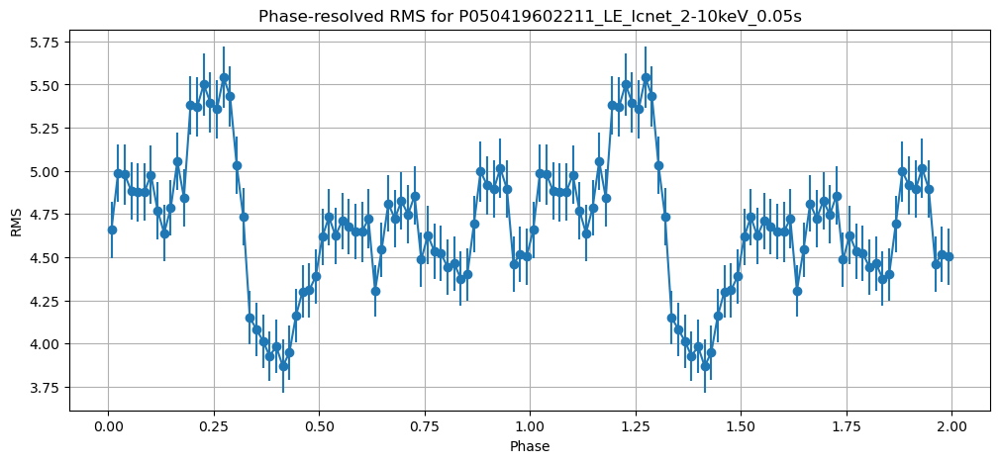

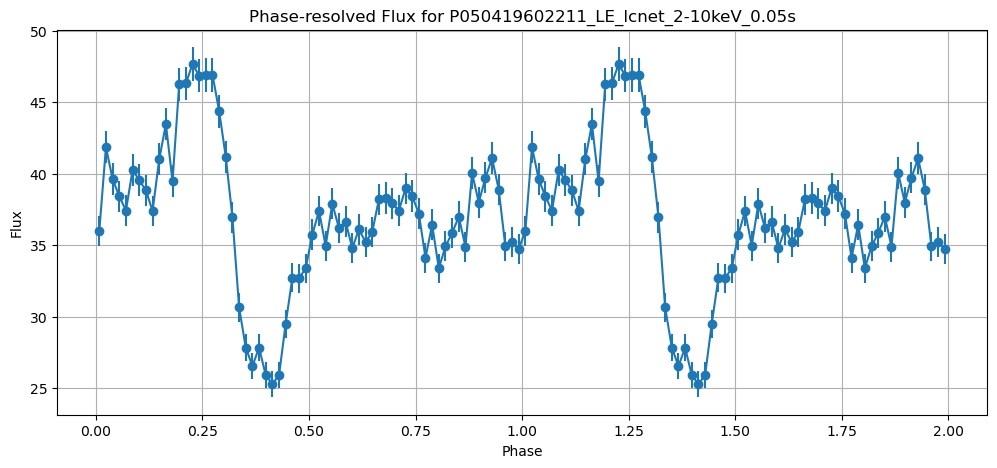

In [109]:
# Run the main function with your input file
input_file = 'final_all_hxmt_lc_periods_chisq_LE_manual.txt'  # Adjust the path as needed
main(input_file)